In [1]:
import pandas as pd
import torch
from torch.nn.modules.activation import ReLU
from torch.utils.data.dataset import T
import torchvision
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
from torchvision import transforms
from confusionMatrix import *
from sklearn.metrics import roc_curve, auc, f1_score, precision_recall_curve, average_precision_score
from scipy import interp
from itertools import cycle
# from logistic import *
from matplotlib import pyplot as plt
#新增加的两行
import matplotlib

from collections import OrderedDict
import os
from torchvision import models


import cv2
from torch.autograd import Variable
from torch.nn import functional as F
import cam

In [2]:
import zipfile

f = zipfile.ZipFile("./Data.zip",'r') # 原压缩文件在服务器的位置
for file in f.namelist():
    f.extract(file,"./")               # 解压到的位置
f.close()


In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# 数据++  resnet有无迁移学习   transformer   总结cnnlei

# transform = torchvision.transforms.Compose([
#         transforms.RandomRotation(10),
#         transforms.GaussianBlur(kernel_size=(5,5),sigma=(0.1, 3.0)),
#         transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
#         torchvision.transforms.RandomAdjustSharpness(sharpness_factor=2),
#         transforms.Resize((224, 224)),
#         transforms.ToTensor(),
#         transforms.Normalize(mean=[0.485, 0.456, 0.406], std= [0.229, 0.224, 0.225])

#     ])  
train_transform = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

valid_transform=transforms.Compose([
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

test_transform=transforms.Compose([
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])


In [4]:
train_set =torchvision.datasets.ImageFolder(root='Data/train',transform=train_transform)
train_dataloader =DataLoader(train_set,batch_size=4, shuffle=True,num_workers=0)#Batch Size定义：一次训练所选取的样本数。 Batch Size的大小影响模型的优化程度和速度。

#validation_set =torchvision.datasets.ImageFolder(root='Data/test',transform=valid_transform)
#validation_dataloader =DataLoader(validation_set,batch_size=4, shuffle=True,num_workers=0)
#test_set =torchvision.datasets.ImageFolder(root='Data/valid',transform=test_transform)
#test_dataloader =DataLoader(test_set,batch_size=4, shuffle=True,num_workers=0)                         

validation_set =torchvision.datasets.ImageFolder(root='Data/valid',transform=valid_transform)
validation_dataloader =DataLoader(validation_set,batch_size=4, shuffle=True,num_workers=0)
test_set =torchvision.datasets.ImageFolder(root='Data/test',transform=test_transform)
test_dataloader =DataLoader(test_set,batch_size=4, shuffle=True,num_workers=0)                         


train_data_size = len(train_set)
test_data_size = len(test_set)
print("训练集长度: {}".format(train_data_size))
print("测试集长度: {}".format(test_data_size ))

训练集长度: 613
测试集长度: 315


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

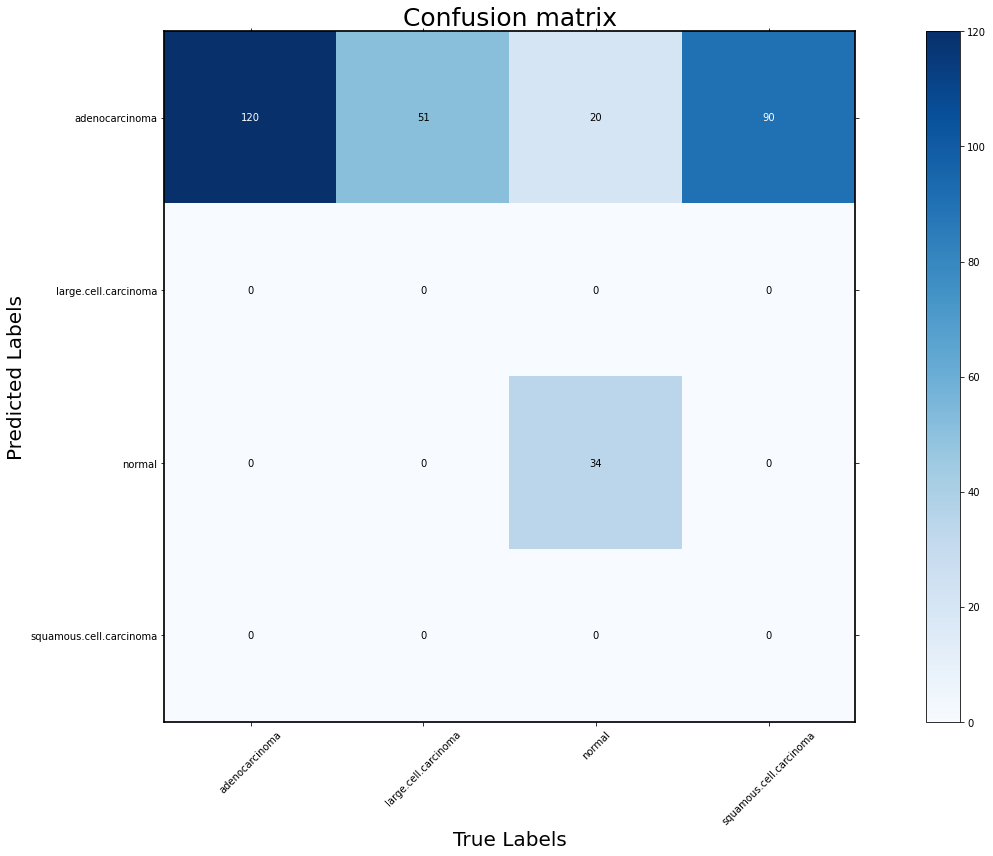

the model accuracy is  0.489
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.427   |  1.0   |    0.174    |  0.598   |
|   large.cell.carcinoma  |    0.0    |  0.0   |     1.0     |   nan    |
|          normal         |    1.0    |  0.63  |     1.0     |  0.773   |
| squamous.cell.carcinoma |    0.0    |  0.0   |     1.0     |   nan    |
+-------------------------+-----------+--------+-------------+----------+


/root/VGGTest/confusionMatrix.py:54: RuntimeWarning: invalid value encountered in double_scalars
  F1_score=round((2*Precision*Recall)/(Precision+Recall),3)


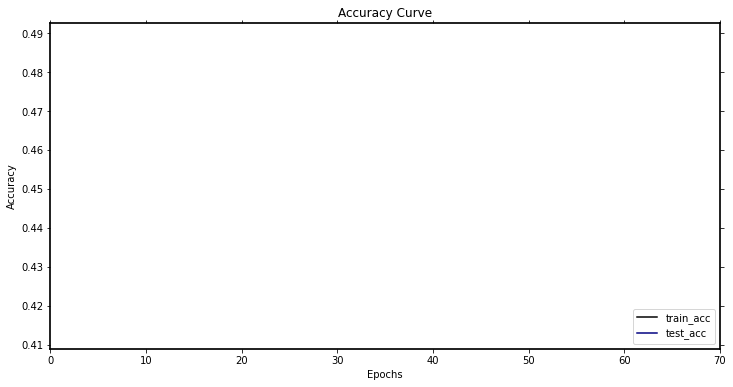

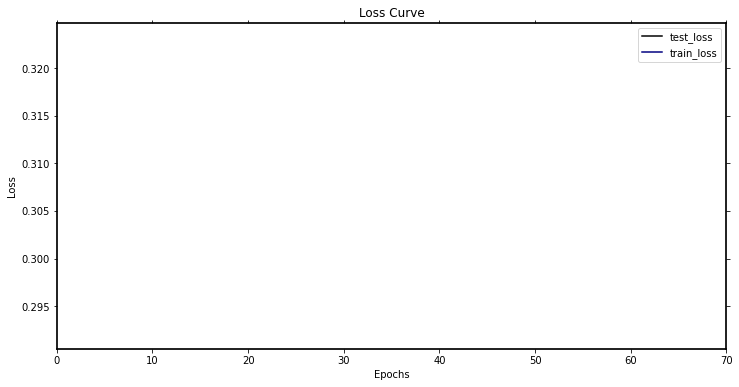

-----------第2轮训练开始-----------
训练次数：308, 训练集正确率: 0.5154975530179445, Loss：172.09601271152496
第 2 轮测试集上的toal_Loss: 81.80810463428497, 正确率： 0.4603174603174603
Top-1准确率为:{} 0.4888888888888889
[[  2.   4.   0.   1.]
 [  0.   0.   0.   0.]
 [  0.   0.  54.   0.]
 [118.  47.   0.  89.]]


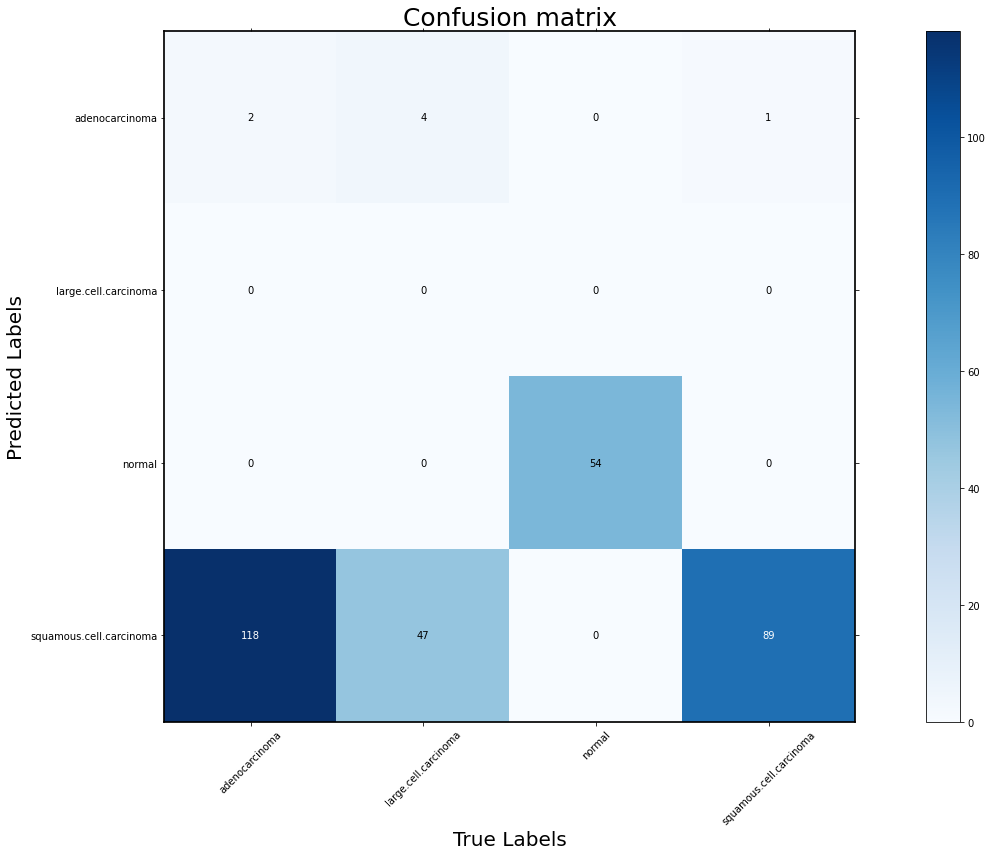

the model accuracy is  0.46
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.286   | 0.017  |    0.974    |  0.032   |
|   large.cell.carcinoma  |    0.0    |  0.0   |     1.0     |   nan    |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |    0.35   | 0.989  |    0.267    |  0.517   |
+-------------------------+-----------+--------+-------------+----------+


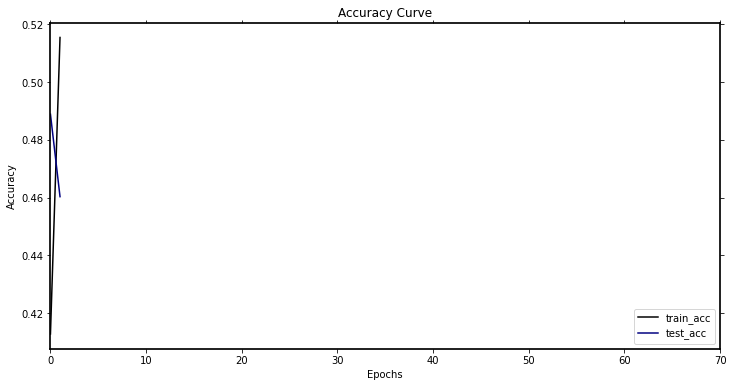

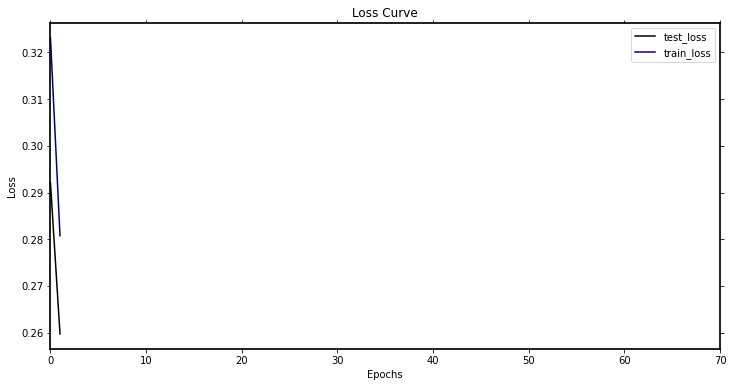

-----------第3轮训练开始-----------
训练次数：462, 训练集正确率: 0.5252854812398042, Loss：163.7584452033043
第 3 轮测试集上的toal_Loss: 73.33456647396088, 正确率： 0.638095238095238
Top-1准确率为:{} 0.638095238095238
[[95. 31.  0. 37.]
 [ 3.  2.  0.  3.]
 [ 0.  0. 54.  0.]
 [22. 18.  0. 50.]]


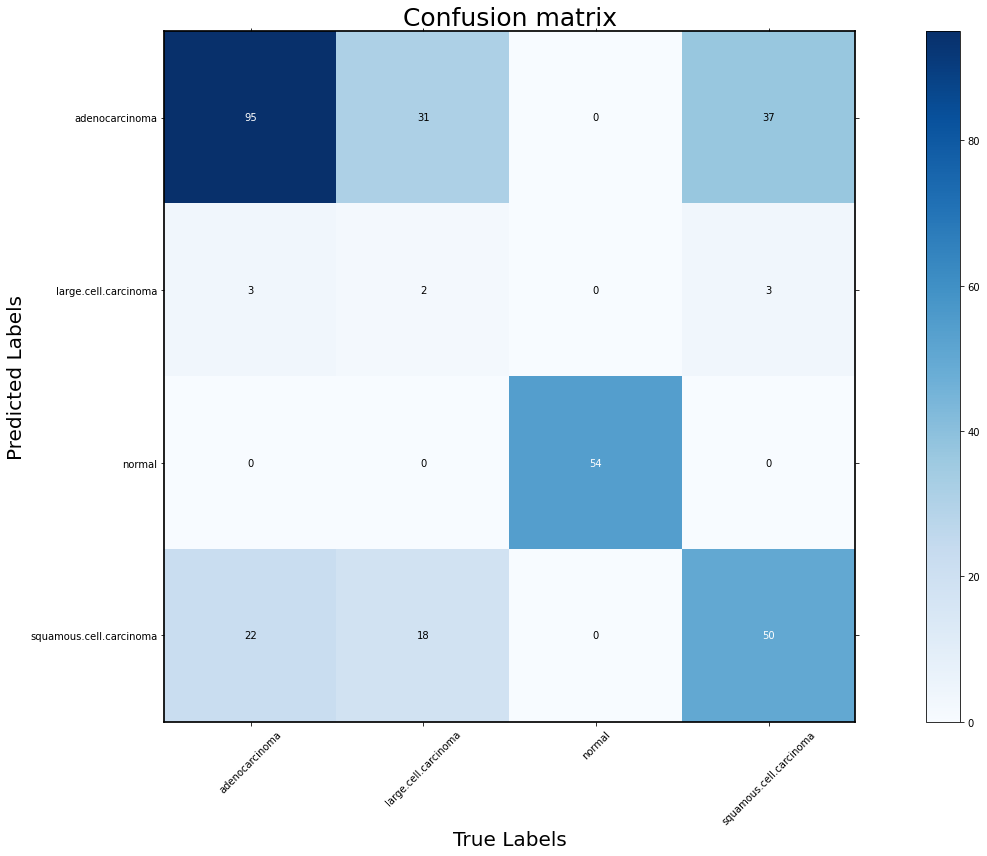

the model accuracy is  0.638
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.583   | 0.792  |    0.651    |  0.672   |
|   large.cell.carcinoma  |    0.25   | 0.039  |    0.977    |  0.067   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.556   | 0.556  |    0.822    |  0.556   |
+-------------------------+-----------+--------+-------------+----------+


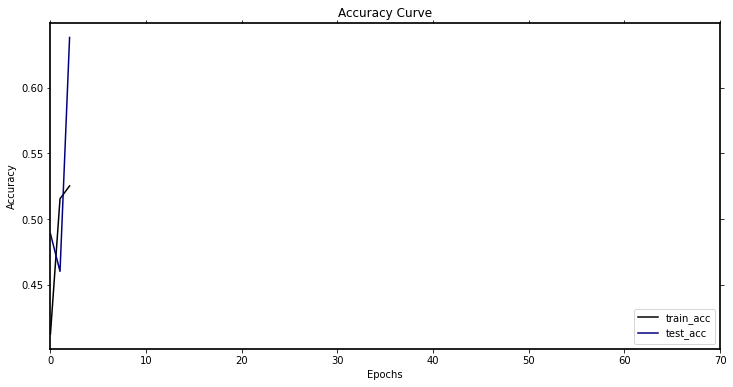

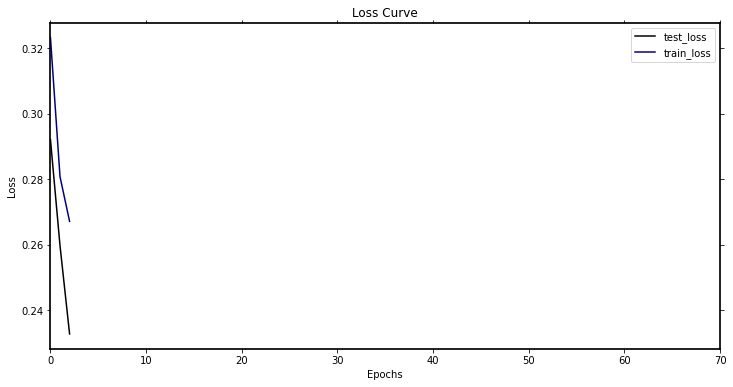

-----------第4轮训练开始-----------
训练次数：616, 训练集正确率: 0.566068515497553, Loss：151.6057027876377
第 4 轮测试集上的toal_Loss: 71.46999362111092, 正确率： 0.5968253968253968
Top-1准确率为:{} 0.638095238095238
[[75. 14.  0. 33.]
 [28. 27.  0. 25.]
 [ 0.  0. 54.  0.]
 [17. 10.  0. 32.]]


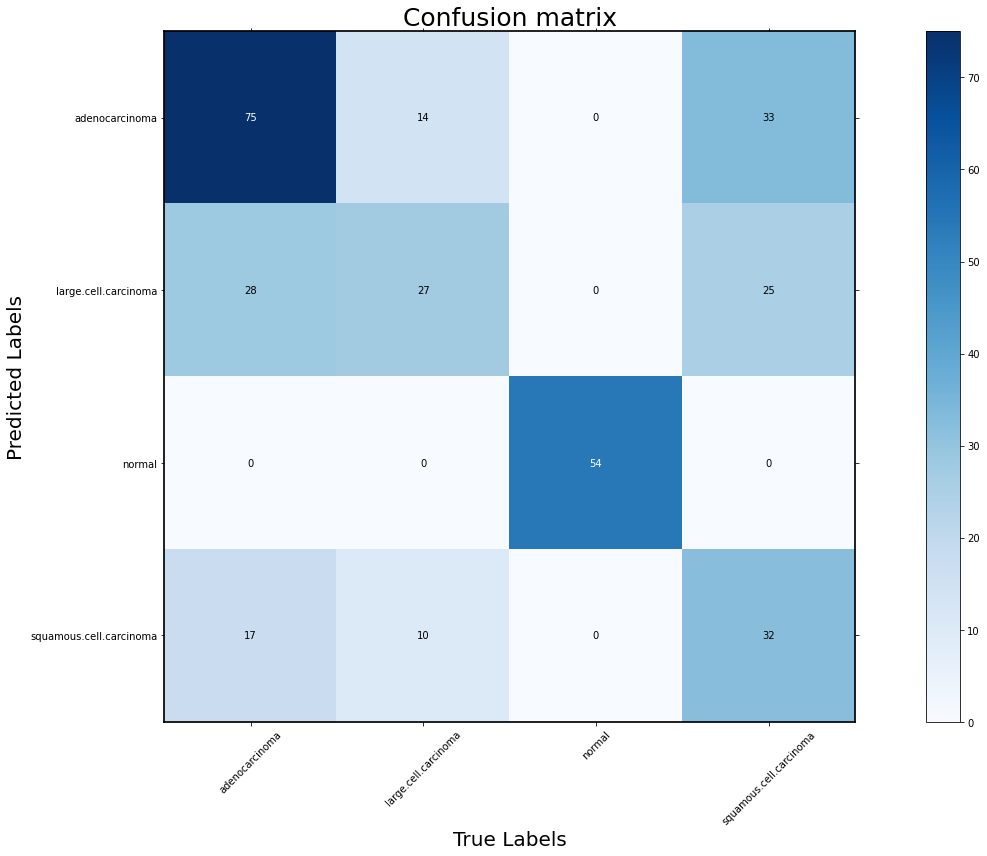

the model accuracy is  0.597
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.615   | 0.625  |    0.759    |   0.62   |
|   large.cell.carcinoma  |   0.338   | 0.529  |    0.799    |  0.412   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.542   | 0.356  |     0.88    |   0.43   |
+-------------------------+-----------+--------+-------------+----------+


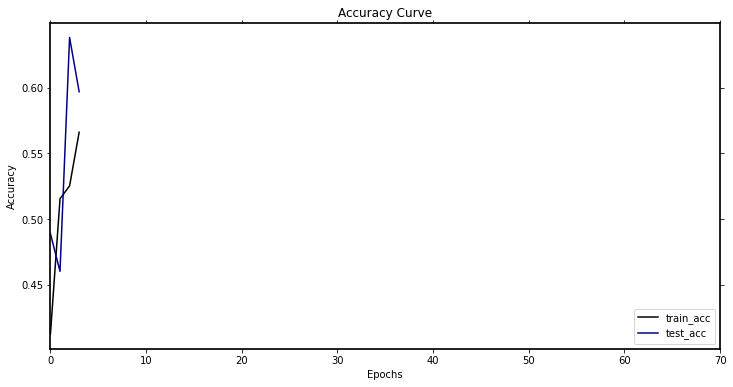

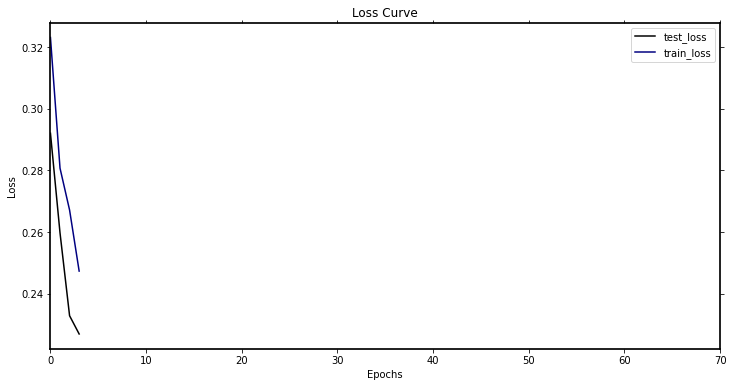

-----------第5轮训练开始-----------
训练次数：770, 训练集正确率: 0.5693311582381729, Loss：153.8140530884266
第 5 轮测试集上的toal_Loss: 70.60403722524643, 正确率： 0.5238095238095238
Top-1准确率为:{} 0.638095238095238
[[35. 17.  0. 14.]
 [ 3.  1.  0.  1.]
 [ 0.  0. 54.  0.]
 [82. 33.  0. 75.]]


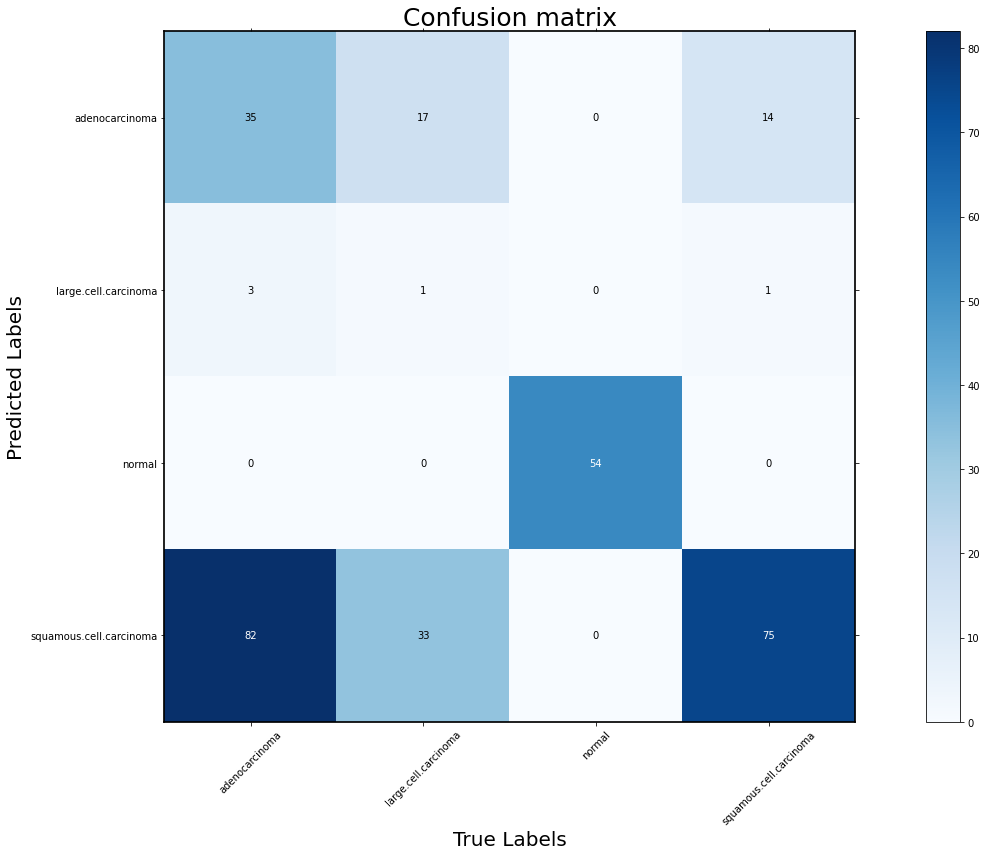

the model accuracy is  0.524
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.53   | 0.292  |    0.841    |  0.377   |
|   large.cell.carcinoma  |    0.2    |  0.02  |    0.985    |  0.036   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.395   | 0.833  |    0.489    |  0.536   |
+-------------------------+-----------+--------+-------------+----------+


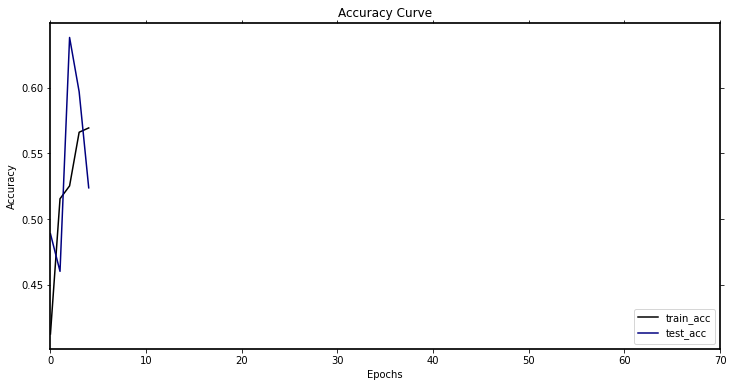

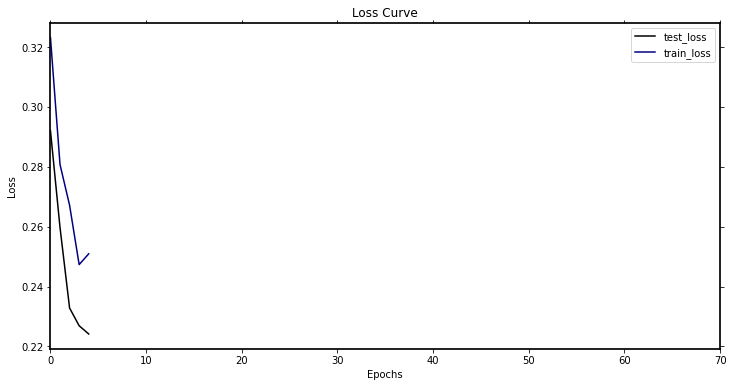

-----------第6轮训练开始-----------
训练次数：924, 训练集正确率: 0.5791190864600326, Loss：148.77306181192398
第 6 轮测试集上的toal_Loss: 66.80179560184479, 正确率： 0.6317460317460317
Top-1准确率为:{} 0.638095238095238
[[74. 24.  0. 19.]
 [ 0.  0.  0.  0.]
 [ 0.  0. 54.  0.]
 [46. 27.  0. 71.]]


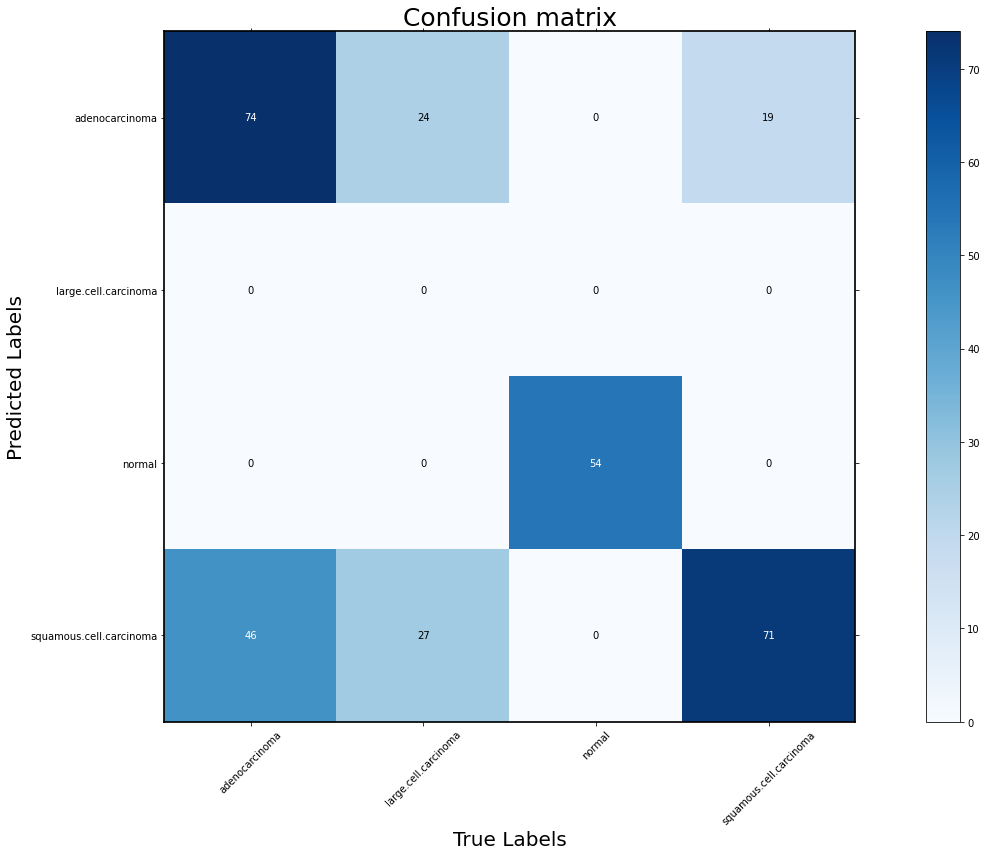

the model accuracy is  0.632
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.632   | 0.617  |    0.779    |  0.624   |
|   large.cell.carcinoma  |    0.0    |  0.0   |     1.0     |   nan    |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.493   | 0.789  |    0.676    |  0.607   |
+-------------------------+-----------+--------+-------------+----------+


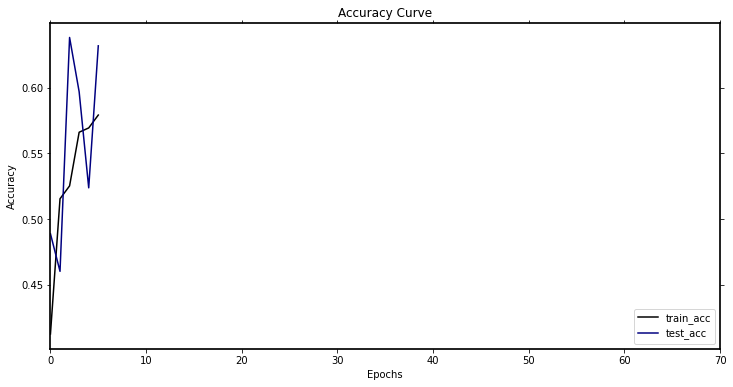

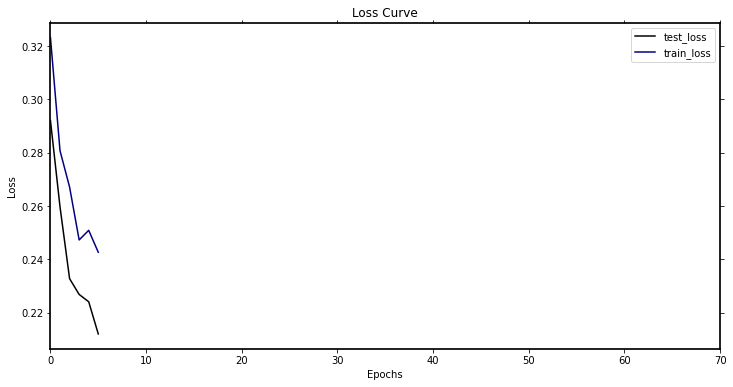

-----------第7轮训练开始-----------
训练次数：1078, 训练集正确率: 0.6101141924959217, Loss：140.63065260648727
第 7 轮测试集上的toal_Loss: 64.9756863117218, 正确率： 0.6412698412698413
Top-1准确率为:{} 0.6412698412698413
[[108.  37.   0.  52.]
 [  0.   3.   0.   1.]
 [  0.   0.  54.   0.]
 [ 12.  11.   0.  37.]]


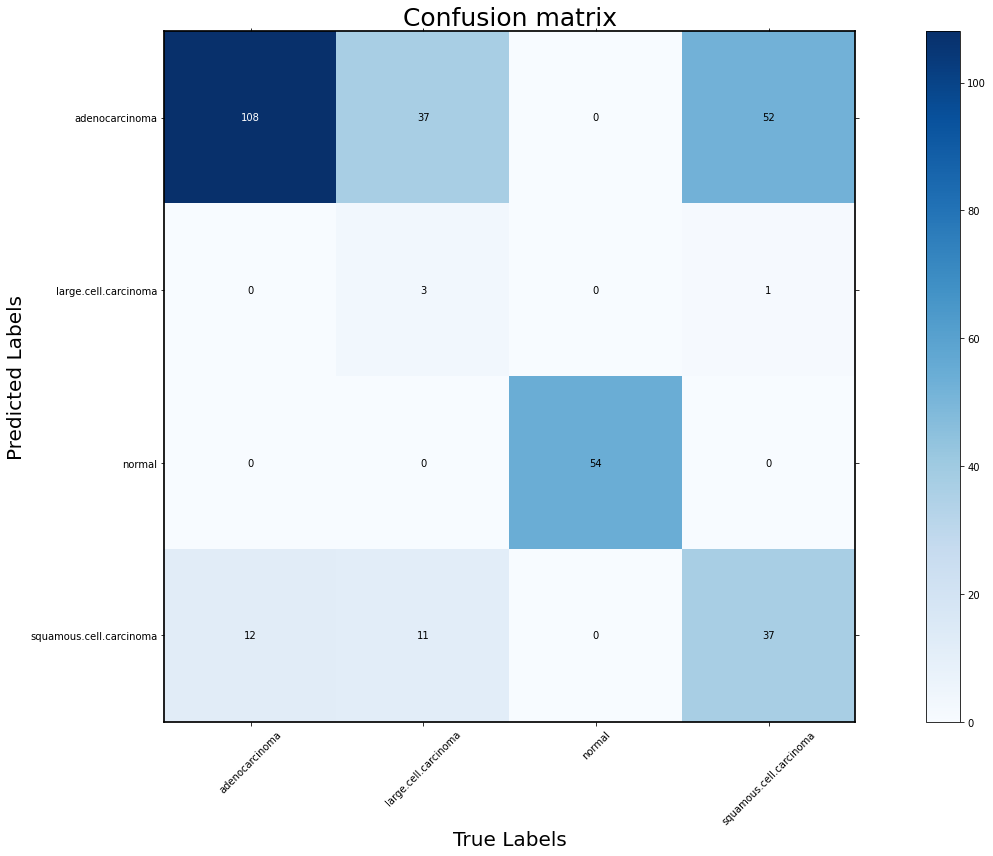

the model accuracy is  0.641
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.548   |  0.9   |    0.544    |  0.681   |
|   large.cell.carcinoma  |    0.75   | 0.059  |    0.996    |  0.109   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.617   | 0.411  |    0.898    |  0.493   |
+-------------------------+-----------+--------+-------------+----------+


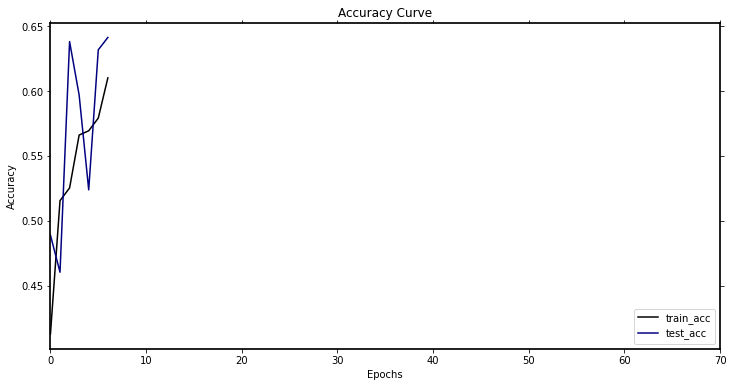

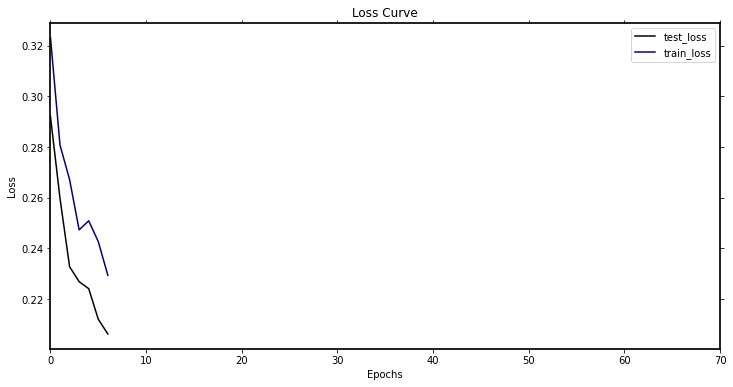

-----------第8轮训练开始-----------
训练次数：1232, 训练集正确率: 0.634584013050571, Loss：131.43835934996605
第 8 轮测试集上的toal_Loss: 62.27773454785347, 正确率： 0.6698412698412698
Top-1准确率为:{} 0.6698412698412698
[[102.  26.   0.  44.]
 [  9.  15.   0.   6.]
 [  0.   0.  54.   0.]
 [  9.  10.   0.  40.]]


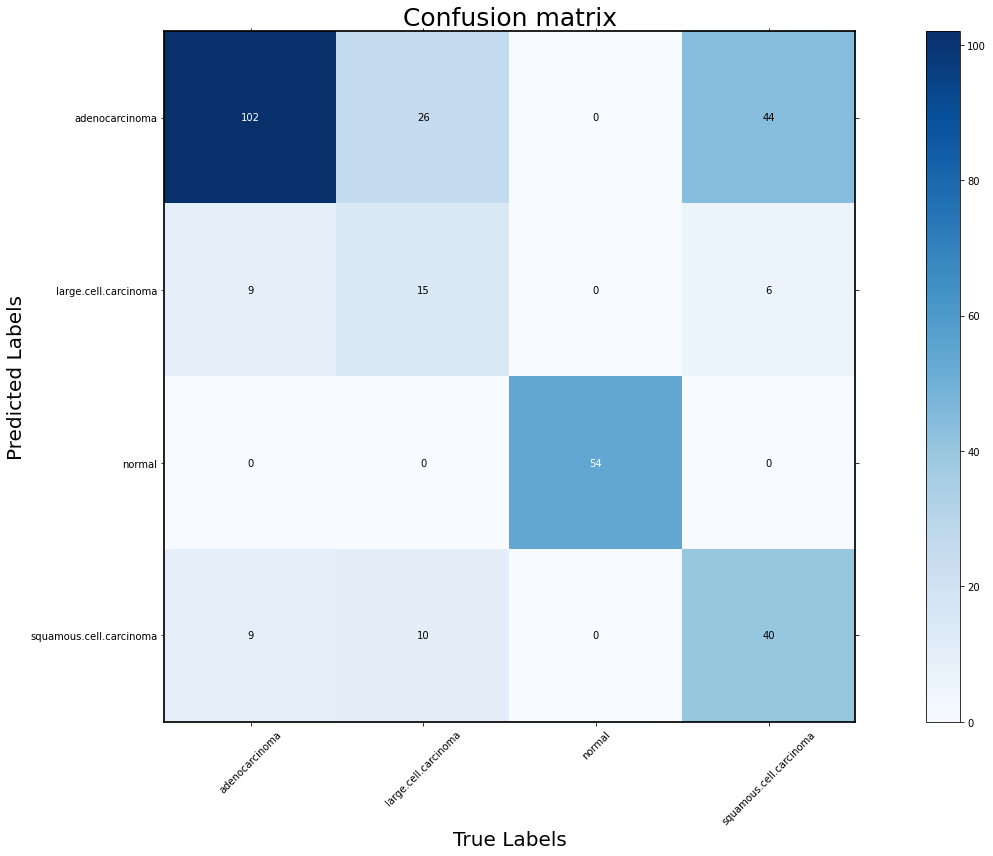

the model accuracy is  0.67
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.593   |  0.85  |    0.641    |  0.699   |
|   large.cell.carcinoma  |    0.5    | 0.294  |    0.943    |   0.37   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.678   | 0.444  |    0.916    |  0.537   |
+-------------------------+-----------+--------+-------------+----------+


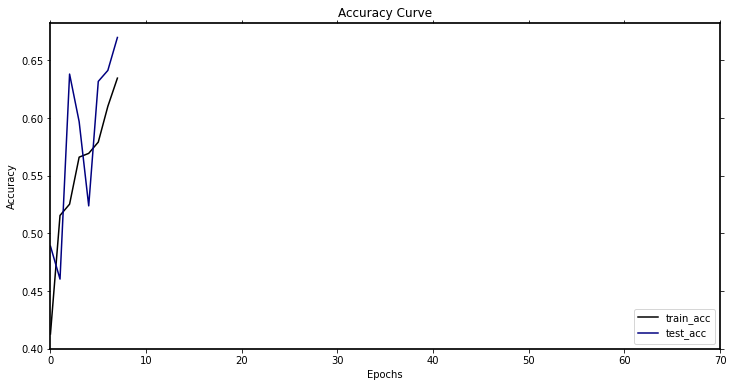

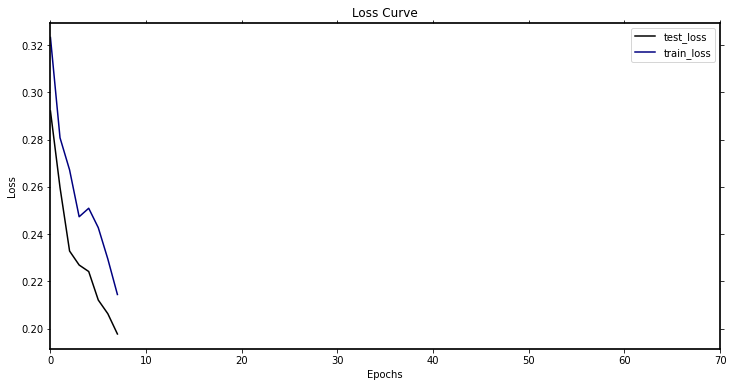

-----------第9轮训练开始-----------
训练次数：1386, 训练集正确率: 0.6280587275693311, Loss：133.373161226511
第 9 轮测试集上的toal_Loss: 62.955747440457344, 正确率： 0.6793650793650794
Top-1准确率为:{} 0.6793650793650794
[[98. 28.  0. 34.]
 [ 3. 10.  0.  3.]
 [ 3.  0. 54.  1.]
 [16. 13.  0. 52.]]


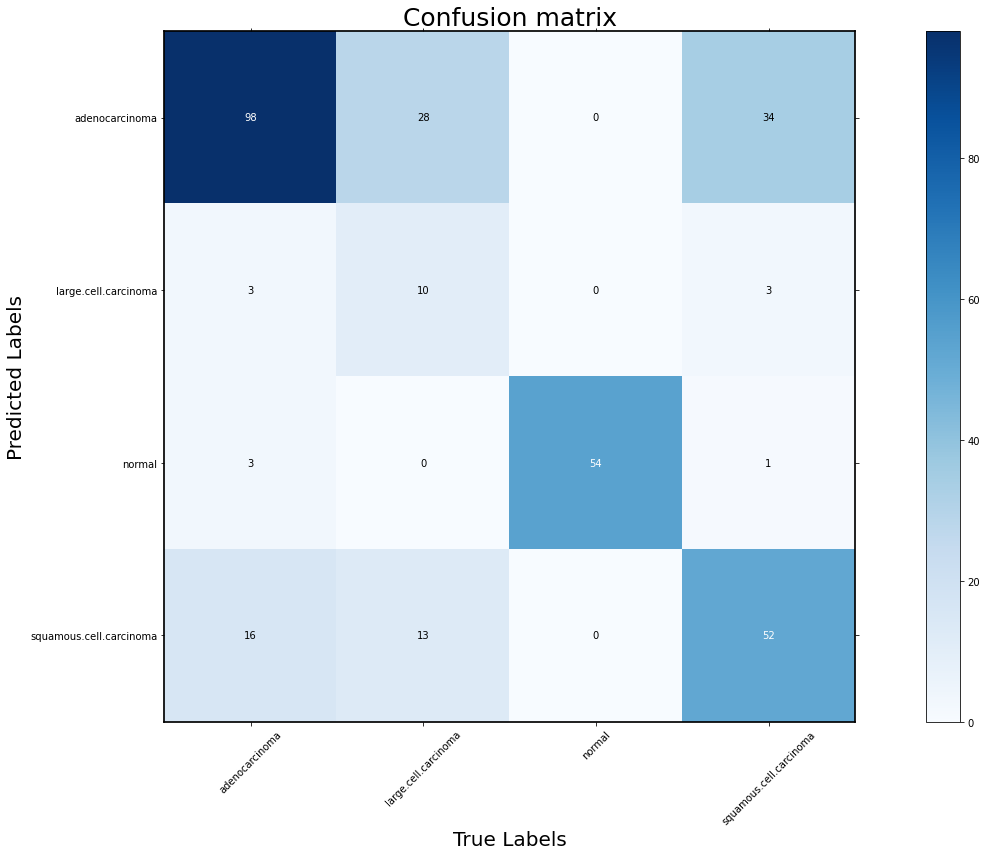

the model accuracy is  0.679
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.612   | 0.817  |    0.682    |   0.7    |
|   large.cell.carcinoma  |   0.625   | 0.196  |    0.977    |  0.298   |
|          normal         |   0.931   |  1.0   |    0.985    |  0.964   |
| squamous.cell.carcinoma |   0.642   | 0.578  |    0.871    |  0.608   |
+-------------------------+-----------+--------+-------------+----------+


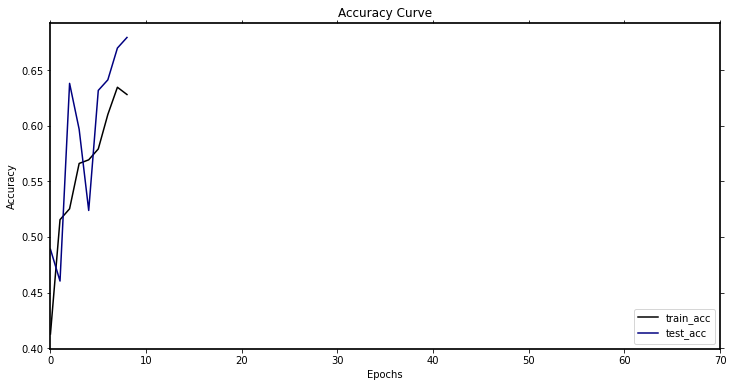

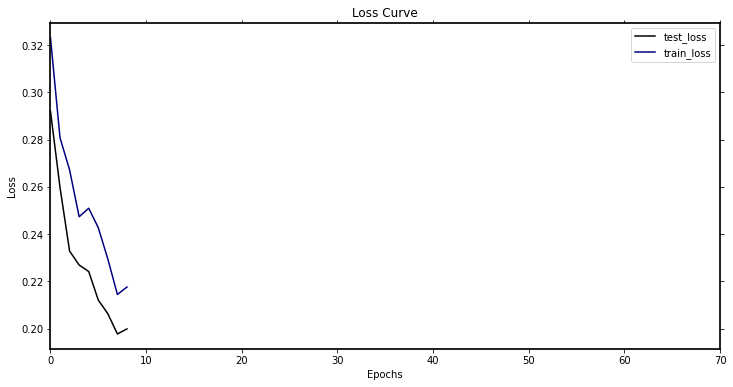

-----------第10轮训练开始-----------
训练次数：1540, 训练集正确率: 0.6574225122349103, Loss：123.21077790856361
第 10 轮测试集上的toal_Loss: 57.539015009999275, 正确率： 0.6793650793650794
Top-1准确率为:{} 0.6793650793650794
[[101.  30.   0.  40.]
 [  8.  14.   0.   5.]
 [  0.   0.  54.   0.]
 [ 11.   7.   0.  45.]]


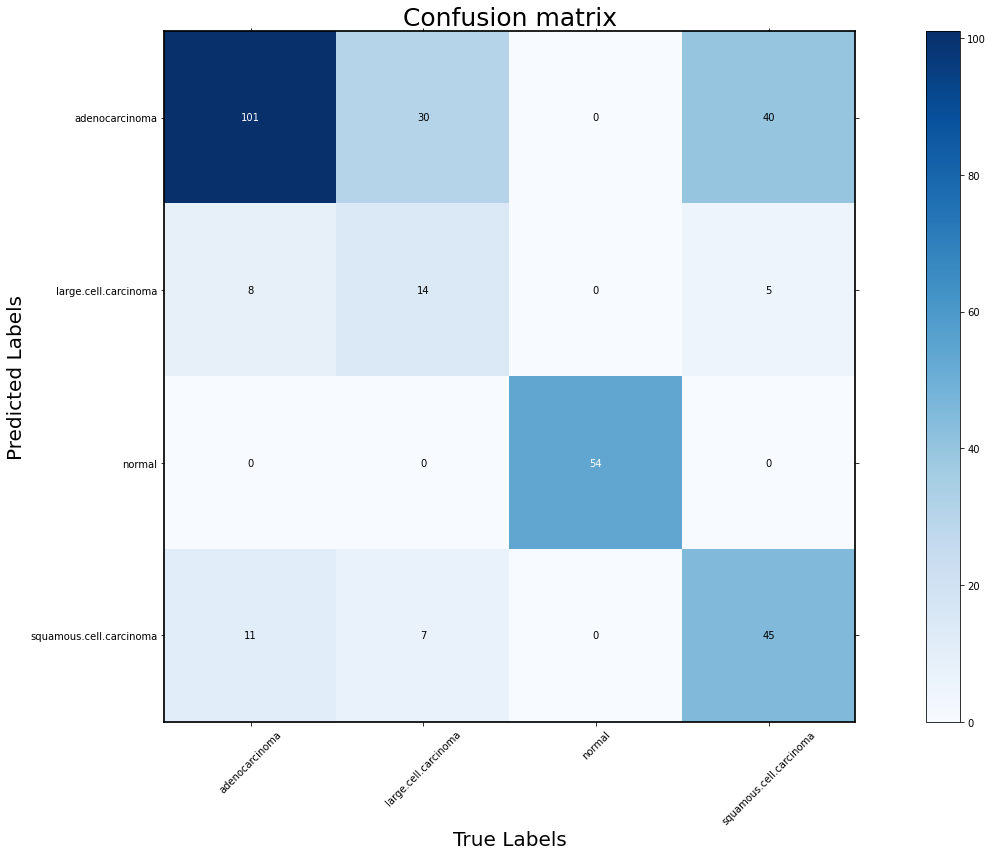

the model accuracy is  0.679
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.591   | 0.842  |    0.641    |  0.695   |
|   large.cell.carcinoma  |   0.519   | 0.275  |    0.951    |   0.36   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.714   |  0.5   |     0.92    |  0.588   |
+-------------------------+-----------+--------+-------------+----------+


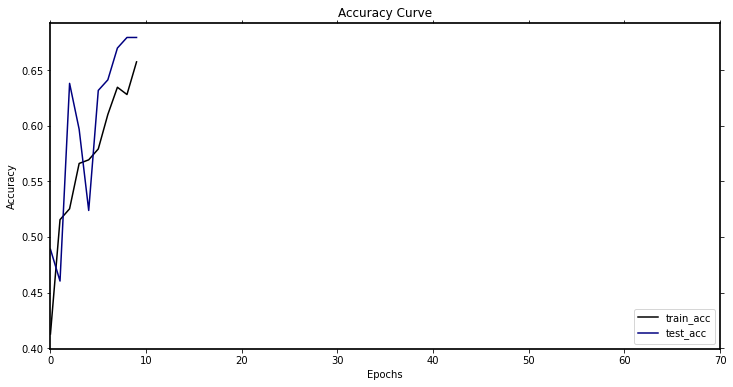

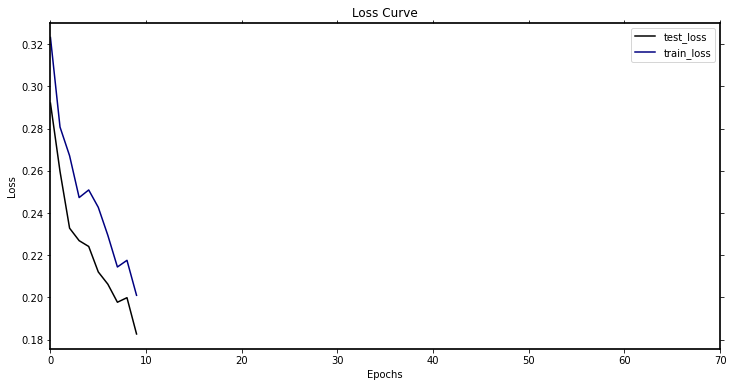

-----------第11轮训练开始-----------
训练次数：1694, 训练集正确率: 0.6476345840130505, Loss：123.98745954036713
第 11 轮测试集上的toal_Loss: 60.97646905481815, 正确率： 0.6634920634920635
Top-1准确率为:{} 0.6793650793650794
[[49.  7.  0.  9.]
 [ 8. 27.  0.  2.]
 [ 0.  0. 54.  0.]
 [63. 17.  0. 79.]]


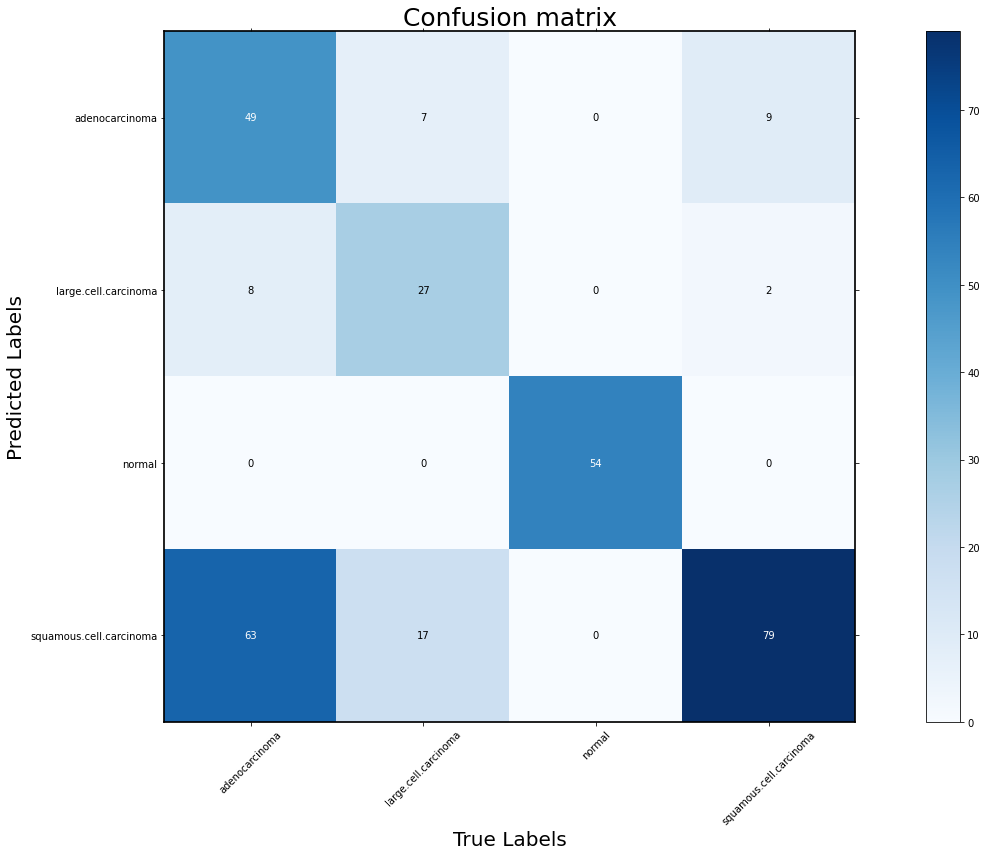

the model accuracy is  0.663
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.754   | 0.408  |    0.918    |  0.529   |
|   large.cell.carcinoma  |    0.73   | 0.529  |    0.962    |  0.613   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.497   | 0.878  |    0.644    |  0.635   |
+-------------------------+-----------+--------+-------------+----------+


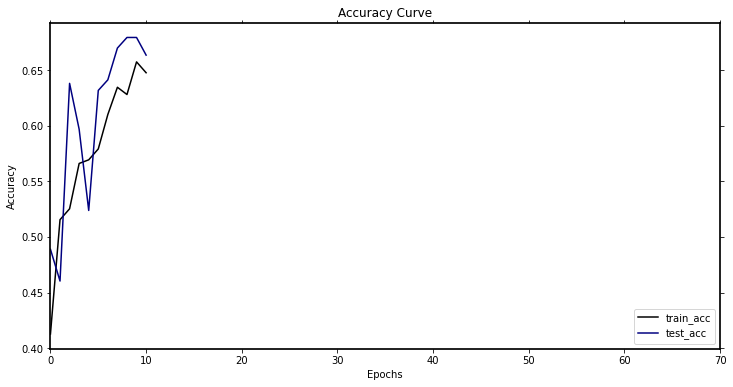

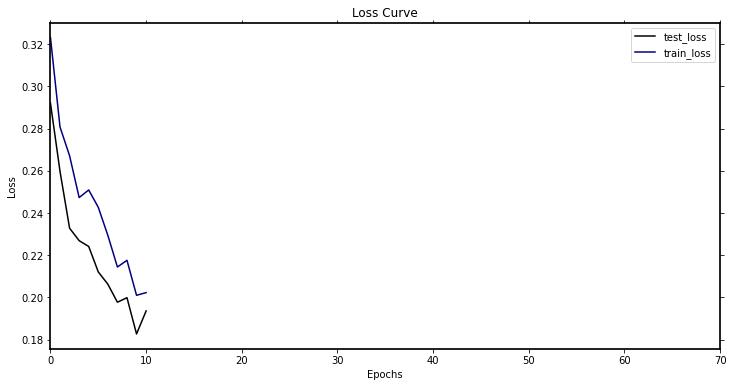

-----------第12轮训练开始-----------
训练次数：1848, 训练集正确率: 0.6851549755301795, Loss：116.39406725764275
第 12 轮测试集上的toal_Loss: 53.83171246945858, 正确率： 0.746031746031746
Top-1准确率为:{} 0.746031746031746
[[92. 11.  1. 27.]
 [13. 35.  0.  8.]
 [ 0.  0. 53.  0.]
 [15.  5.  0. 55.]]


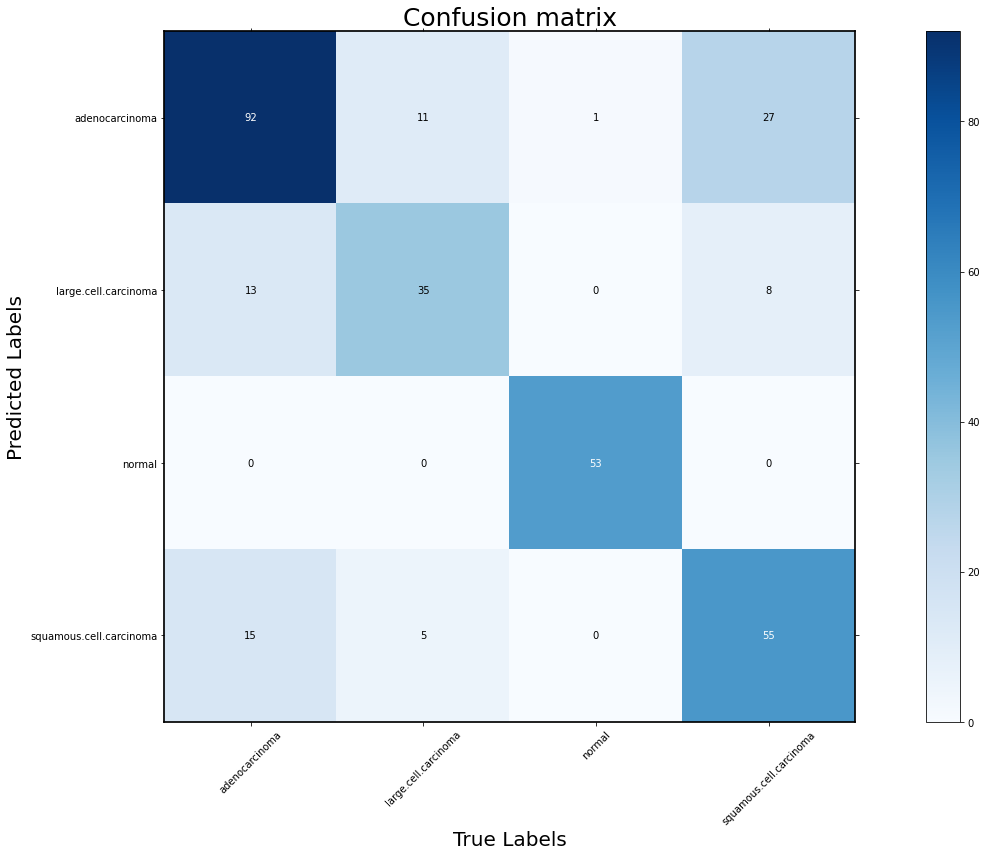

the model accuracy is  0.746
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.702   | 0.767  |     0.8     |  0.733   |
|   large.cell.carcinoma  |   0.625   | 0.686  |     0.92    |  0.654   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.733   | 0.611  |    0.911    |  0.666   |
+-------------------------+-----------+--------+-------------+----------+


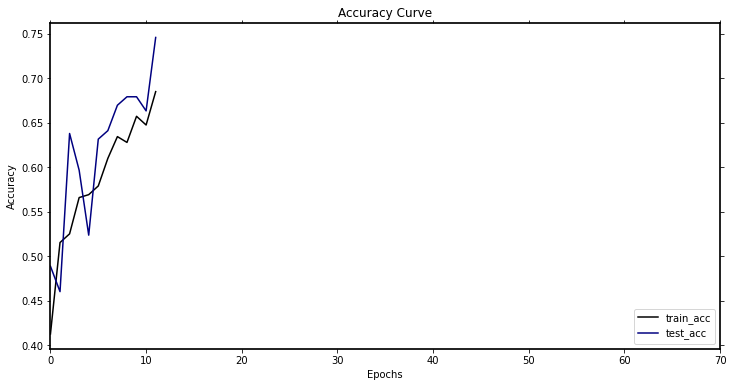

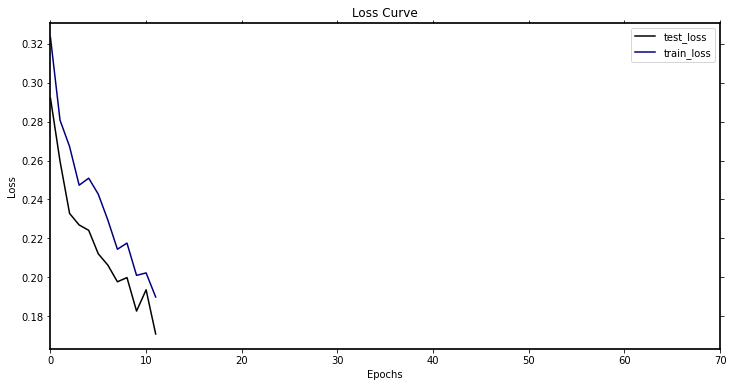

-----------第13轮训练开始-----------
训练次数：2002, 训练集正确率: 0.7389885807504079, Loss：106.46784268319607
第 13 轮测试集上的toal_Loss: 49.04642740637064, 正确率： 0.7365079365079366
Top-1准确率为:{} 0.746031746031746
[[101.  27.   0.  32.]
 [  6.  20.   0.   1.]
 [  0.   0.  54.   0.]
 [ 13.   4.   0.  57.]]


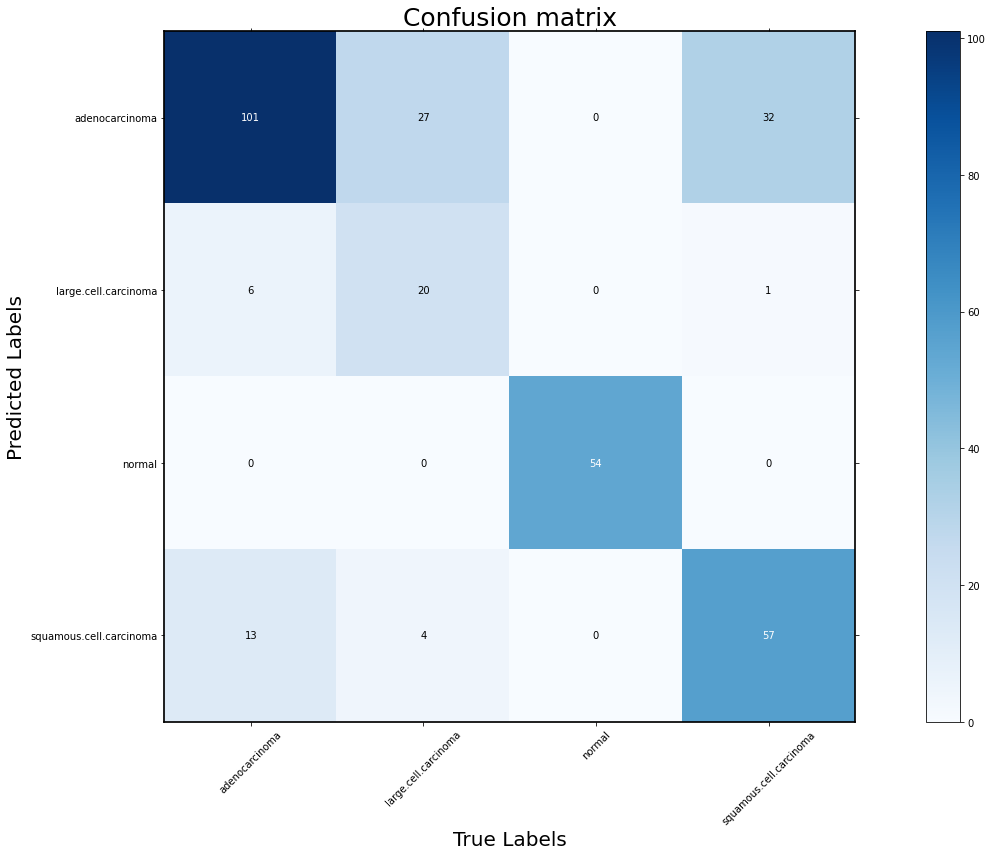

the model accuracy is  0.737
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.631   | 0.842  |    0.697    |  0.721   |
|   large.cell.carcinoma  |   0.741   | 0.392  |    0.973    |  0.513   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |    0.77   | 0.633  |    0.924    |  0.695   |
+-------------------------+-----------+--------+-------------+----------+


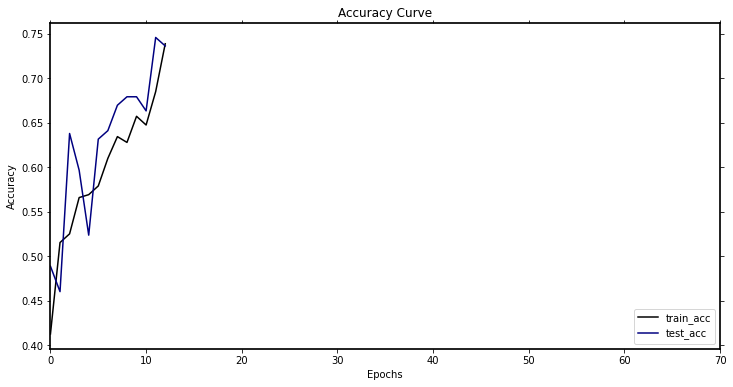

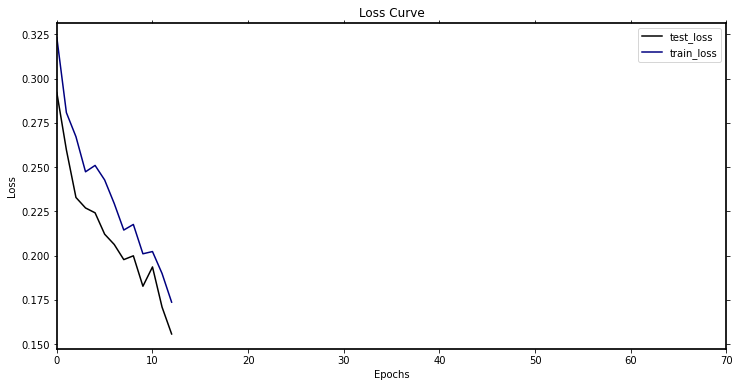

-----------第14轮训练开始-----------
训练次数：2156, 训练集正确率: 0.7096247960848288, Loss：114.40958143770695
第 14 轮测试集上的toal_Loss: 51.204997792840004, 正确率： 0.7365079365079366
Top-1准确率为:{} 0.746031746031746
[[72.  5.  0. 16.]
 [24. 40.  0.  8.]
 [ 0.  0. 54.  0.]
 [24.  6.  0. 66.]]


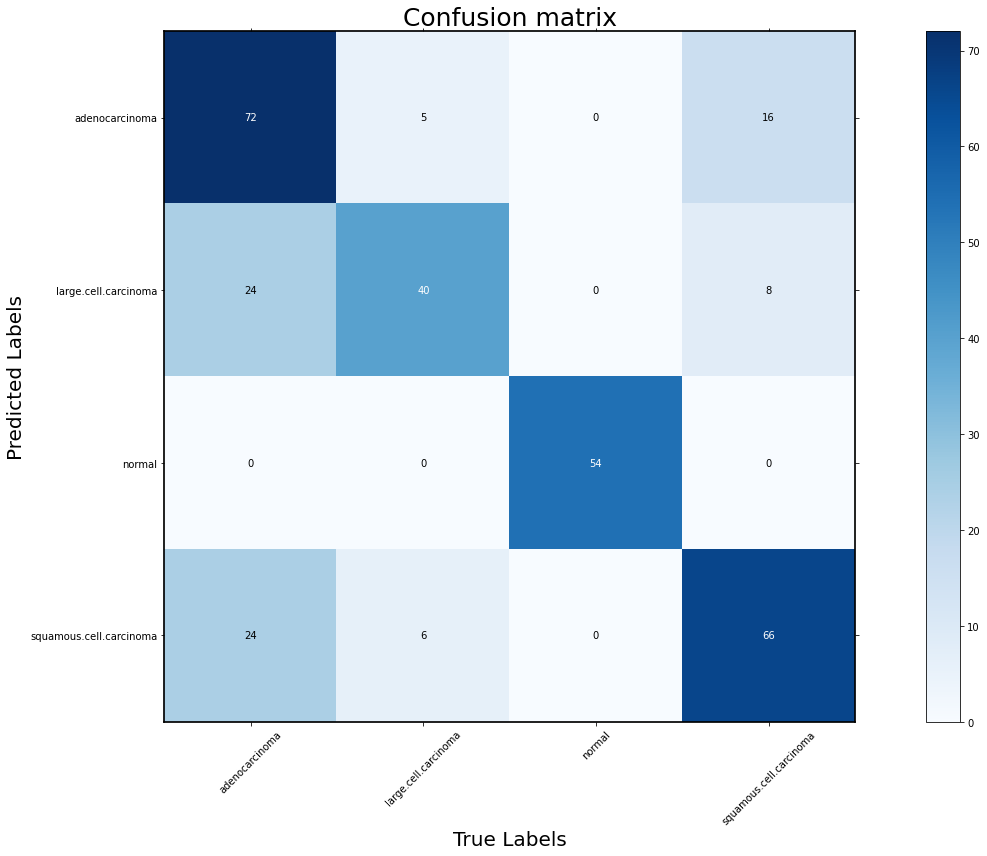

the model accuracy is  0.737
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.774   |  0.6   |    0.892    |  0.676   |
|   large.cell.carcinoma  |   0.556   | 0.784  |    0.879    |  0.651   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.688   | 0.733  |    0.867    |   0.71   |
+-------------------------+-----------+--------+-------------+----------+


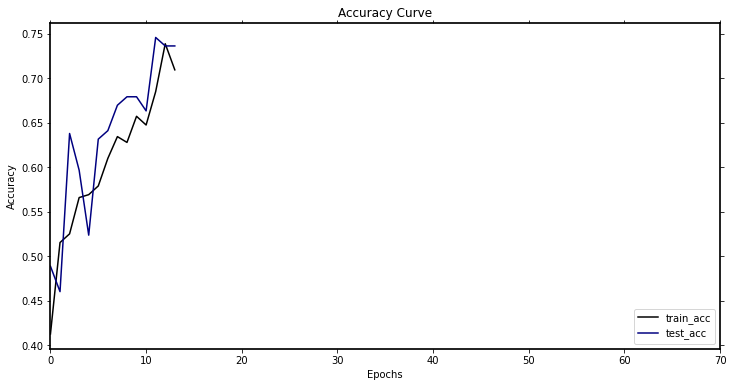

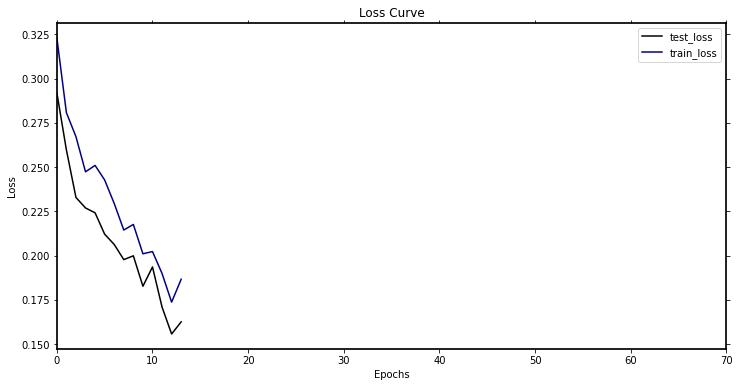

-----------第15轮训练开始-----------
训练次数：2310, 训练集正确率: 0.7438825448613376, Loss：106.3251995369792
第 15 轮测试集上的toal_Loss: 48.49564625322819, 正确率： 0.7523809523809524
Top-1准确率为:{} 0.7523809523809524
[[103.  13.   0.  36.]
 [ 13.  38.   0.  12.]
 [  0.   0.  54.   0.]
 [  4.   0.   0.  42.]]


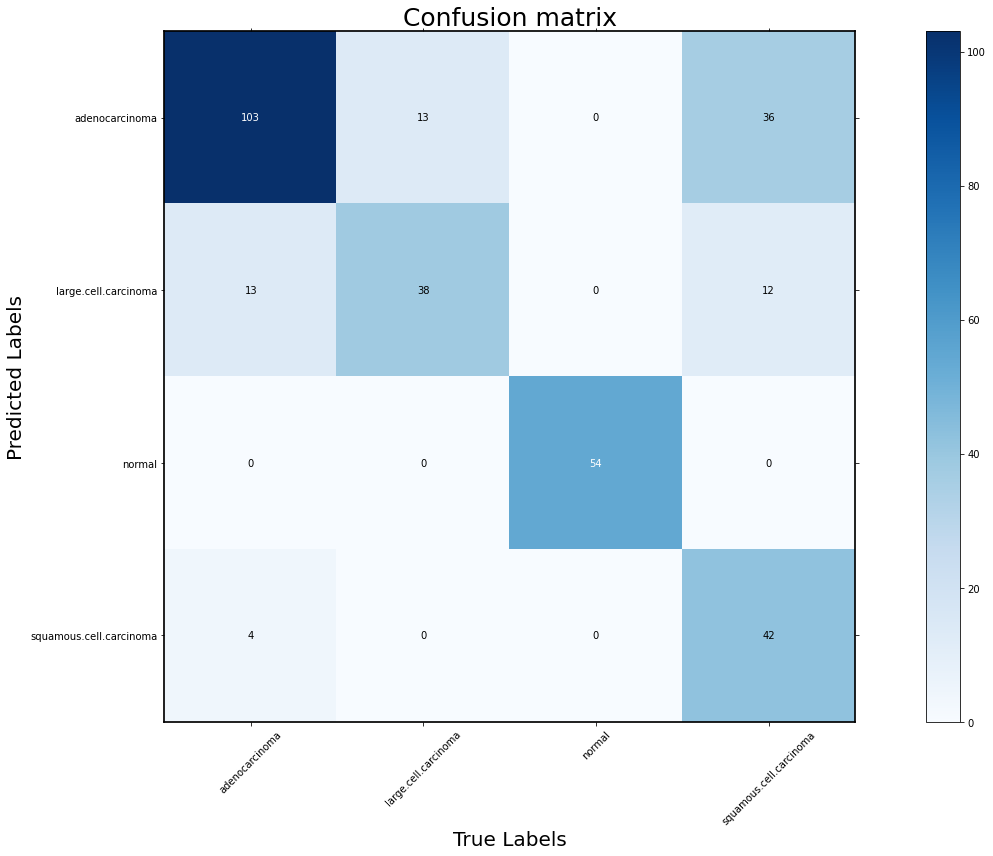

the model accuracy is  0.752
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.678   | 0.858  |    0.749    |  0.757   |
|   large.cell.carcinoma  |   0.603   | 0.745  |    0.905    |  0.667   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.913   | 0.467  |    0.982    |  0.618   |
+-------------------------+-----------+--------+-------------+----------+


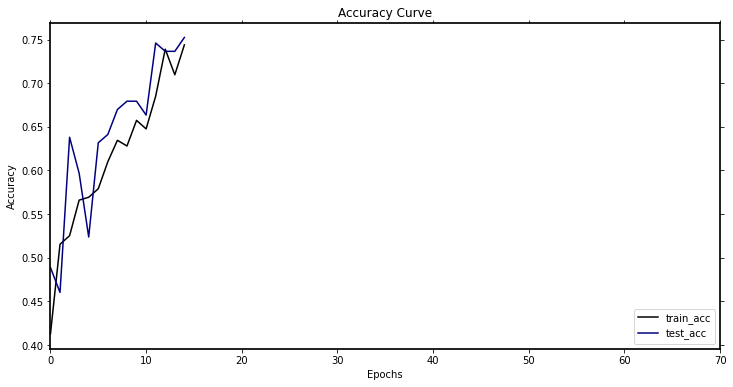

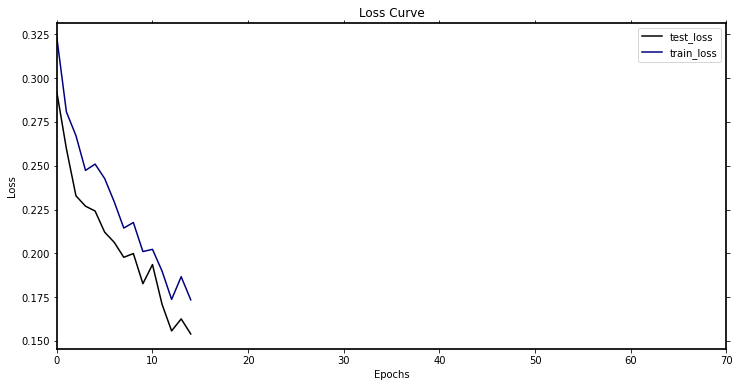

-----------第16轮训练开始-----------
训练次数：2464, 训练集正确率: 0.7308319738988581, Loss：99.38859794288874
第 16 轮测试集上的toal_Loss: 42.9553191550076, 正确率： 0.7714285714285715
Top-1准确率为:{} 0.7714285714285715
[[103.  17.   0.  32.]
 [  5.  31.   0.   3.]
 [  0.   0.  54.   0.]
 [ 12.   3.   0.  55.]]


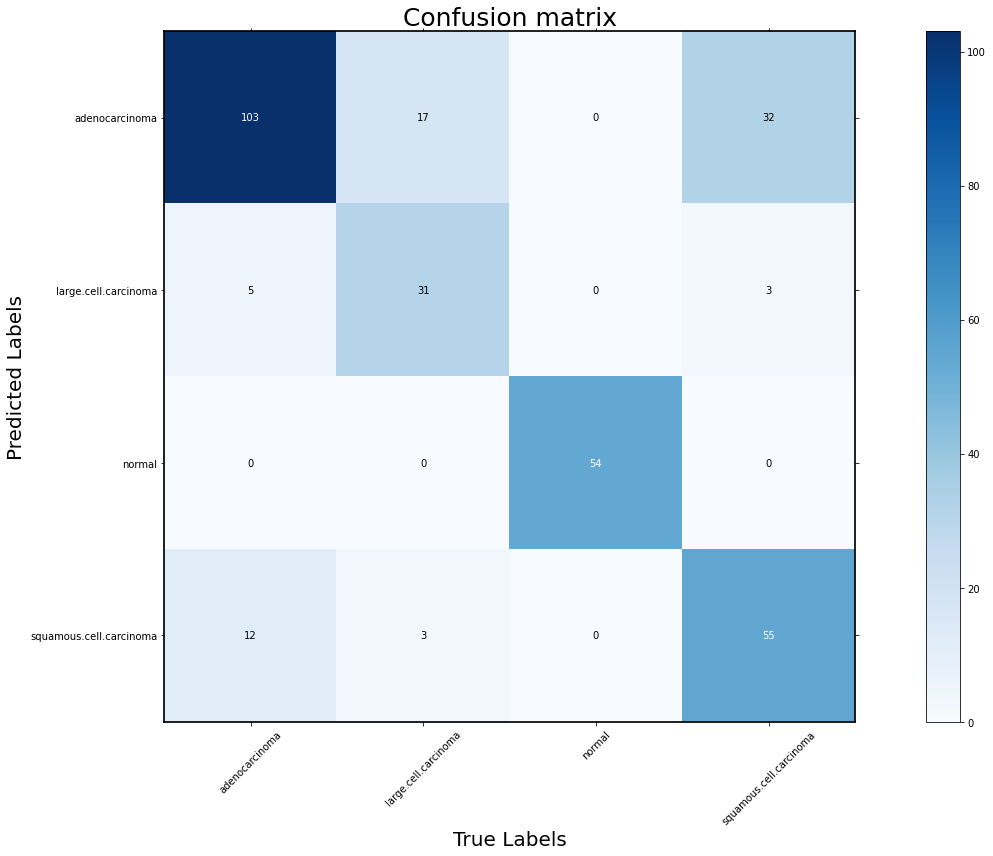

the model accuracy is  0.771
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.678   | 0.858  |    0.749    |  0.757   |
|   large.cell.carcinoma  |   0.795   | 0.608  |     0.97    |  0.689   |
|          normal         |    1.0    |  1.0   |     1.0     |   1.0    |
| squamous.cell.carcinoma |   0.786   | 0.611  |    0.933    |  0.688   |
+-------------------------+-----------+--------+-------------+----------+


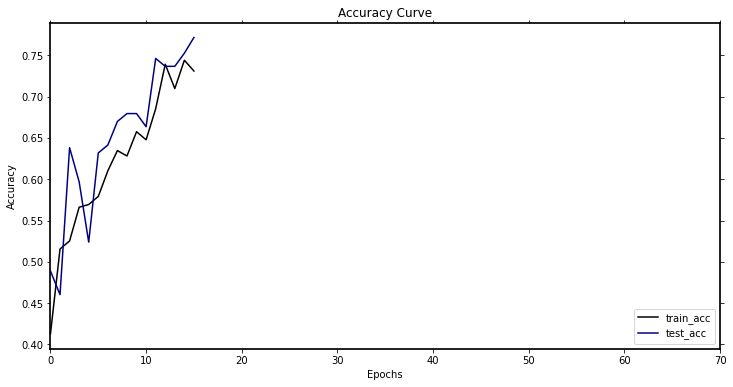

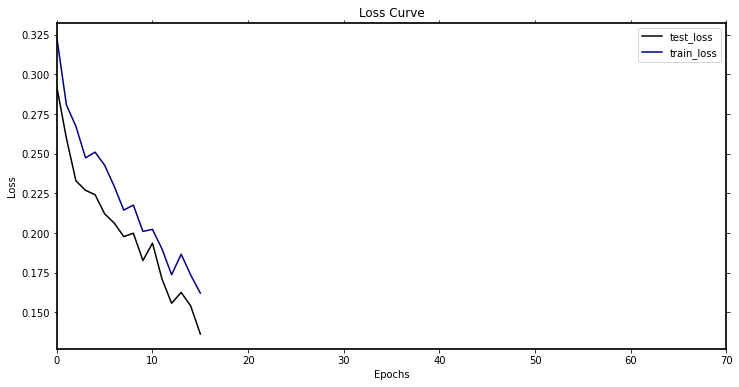

-----------第17轮训练开始-----------
训练次数：2618, 训练集正确率: 0.7308319738988581, Loss：108.32187946140766
第 17 轮测试集上的toal_Loss: 42.84593380987644, 正确率： 0.7841269841269841
Top-1准确率为:{} 0.7841269841269841
[[86.  8.  1. 12.]
 [ 3. 33.  0.  3.]
 [ 0.  0. 53.  0.]
 [31. 10.  0. 75.]]


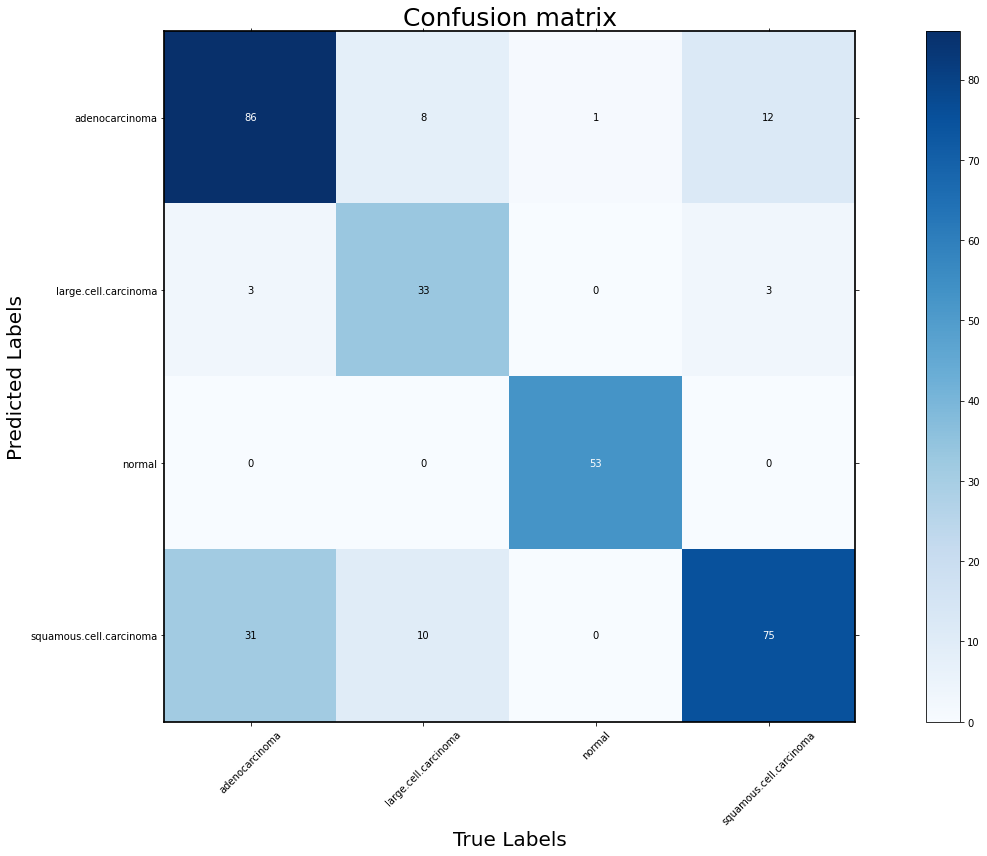

the model accuracy is  0.784
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.804   | 0.717  |    0.892    |  0.758   |
|   large.cell.carcinoma  |   0.846   | 0.647  |    0.977    |  0.733   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.647   | 0.833  |    0.818    |  0.728   |
+-------------------------+-----------+--------+-------------+----------+


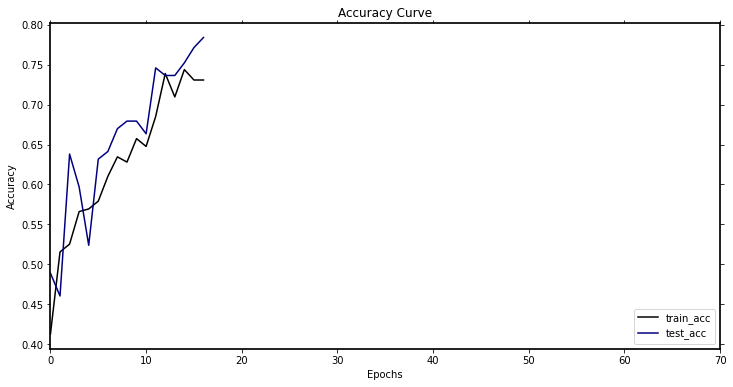

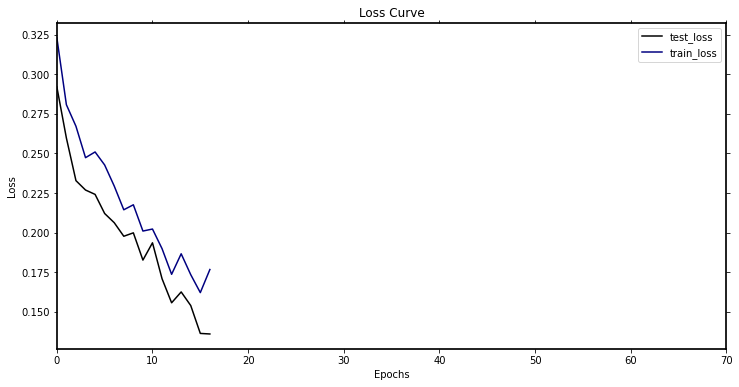

-----------第18轮训练开始-----------
训练次数：2772, 训练集正确率: 0.7487765089722676, Loss：100.58229244500399
第 18 轮测试集上的toal_Loss: 41.0564129203558, 正确率： 0.8095238095238095
Top-1准确率为:{} 0.8095238095238095
[[102.  14.   2.  17.]
 [  5.  35.   0.   4.]
 [  1.   0.  52.   3.]
 [ 12.   2.   0.  66.]]


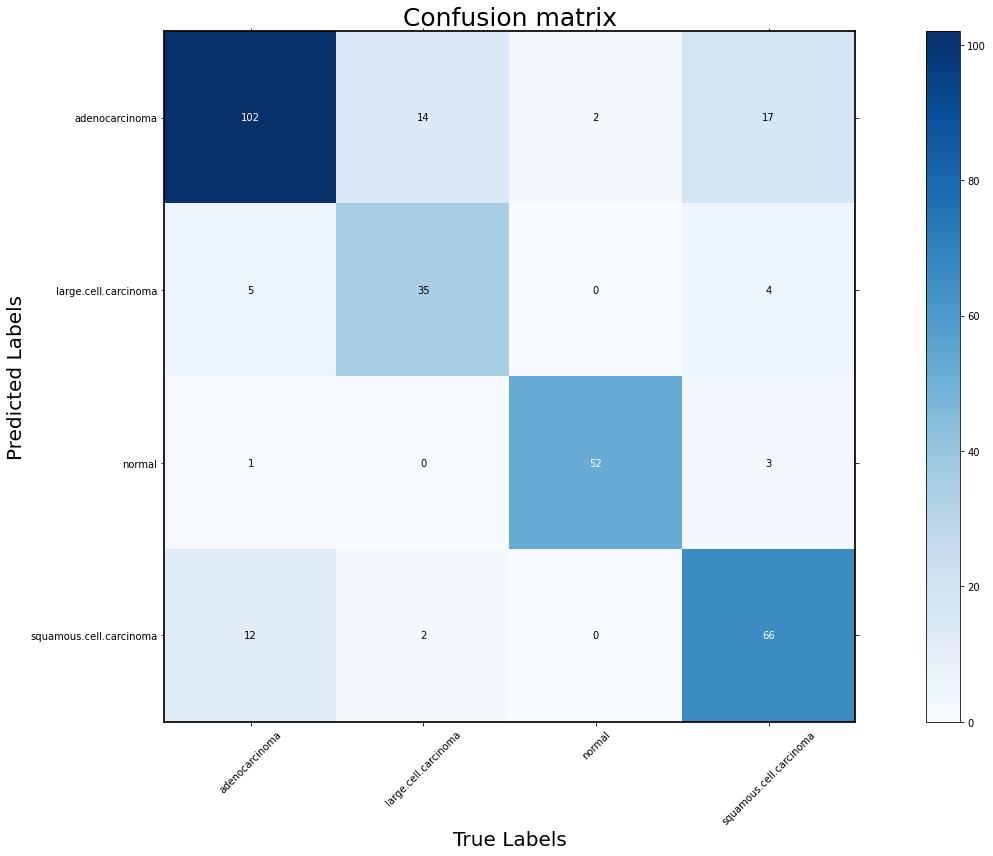

the model accuracy is  0.81
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.756   |  0.85  |    0.831    |   0.8    |
|   large.cell.carcinoma  |   0.795   | 0.686  |    0.966    |  0.736   |
|          normal         |   0.929   | 0.963  |    0.985    |  0.946   |
| squamous.cell.carcinoma |   0.825   | 0.733  |    0.938    |  0.776   |
+-------------------------+-----------+--------+-------------+----------+


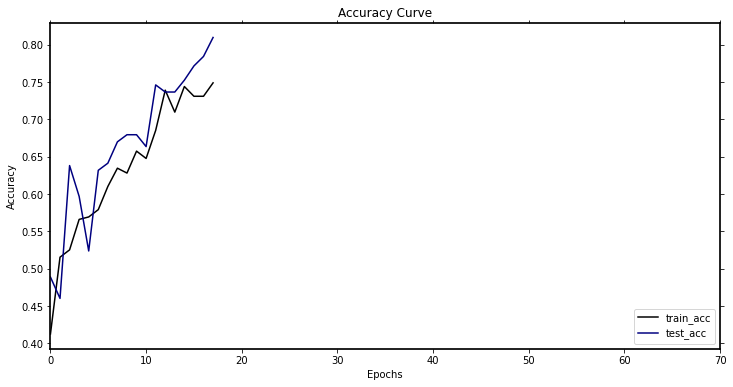

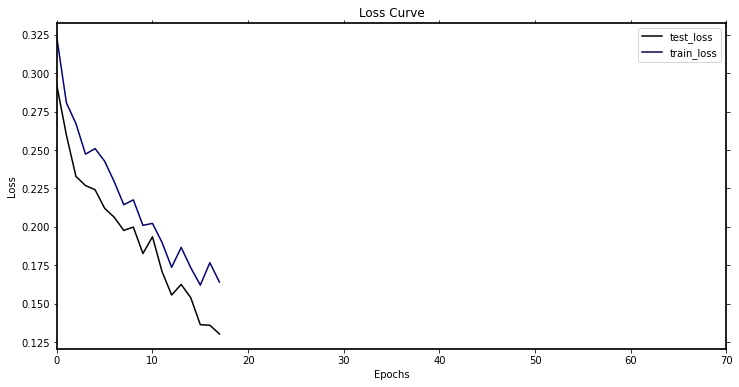

-----------第19轮训练开始-----------
训练次数：2926, 训练集正确率: 0.7765089722675367, Loss：94.15410911291838
第 19 轮测试集上的toal_Loss: 40.79126136004925, 正确率： 0.8126984126984127
Top-1准确率为:{} 0.8126984126984127
[[98.  7.  2. 22.]
 [13. 43.  0.  5.]
 [ 0.  0. 52.  0.]
 [ 9.  1.  0. 63.]]


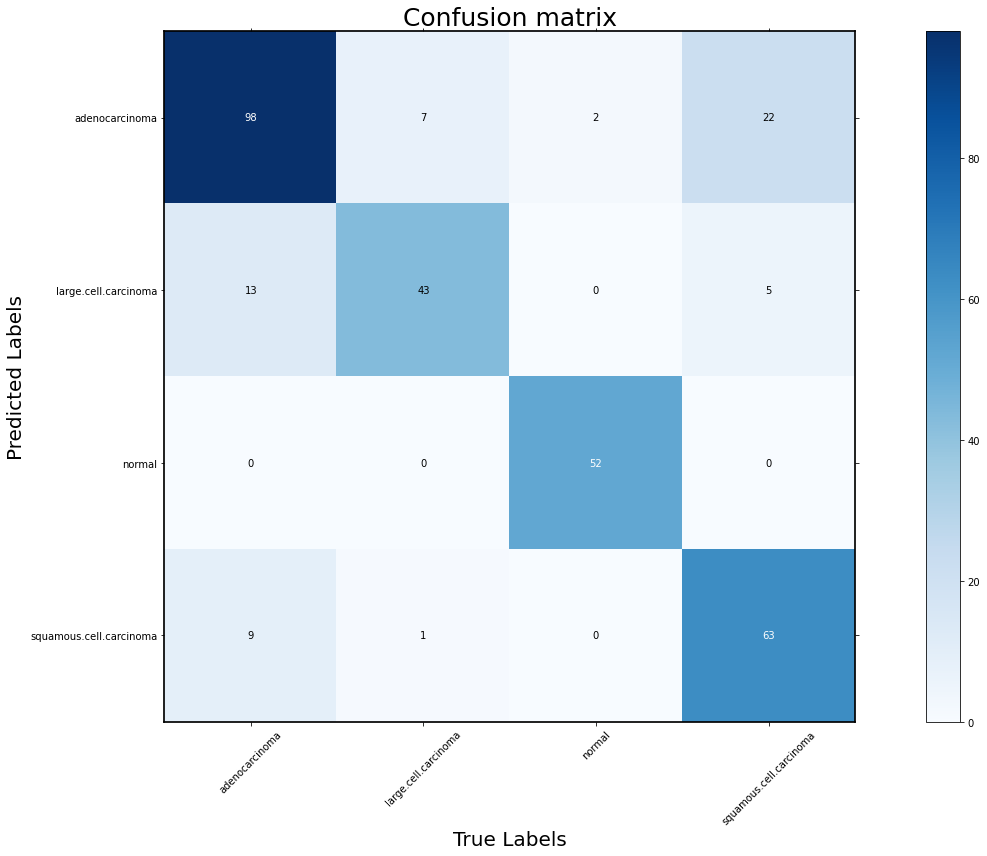

the model accuracy is  0.813
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.76   | 0.817  |    0.841    |  0.787   |
|   large.cell.carcinoma  |   0.705   | 0.843  |    0.932    |  0.768   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.863   |  0.7   |    0.956    |  0.773   |
+-------------------------+-----------+--------+-------------+----------+


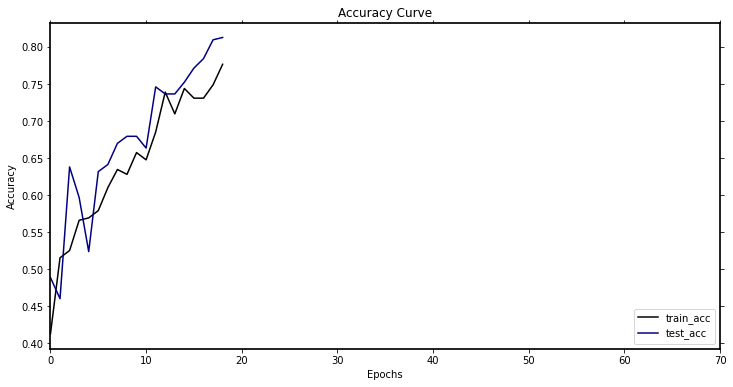

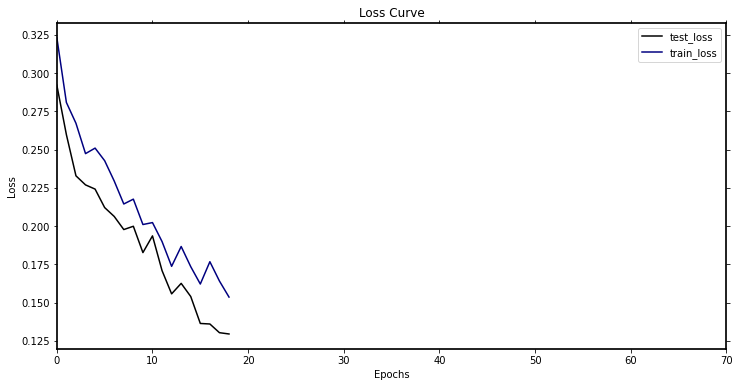

-----------第20轮训练开始-----------
训练次数：3080, 训练集正确率: 0.7781402936378466, Loss：92.20284822583199
第 20 轮测试集上的toal_Loss: 37.427105240523815, 正确率： 0.8095238095238095
Top-1准确率为:{} 0.8126984126984127
[[102.  12.   2.  16.]
 [  5.  34.   0.   2.]
 [  0.   0.  52.   5.]
 [ 13.   5.   0.  67.]]


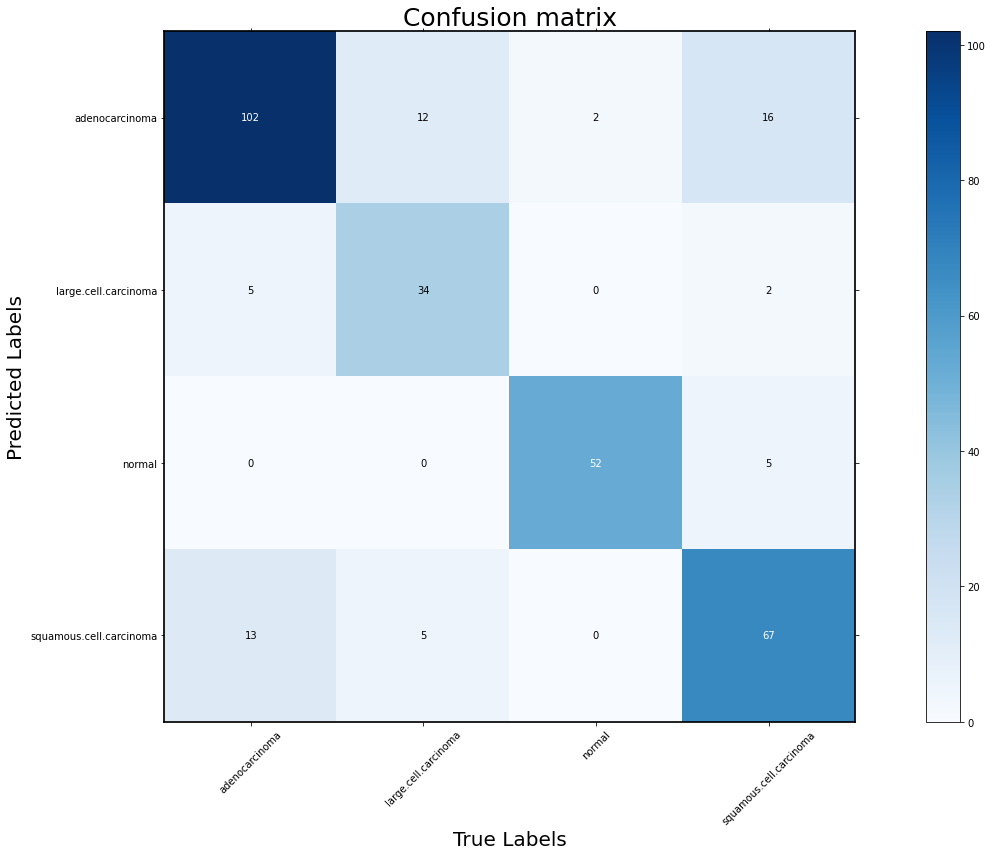

the model accuracy is  0.81
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.773   |  0.85  |    0.846    |   0.81   |
|   large.cell.carcinoma  |   0.829   | 0.667  |    0.973    |  0.739   |
|          normal         |   0.912   | 0.963  |    0.981    |  0.937   |
| squamous.cell.carcinoma |   0.788   | 0.744  |     0.92    |  0.765   |
+-------------------------+-----------+--------+-------------+----------+


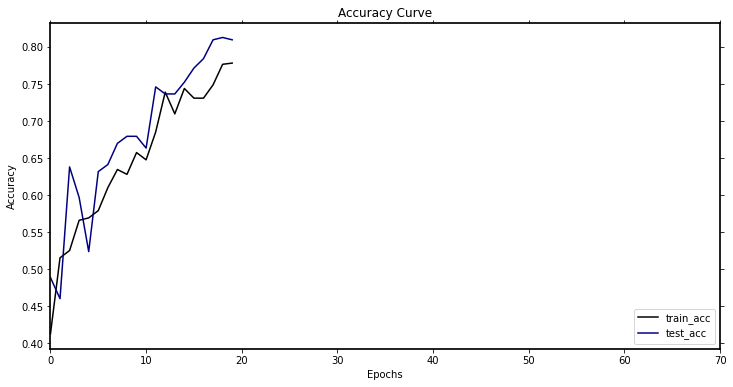

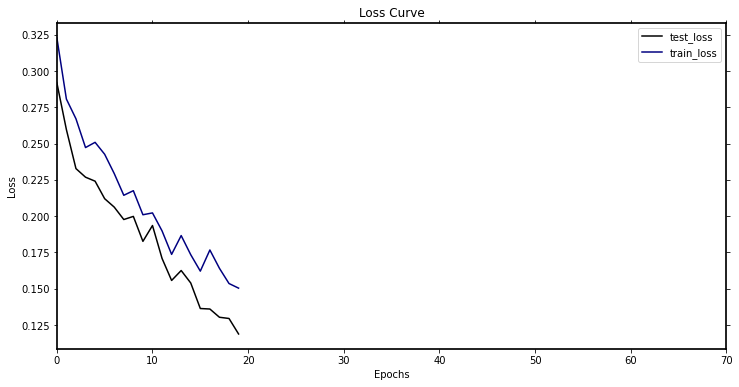

-----------第21轮训练开始-----------
训练次数：3234, 训练集正确率: 0.8156606851549756, Loss：77.75561724603176
第 21 轮测试集上的toal_Loss: 32.90991942025721, 正确率： 0.8317460317460318
Top-1准确率为:{} 0.8317460317460318
[[99.  9.  1. 15.]
 [11. 39.  0.  3.]
 [ 0.  0. 53.  1.]
 [10.  3.  0. 71.]]


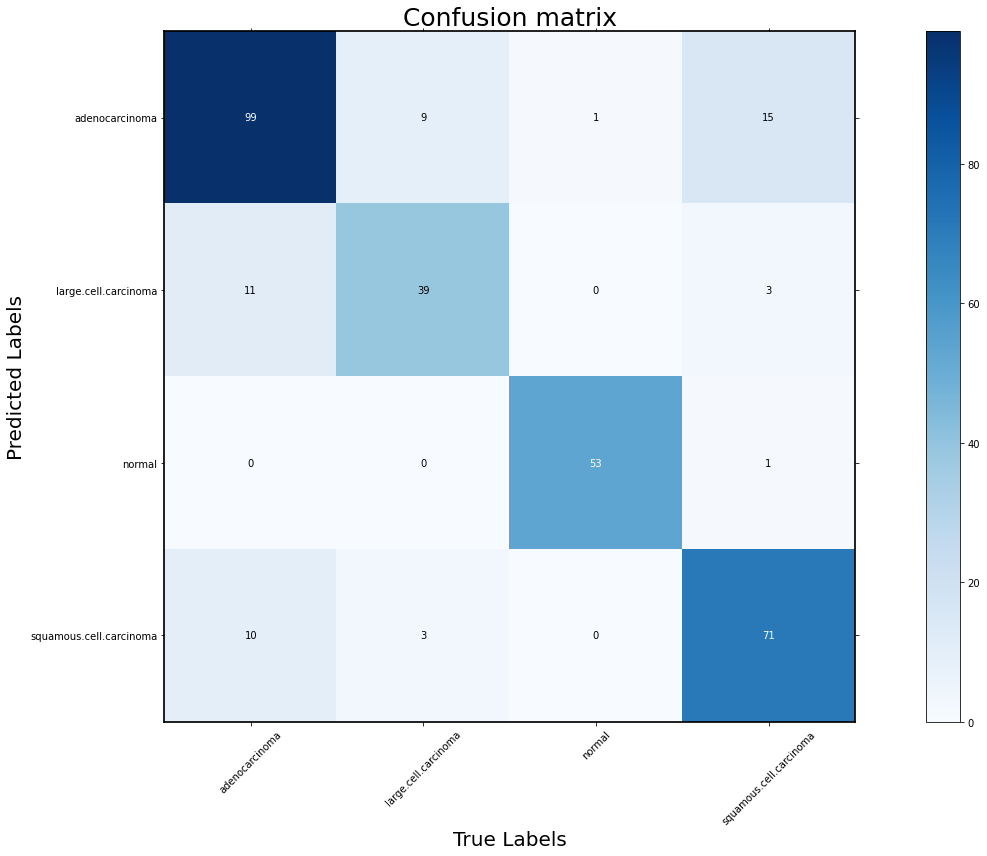

the model accuracy is  0.832
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.798   | 0.825  |    0.872    |  0.811   |
|   large.cell.carcinoma  |   0.736   | 0.765  |    0.947    |   0.75   |
|          normal         |   0.981   | 0.981  |    0.996    |  0.981   |
| squamous.cell.carcinoma |   0.845   | 0.789  |    0.942    |  0.816   |
+-------------------------+-----------+--------+-------------+----------+


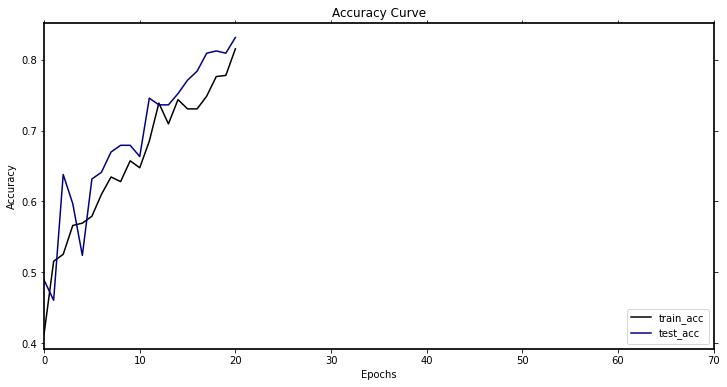

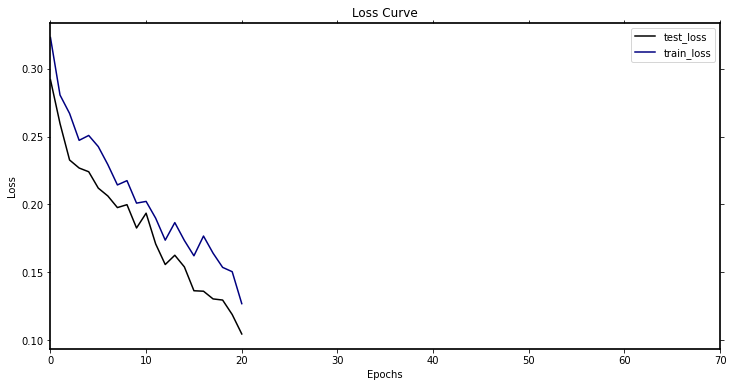

-----------第22轮训练开始-----------
训练次数：3388, 训练集正确率: 0.7699836867862969, Loss：93.50744929909706
第 22 轮测试集上的toal_Loss: 31.56991720199585, 正确率： 0.8285714285714286
Top-1准确率为:{} 0.8317460317460318
[[105.  11.   1.  21.]
 [  7.  34.   0.   0.]
 [  0.   0.  53.   0.]
 [  8.   6.   0.  69.]]


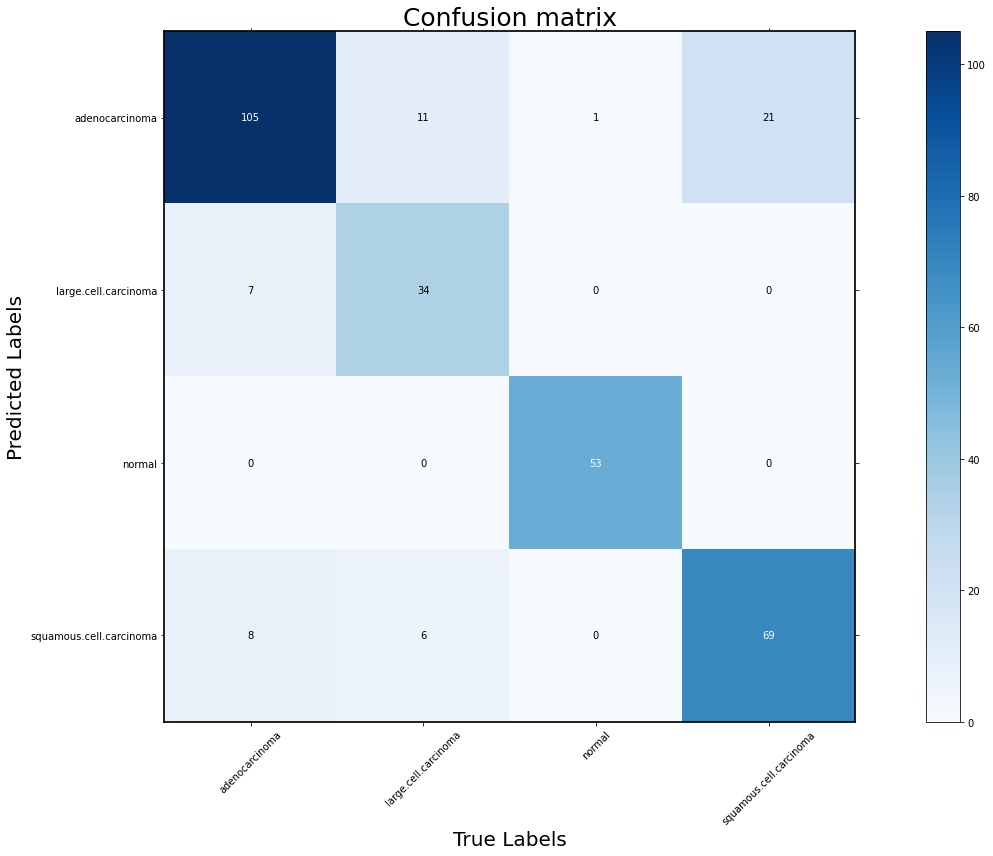

the model accuracy is  0.829
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.761   | 0.875  |    0.831    |  0.814   |
|   large.cell.carcinoma  |   0.829   | 0.667  |    0.973    |  0.739   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.831   | 0.767  |    0.938    |  0.798   |
+-------------------------+-----------+--------+-------------+----------+


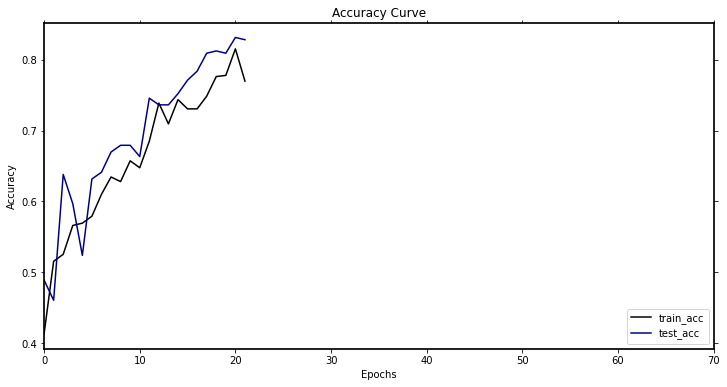

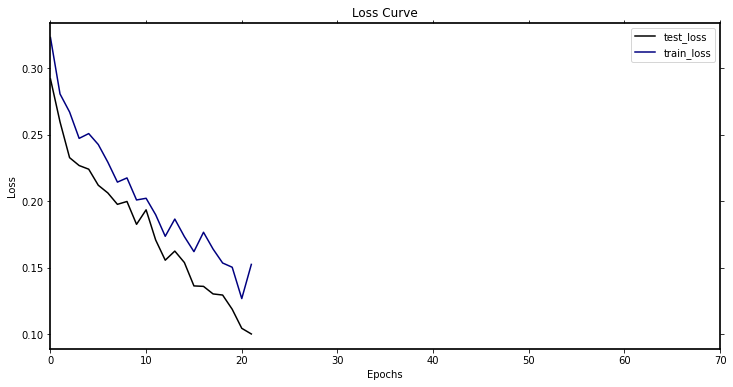

-----------第23轮训练开始-----------
训练次数：3542, 训练集正确率: 0.7944535073409462, Loss：91.3371156938374
第 23 轮测试集上的toal_Loss: 29.62452533841133, 正确率： 0.8539682539682539
Top-1准确率为:{} 0.8539682539682539
[[97.  8.  3.  8.]
 [ 9. 42.  0.  0.]
 [ 0.  0. 51.  3.]
 [14.  1.  0. 79.]]


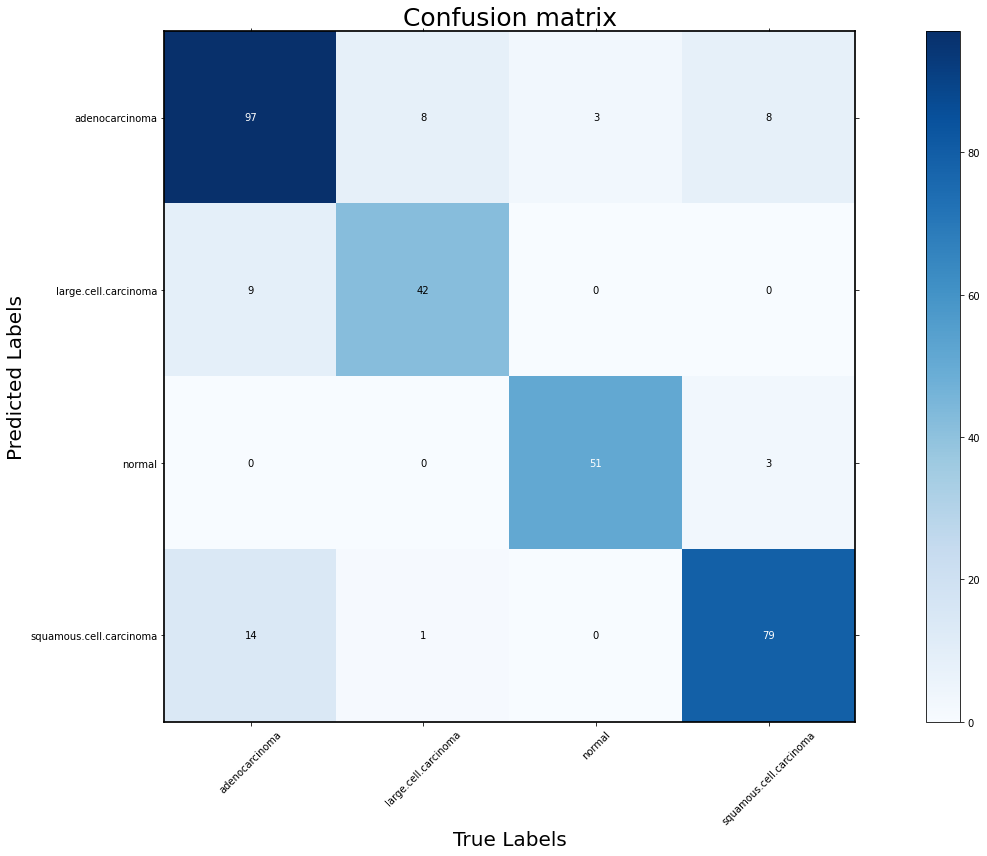

the model accuracy is  0.854
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.836   | 0.808  |    0.903    |  0.822   |
|   large.cell.carcinoma  |   0.824   | 0.824  |    0.966    |  0.824   |
|          normal         |   0.944   | 0.944  |    0.989    |  0.944   |
| squamous.cell.carcinoma |    0.84   | 0.878  |    0.933    |  0.859   |
+-------------------------+-----------+--------+-------------+----------+


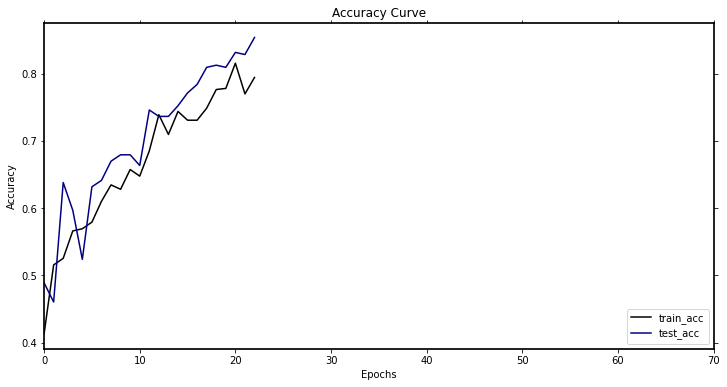

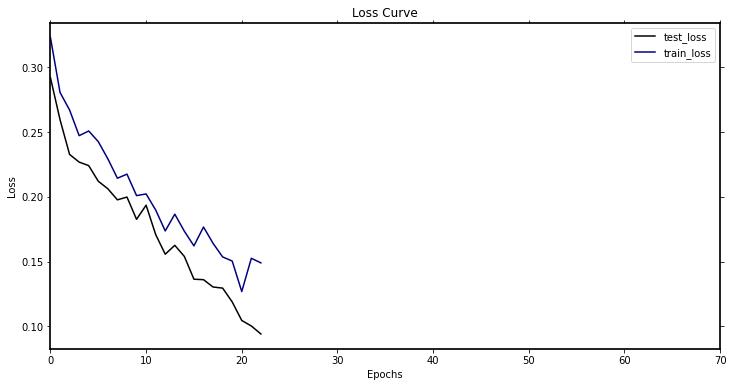

-----------第24轮训练开始-----------
训练次数：3696, 训练集正确率: 0.7781402936378466, Loss：83.9739233776927
第 24 轮测试集上的toal_Loss: 36.64389559999108, 正确率： 0.819047619047619
Top-1准确率为:{} 0.8539682539682539
[[112.  15.   1.  29.]
 [  6.  35.   0.   1.]
 [  0.   0.  53.   2.]
 [  2.   1.   0.  58.]]


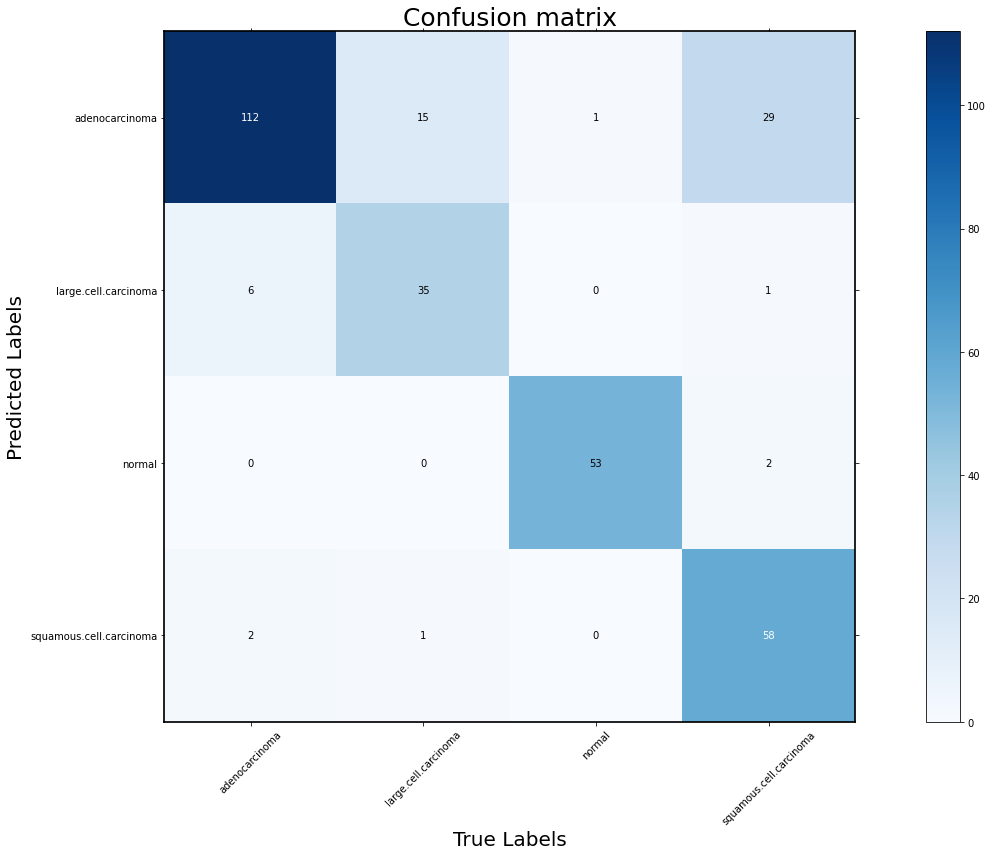

the model accuracy is  0.819
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.713   | 0.933  |    0.769    |  0.808   |
|   large.cell.carcinoma  |   0.833   | 0.686  |    0.973    |  0.752   |
|          normal         |   0.964   | 0.981  |    0.992    |  0.972   |
| squamous.cell.carcinoma |   0.951   | 0.644  |    0.987    |  0.768   |
+-------------------------+-----------+--------+-------------+----------+


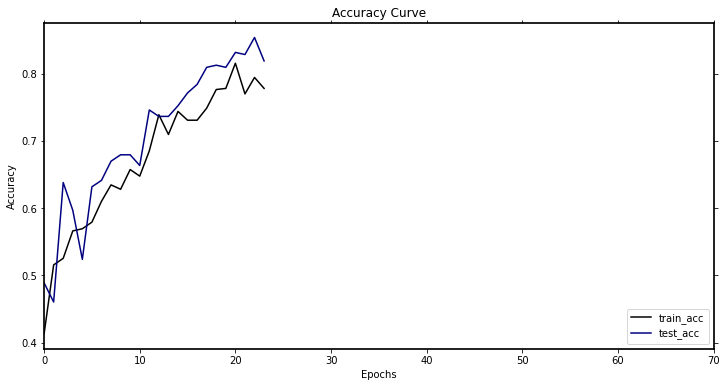

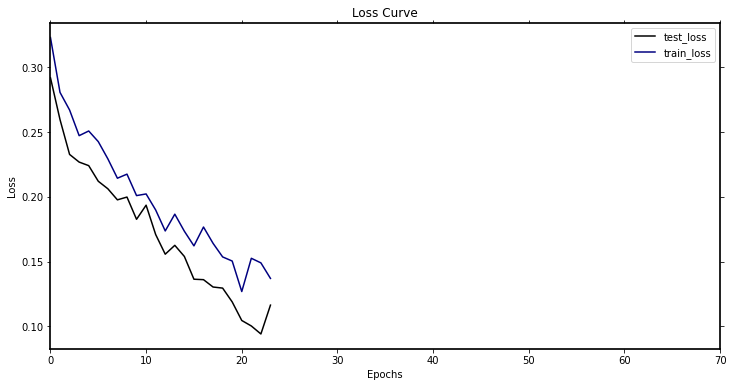

-----------第25轮训练开始-----------
训练次数：3850, 训练集正确率: 0.8189233278955954, Loss：76.00770249962807
第 25 轮测试集上的toal_Loss: 29.46543761715293, 正确率： 0.8539682539682539
Top-1准确率为:{} 0.8539682539682539
[[104.  18.   1.   8.]
 [  2.  30.   0.   0.]
 [  0.   0.  53.   0.]
 [ 14.   3.   0.  82.]]


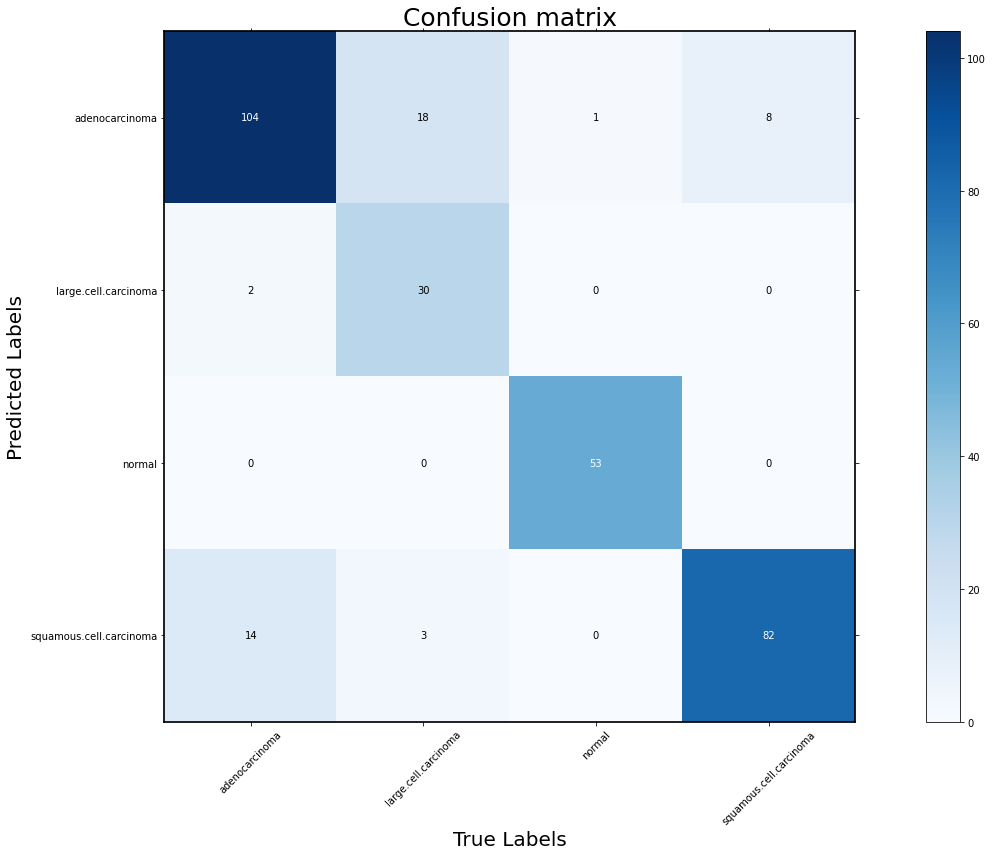

the model accuracy is  0.854
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.794   | 0.867  |    0.862    |  0.829   |
|   large.cell.carcinoma  |   0.938   | 0.588  |    0.992    |  0.723   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.828   | 0.911  |    0.924    |  0.868   |
+-------------------------+-----------+--------+-------------+----------+


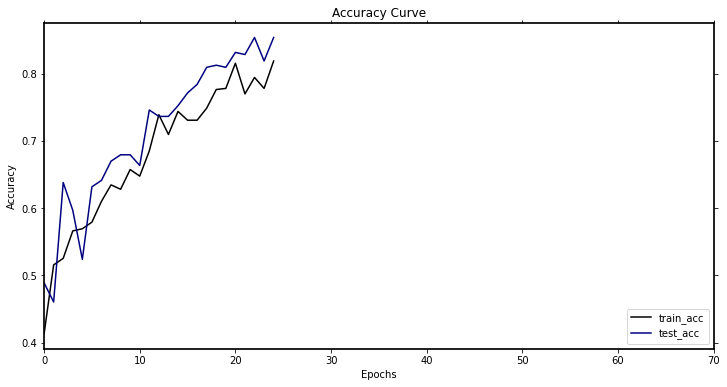

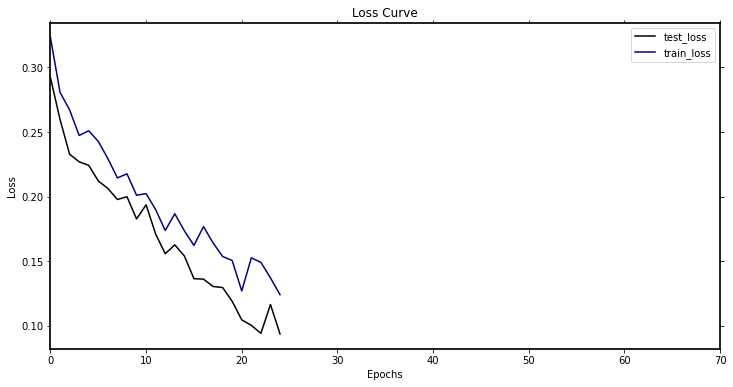

-----------第26轮训练开始-----------
训练次数：4004, 训练集正确率: 0.8254486133768353, Loss：71.05241737887263
第 26 轮测试集上的toal_Loss: 27.716226499527693, 正确率： 0.8666666666666667
Top-1准确率为:{} 0.8666666666666667
[[102.   8.   1.  10.]
 [  9.  40.   0.   1.]
 [  2.   0.  53.   1.]
 [  7.   3.   0.  78.]]


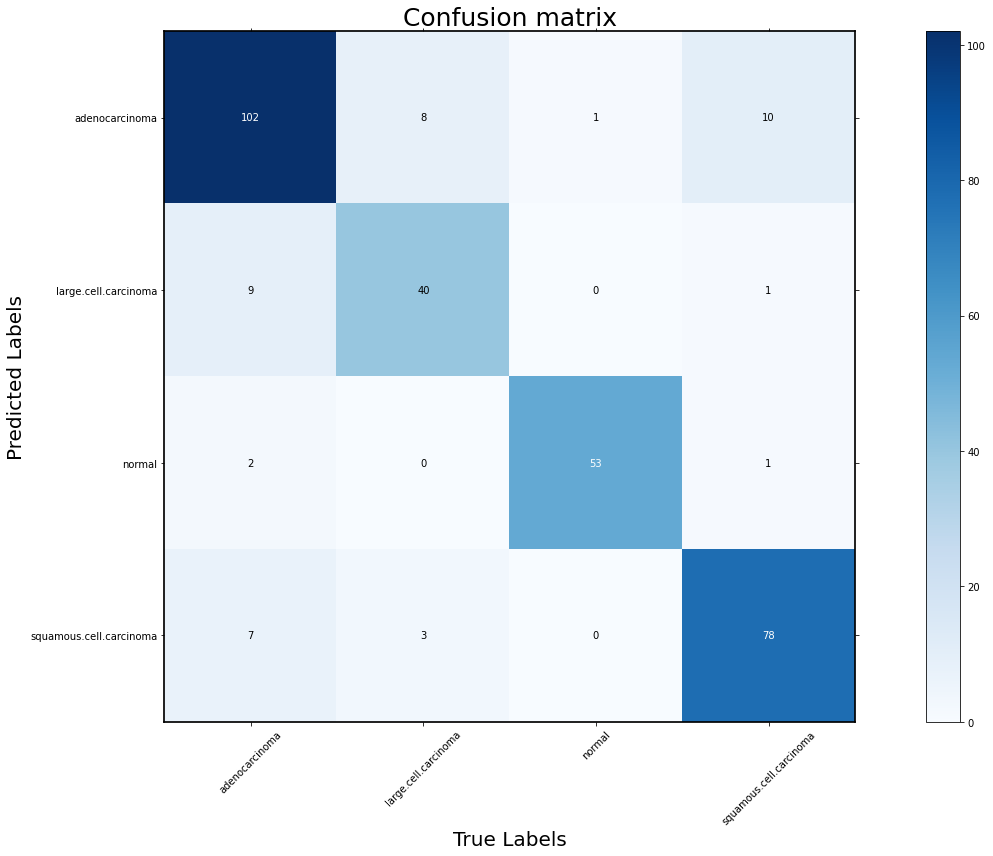

the model accuracy is  0.867
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.843   |  0.85  |    0.903    |  0.846   |
|   large.cell.carcinoma  |    0.8    | 0.784  |    0.962    |  0.792   |
|          normal         |   0.946   | 0.981  |    0.989    |  0.963   |
| squamous.cell.carcinoma |   0.886   | 0.867  |    0.956    |  0.876   |
+-------------------------+-----------+--------+-------------+----------+


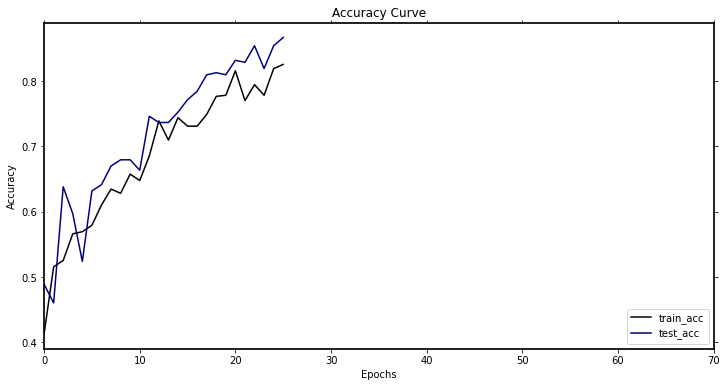

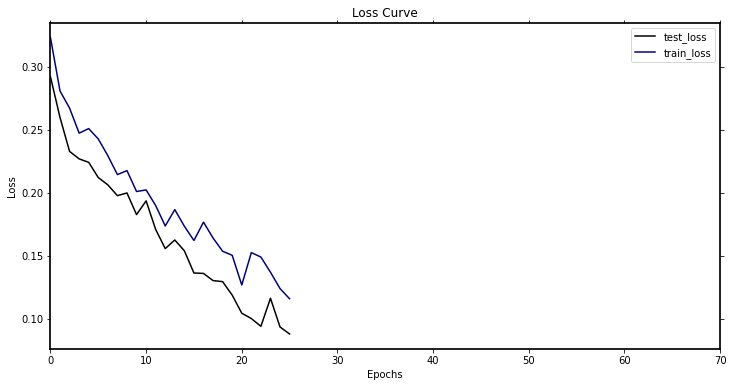

-----------第27轮训练开始-----------
训练次数：4158, 训练集正确率: 0.8254486133768353, Loss：72.33532934635878
第 27 轮测试集上的toal_Loss: 30.59025756083429, 正确率： 0.8634920634920635
Top-1准确率为:{} 0.8666666666666667
[[93.  3.  4.  5.]
 [10. 45.  0.  1.]
 [ 0.  0. 50.  0.]
 [17.  3.  0. 84.]]


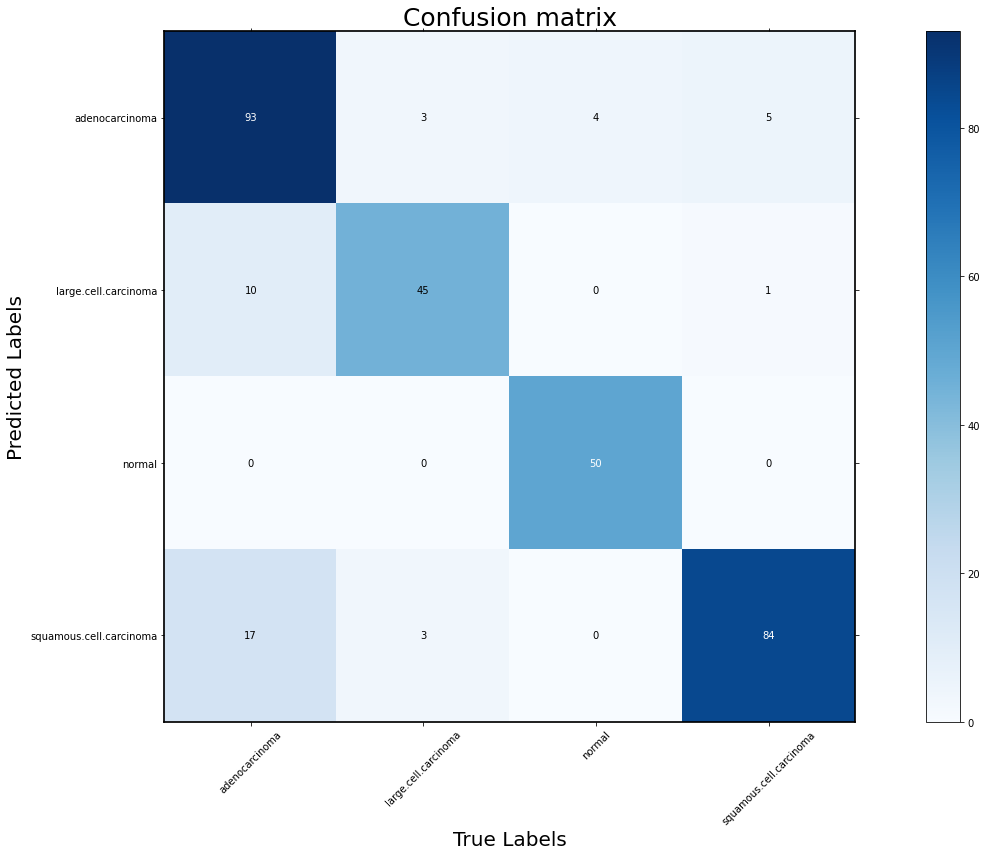

the model accuracy is  0.863
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.886   | 0.775  |    0.938    |  0.827   |
|   large.cell.carcinoma  |   0.804   | 0.882  |    0.958    |  0.841   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.808   | 0.933  |    0.911    |  0.866   |
+-------------------------+-----------+--------+-------------+----------+


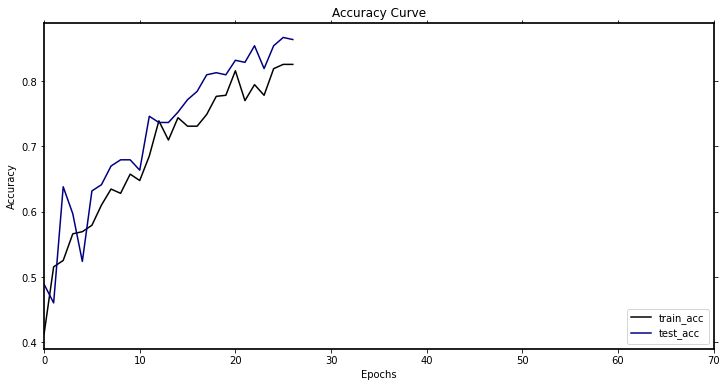

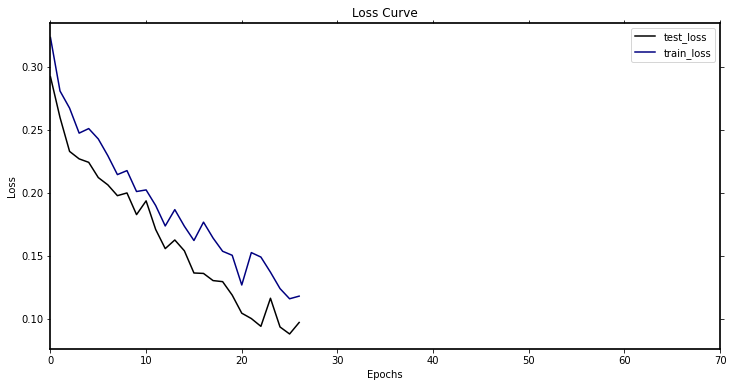

-----------第28轮训练开始-----------
训练次数：4312, 训练集正确率: 0.8221859706362153, Loss：70.94499529525638
第 28 轮测试集上的toal_Loss: 26.47734000440687, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.8920634920634921
[[109.   6.   2.  11.]
 [  8.  44.   2.   1.]
 [  1.   0.  50.   0.]
 [  2.   1.   0.  78.]]


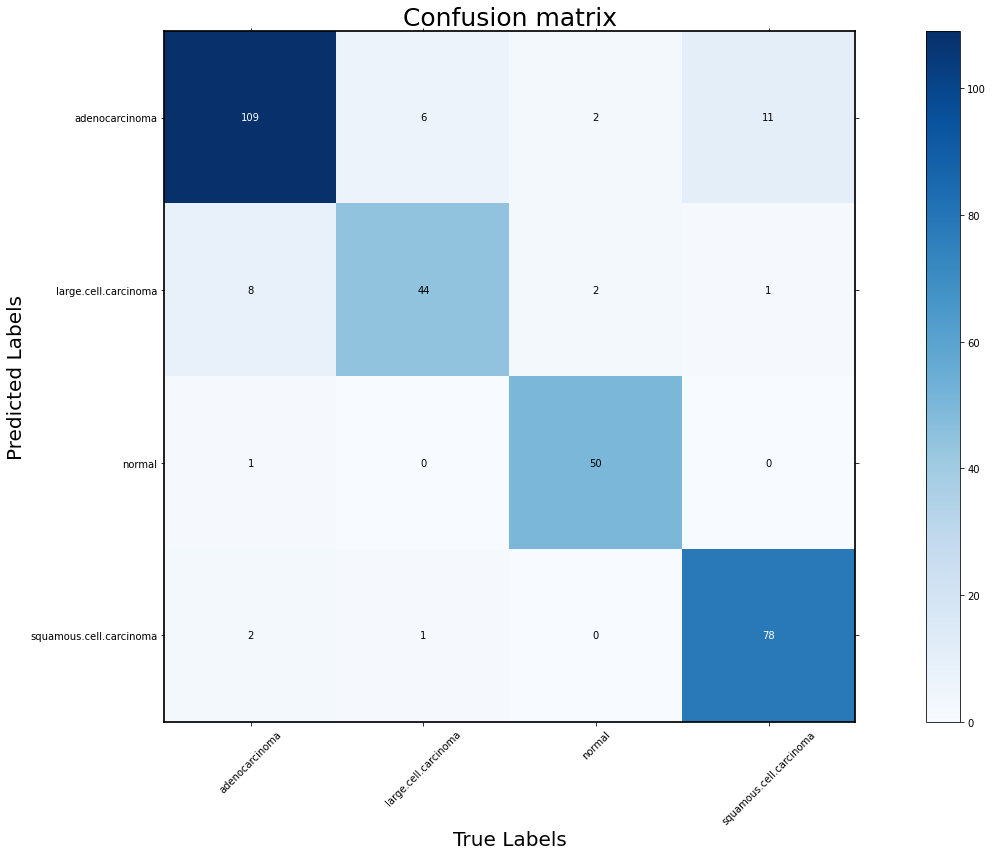

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.852   | 0.908  |    0.903    |  0.879   |
|   large.cell.carcinoma  |    0.8    | 0.863  |    0.958    |   0.83   |
|          normal         |    0.98   | 0.926  |    0.996    |  0.952   |
| squamous.cell.carcinoma |   0.963   | 0.867  |    0.987    |  0.912   |
+-------------------------+-----------+--------+-------------+----------+


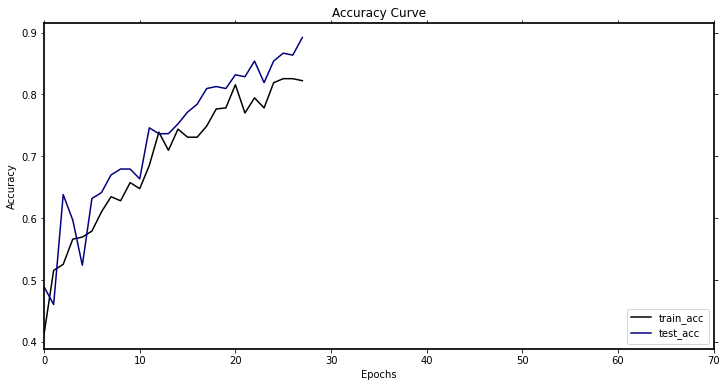

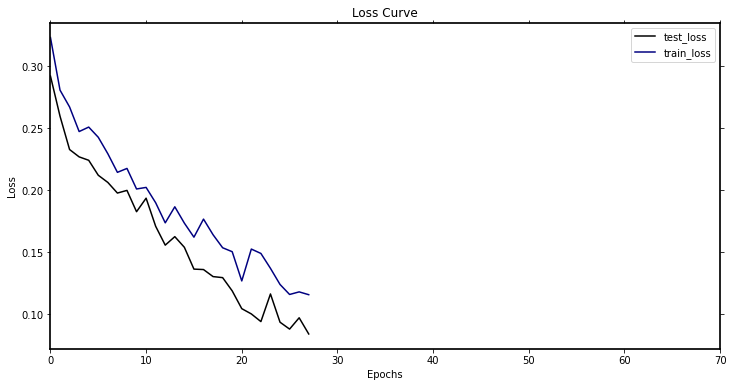

-----------第29轮训练开始-----------
训练次数：4466, 训练集正确率: 0.7960848287112561, Loss：76.15042412653565
第 29 轮测试集上的toal_Loss: 23.23711018403992, 正确率： 0.8952380952380953
Top-1准确率为:{} 0.8952380952380953
[[107.   9.   1.   9.]
 [  6.  41.   0.   0.]
 [  0.   0.  53.   0.]
 [  7.   1.   0.  81.]]


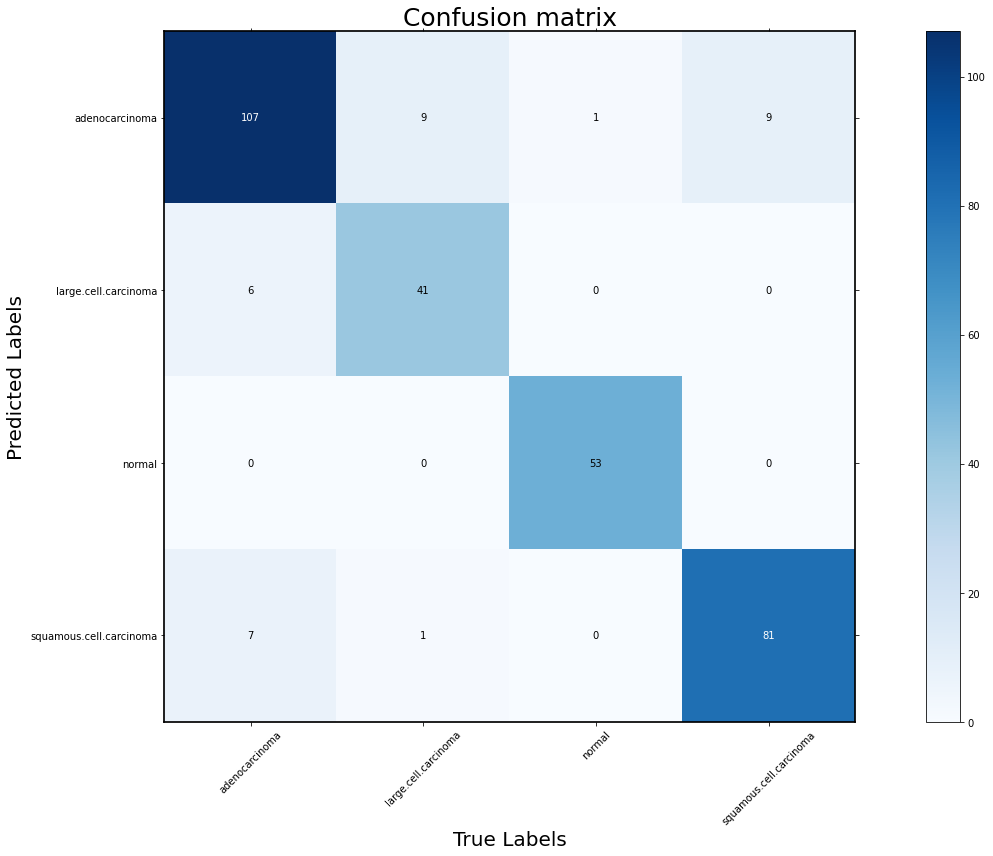

the model accuracy is  0.895
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.849   | 0.892  |    0.903    |   0.87   |
|   large.cell.carcinoma  |   0.872   | 0.804  |    0.977    |  0.837   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |    0.91   |  0.9   |    0.964    |  0.905   |
+-------------------------+-----------+--------+-------------+----------+


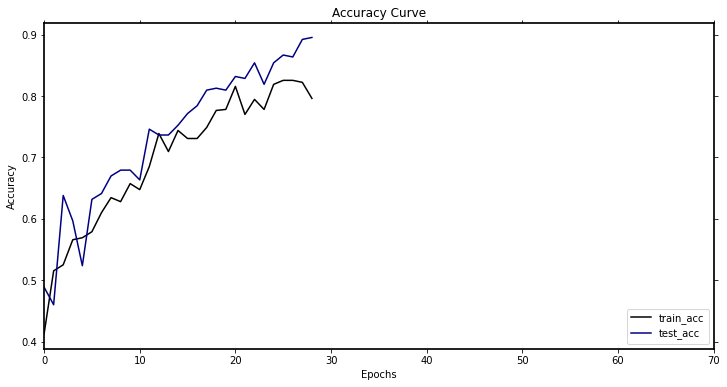

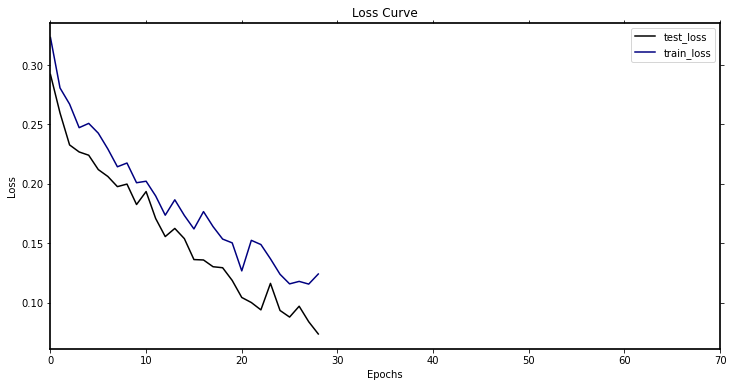

-----------第30轮训练开始-----------
训练次数：4620, 训练集正确率: 0.8205546492659054, Loss：70.51183756440878
第 30 轮测试集上的toal_Loss: 22.212745829951018, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9079365079365079
[[113.   9.   4.   8.]
 [  6.  42.   0.   1.]
 [  0.   0.  50.   0.]
 [  1.   0.   0.  81.]]


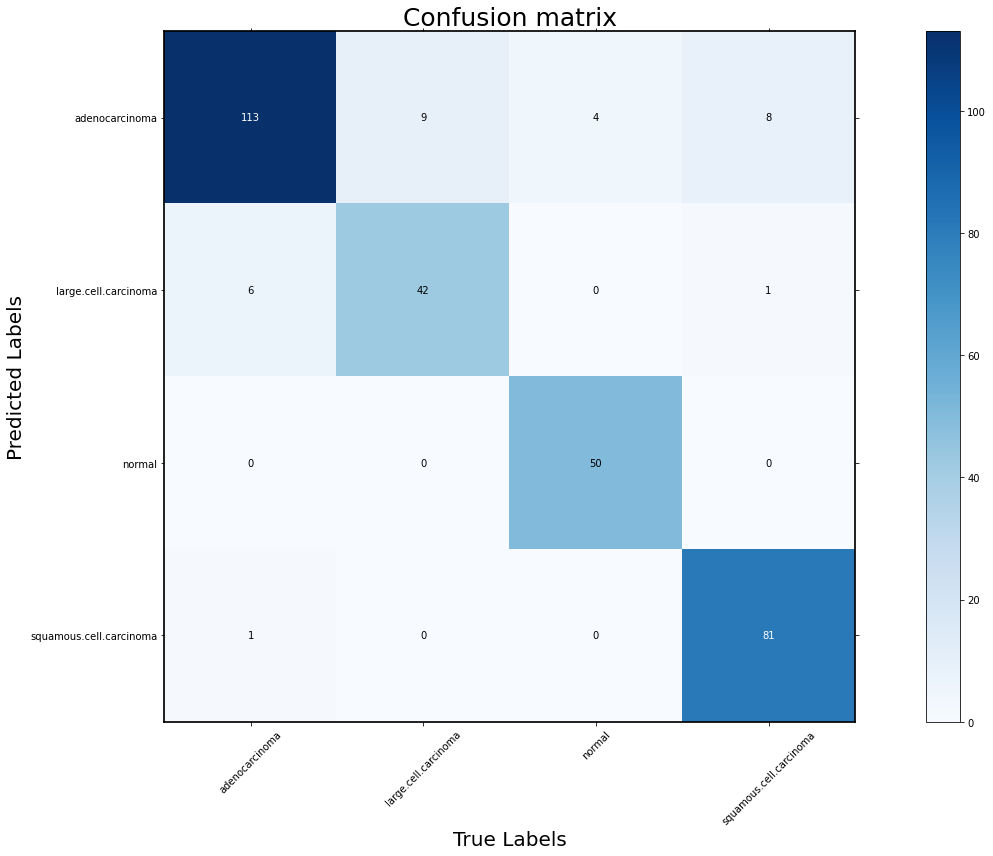

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.843   | 0.942  |    0.892    |   0.89   |
|   large.cell.carcinoma  |   0.857   | 0.824  |    0.973    |   0.84   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.988   |  0.9   |    0.996    |  0.942   |
+-------------------------+-----------+--------+-------------+----------+


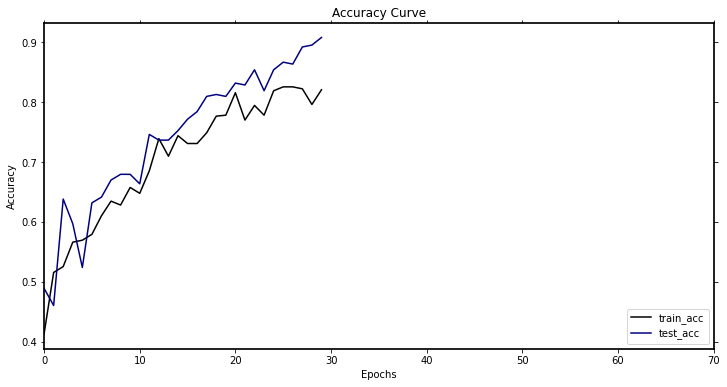

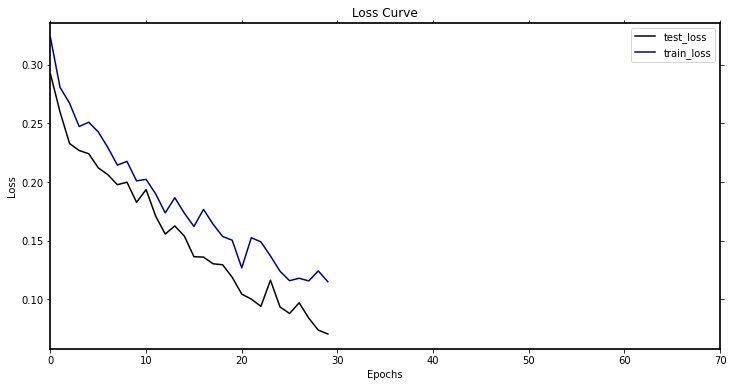

-----------第31轮训练开始-----------
训练次数：4774, 训练集正确率: 0.8580750407830342, Loss：61.30125993862748
第 31 轮测试集上的toal_Loss: 22.315511711873114, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.9079365079365079
[[106.   8.   3.   6.]
 [  6.  41.   1.   0.]
 [  0.   0.  50.   0.]
 [  8.   2.   0.  84.]]


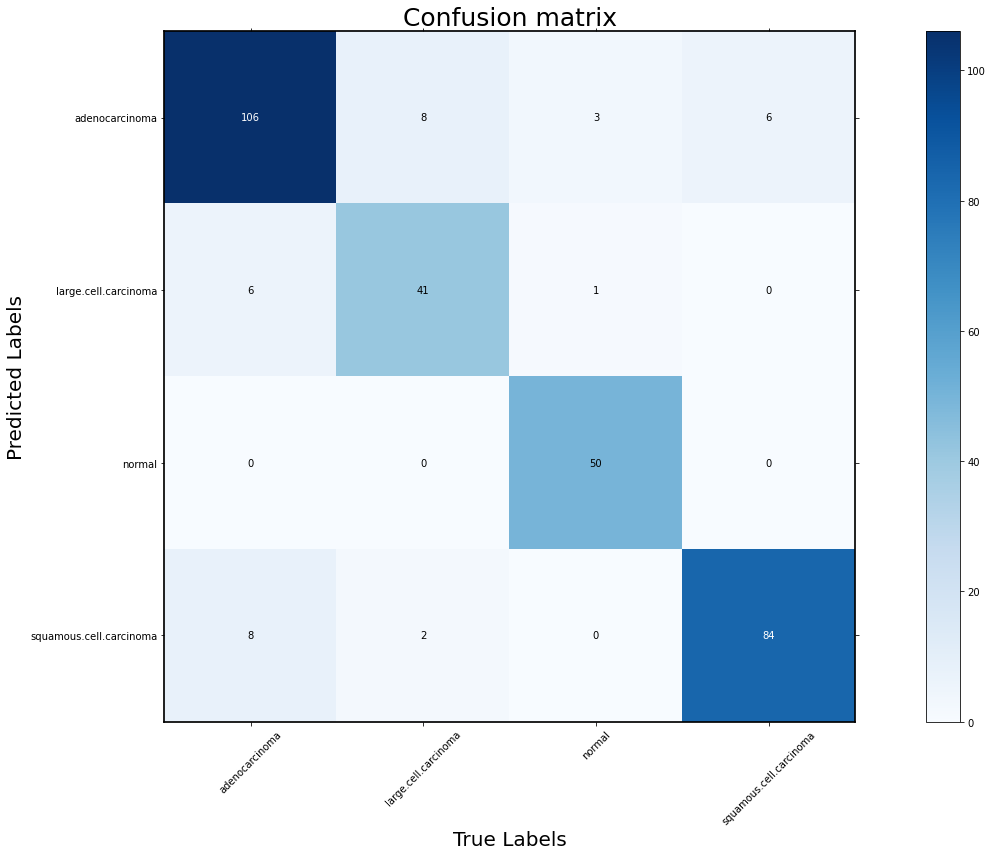

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.862   | 0.883  |    0.913    |  0.872   |
|   large.cell.carcinoma  |   0.854   | 0.804  |    0.973    |  0.828   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.894   | 0.933  |    0.956    |  0.913   |
+-------------------------+-----------+--------+-------------+----------+


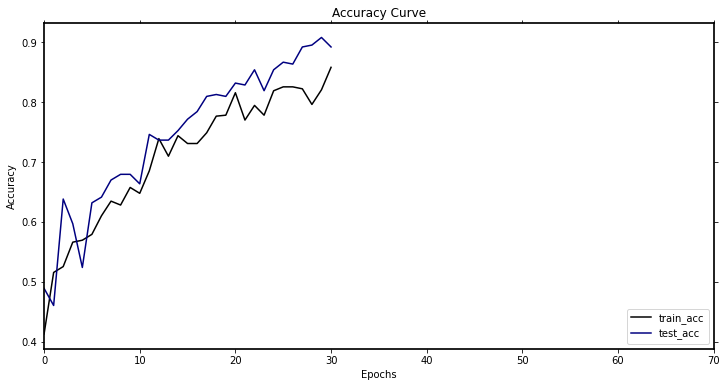

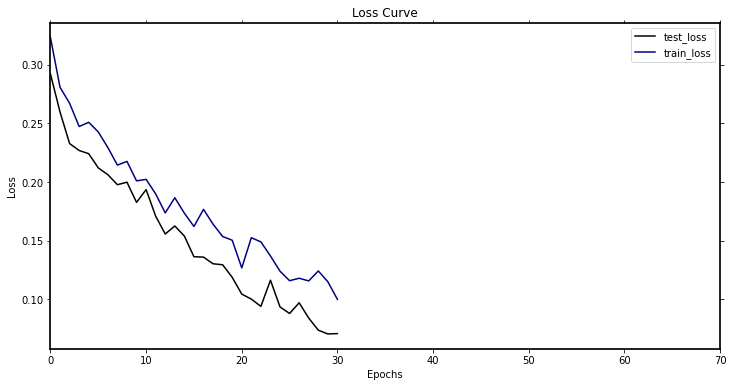

-----------第32轮训练开始-----------
训练次数：4928, 训练集正确率: 0.8499184339314845, Loss：61.977792704477906
第 32 轮测试集上的toal_Loss: 22.60803307965398, 正确率： 0.8888888888888888
Top-1准确率为:{} 0.9079365079365079
[[102.   6.   3.   6.]
 [  9.  44.   0.   1.]
 [  0.   0.  51.   0.]
 [  9.   1.   0.  83.]]


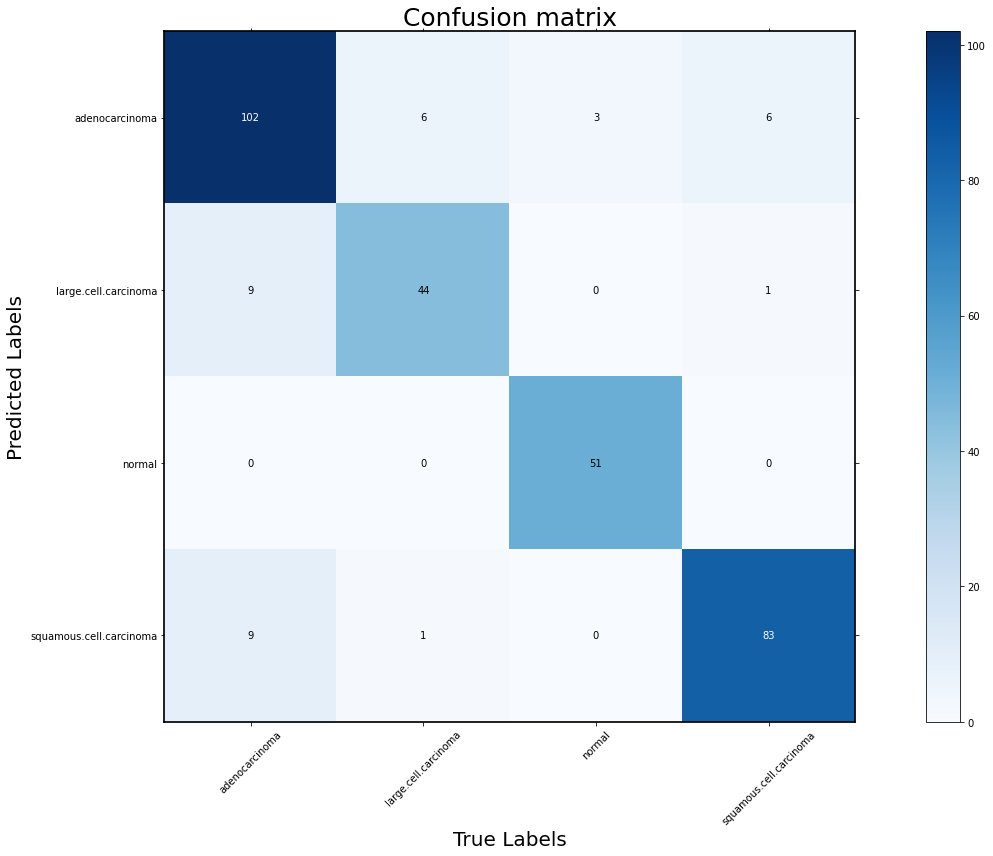

the model accuracy is  0.889
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.872   |  0.85  |    0.923    |  0.861   |
|   large.cell.carcinoma  |   0.815   | 0.863  |    0.962    |  0.838   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.892   | 0.922  |    0.956    |  0.907   |
+-------------------------+-----------+--------+-------------+----------+


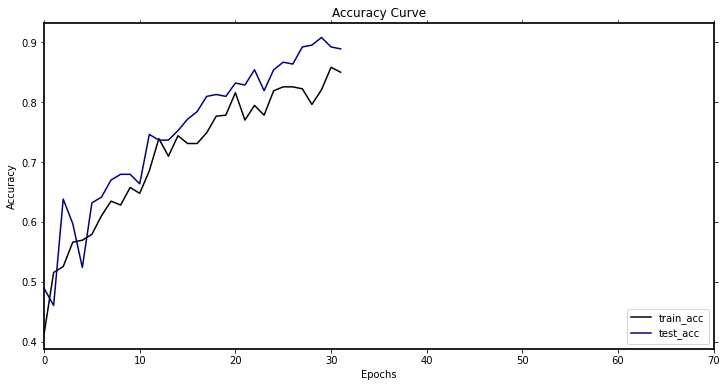

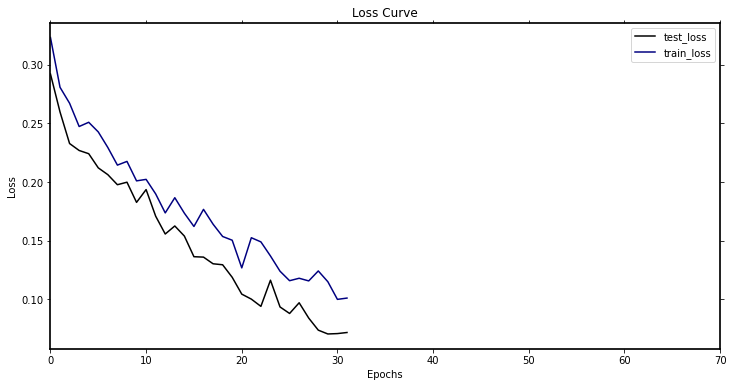

-----------第33轮训练开始-----------
训练次数：5082, 训练集正确率: 0.8401305057096248, Loss：68.91512332484126
第 33 轮测试集上的toal_Loss: 23.22807251755148, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.9079365079365079
[[108.  11.   4.   6.]
 [  5.  39.   0.   0.]
 [  0.   0.  50.   0.]
 [  7.   1.   0.  84.]]


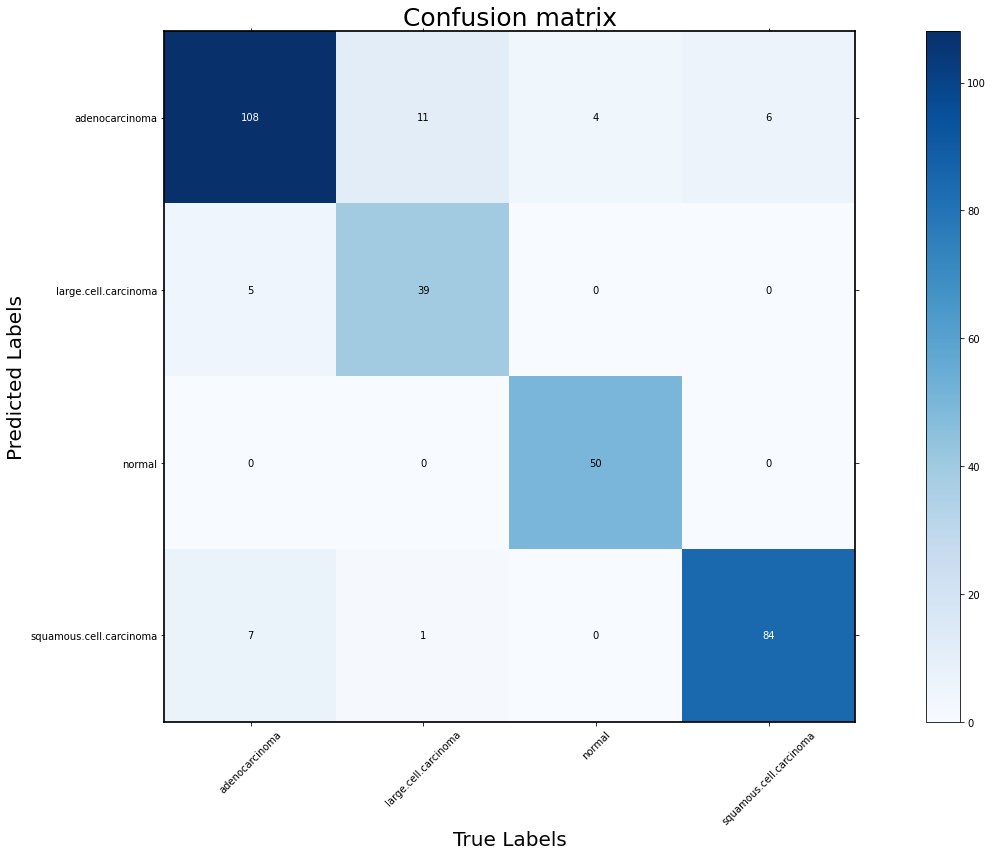

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.837   |  0.9   |    0.892    |  0.867   |
|   large.cell.carcinoma  |   0.886   | 0.765  |    0.981    |  0.821   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.913   | 0.933  |    0.964    |  0.923   |
+-------------------------+-----------+--------+-------------+----------+


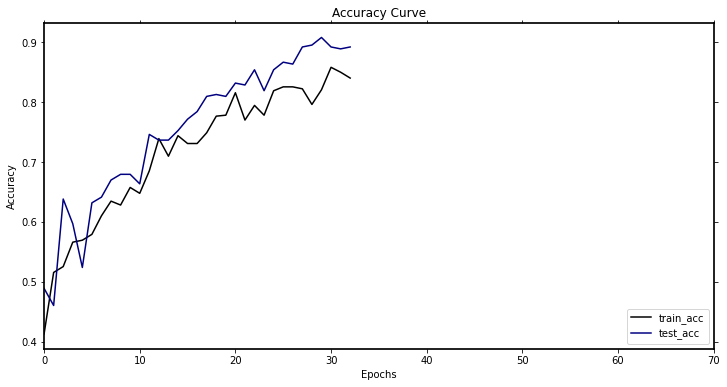

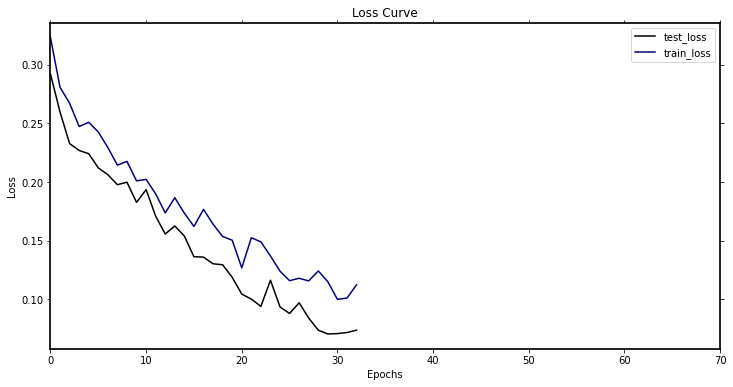

-----------第34轮训练开始-----------
训练次数：5236, 训练集正确率: 0.8564437194127243, Loss：61.20623189024627
第 34 轮测试集上的toal_Loss: 24.407644796650857, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.9079365079365079
[[101.   6.   3.   2.]
 [  7.  42.   0.   0.]
 [  0.   0.  50.   0.]
 [ 12.   3.   1.  88.]]


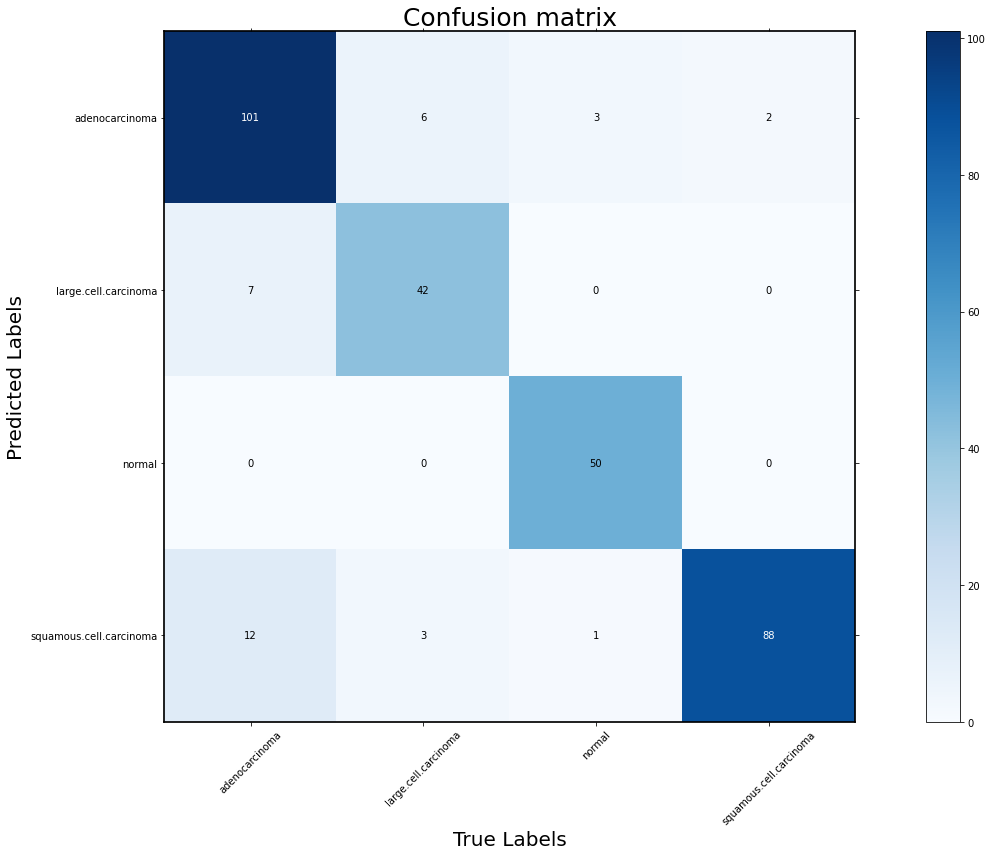

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.902   | 0.842  |    0.944    |  0.871   |
|   large.cell.carcinoma  |   0.857   | 0.824  |    0.973    |   0.84   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.846   | 0.978  |    0.929    |  0.907   |
+-------------------------+-----------+--------+-------------+----------+


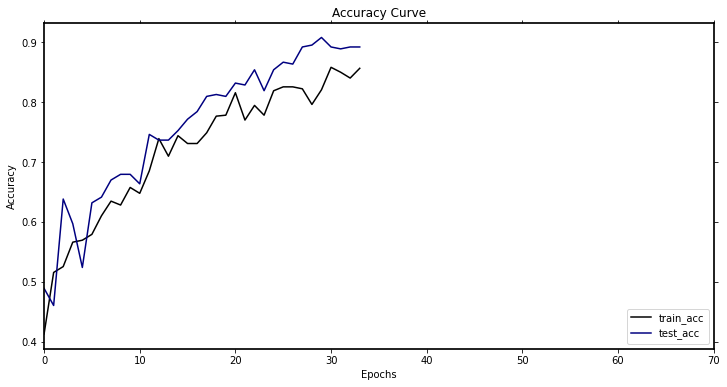

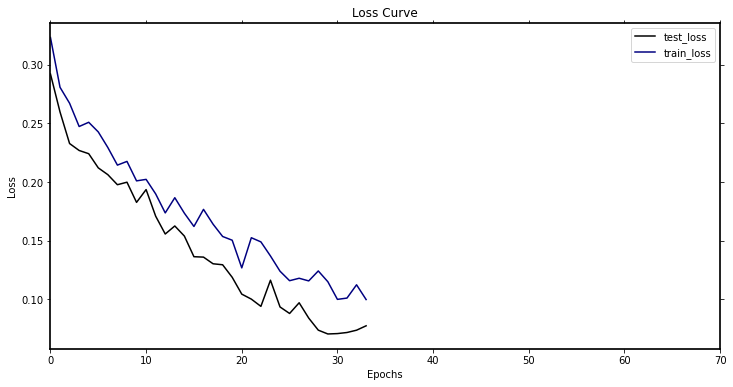

-----------第35轮训练开始-----------
训练次数：5390, 训练集正确率: 0.833605220228385, Loss：67.21306599117815
第 35 轮测试集上的toal_Loss: 21.201919213403016, 正确率： 0.8888888888888888
Top-1准确率为:{} 0.9079365079365079
[[104.   6.   1.   6.]
 [  7.  43.   0.   1.]
 [  0.   0.  50.   0.]
 [  9.   2.   3.  83.]]


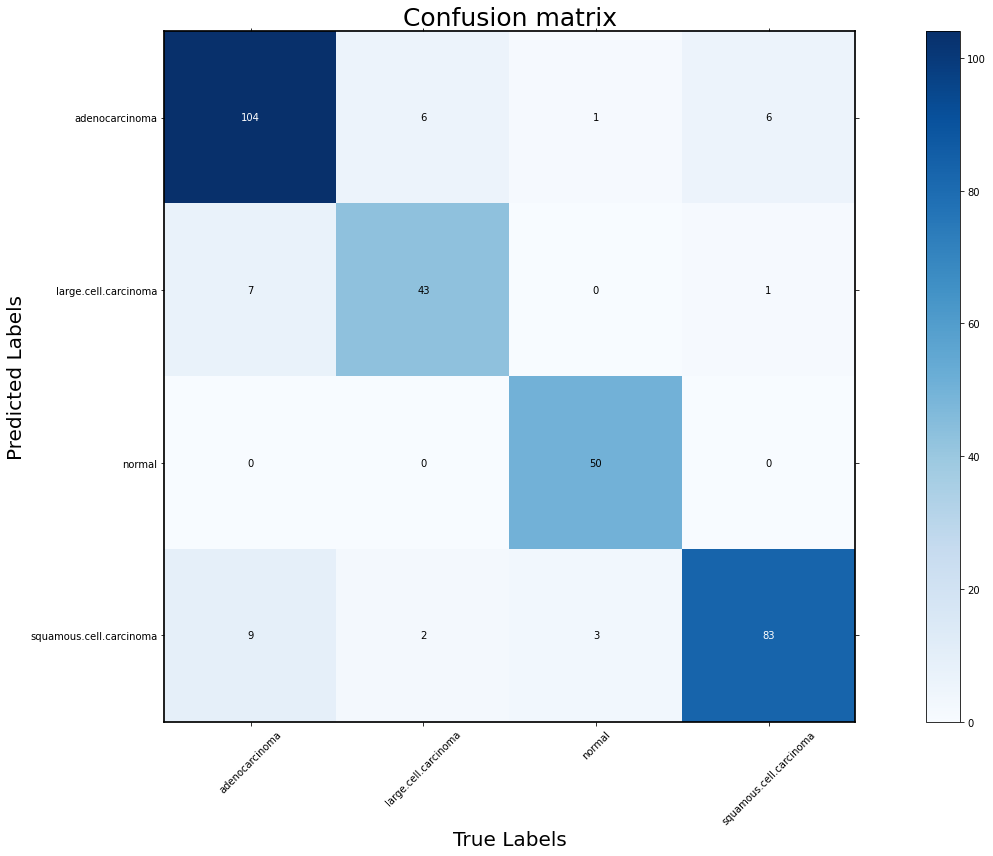

the model accuracy is  0.889
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.889   | 0.867  |    0.933    |  0.878   |
|   large.cell.carcinoma  |   0.843   | 0.843  |     0.97    |  0.843   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.856   | 0.922  |    0.938    |  0.888   |
+-------------------------+-----------+--------+-------------+----------+


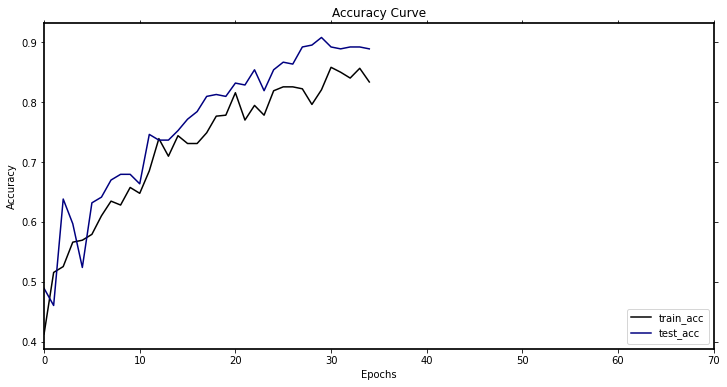

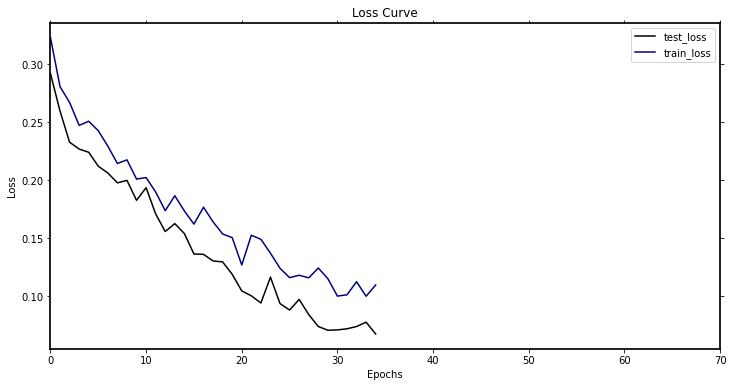

-----------第36轮训练开始-----------
训练次数：5544, 训练集正确率: 0.835236541598695, Loss：67.64890122134238
第 36 轮测试集上的toal_Loss: 23.643145355861634, 正确率： 0.8857142857142857
Top-1准确率为:{} 0.9079365079365079
[[99.  5.  3.  4.]
 [12. 46.  0.  2.]
 [ 0.  0. 50.  0.]
 [ 9.  0.  1. 84.]]


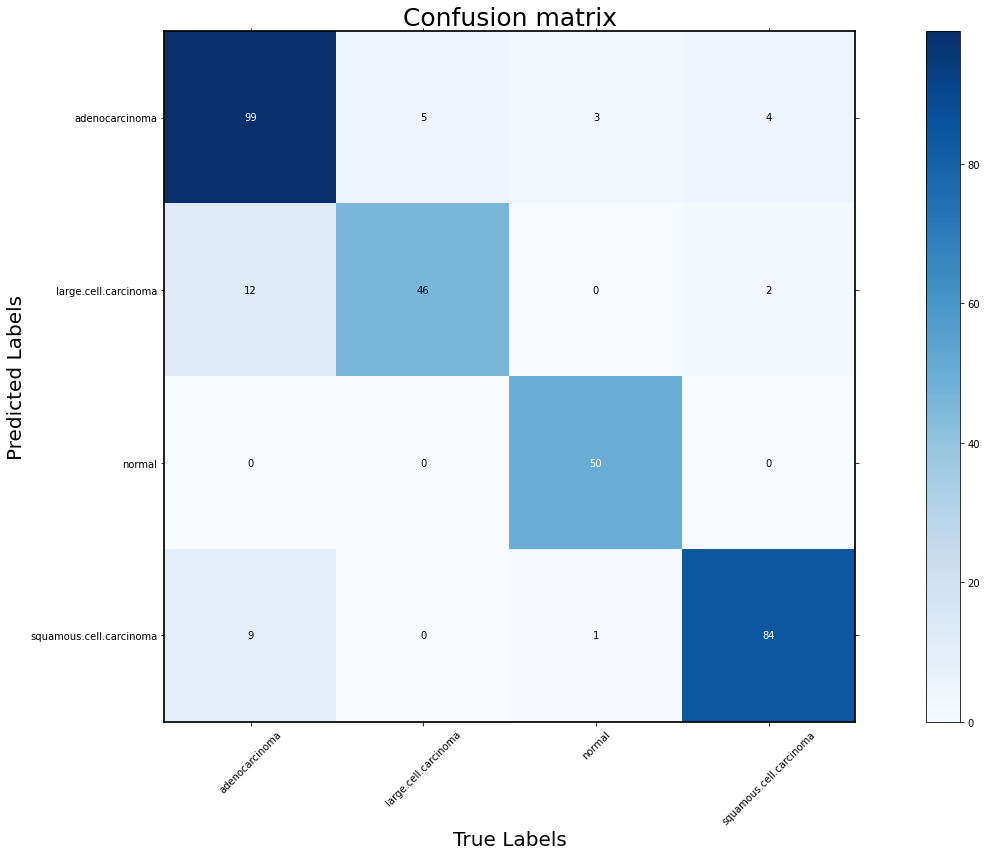

the model accuracy is  0.886
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.892   | 0.825  |    0.938    |  0.857   |
|   large.cell.carcinoma  |   0.767   | 0.902  |    0.947    |  0.829   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.894   | 0.933  |    0.956    |  0.913   |
+-------------------------+-----------+--------+-------------+----------+


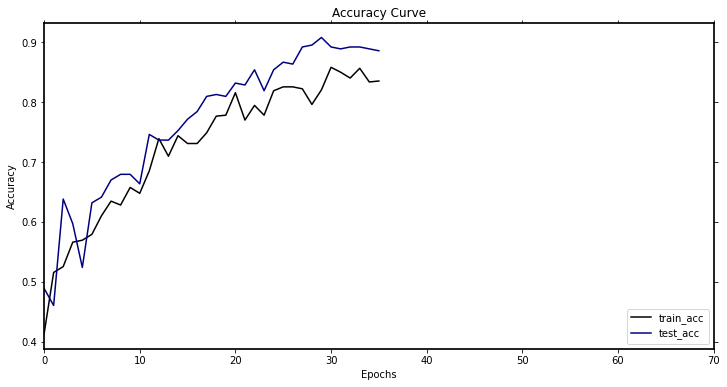

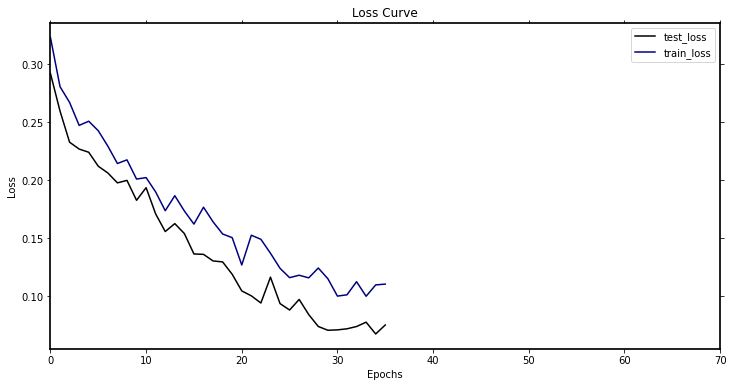

-----------第37轮训练开始-----------
训练次数：5698, 训练集正确率: 0.8303425774877651, Loss：65.65032898262143
第 37 轮测试集上的toal_Loss: 20.677186041139066, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.9111111111111111
[[107.   5.   2.   7.]
 [  8.  46.   0.   0.]
 [  0.   0.  52.   1.]
 [  5.   0.   0.  82.]]


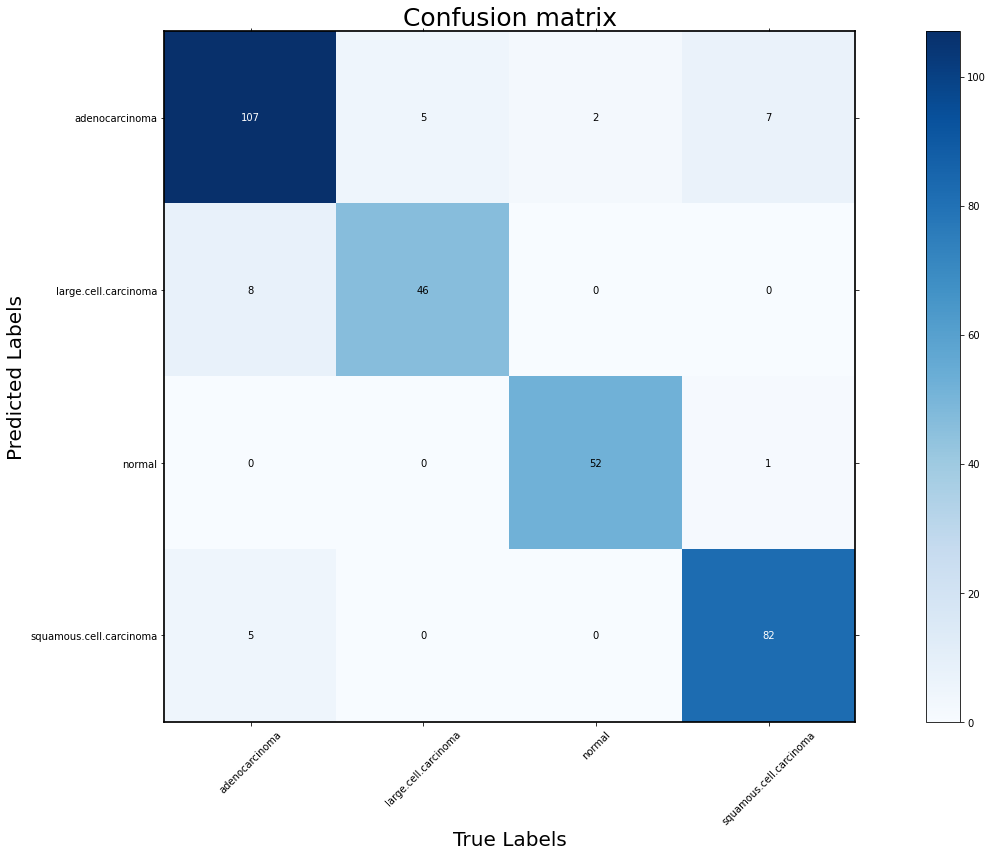

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.884   | 0.892  |    0.928    |  0.888   |
|   large.cell.carcinoma  |   0.852   | 0.902  |     0.97    |  0.876   |
|          normal         |   0.981   | 0.963  |    0.996    |  0.972   |
| squamous.cell.carcinoma |   0.943   | 0.911  |    0.978    |  0.927   |
+-------------------------+-----------+--------+-------------+----------+


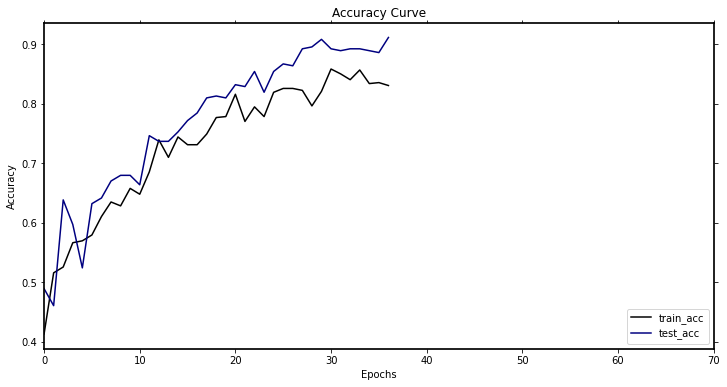

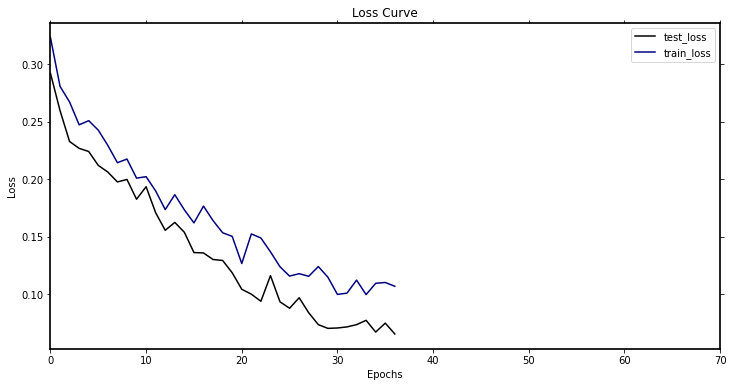

-----------第38轮训练开始-----------
训练次数：5852, 训练集正确率: 0.867862969004894, Loss：59.053628854453564
第 38 轮测试集上的toal_Loss: 27.89933532406576, 正确率： 0.8825396825396825
Top-1准确率为:{} 0.9111111111111111
[[93.  0.  2.  2.]
 [ 8. 47.  0.  0.]
 [ 0.  0. 50.  0.]
 [19.  4.  2. 88.]]


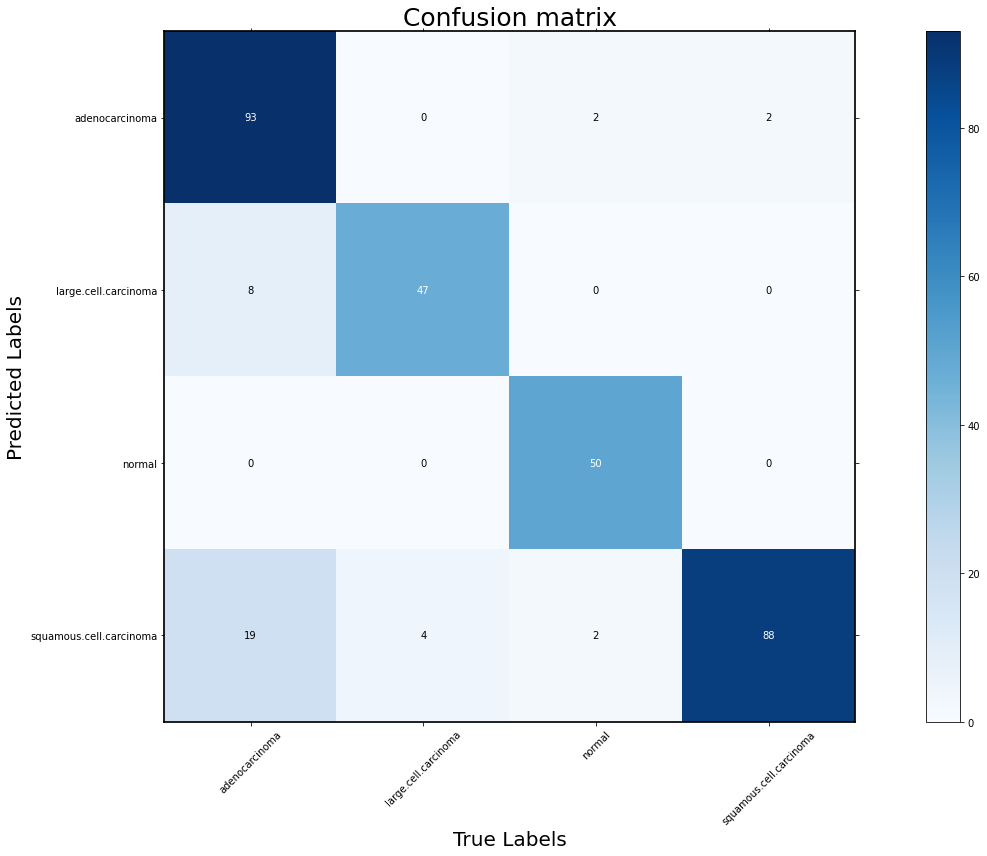

the model accuracy is  0.883
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.959   | 0.775  |    0.979    |  0.857   |
|   large.cell.carcinoma  |   0.855   | 0.922  |     0.97    |  0.887   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.779   | 0.978  |    0.889    |  0.867   |
+-------------------------+-----------+--------+-------------+----------+


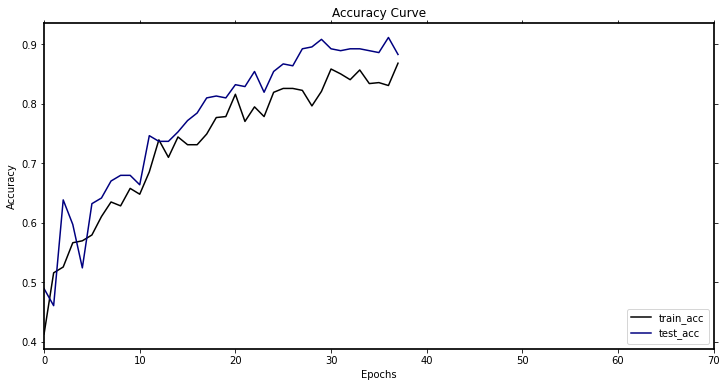

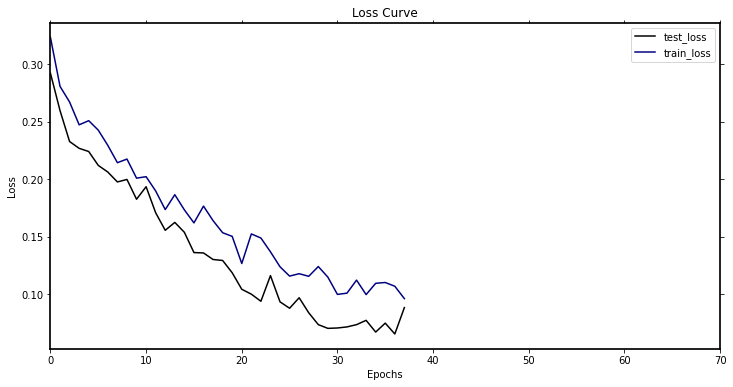

-----------第39轮训练开始-----------
训练次数：6006, 训练集正确率: 0.8482871125611745, Loss：61.29593035578728
第 39 轮测试集上的toal_Loss: 21.581111316103488, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9111111111111111
[[112.   8.   2.  10.]
 [  7.  43.   0.   1.]
 [  0.   0.  52.   0.]
 [  1.   0.   0.  79.]]


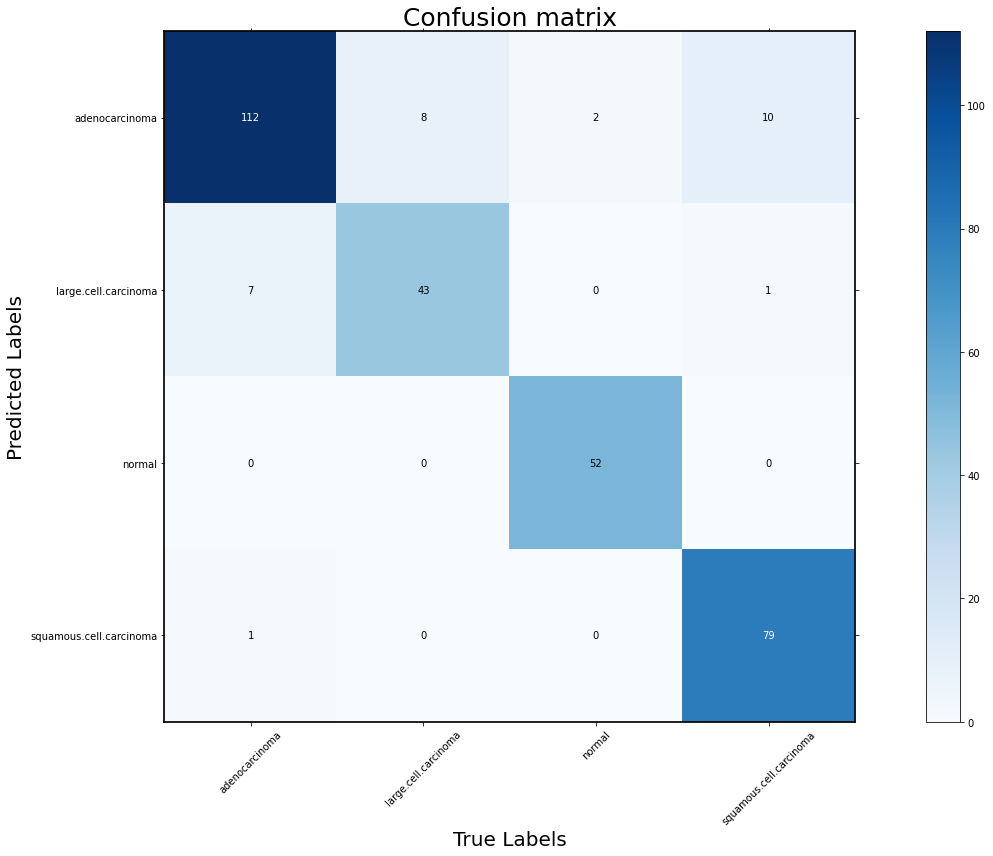

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.848   | 0.933  |    0.897    |  0.888   |
|   large.cell.carcinoma  |   0.843   | 0.843  |     0.97    |  0.843   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.988   | 0.878  |    0.996    |   0.93   |
+-------------------------+-----------+--------+-------------+----------+


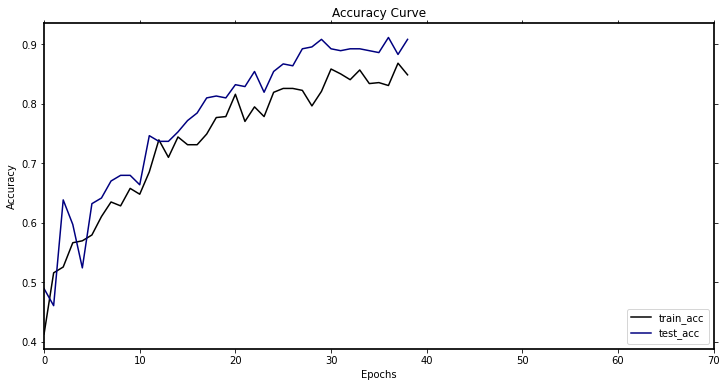

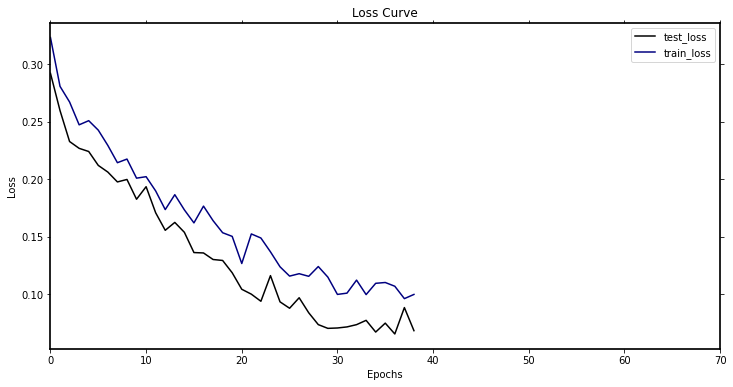

-----------第40轮训练开始-----------
训练次数：6160, 训练集正确率: 0.833605220228385, Loss：65.73006836511195
第 40 轮测试集上的toal_Loss: 20.67213520919904, 正确率： 0.9047619047619048
Top-1准确率为:{} 0.9111111111111111
[[106.   7.   4.   4.]
 [  7.  43.   0.   0.]
 [  0.   0.  50.   0.]
 [  7.   1.   0.  86.]]


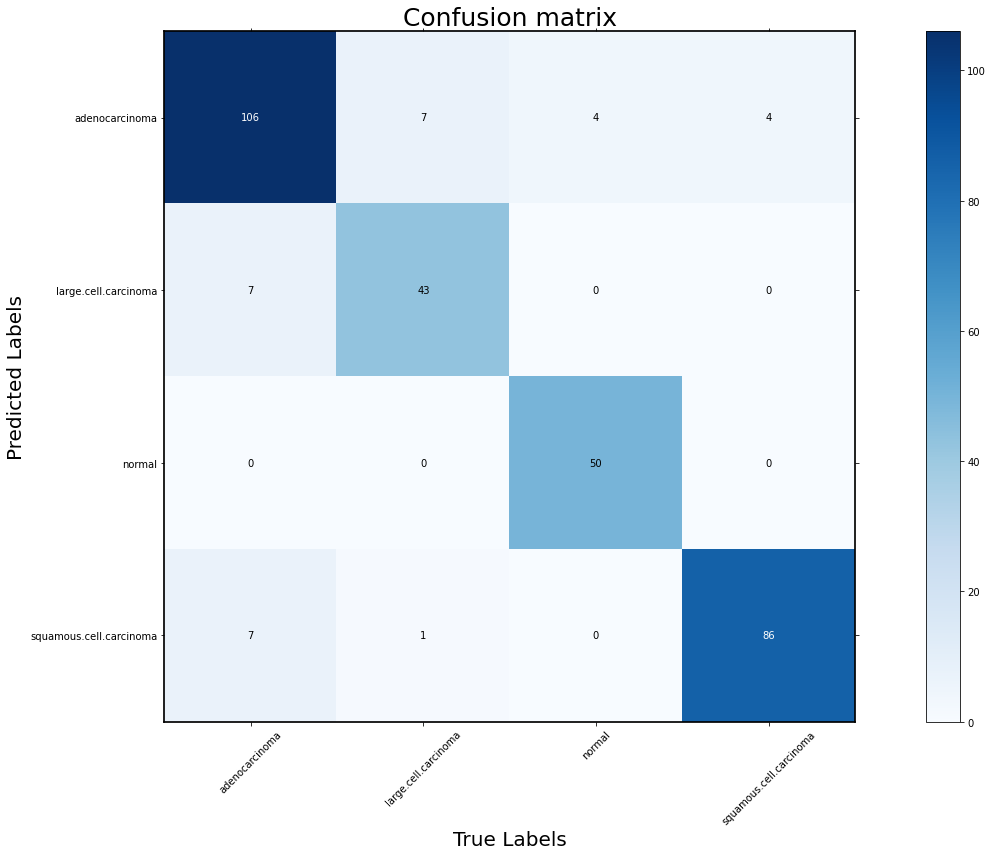

the model accuracy is  0.905
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.876   | 0.883  |    0.923    |  0.879   |
|   large.cell.carcinoma  |    0.86   | 0.843  |    0.973    |  0.851   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.915   | 0.956  |    0.964    |  0.935   |
+-------------------------+-----------+--------+-------------+----------+


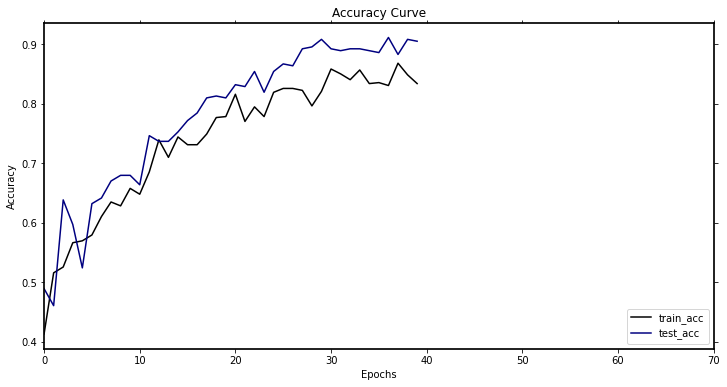

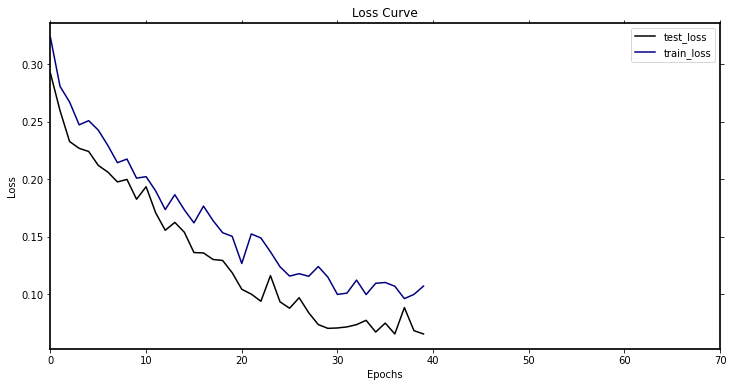

-----------第41轮训练开始-----------
训练次数：6314, 训练集正确率: 0.8580750407830342, Loss：62.077393426559865
第 41 轮测试集上的toal_Loss: 25.163062503561378, 正确率： 0.8793650793650793
Top-1准确率为:{} 0.9111111111111111
[[93.  2.  2.  3.]
 [12. 47.  1.  0.]
 [ 0.  0. 50.  0.]
 [15.  2.  1. 87.]]


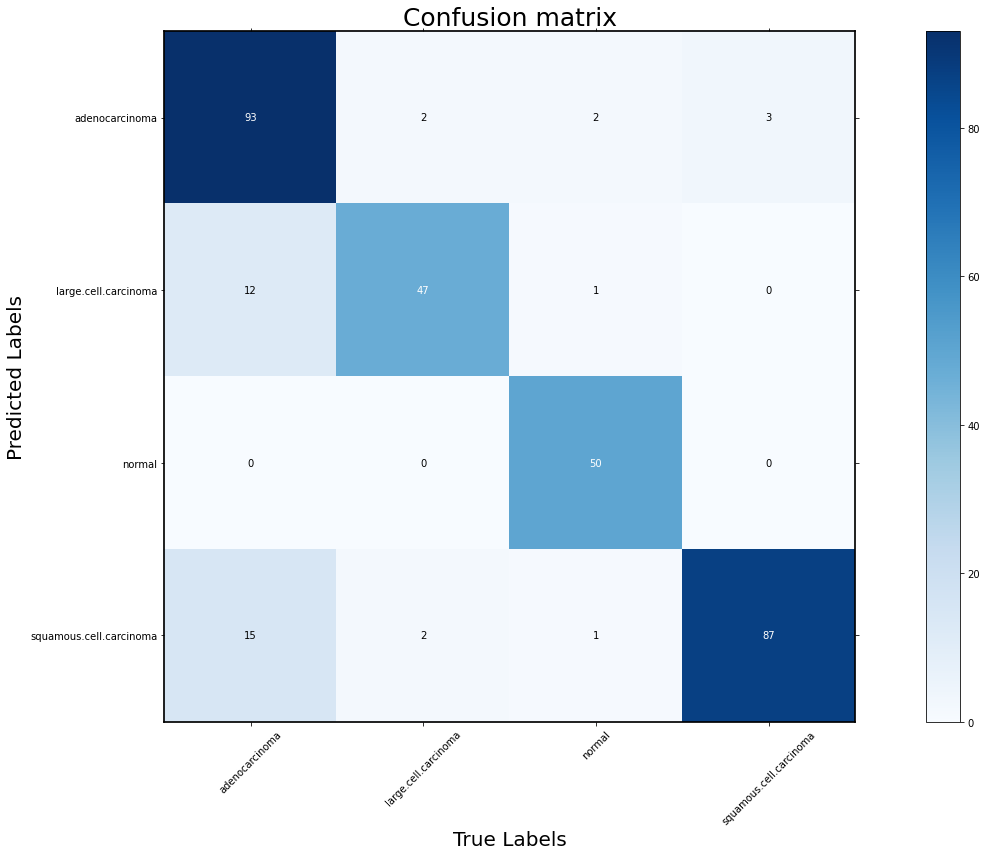

the model accuracy is  0.879
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.93   | 0.775  |    0.964    |  0.845   |
|   large.cell.carcinoma  |   0.783   | 0.922  |    0.951    |  0.847   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.829   | 0.967  |     0.92    |  0.893   |
+-------------------------+-----------+--------+-------------+----------+


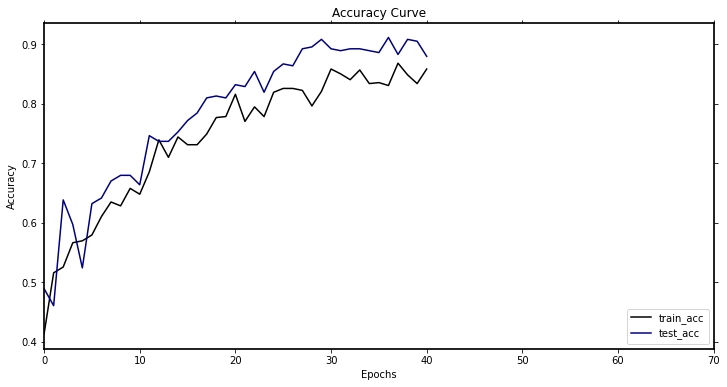

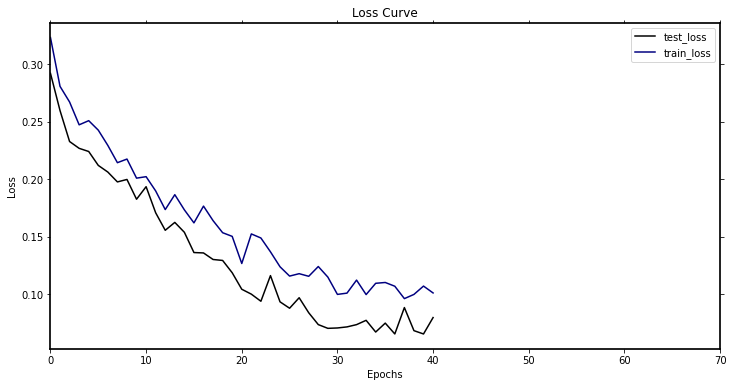

-----------第42轮训练开始-----------
训练次数：6468, 训练集正确率: 0.8743882544861338, Loss：61.92086825333536
第 42 轮测试集上的toal_Loss: 23.044563595671207, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.9111111111111111
[[102.   6.   4.   4.]
 [  5.  43.   0.   0.]
 [  0.   0.  50.   0.]
 [ 13.   2.   0.  86.]]


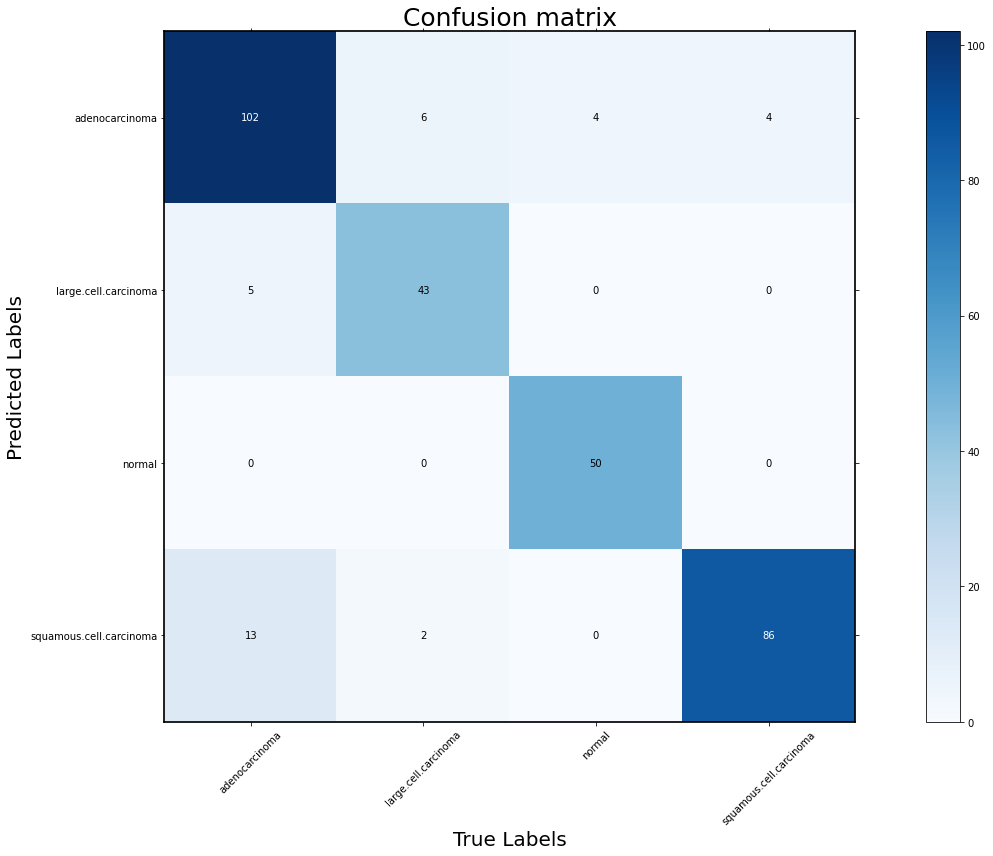

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.879   |  0.85  |    0.928    |  0.864   |
|   large.cell.carcinoma  |   0.896   | 0.843  |    0.981    |  0.869   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.851   | 0.956  |    0.933    |   0.9    |
+-------------------------+-----------+--------+-------------+----------+


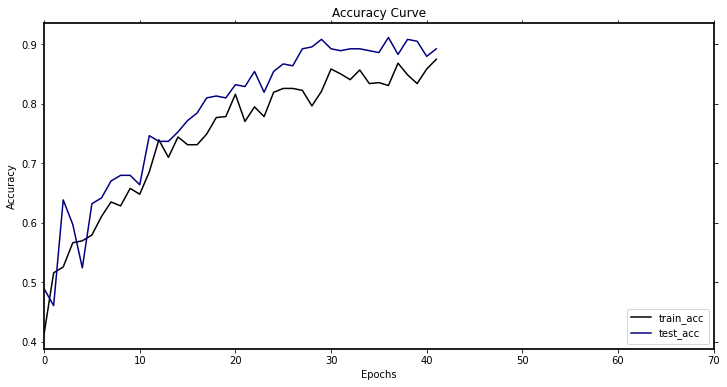

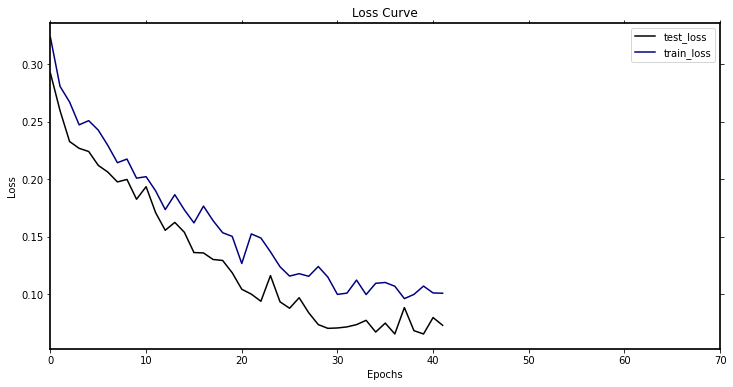

-----------第43轮训练开始-----------
训练次数：6622, 训练集正确率: 0.867862969004894, Loss：55.58326445706189
第 43 轮测试集上的toal_Loss: 20.39134955452755, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9111111111111111
[[106.   4.   4.   7.]
 [  7.  45.   0.   1.]
 [  0.   0.  50.   0.]
 [  7.   2.   0.  82.]]


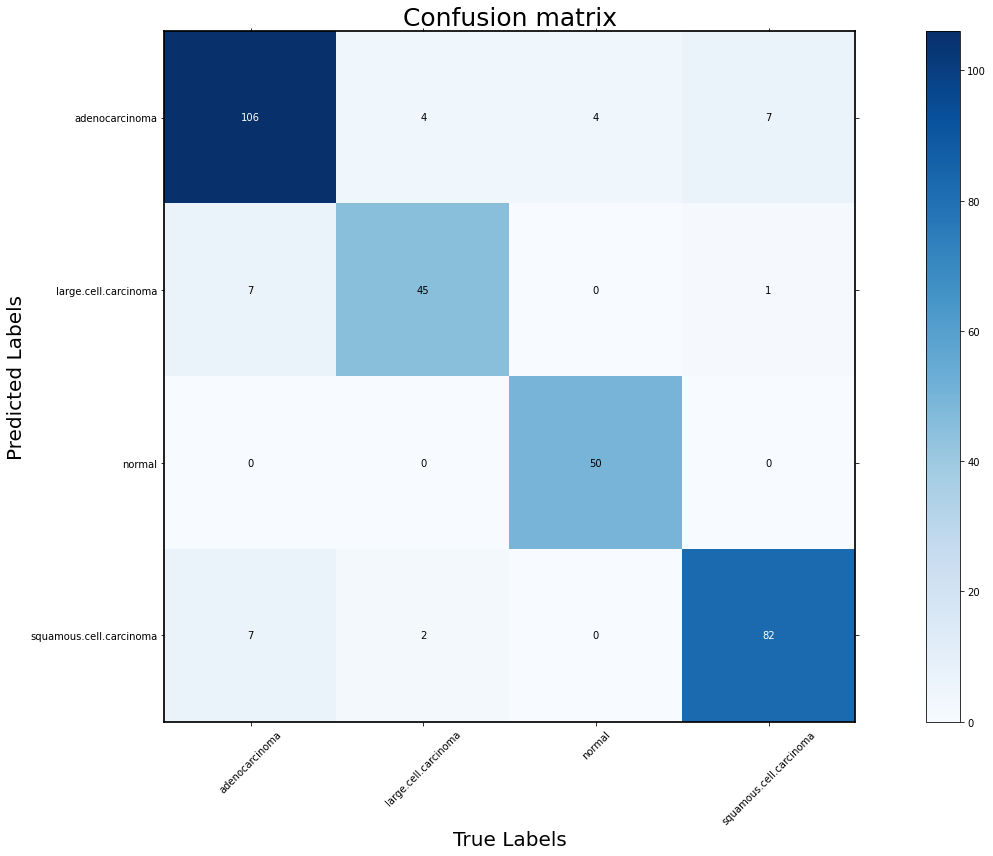

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.876   | 0.883  |    0.923    |  0.879   |
|   large.cell.carcinoma  |   0.849   | 0.882  |     0.97    |  0.865   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.901   | 0.911  |     0.96    |  0.906   |
+-------------------------+-----------+--------+-------------+----------+


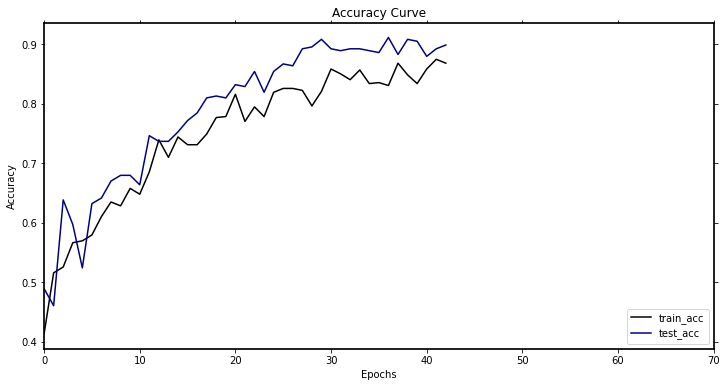

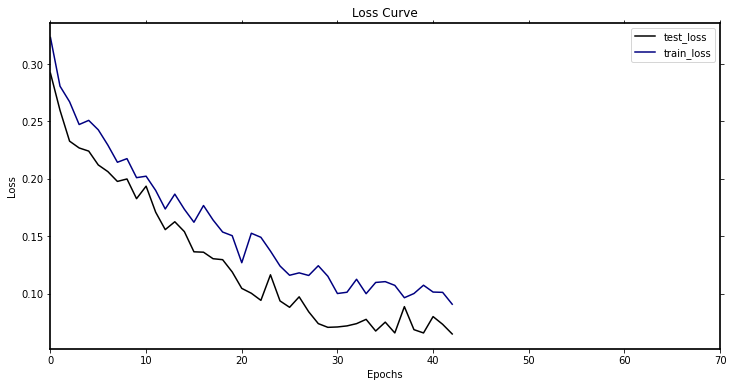

-----------第44轮训练开始-----------
训练次数：6776, 训练集正确率: 0.8564437194127243, Loss：57.14995322935283
第 44 轮测试集上的toal_Loss: 20.86247768579051, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9111111111111111
[[109.   9.   3.   7.]
 [  7.  41.   0.   0.]
 [  0.   0.  50.   0.]
 [  4.   1.   1.  83.]]


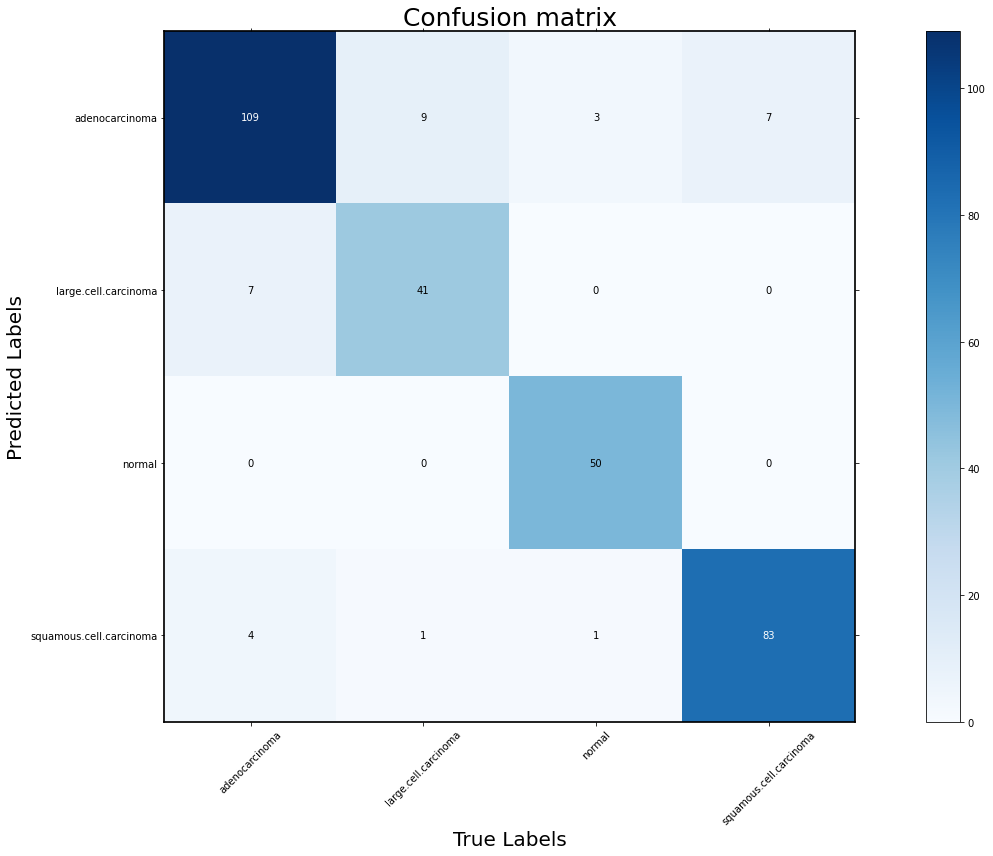

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.852   | 0.908  |    0.903    |  0.879   |
|   large.cell.carcinoma  |   0.854   | 0.804  |    0.973    |  0.828   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.933   | 0.922  |    0.973    |  0.927   |
+-------------------------+-----------+--------+-------------+----------+


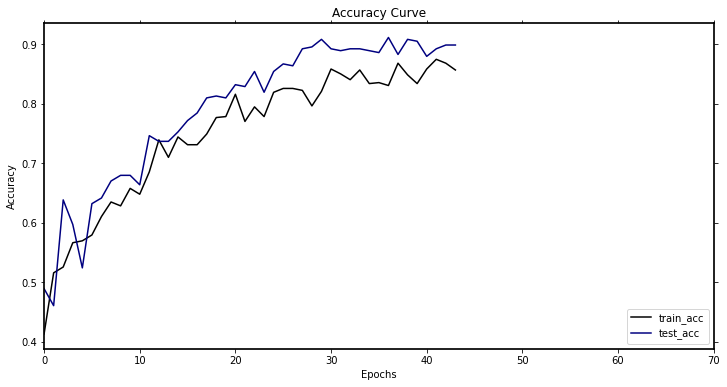

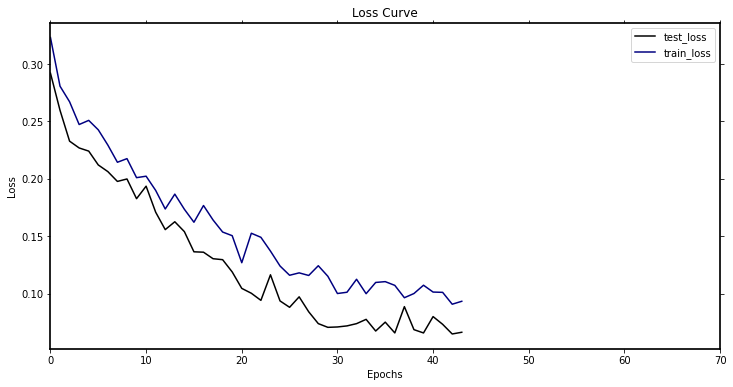

-----------第45轮训练开始-----------
训练次数：6930, 训练集正确率: 0.8776508972267537, Loss：56.84244165197015
第 45 轮测试集上的toal_Loss: 21.88440832402557, 正确率： 0.9015873015873016
Top-1准确率为:{} 0.9111111111111111
[[105.   5.   4.   3.]
 [  5.  42.   0.   0.]
 [  0.   0.  50.   0.]
 [ 10.   4.   0.  87.]]


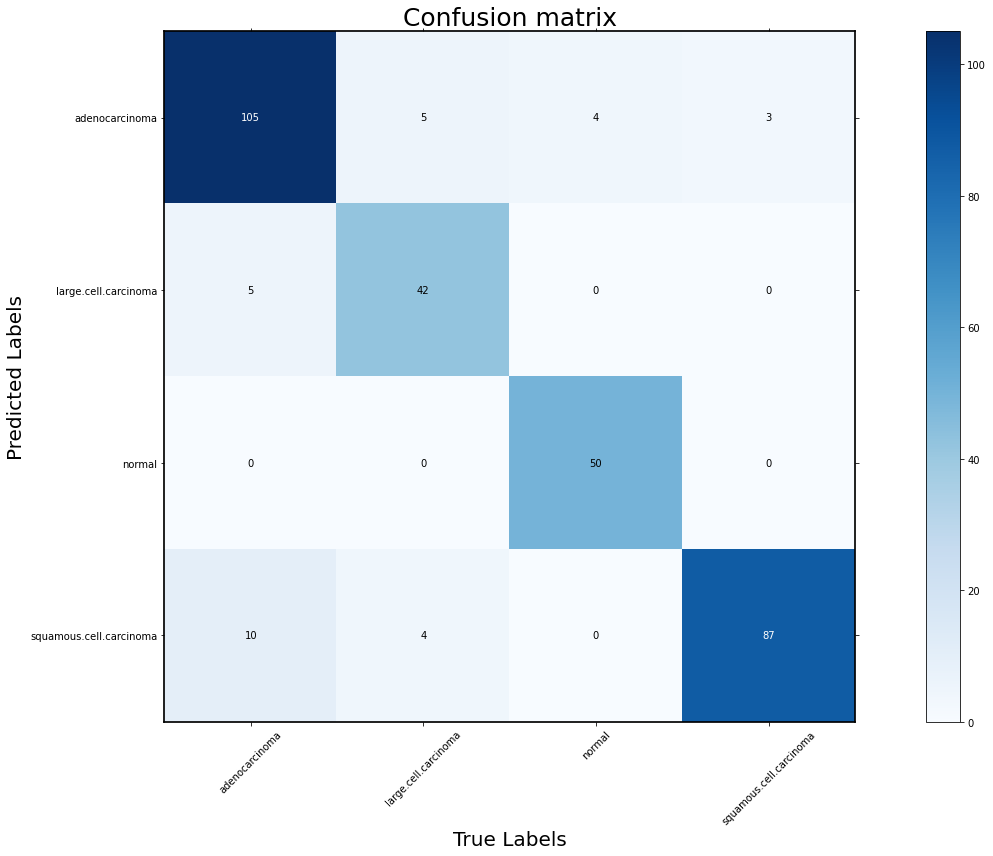

the model accuracy is  0.902
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.897   | 0.875  |    0.938    |  0.886   |
|   large.cell.carcinoma  |   0.894   | 0.824  |    0.981    |  0.858   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.861   | 0.967  |    0.938    |  0.911   |
+-------------------------+-----------+--------+-------------+----------+


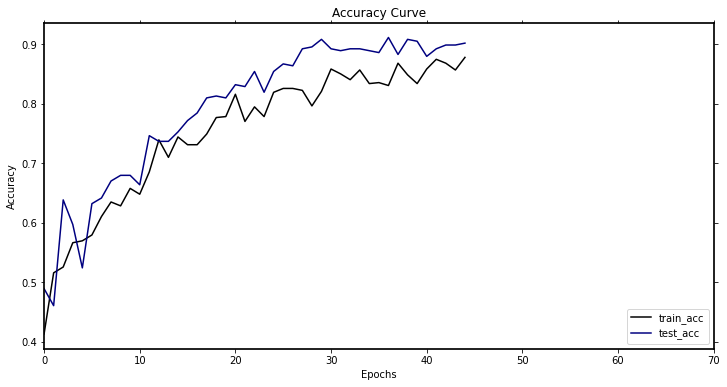

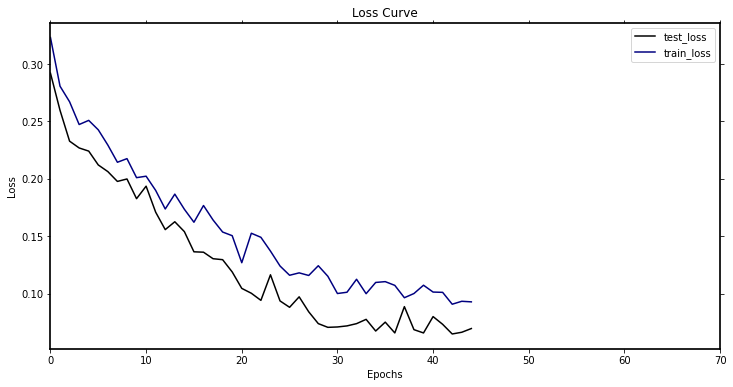

-----------第46轮训练开始-----------
训练次数：7084, 训练集正确率: 0.8613376835236541, Loss：59.33398674055934
第 46 轮测试集上的toal_Loss: 19.928152177482843, 正确率： 0.9238095238095239
Top-1准确率为:{} 0.9238095238095239
[[108.   5.   1.   6.]
 [  7.  46.   0.   0.]
 [  0.   0.  53.   0.]
 [  5.   0.   0.  84.]]


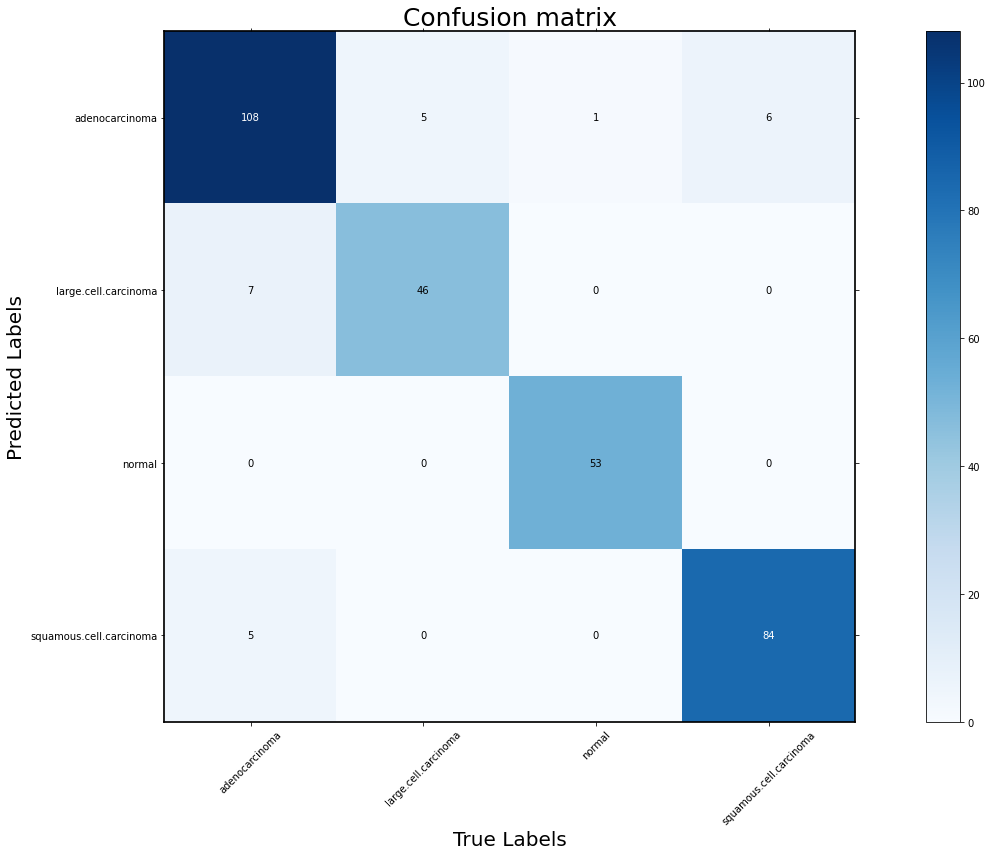

the model accuracy is  0.924
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.9    |  0.9   |    0.938    |   0.9    |
|   large.cell.carcinoma  |   0.868   | 0.902  |    0.973    |  0.885   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.944   | 0.933  |    0.978    |  0.938   |
+-------------------------+-----------+--------+-------------+----------+


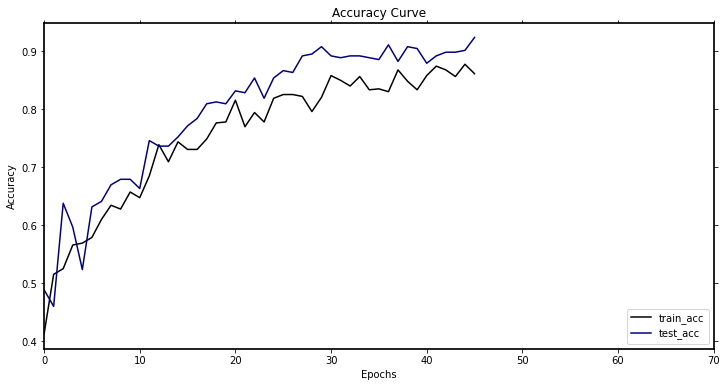

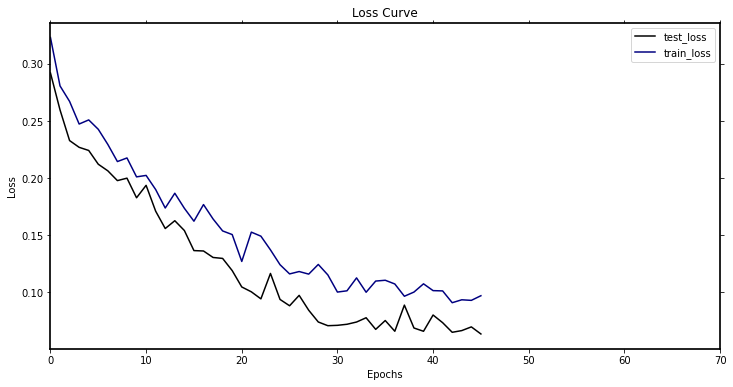

-----------第47轮训练开始-----------
训练次数：7238, 训练集正确率: 0.8482871125611745, Loss：65.7069385908544
第 47 轮测试集上的toal_Loss: 19.872384548187256, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[111.   7.   1.  10.]
 [  7.  44.   0.   0.]
 [  0.   0.  53.   0.]
 [  2.   0.   0.  80.]]


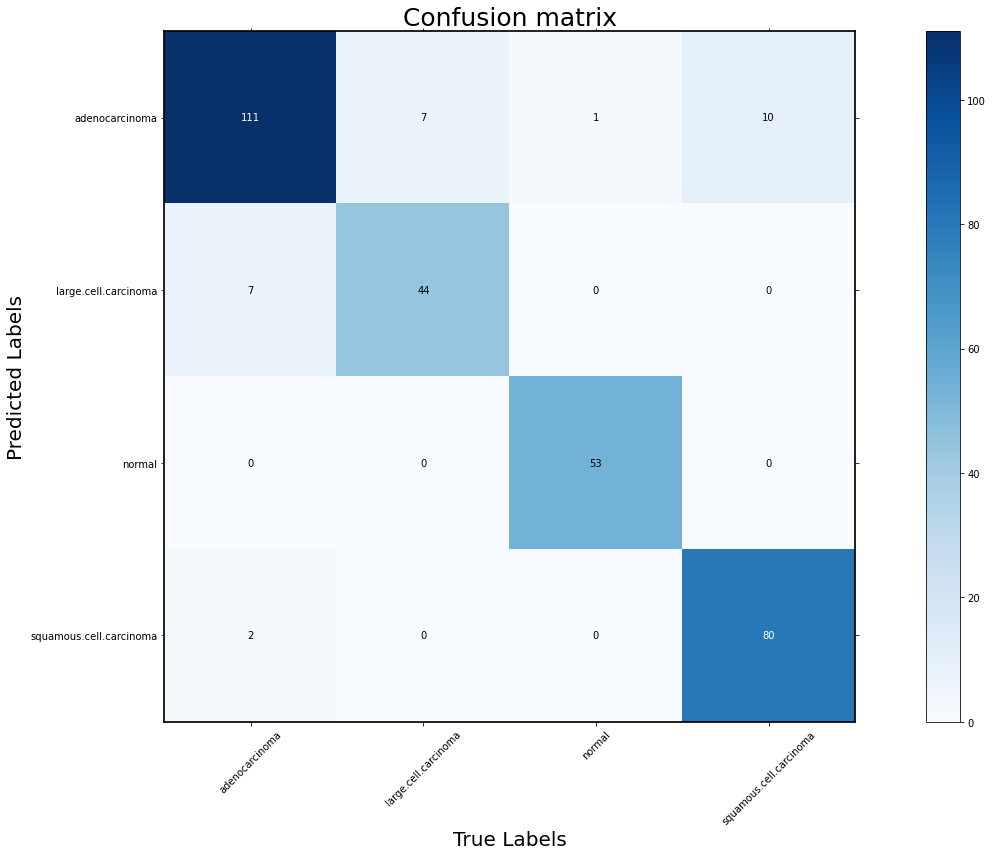

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.86   | 0.925  |    0.908    |  0.891   |
|   large.cell.carcinoma  |   0.863   | 0.863  |    0.973    |  0.863   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.976   | 0.889  |    0.991    |   0.93   |
+-------------------------+-----------+--------+-------------+----------+


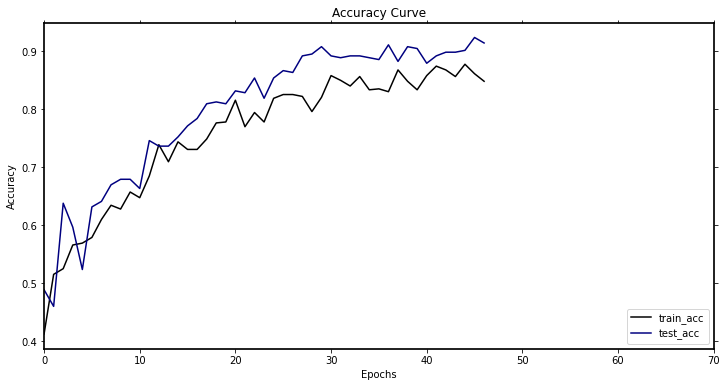

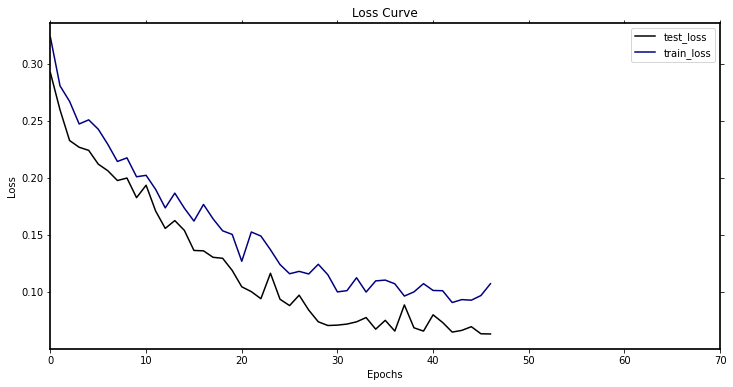

-----------第48轮训练开始-----------
训练次数：7392, 训练集正确率: 0.8499184339314845, Loss：65.62866629846394
第 48 轮测试集上的toal_Loss: 21.625819792971015, 正确率： 0.9238095238095239
Top-1准确率为:{} 0.9238095238095239
[[108.   4.   2.   6.]
 [ 10.  47.   0.   0.]
 [  0.   0.  52.   0.]
 [  2.   0.   0.  84.]]


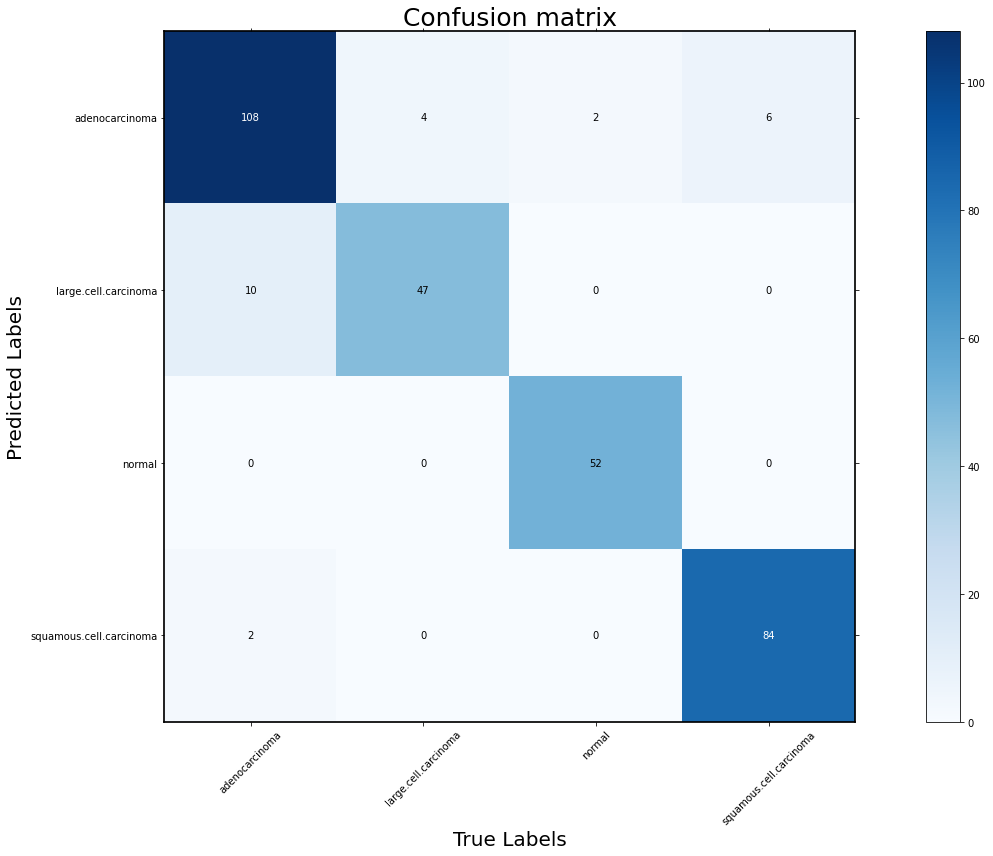

the model accuracy is  0.924
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.9    |  0.9   |    0.938    |   0.9    |
|   large.cell.carcinoma  |   0.825   | 0.922  |    0.962    |  0.871   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.977   | 0.933  |    0.991    |  0.954   |
+-------------------------+-----------+--------+-------------+----------+


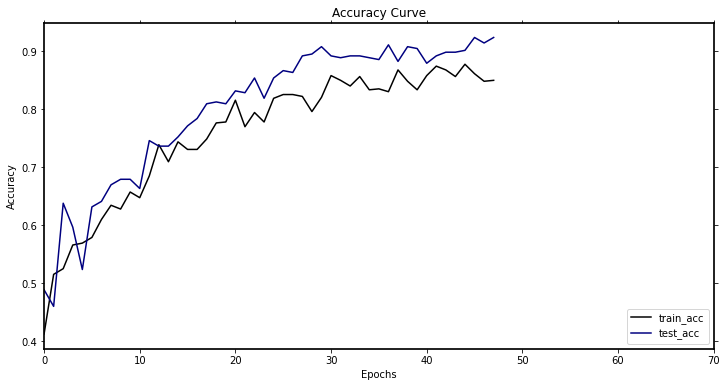

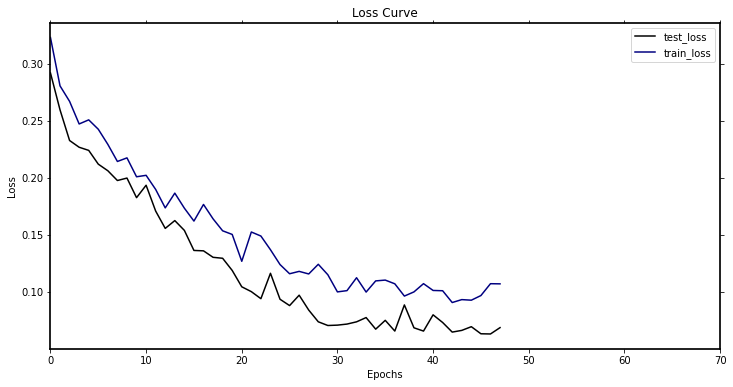

-----------第49轮训练开始-----------
训练次数：7546, 训练集正确率: 0.8646003262642741, Loss：59.91879261098802
第 49 轮测试集上的toal_Loss: 20.18194623081945, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.9238095238095239
[[108.   6.   3.   6.]
 [  6.  44.   0.   0.]
 [  0.   0.  51.   0.]
 [  6.   1.   0.  84.]]


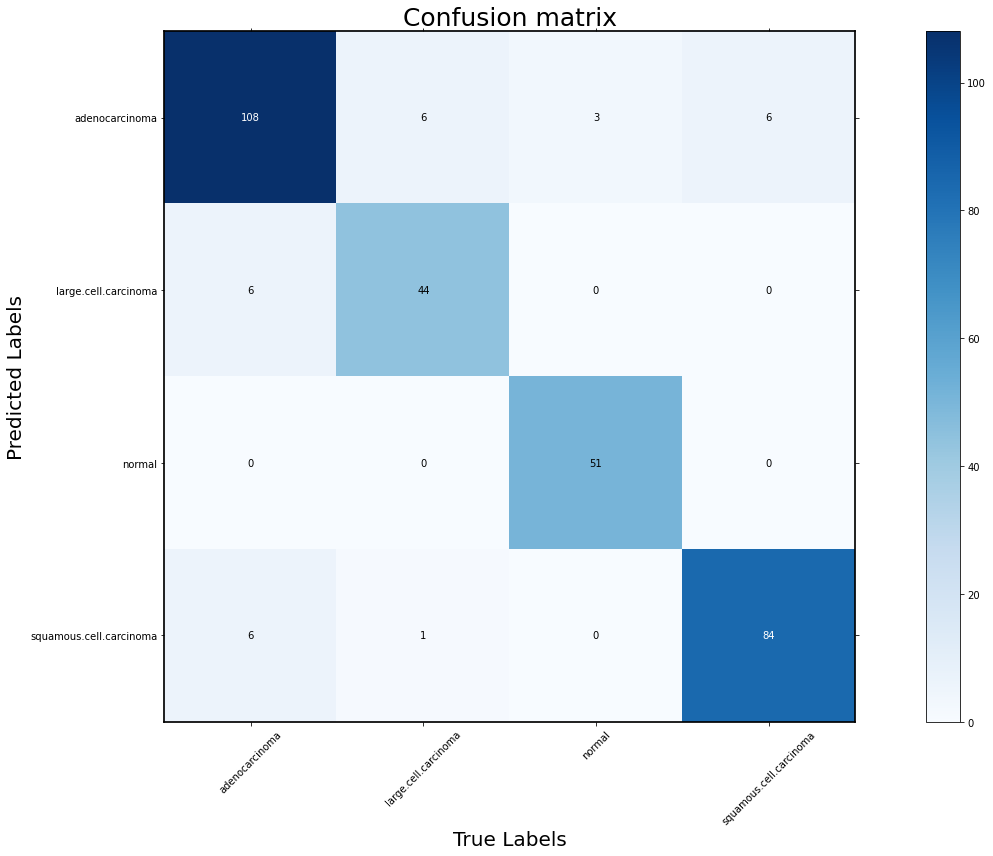

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.878   |  0.9   |    0.923    |  0.889   |
|   large.cell.carcinoma  |    0.88   | 0.863  |    0.977    |  0.871   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.923   | 0.933  |    0.969    |  0.928   |
+-------------------------+-----------+--------+-------------+----------+


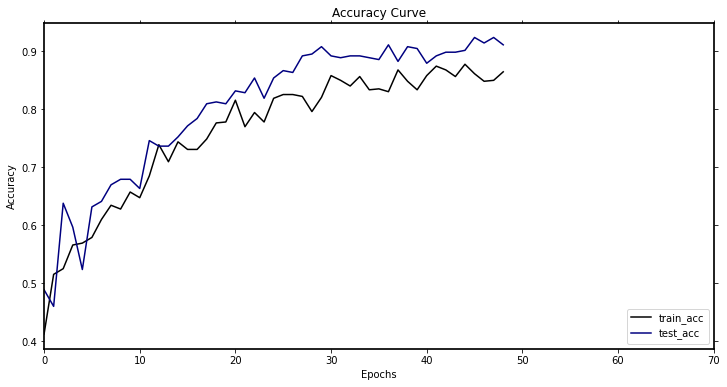

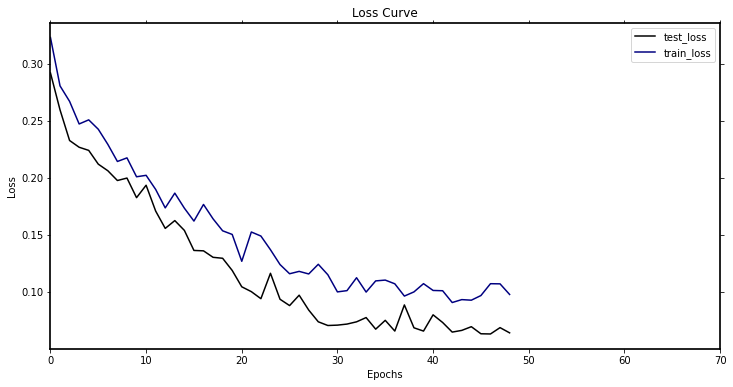

-----------第50轮训练开始-----------
训练次数：7700, 训练集正确率: 0.8646003262642741, Loss：52.29284597374499
第 50 轮测试集上的toal_Loss: 20.023154785856605, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[106.   5.   4.   5.]
 [  8.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [  6.   1.   0.  85.]]


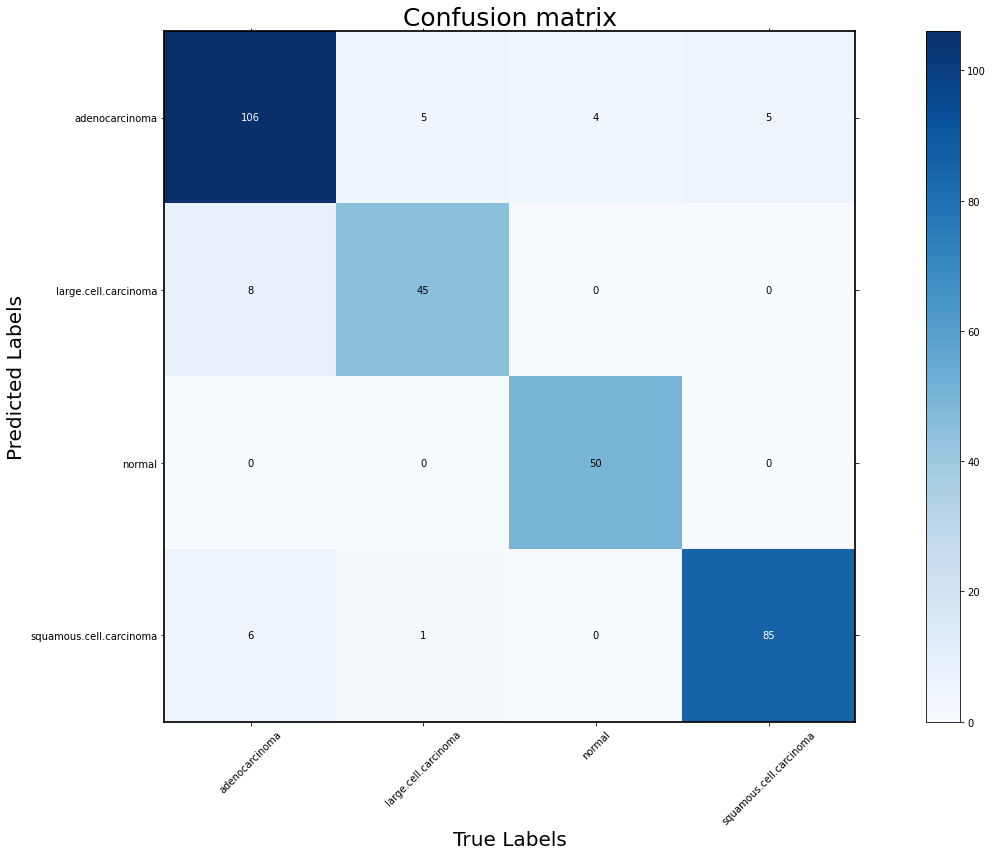

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.883   | 0.883  |    0.928    |  0.883   |
|   large.cell.carcinoma  |   0.849   | 0.882  |     0.97    |  0.865   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.924   | 0.944  |    0.969    |  0.934   |
+-------------------------+-----------+--------+-------------+----------+


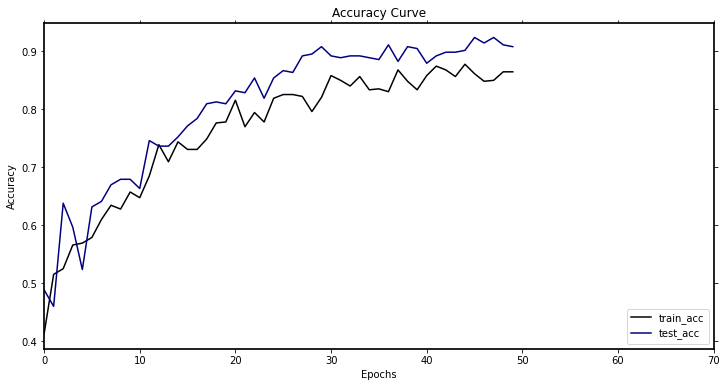

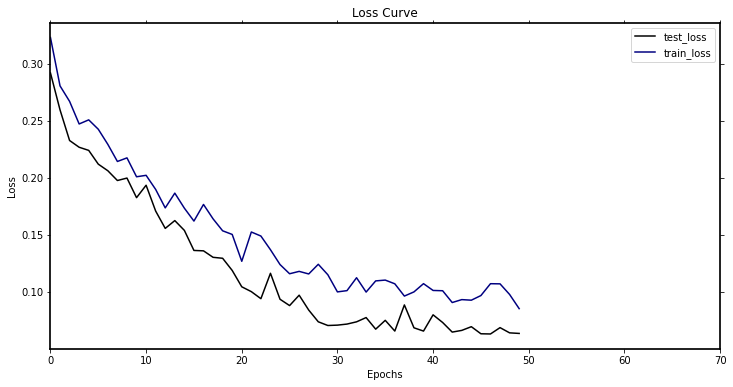

-----------第51轮训练开始-----------
训练次数：7854, 训练集正确率: 0.867862969004894, Loss：57.845364201813936
第 51 轮测试集上的toal_Loss: 21.48152887215838, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9238095238095239
[[100.   4.   2.   1.]
 [  6.  42.   0.   0.]
 [  0.   0.  52.   0.]
 [ 14.   5.   0.  89.]]


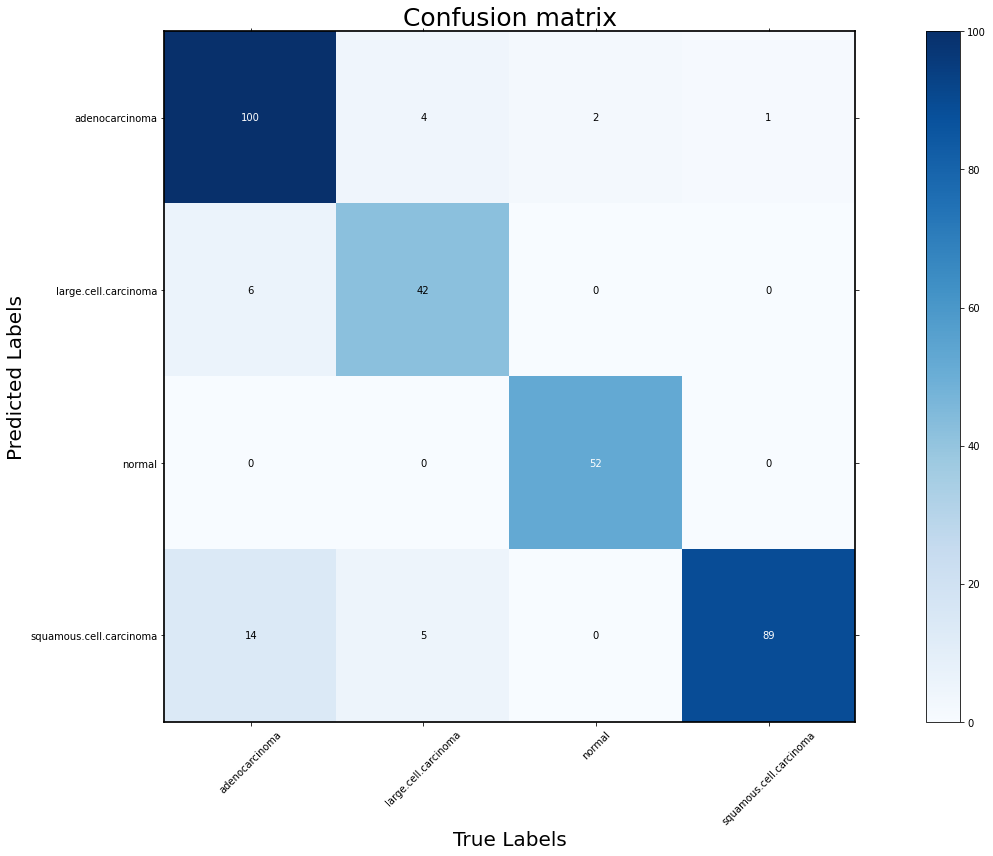

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.935   | 0.833  |    0.964    |  0.881   |
|   large.cell.carcinoma  |   0.875   | 0.824  |    0.977    |  0.849   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.824   | 0.989  |    0.916    |  0.899   |
+-------------------------+-----------+--------+-------------+----------+


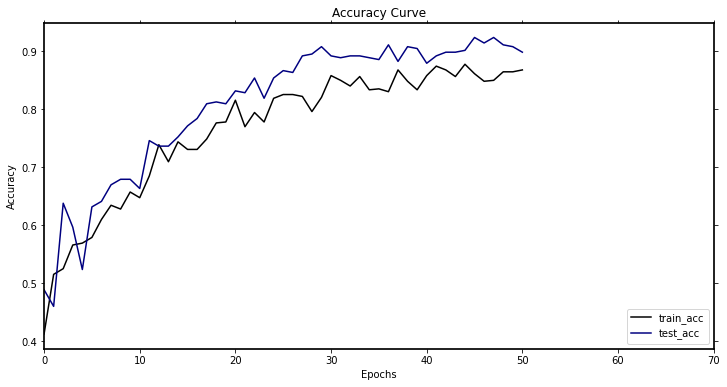

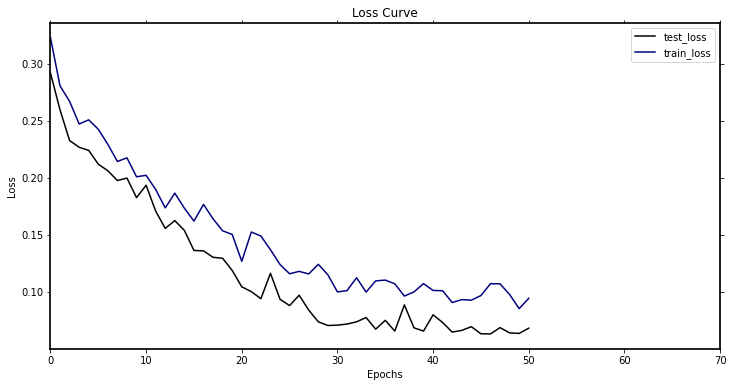

-----------第52轮训练开始-----------
训练次数：8008, 训练集正确率: 0.8580750407830342, Loss：61.11845554970205
第 52 轮测试集上的toal_Loss: 18.330280906520784, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[110.   5.   3.   7.]
 [  7.  46.   0.   1.]
 [  0.   0.  50.   0.]
 [  3.   0.   1.  82.]]


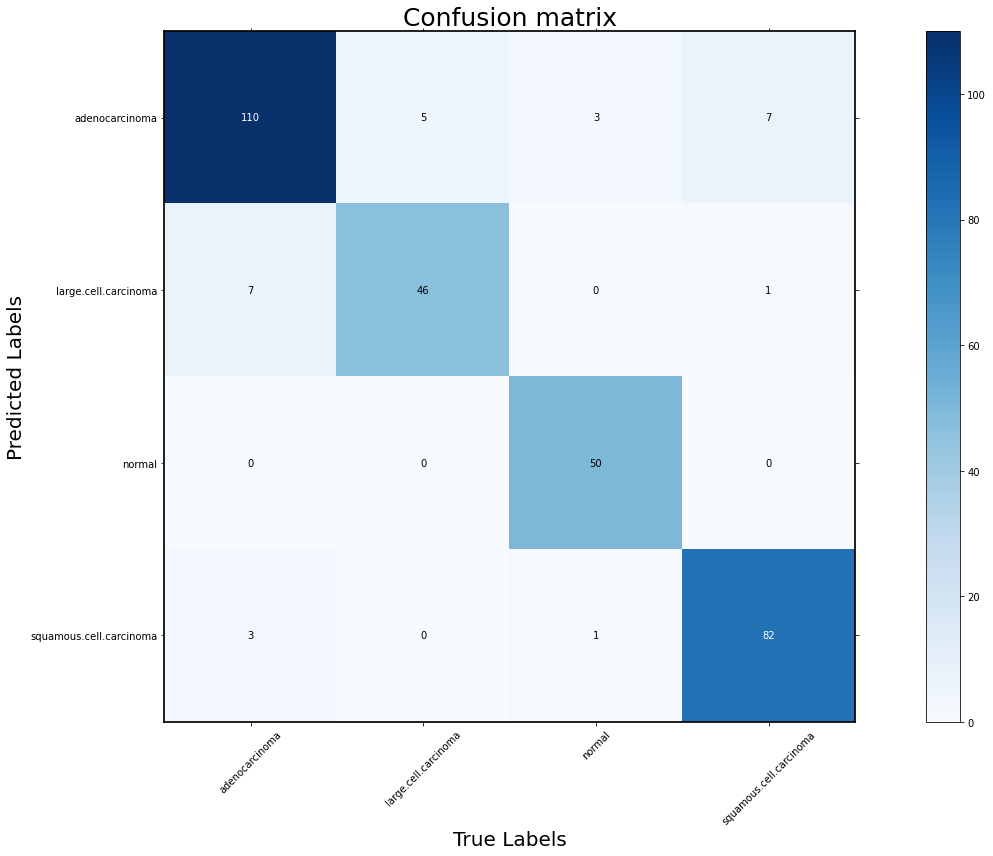

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.88   | 0.917  |    0.923    |  0.898   |
|   large.cell.carcinoma  |   0.852   | 0.902  |     0.97    |  0.876   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.953   | 0.911  |    0.982    |  0.932   |
+-------------------------+-----------+--------+-------------+----------+


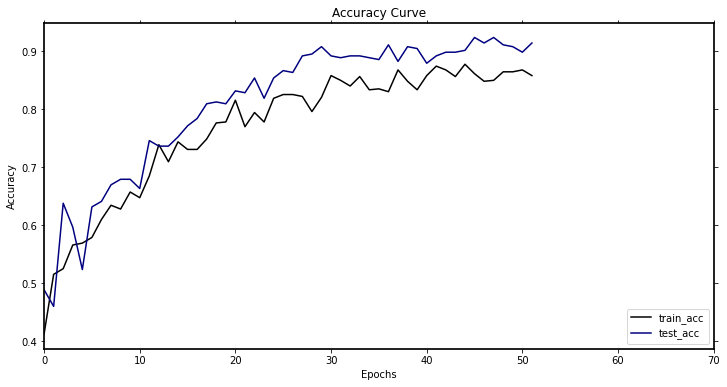

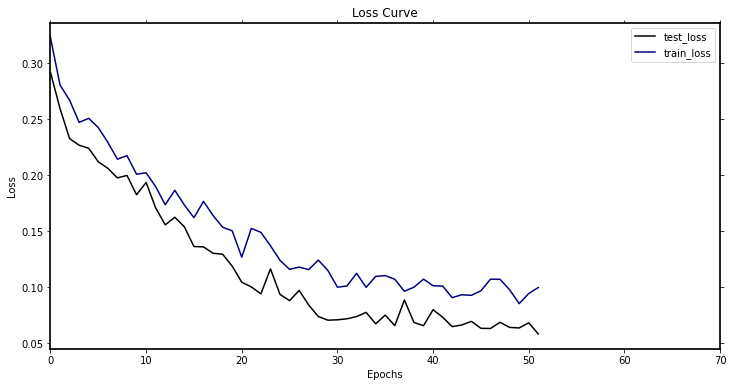

-----------第53轮训练开始-----------
训练次数：8162, 训练集正确率: 0.8531810766721044, Loss：64.96154668554664
第 53 轮测试集上的toal_Loss: 19.163806315977126, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.9238095238095239
[[105.   5.   1.   5.]
 [  6.  46.   0.   0.]
 [  0.   0.  53.   0.]
 [  9.   0.   0.  85.]]


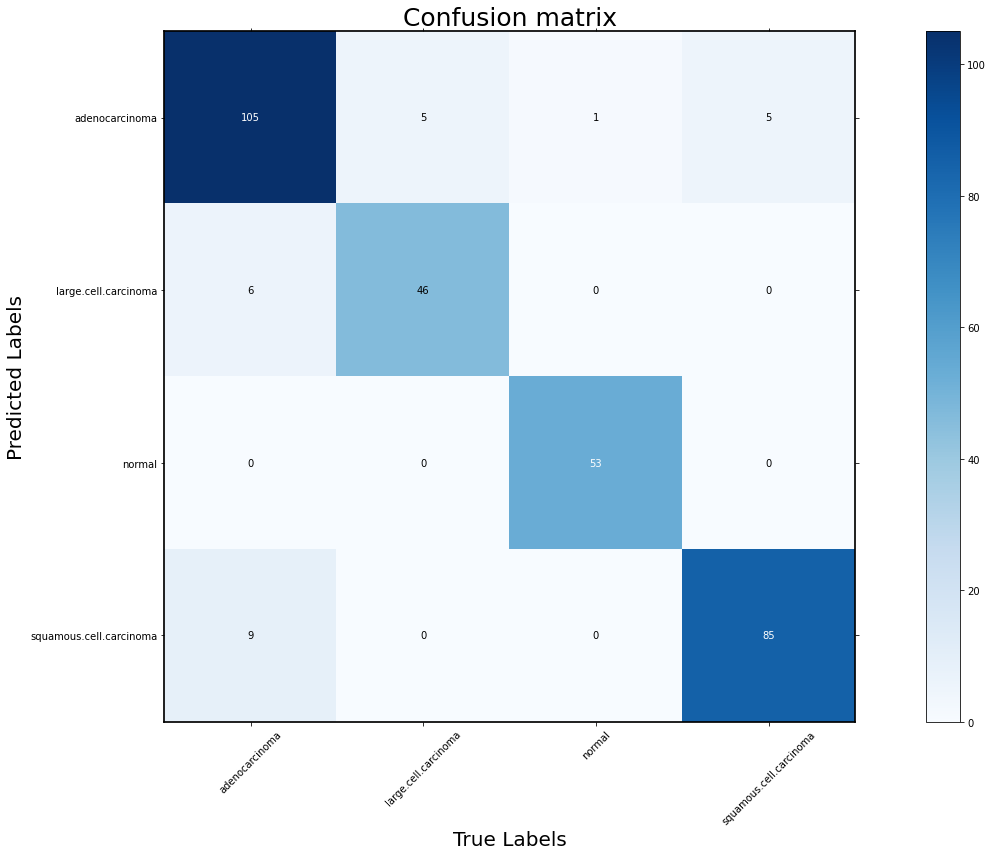

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.905   | 0.875  |    0.944    |   0.89   |
|   large.cell.carcinoma  |   0.885   | 0.902  |    0.977    |  0.893   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.904   | 0.944  |     0.96    |  0.924   |
+-------------------------+-----------+--------+-------------+----------+


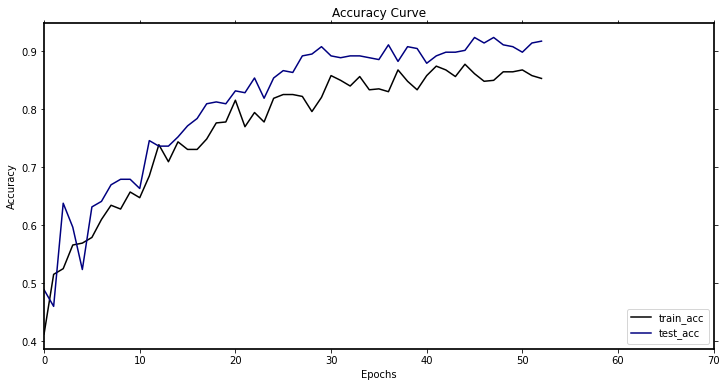

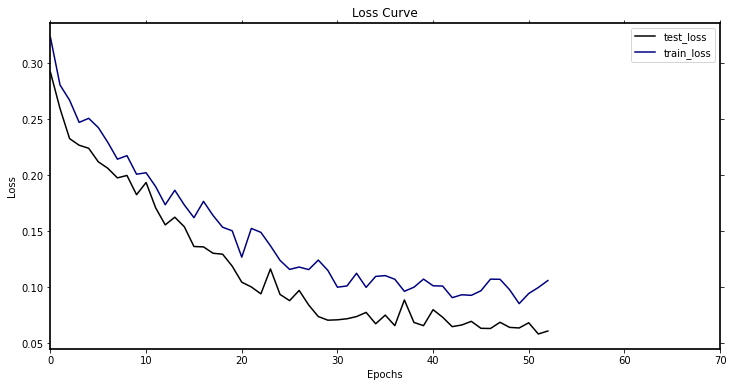

-----------第54轮训练开始-----------
训练次数：8316, 训练集正确率: 0.8727569331158238, Loss：63.86168667208403
第 54 轮测试集上的toal_Loss: 25.26041155960411, 正确率： 0.8920634920634921
Top-1准确率为:{} 0.9238095238095239
[[100.   2.   1.   9.]
 [ 13.  49.   0.   2.]
 [  0.   0.  53.   0.]
 [  7.   0.   0.  79.]]


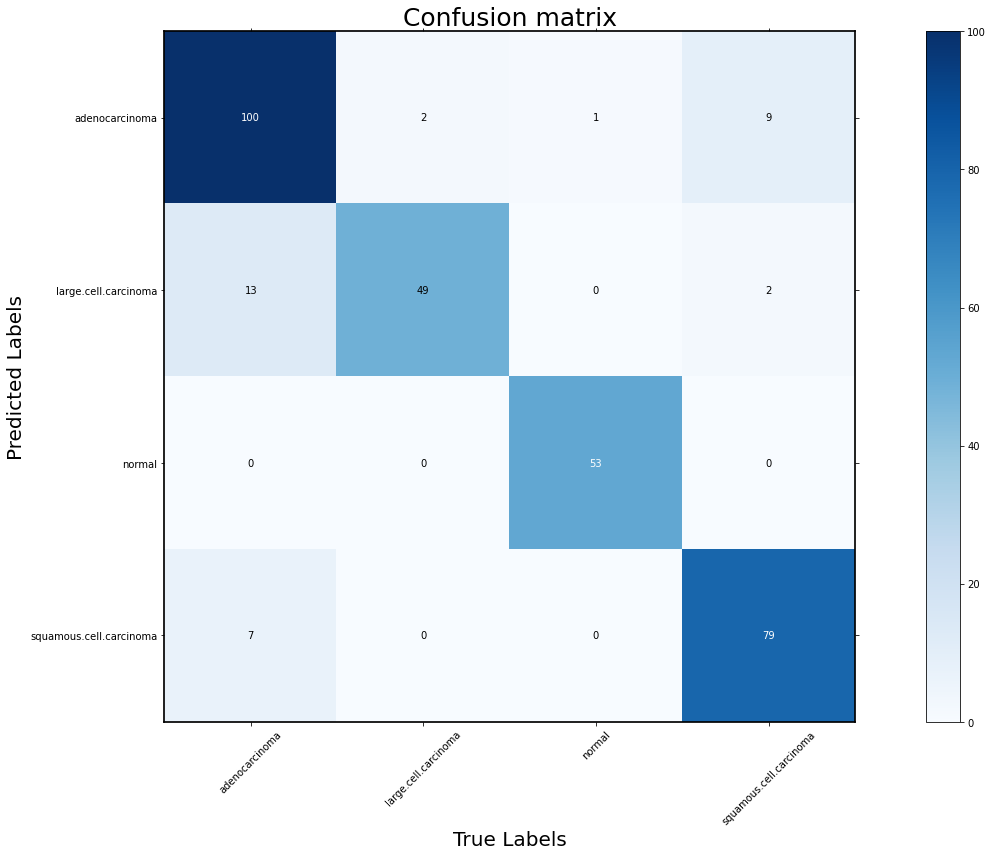

the model accuracy is  0.892
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.893   | 0.833  |    0.938    |  0.862   |
|   large.cell.carcinoma  |   0.766   | 0.961  |    0.943    |  0.852   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.919   | 0.878  |    0.969    |  0.898   |
+-------------------------+-----------+--------+-------------+----------+


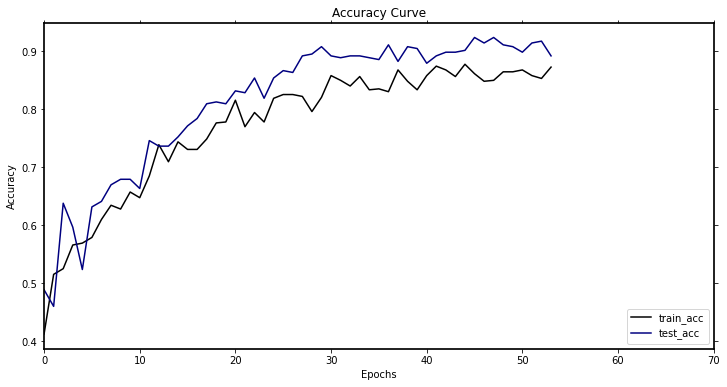

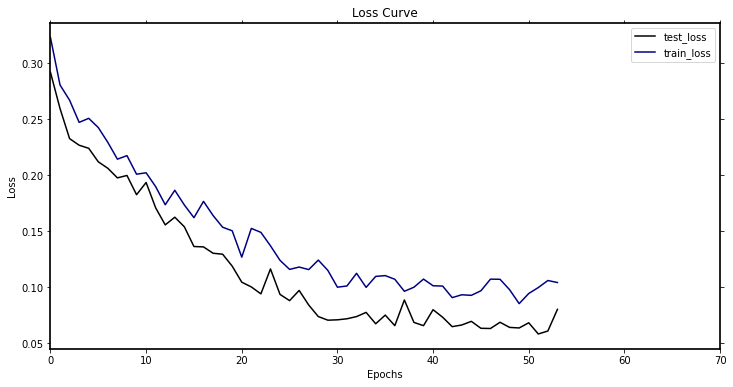

-----------第55轮训练开始-----------
训练次数：8470, 训练集正确率: 0.8874388254486134, Loss：52.161181557923555
第 55 轮测试集上的toal_Loss: 22.93873317912221, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9238095238095239
[[105.   2.   2.   8.]
 [ 13.  49.   2.   3.]
 [  0.   0.  50.   0.]
 [  2.   0.   0.  79.]]


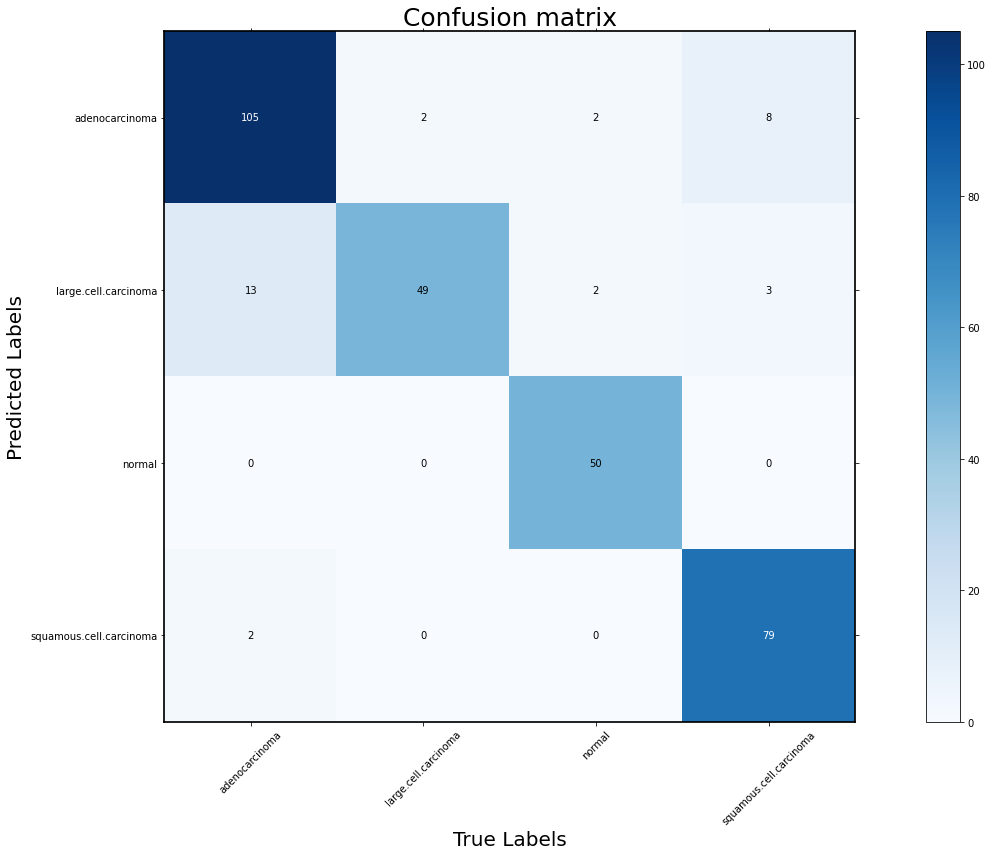

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.897   | 0.875  |    0.938    |  0.886   |
|   large.cell.carcinoma  |   0.731   | 0.961  |    0.932    |   0.83   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.975   | 0.878  |    0.991    |  0.924   |
+-------------------------+-----------+--------+-------------+----------+


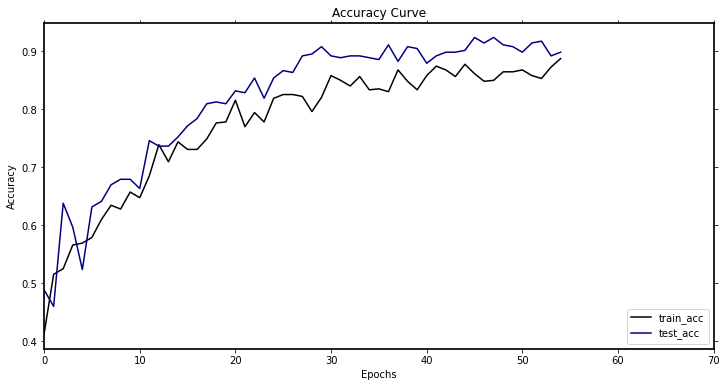

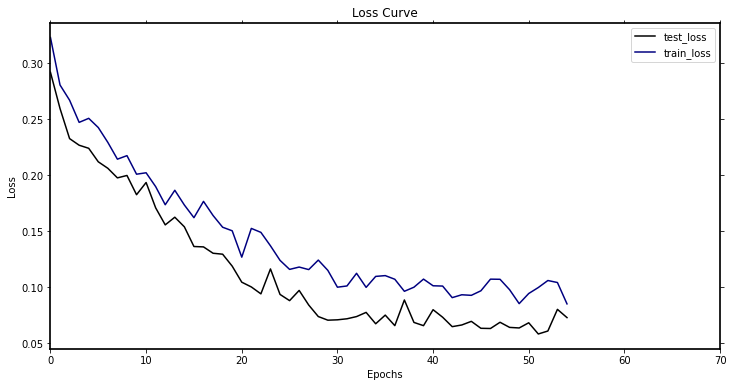

-----------第56轮训练开始-----------
训练次数：8624, 训练集正确率: 0.8646003262642741, Loss：58.14499705657363
第 56 轮测试集上的toal_Loss: 20.11390128452331, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[110.   3.   3.   9.]
 [  7.  48.   0.   1.]
 [  0.   0.  51.   1.]
 [  3.   0.   0.  79.]]


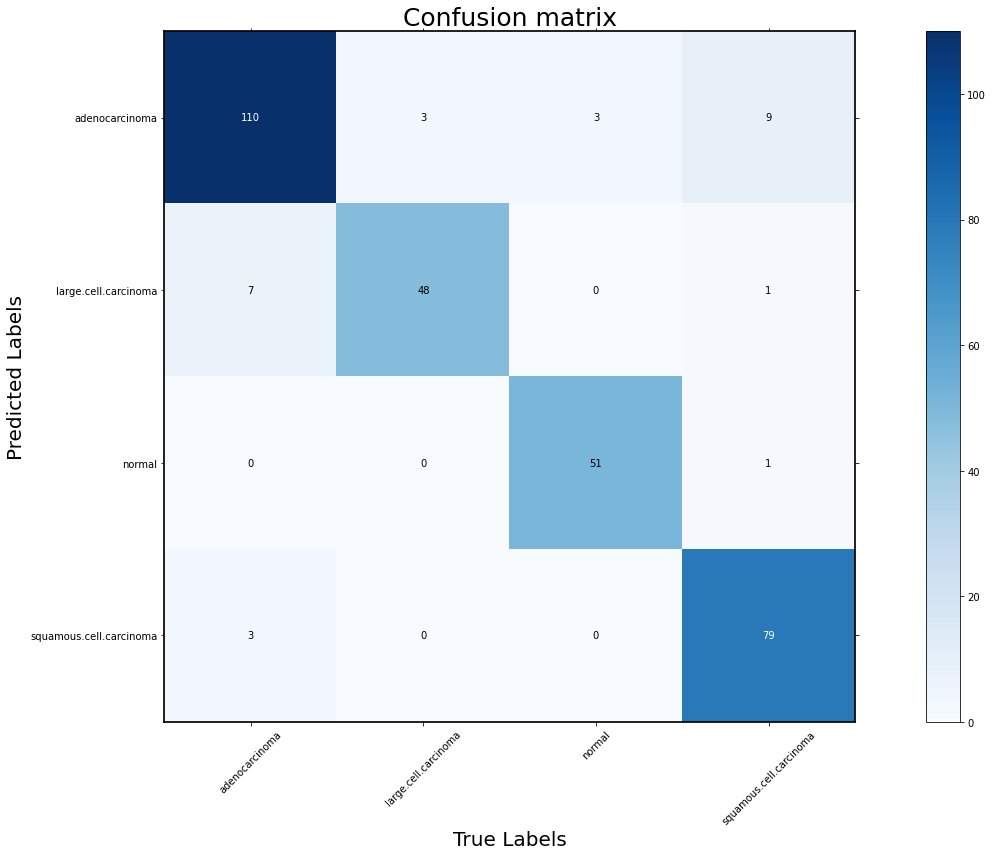

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.88   | 0.917  |    0.923    |  0.898   |
|   large.cell.carcinoma  |   0.857   | 0.941  |     0.97    |  0.897   |
|          normal         |   0.981   | 0.944  |    0.996    |  0.962   |
| squamous.cell.carcinoma |   0.963   | 0.878  |    0.987    |  0.919   |
+-------------------------+-----------+--------+-------------+----------+


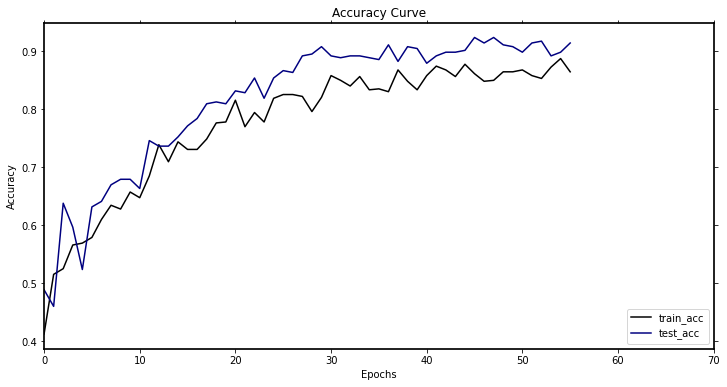

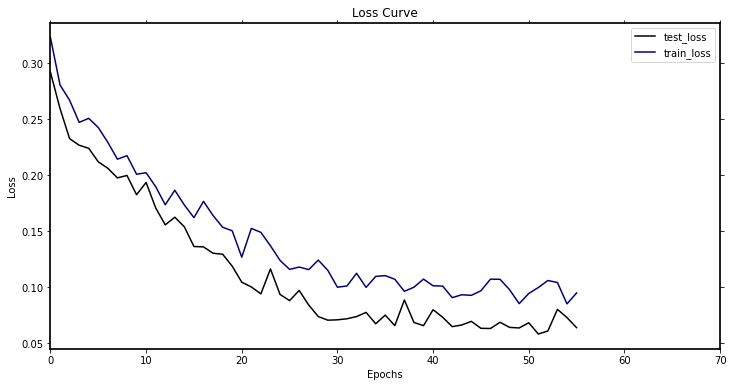

-----------第57轮训练开始-----------
训练次数：8778, 训练集正确率: 0.8792822185970636, Loss：54.3172679329291
第 57 轮测试集上的toal_Loss: 20.00576025887858, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[105.   8.   2.   3.]
 [  6.  42.   0.   0.]
 [  0.   0.  52.   0.]
 [  9.   1.   0.  87.]]


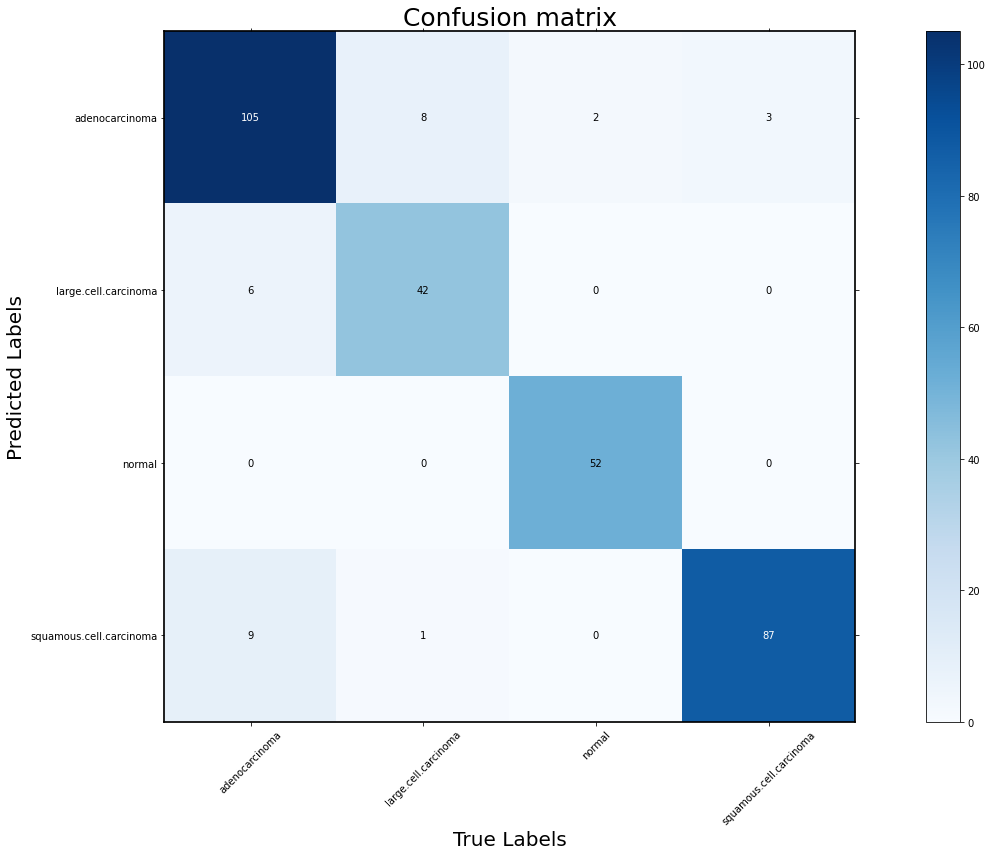

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.89   | 0.875  |    0.933    |  0.882   |
|   large.cell.carcinoma  |   0.875   | 0.824  |    0.977    |  0.849   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.897   | 0.967  |    0.956    |  0.931   |
+-------------------------+-----------+--------+-------------+----------+


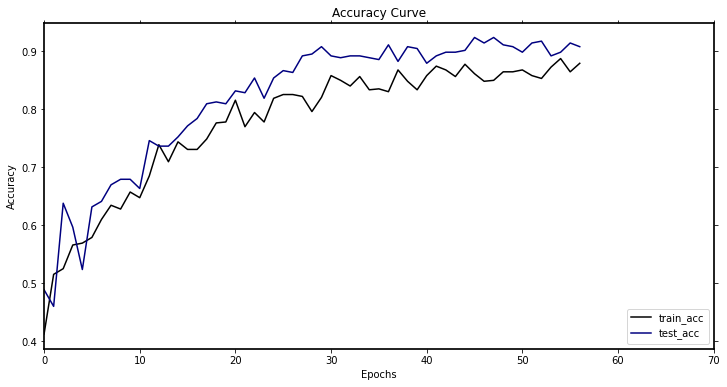

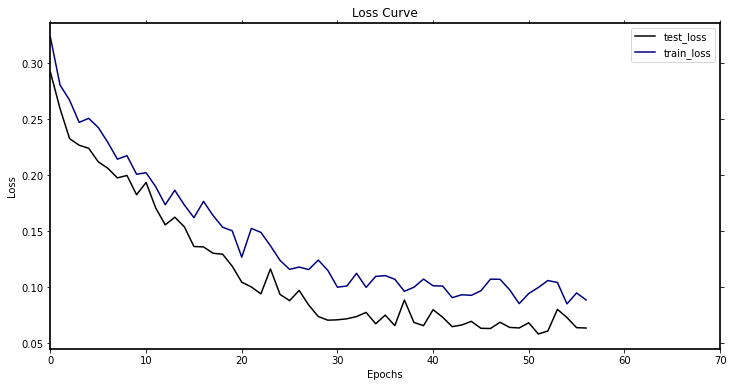

-----------第58轮训练开始-----------
训练次数：8932, 训练集正确率: 0.8825448613376835, Loss：54.105975954793394
第 58 轮测试集上的toal_Loss: 20.490213671699166, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[108.   5.   4.   6.]
 [  7.  46.   0.   0.]
 [  0.   0.  50.   0.]
 [  5.   0.   0.  84.]]


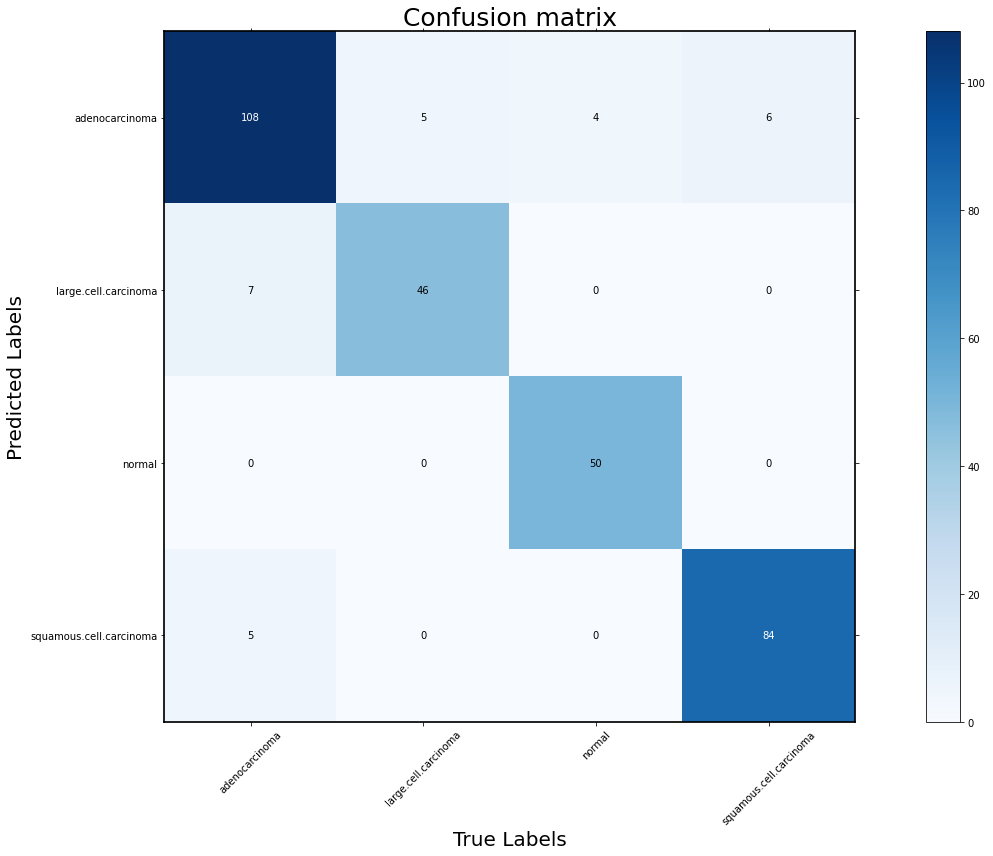

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.878   |  0.9   |    0.923    |  0.889   |
|   large.cell.carcinoma  |   0.868   | 0.902  |    0.973    |  0.885   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.944   | 0.933  |    0.978    |  0.938   |
+-------------------------+-----------+--------+-------------+----------+


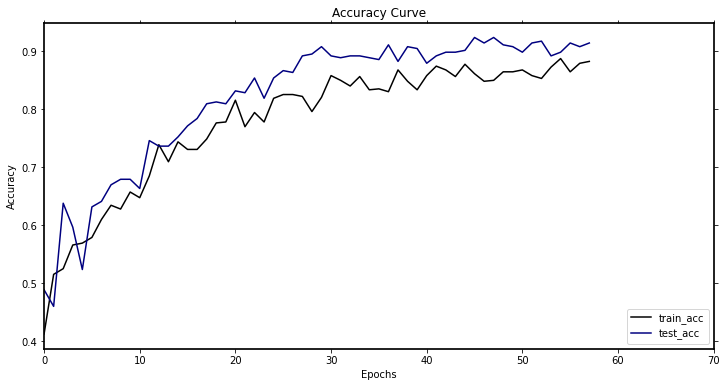

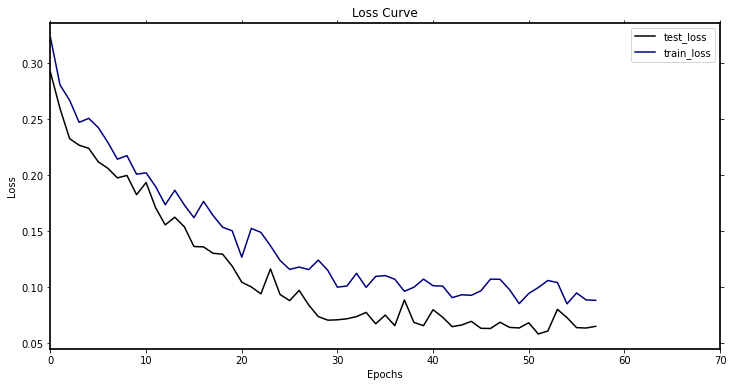

-----------第59轮训练开始-----------
训练次数：9086, 训练集正确率: 0.8531810766721044, Loss：64.67667355015874
第 59 轮测试集上的toal_Loss: 20.300484519451857, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.9238095238095239
[[107.   5.   4.   6.]
 [  7.  46.   0.   0.]
 [  0.   0.  50.   0.]
 [  6.   0.   0.  84.]]


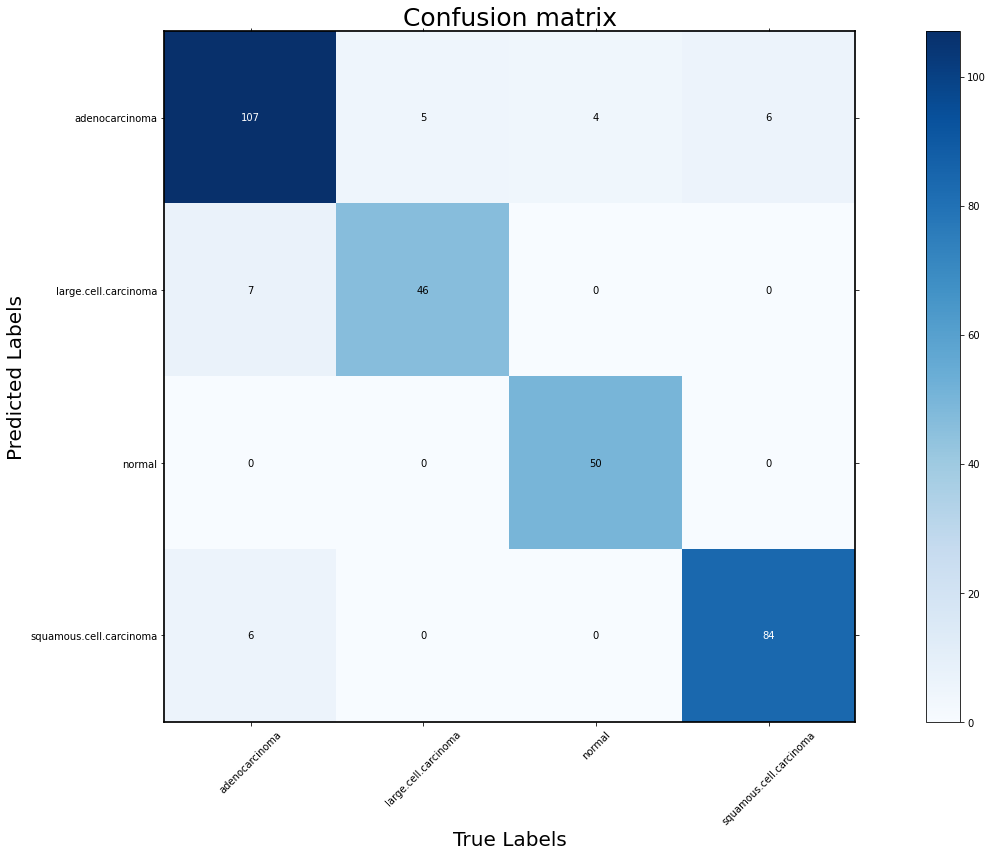

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.877   | 0.892  |    0.923    |  0.884   |
|   large.cell.carcinoma  |   0.868   | 0.902  |    0.973    |  0.885   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.933   | 0.933  |    0.973    |  0.933   |
+-------------------------+-----------+--------+-------------+----------+


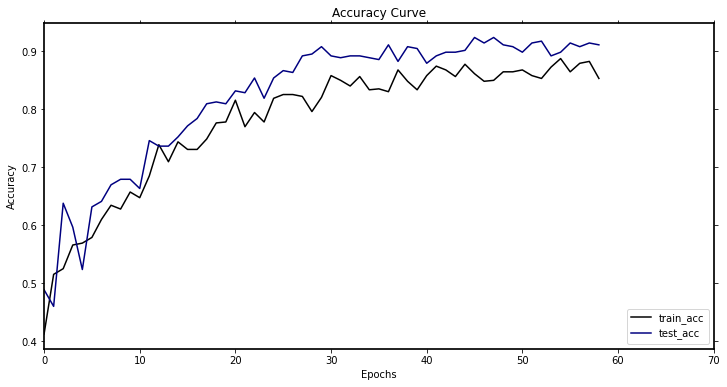

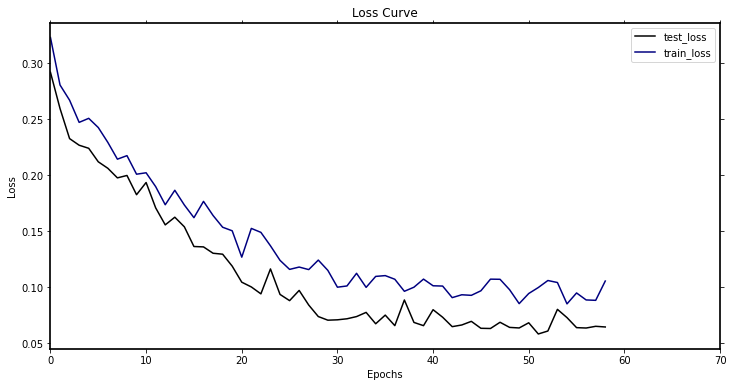

-----------第60轮训练开始-----------
训练次数：9240, 训练集正确率: 0.8482871125611745, Loss：64.57700874656439
第 60 轮测试集上的toal_Loss: 19.466624931432307, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[104.   3.   4.   2.]
 [  7.  47.   0.   1.]
 [  0.   0.  50.   0.]
 [  9.   1.   0.  87.]]


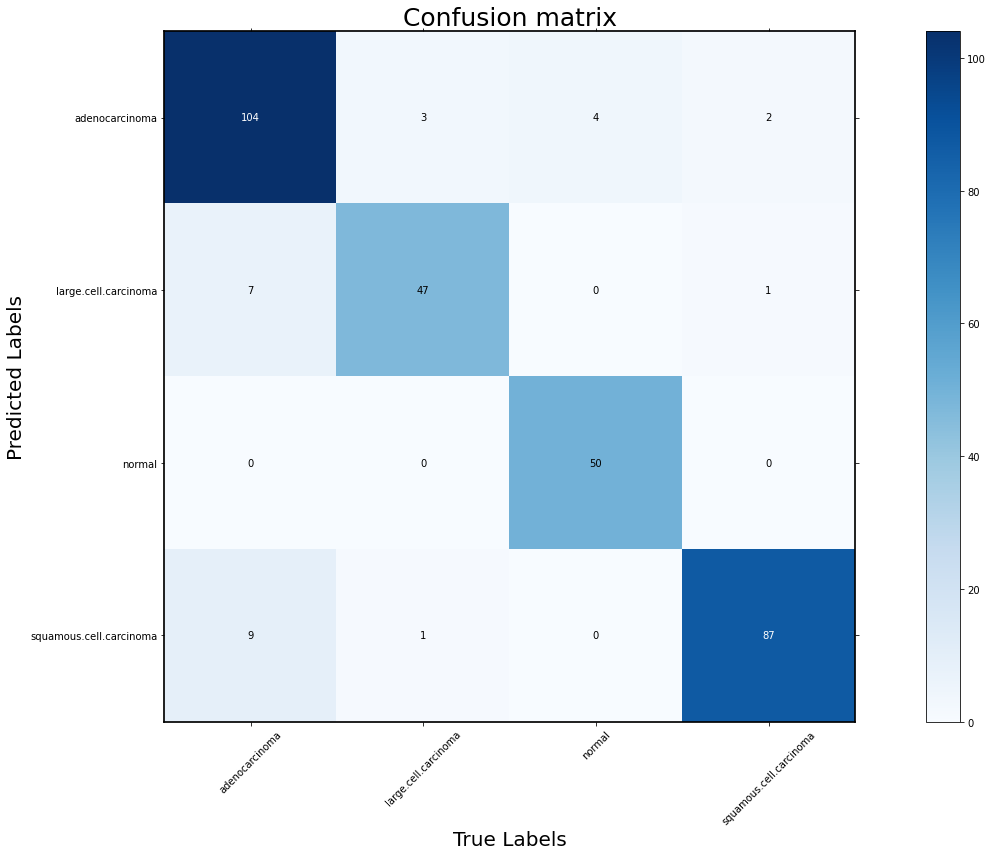

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.92   | 0.867  |    0.954    |  0.893   |
|   large.cell.carcinoma  |   0.855   | 0.922  |     0.97    |  0.887   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.897   | 0.967  |    0.956    |  0.931   |
+-------------------------+-----------+--------+-------------+----------+


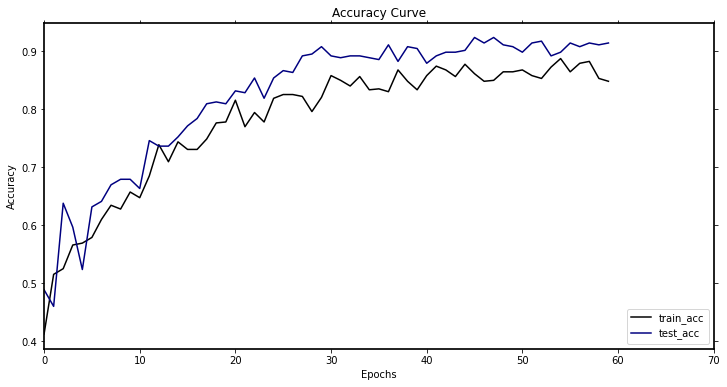

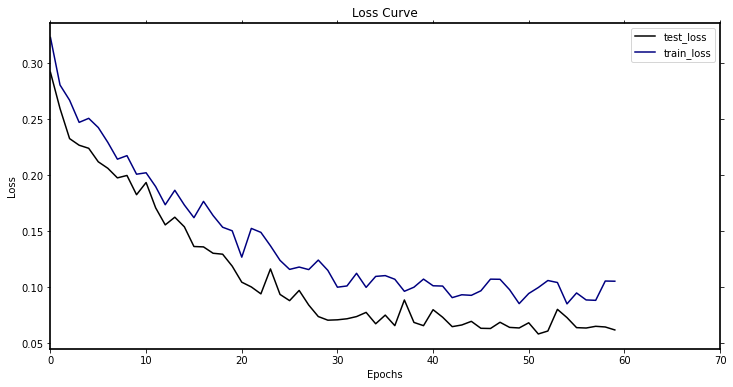

-----------第61轮训练开始-----------
训练次数：9394, 训练集正确率: 0.8515497553017944, Loss：58.60813866741955
第 61 轮测试集上的toal_Loss: 22.626289919484407, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9238095238095239
[[101.   4.   4.   1.]
 [  6.  43.   0.   0.]
 [  0.   0.  50.   0.]
 [ 13.   4.   0.  89.]]


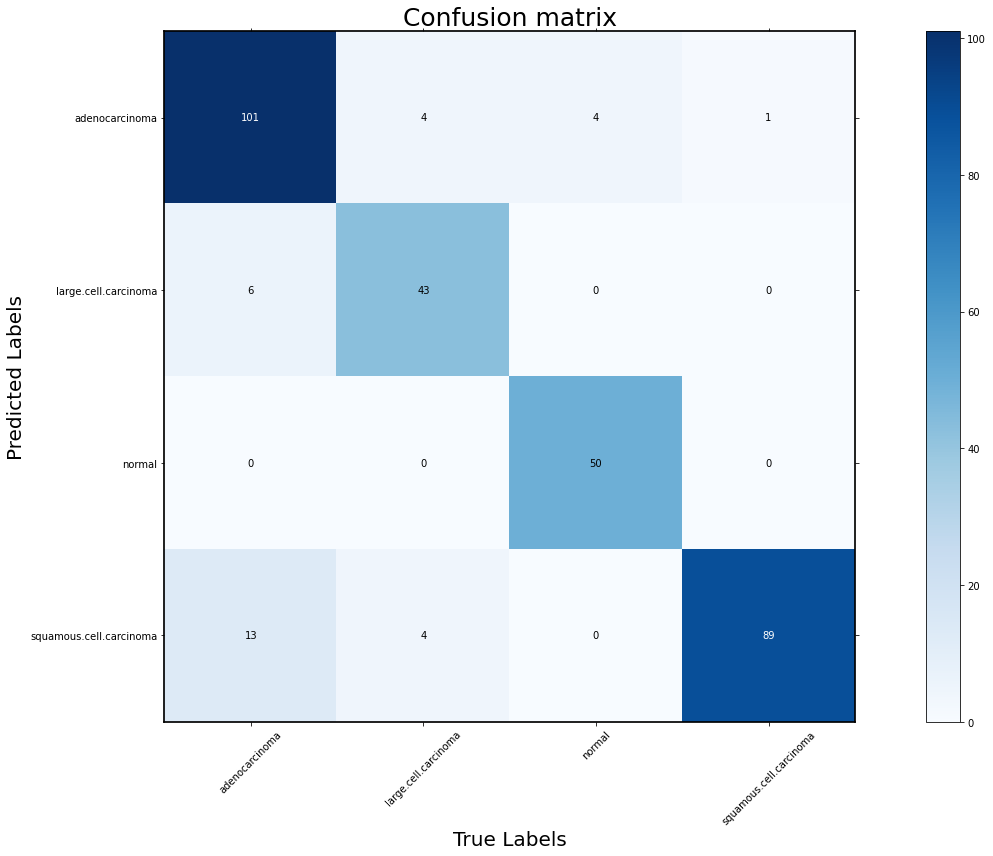

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.918   | 0.842  |    0.954    |  0.878   |
|   large.cell.carcinoma  |   0.878   | 0.843  |    0.977    |   0.86   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |    0.84   | 0.989  |    0.924    |  0.908   |
+-------------------------+-----------+--------+-------------+----------+


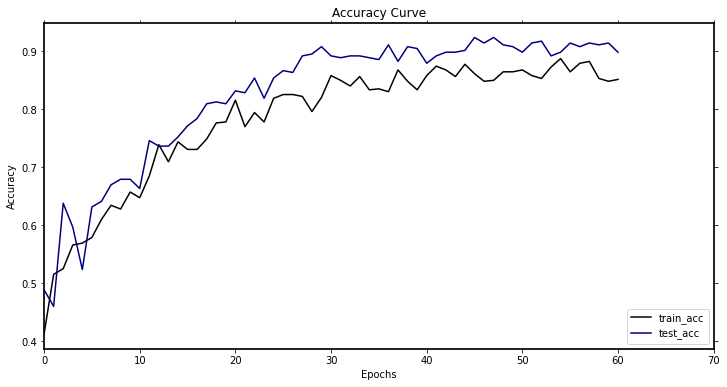

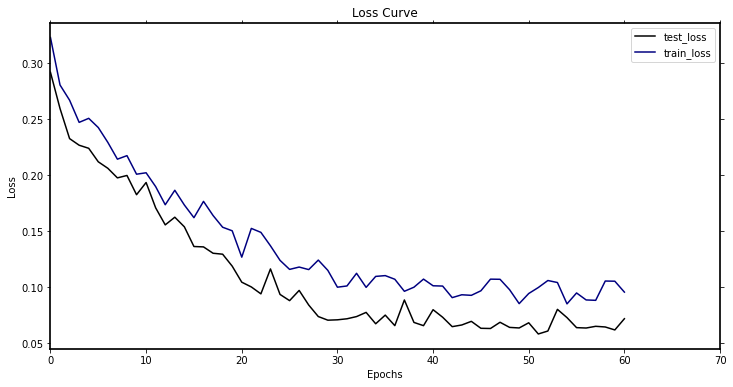

-----------第62轮训练开始-----------
训练次数：9548, 训练集正确率: 0.8531810766721044, Loss：64.64077020343393
第 62 轮测试集上的toal_Loss: 22.06865207105875, 正确率： 0.9015873015873016
Top-1准确率为:{} 0.9238095238095239
[[99.  3.  3.  2.]
 [ 6. 46.  0.  0.]
 [ 1.  0. 51.  0.]
 [14.  2.  0. 88.]]


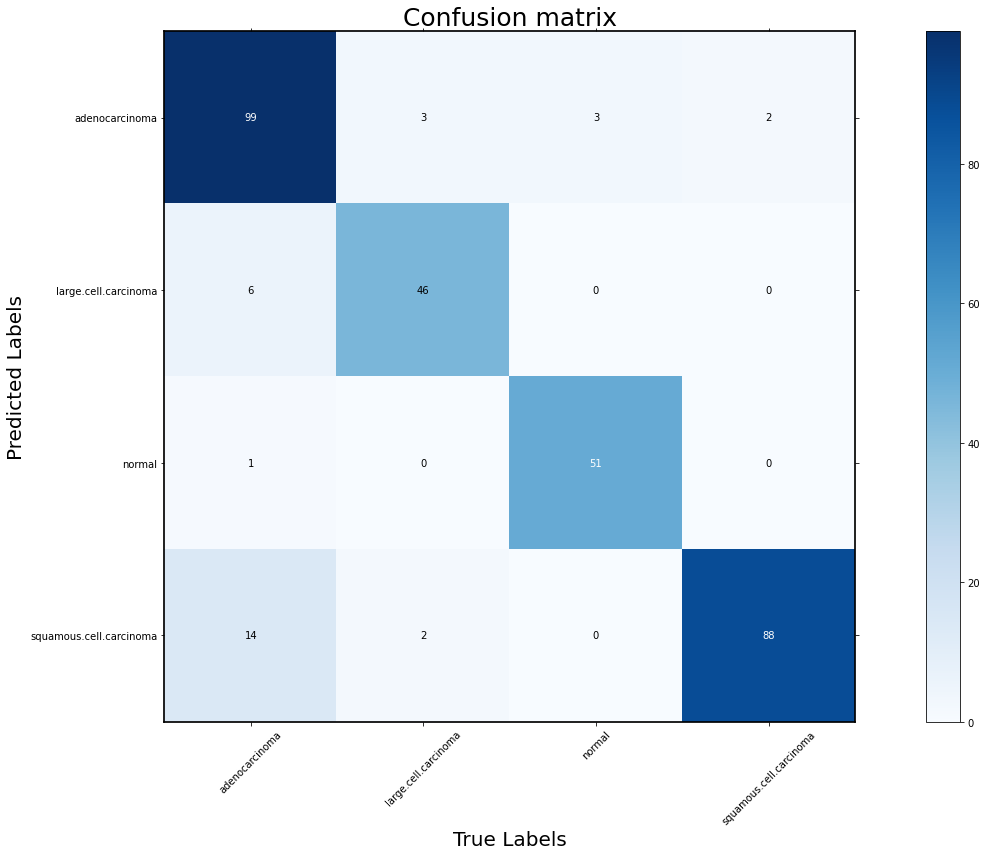

the model accuracy is  0.902
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.925   | 0.825  |    0.959    |  0.872   |
|   large.cell.carcinoma  |   0.885   | 0.902  |    0.977    |  0.893   |
|          normal         |   0.981   | 0.944  |    0.996    |  0.962   |
| squamous.cell.carcinoma |   0.846   | 0.978  |    0.929    |  0.907   |
+-------------------------+-----------+--------+-------------+----------+


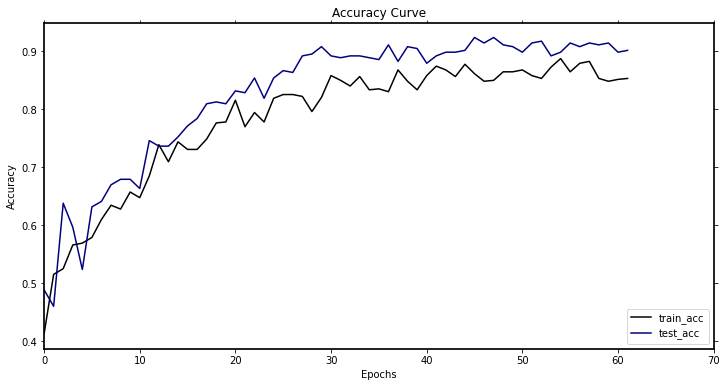

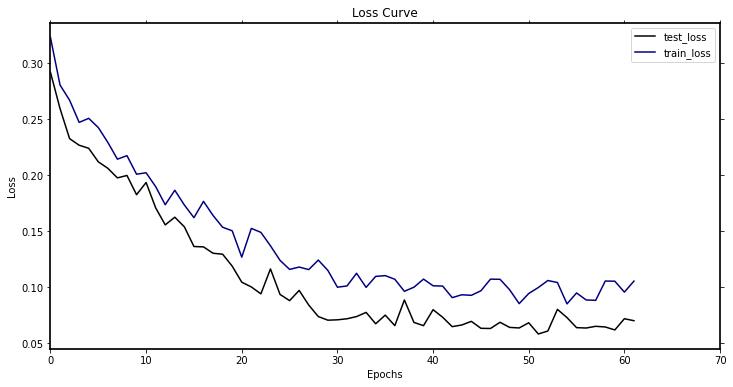

-----------第63轮训练开始-----------
训练次数：9702, 训练集正确率: 0.867862969004894, Loss：54.08716397918761
第 63 轮测试集上的toal_Loss: 19.027509623207152, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[109.   6.   4.   8.]
 [  7.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [  4.   0.   0.  82.]]


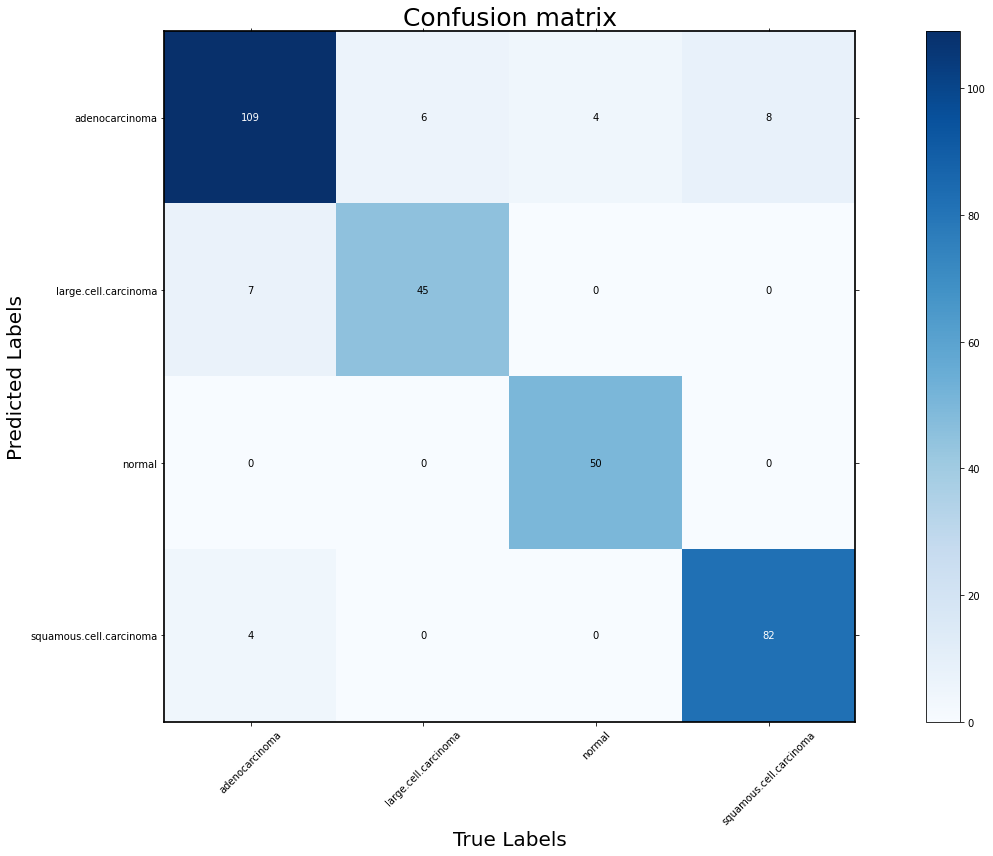

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.858   | 0.908  |    0.908    |  0.882   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.953   | 0.911  |    0.982    |  0.932   |
+-------------------------+-----------+--------+-------------+----------+


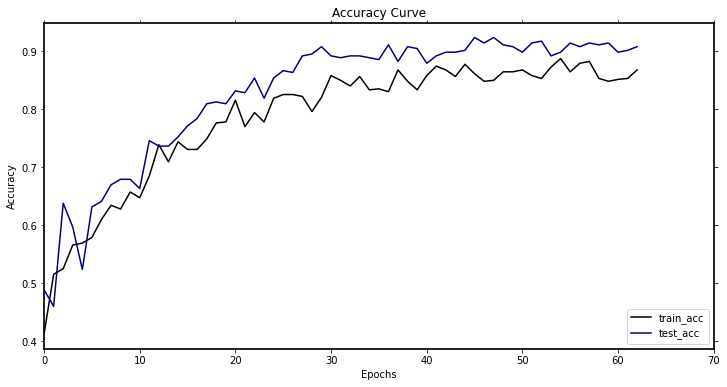

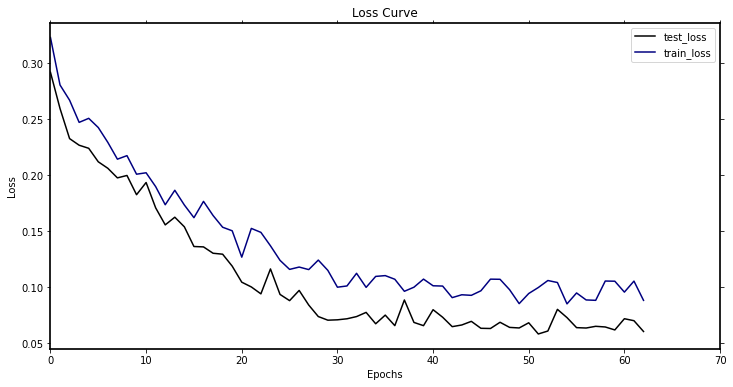

-----------第64轮训练开始-----------
训练次数：9856, 训练集正确率: 0.8792822185970636, Loss：49.7174511179328
第 64 轮测试集上的toal_Loss: 24.38296601898037, 正确率： 0.9015873015873016
Top-1准确率为:{} 0.9238095238095239
[[107.   2.   1.  12.]
 [ 11.  49.   0.   3.]
 [  0.   0.  53.   0.]
 [  2.   0.   0.  75.]]


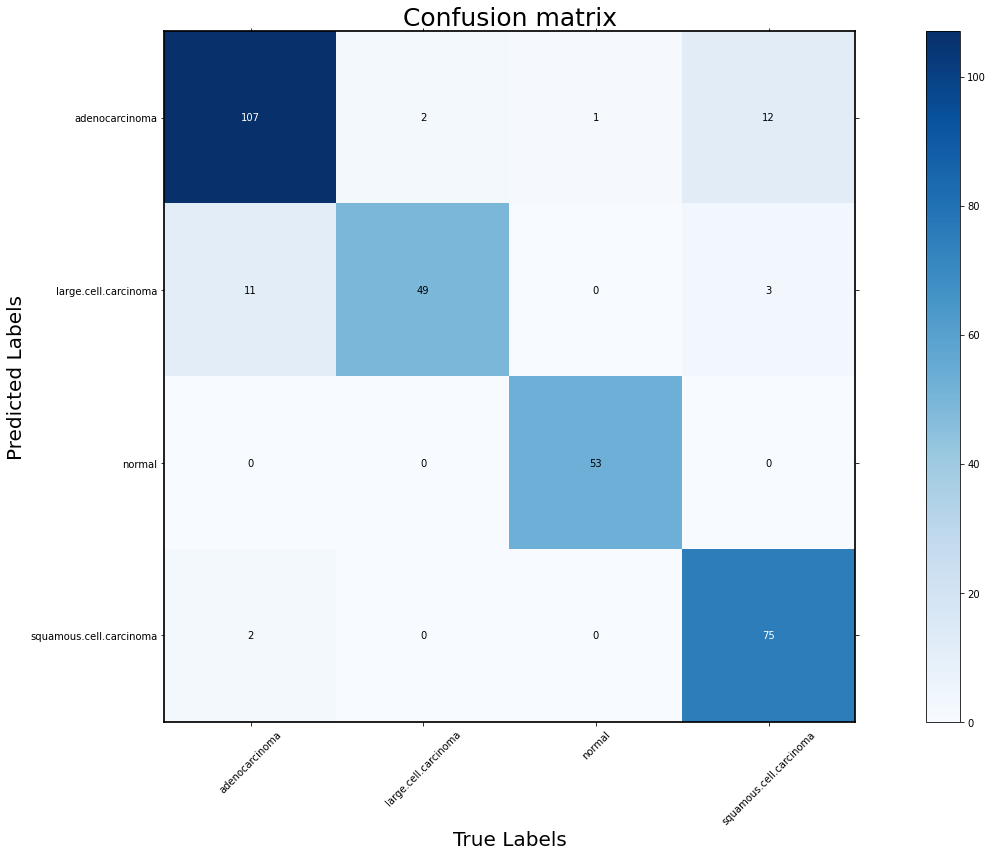

the model accuracy is  0.902
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.877   | 0.892  |    0.923    |  0.884   |
|   large.cell.carcinoma  |   0.778   | 0.961  |    0.947    |   0.86   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.974   | 0.833  |    0.991    |  0.898   |
+-------------------------+-----------+--------+-------------+----------+


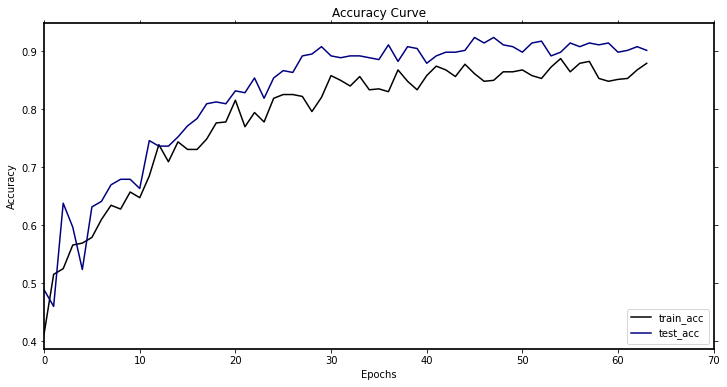

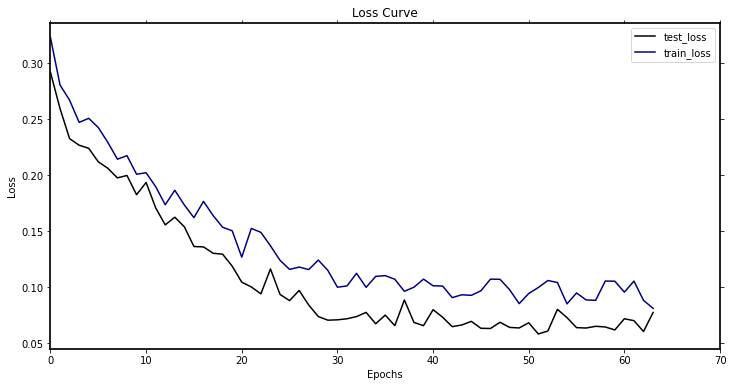

-----------第65轮训练开始-----------
训练次数：10010, 训练集正确率: 0.8890701468189234, Loss：50.54896151646972
第 65 轮测试集上的toal_Loss: 21.255734851118177, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.9238095238095239
[[103.   2.   1.   7.]
 [ 10.  49.   0.   1.]
 [  0.   0.  53.   0.]
 [  7.   0.   0.  82.]]


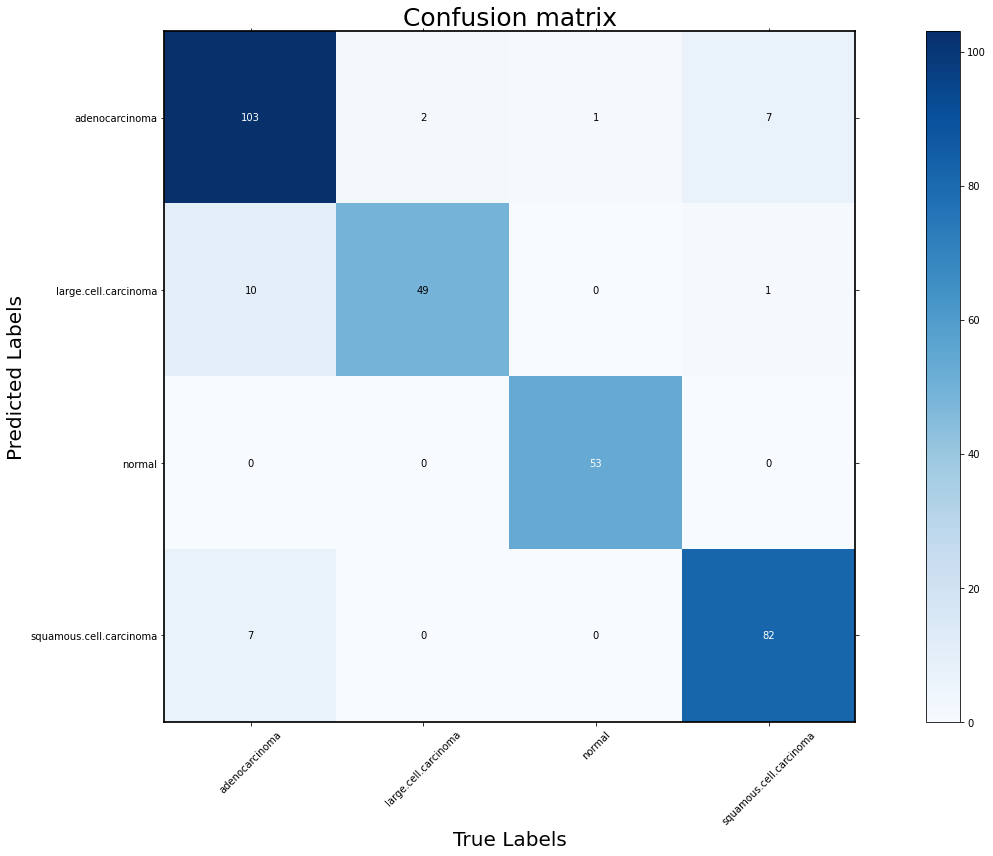

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.912   | 0.858  |    0.949    |  0.884   |
|   large.cell.carcinoma  |   0.817   | 0.961  |    0.958    |  0.883   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.921   | 0.911  |    0.969    |  0.916   |
+-------------------------+-----------+--------+-------------+----------+


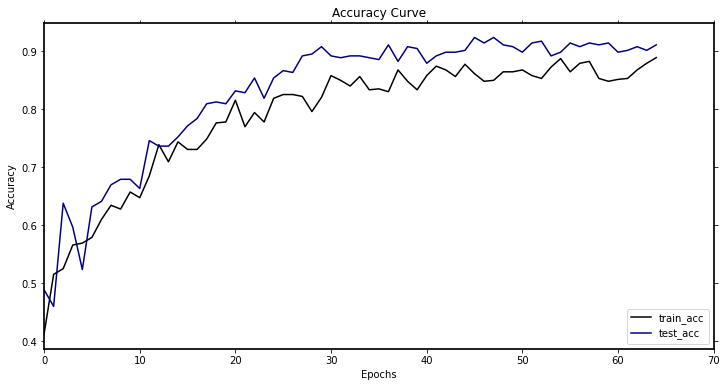

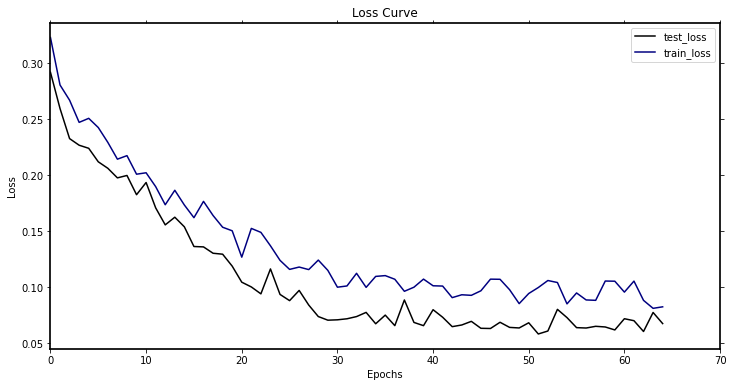

-----------第66轮训练开始-----------
训练次数：10164, 训练集正确率: 0.8564437194127243, Loss：57.08025564439595
第 66 轮测试集上的toal_Loss: 18.247777198906988, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.9238095238095239
[[109.   6.   2.   7.]
 [  7.  45.   0.   0.]
 [  0.   0.  52.   0.]
 [  4.   0.   0.  83.]]


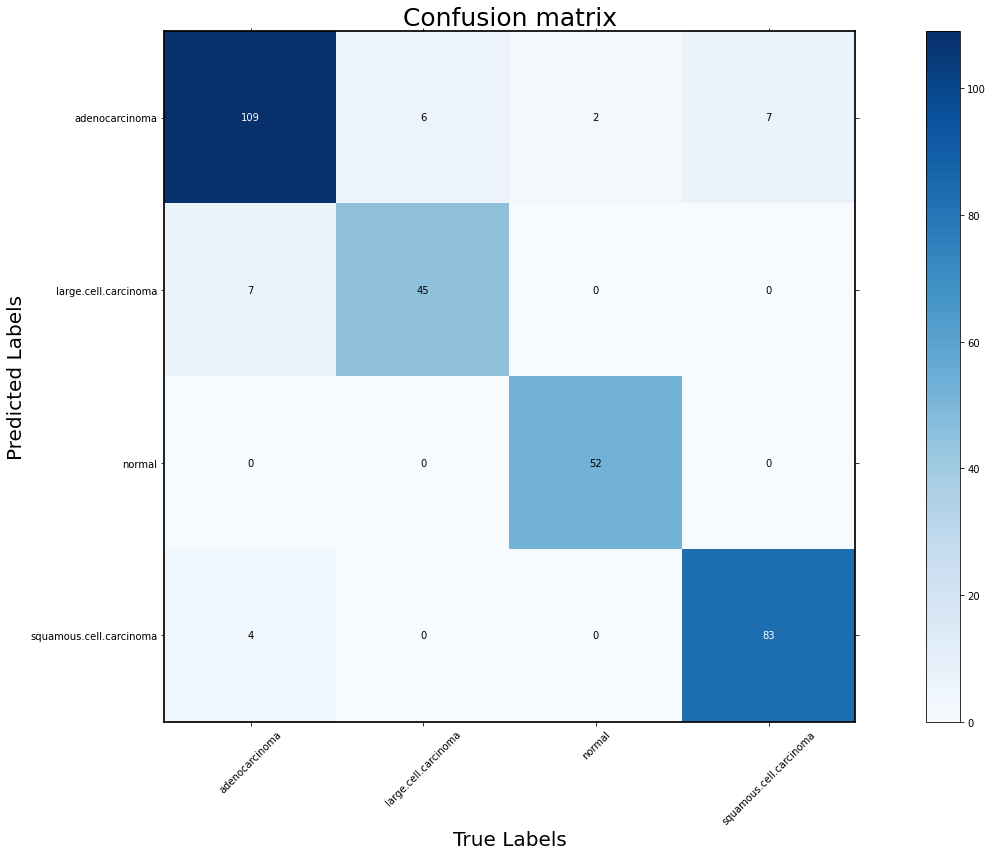

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.879   | 0.908  |    0.923    |  0.893   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.954   | 0.922  |    0.982    |  0.938   |
+-------------------------+-----------+--------+-------------+----------+


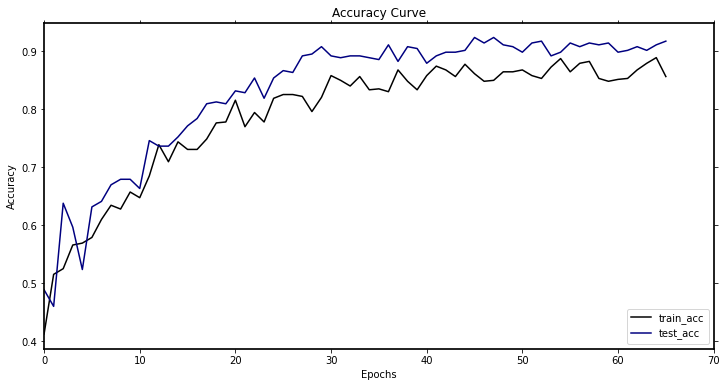

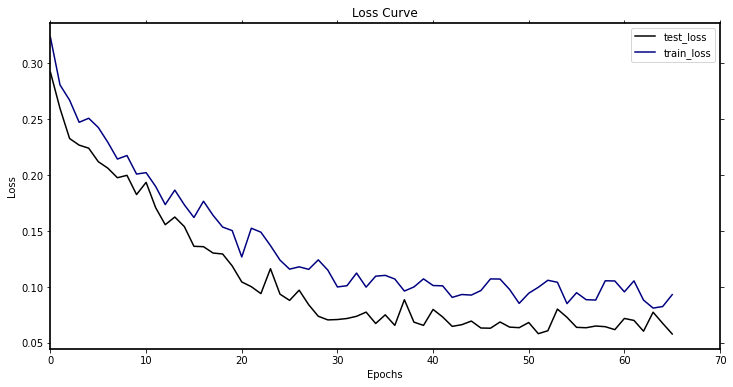

-----------第67轮训练开始-----------
训练次数：10318, 训练集正确率: 0.8694942903752039, Loss：59.64758469723165
第 67 轮测试集上的toal_Loss: 21.449156592134386, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[97.  2.  0.  2.]
 [ 9. 49.  0.  0.]
 [ 1.  0. 54.  0.]
 [13.  0.  0. 88.]]


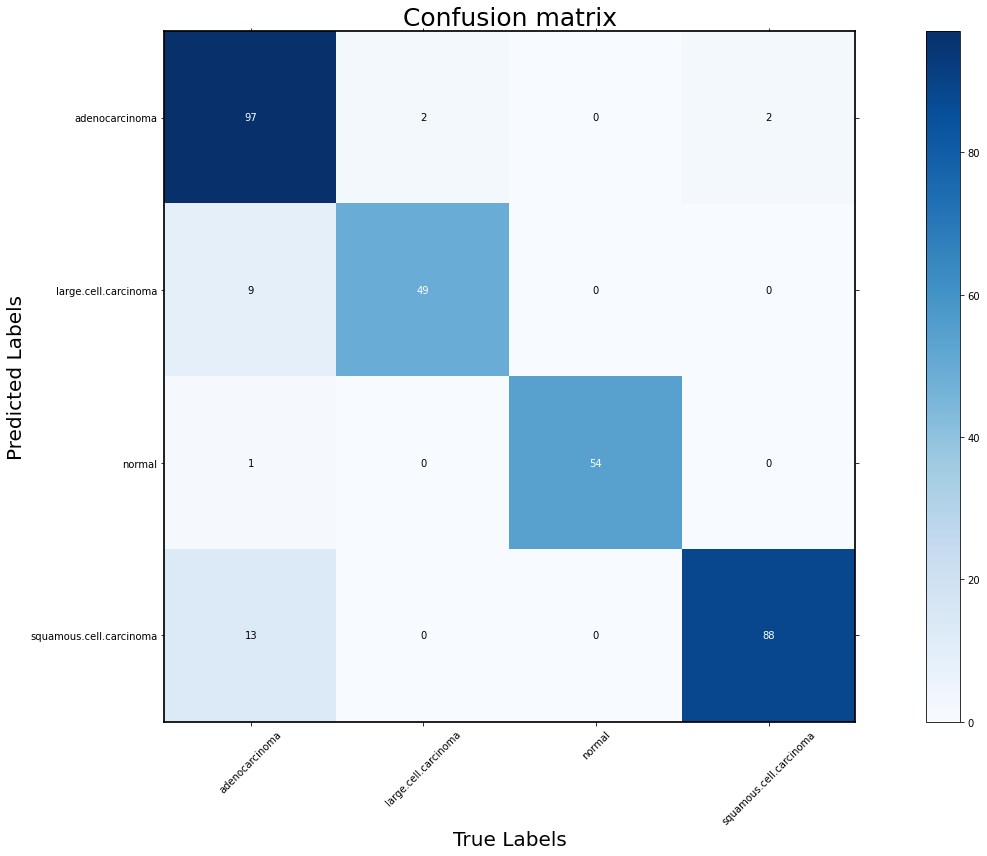

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.96   | 0.808  |    0.979    |  0.877   |
|   large.cell.carcinoma  |   0.845   | 0.961  |    0.966    |  0.899   |
|          normal         |   0.982   |  1.0   |    0.996    |  0.991   |
| squamous.cell.carcinoma |   0.871   | 0.978  |    0.942    |  0.921   |
+-------------------------+-----------+--------+-------------+----------+


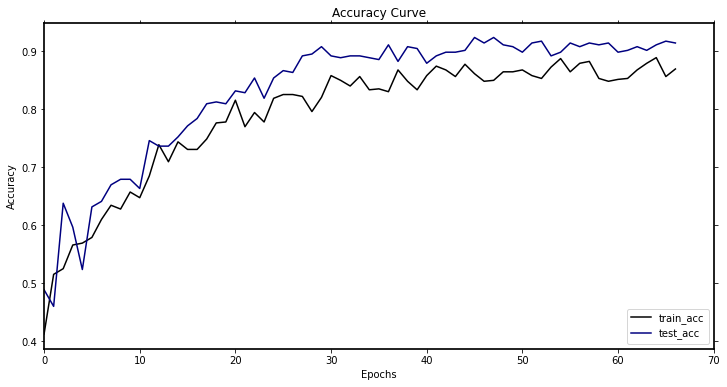

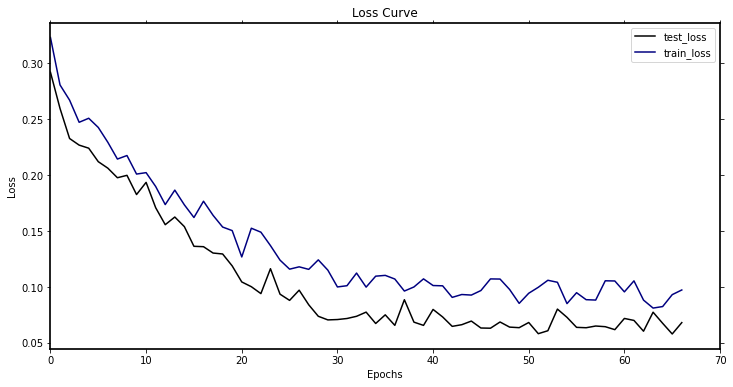

-----------第68轮训练开始-----------
训练次数：10472, 训练集正确率: 0.8825448613376835, Loss：55.28158605378121
第 68 轮测试集上的toal_Loss: 19.85572929121554, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[104.   5.   1.   7.]
 [  9.  46.   0.   0.]
 [  0.   0.  53.   0.]
 [  7.   0.   0.  83.]]


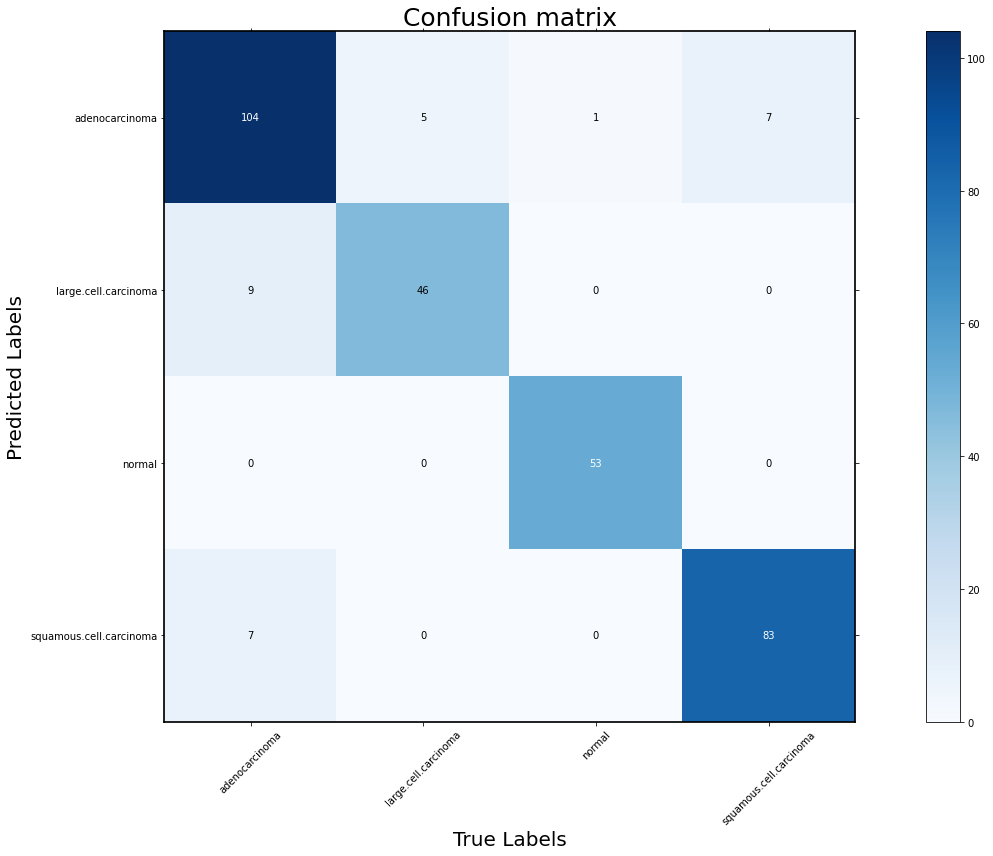

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.889   | 0.867  |    0.933    |  0.878   |
|   large.cell.carcinoma  |   0.836   | 0.902  |    0.966    |  0.868   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.922   | 0.922  |    0.969    |  0.922   |
+-------------------------+-----------+--------+-------------+----------+


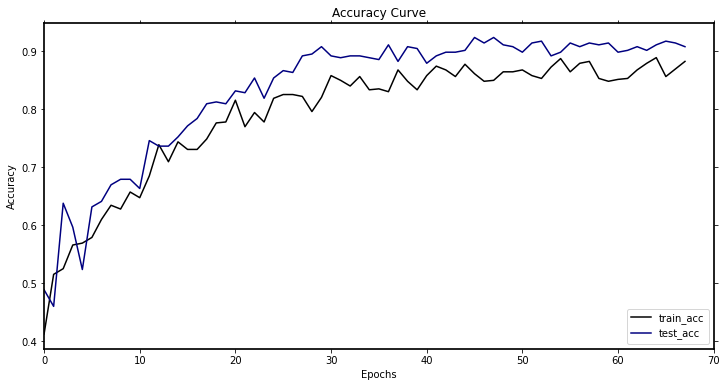

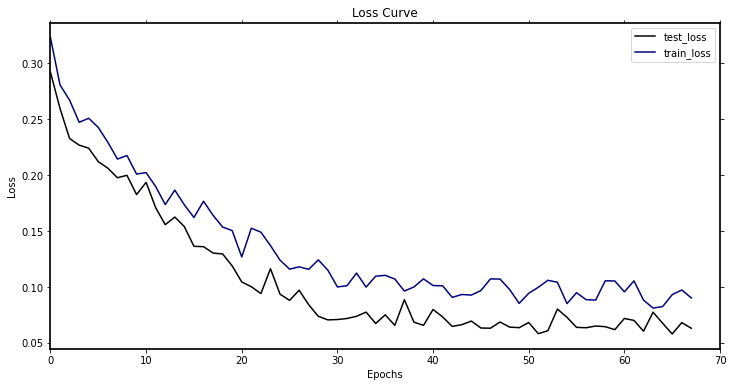

-----------第69轮训练开始-----------
训练次数：10626, 训练集正确率: 0.8694942903752039, Loss：56.94031301140785
第 69 轮测试集上的toal_Loss: 23.217644441872835, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.9238095238095239
[[96.  2.  1.  3.]
 [ 6. 47.  0.  0.]
 [ 0.  0. 53.  0.]
 [18.  2.  0. 87.]]


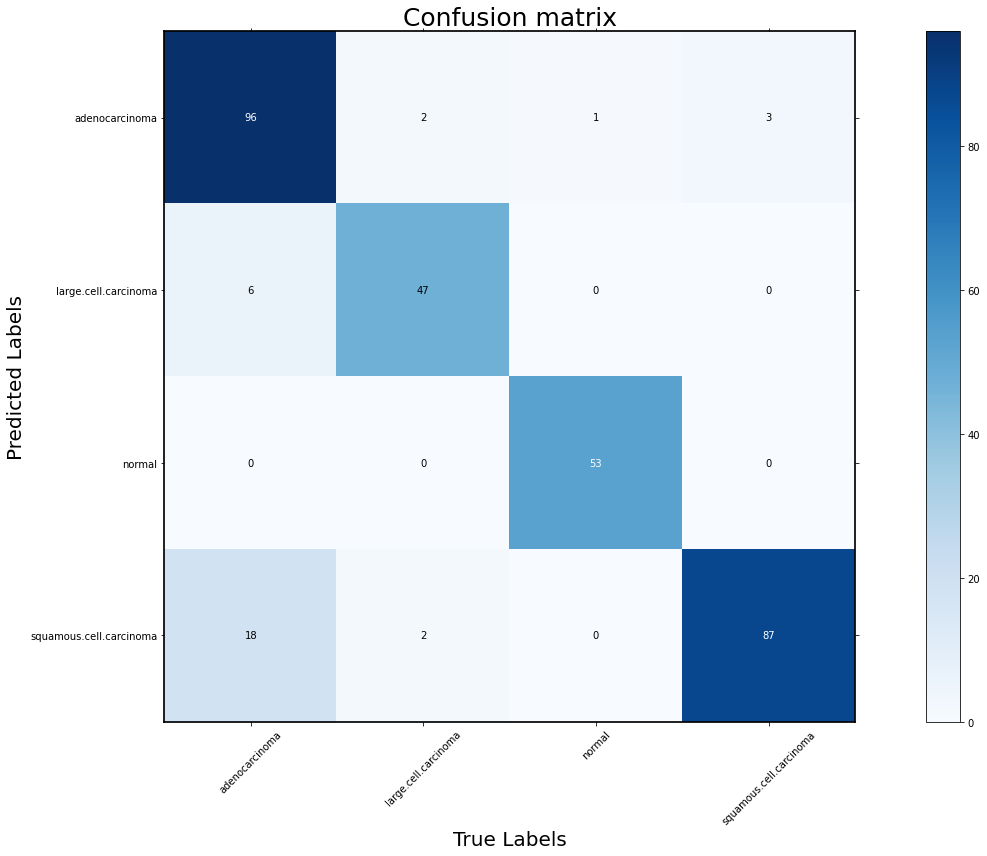

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.941   |  0.8   |    0.969    |  0.865   |
|   large.cell.carcinoma  |   0.887   | 0.922  |    0.977    |  0.904   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.813   | 0.967  |    0.911    |  0.883   |
+-------------------------+-----------+--------+-------------+----------+


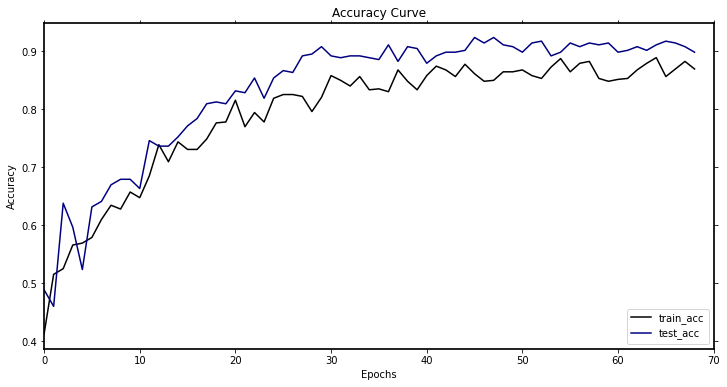

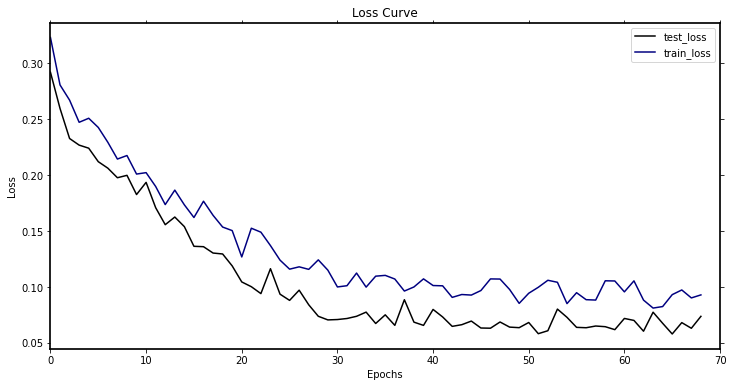

-----------第70轮训练开始-----------
训练次数：10780, 训练集正确率: 0.8548123980424144, Loss：58.87948331516236
第 70 轮测试集上的toal_Loss: 20.463920229347423, 正确率： 0.9015873015873016
Top-1准确率为:{} 0.9238095238095239
[[112.   7.   4.   9.]
 [  7.  43.   0.   2.]
 [  0.   0.  50.   0.]
 [  1.   1.   0.  79.]]


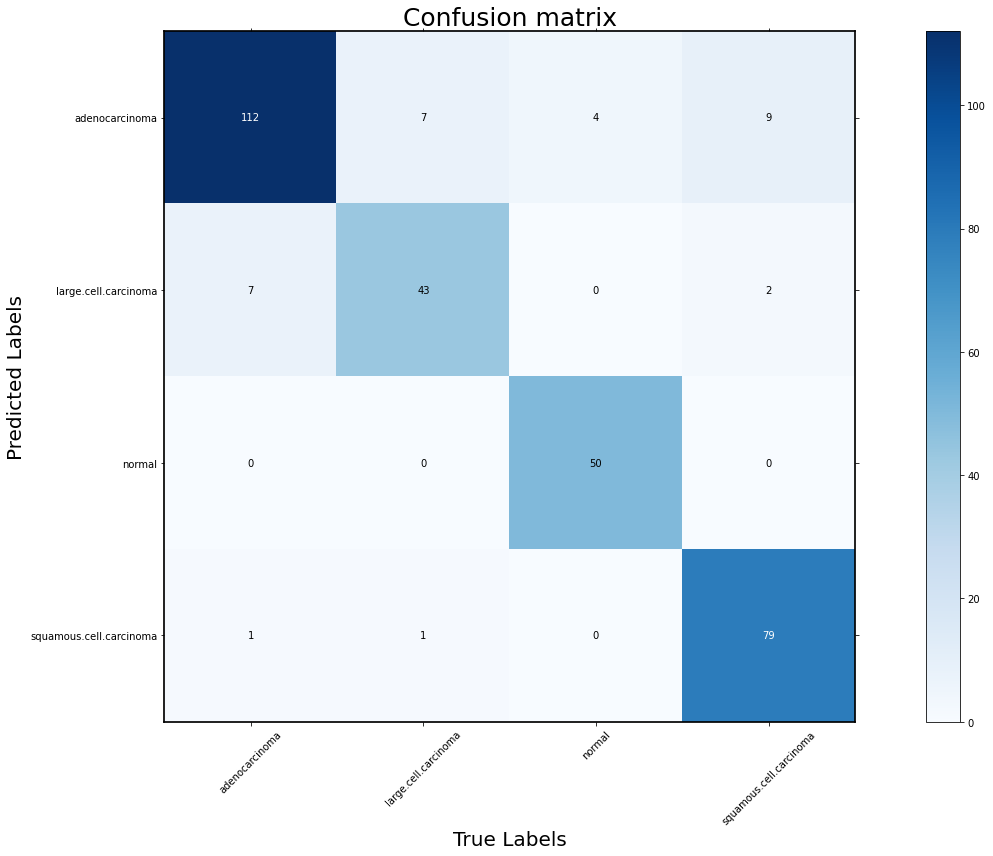

the model accuracy is  0.902
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.848   | 0.933  |    0.897    |  0.888   |
|   large.cell.carcinoma  |   0.827   | 0.843  |    0.966    |  0.835   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.975   | 0.878  |    0.991    |  0.924   |
+-------------------------+-----------+--------+-------------+----------+


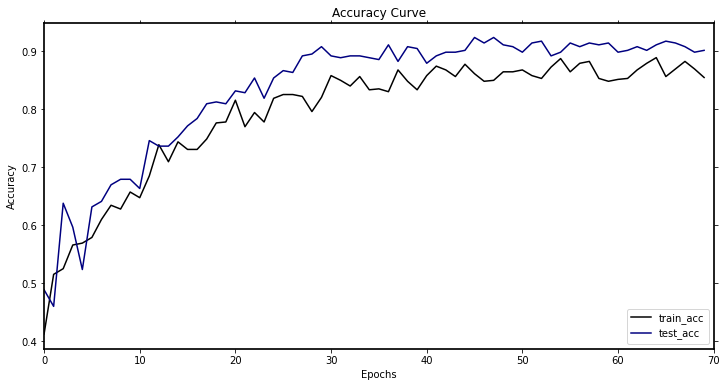

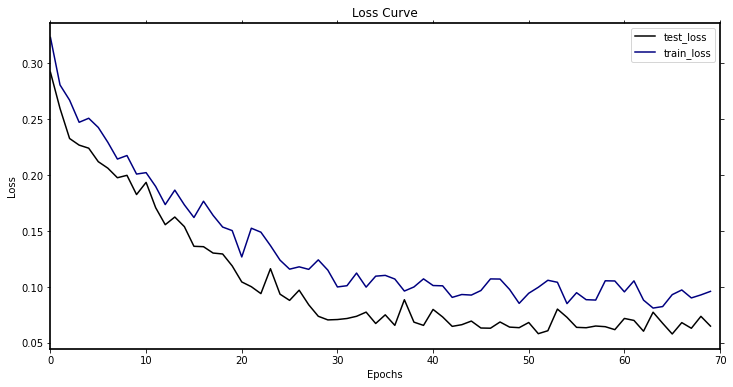

-----------第71轮训练开始-----------
训练次数：10934, 训练集正确率: 0.8531810766721044, Loss：60.165228785946965
第 71 轮测试集上的toal_Loss: 23.00930104253348, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[108.   2.   1.  11.]
 [ 10.  49.   0.   3.]
 [  0.   0.  53.   0.]
 [  2.   0.   0.  76.]]


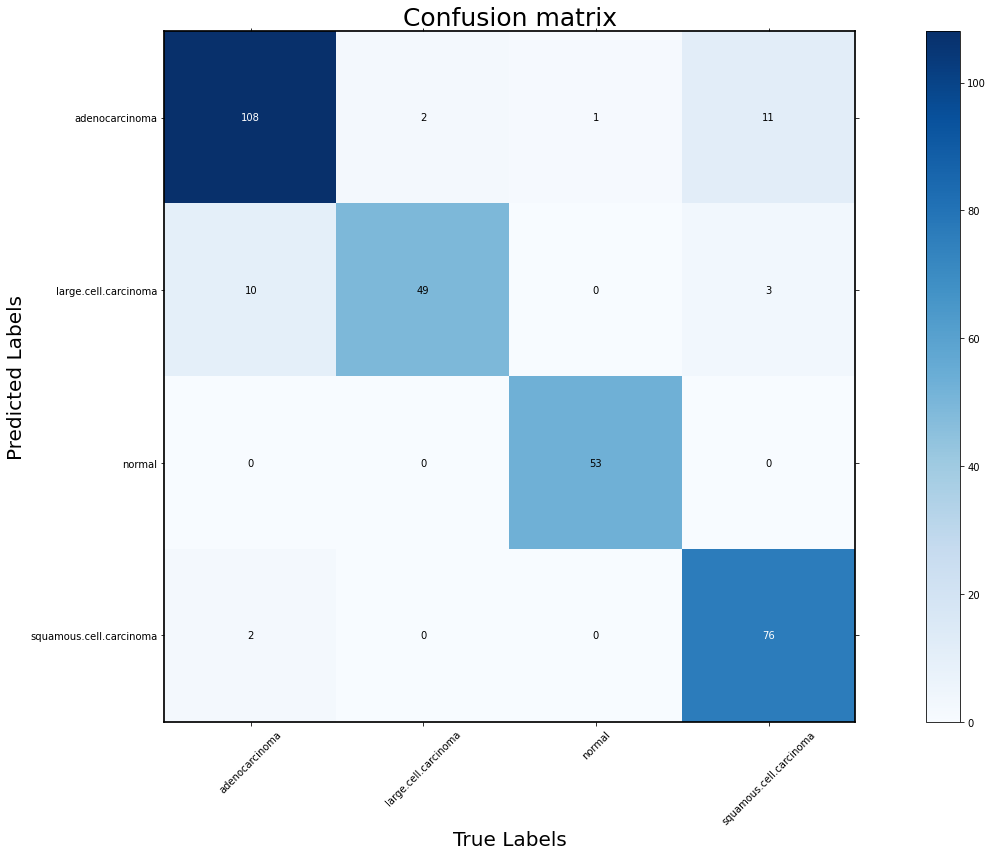

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.885   |  0.9   |    0.928    |  0.892   |
|   large.cell.carcinoma  |    0.79   | 0.961  |    0.951    |  0.867   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.974   | 0.844  |    0.991    |  0.904   |
+-------------------------+-----------+--------+-------------+----------+


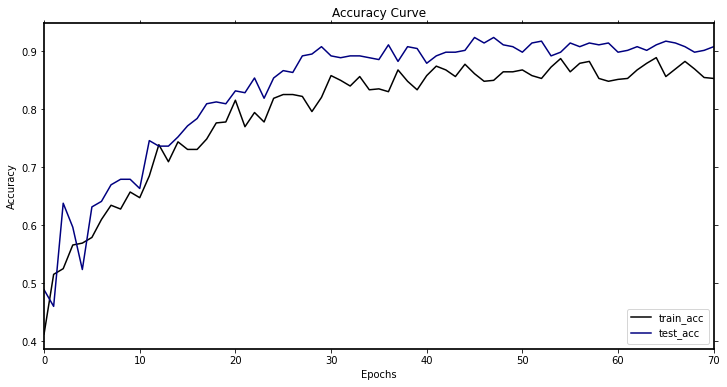

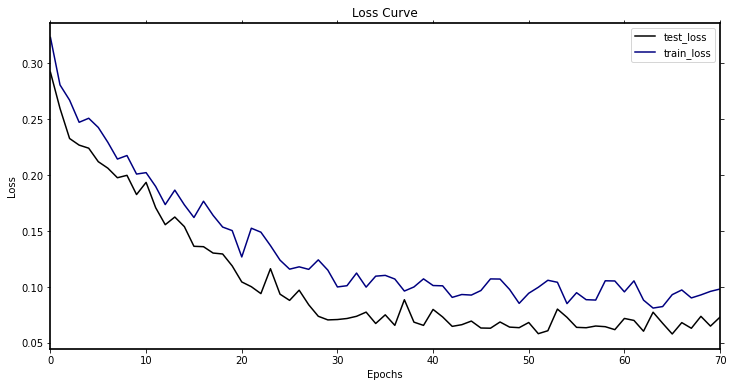

-----------第72轮训练开始-----------
训练次数：11088, 训练集正确率: 0.8809135399673735, Loss：50.24448649631813
第 72 轮测试集上的toal_Loss: 19.322339477483183, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.9238095238095239
[[110.   3.   3.   7.]
 [  8.  48.   0.   3.]
 [  0.   0.  51.   0.]
 [  2.   0.   0.  80.]]


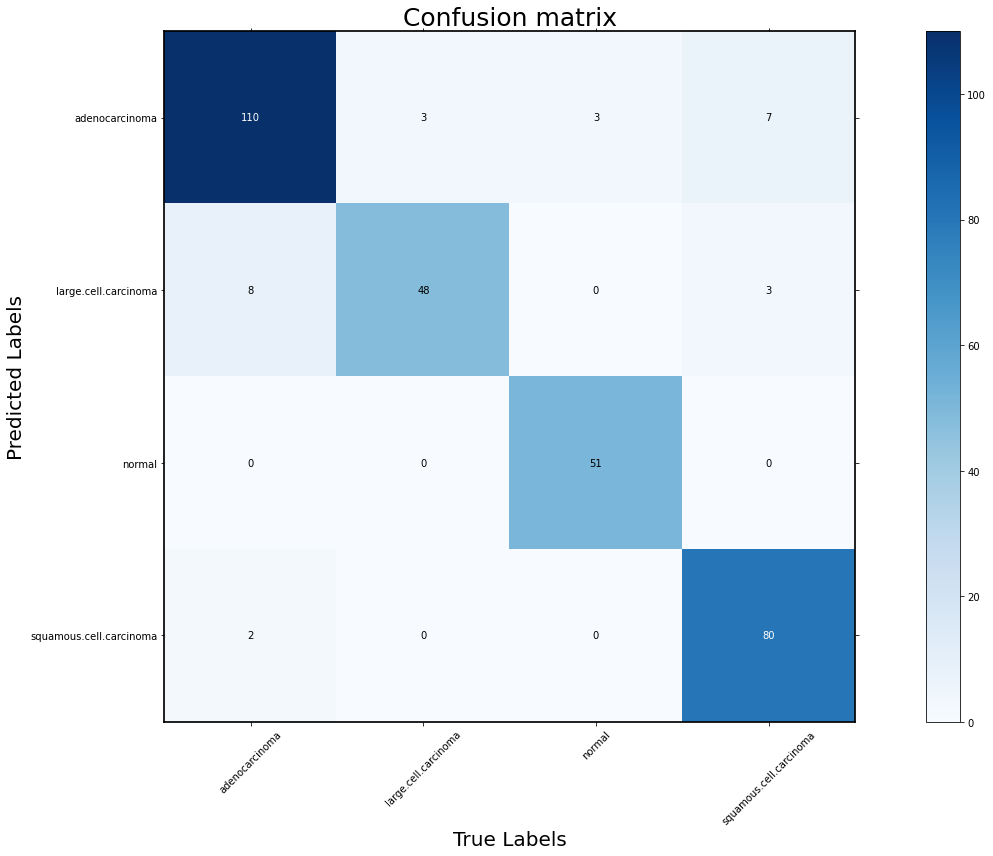

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.894   | 0.917  |    0.933    |  0.905   |
|   large.cell.carcinoma  |   0.814   | 0.941  |    0.958    |  0.873   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.976   | 0.889  |    0.991    |   0.93   |
+-------------------------+-----------+--------+-------------+----------+


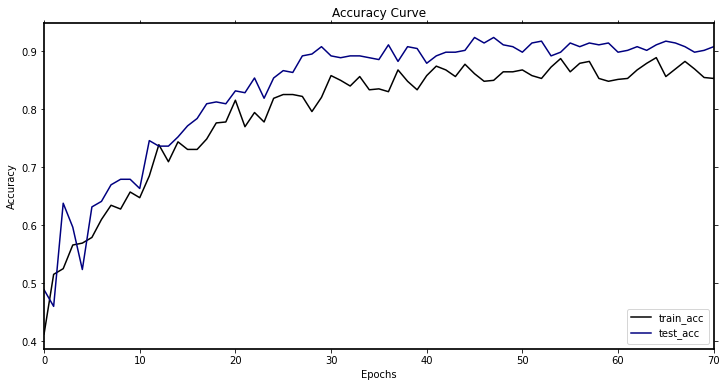

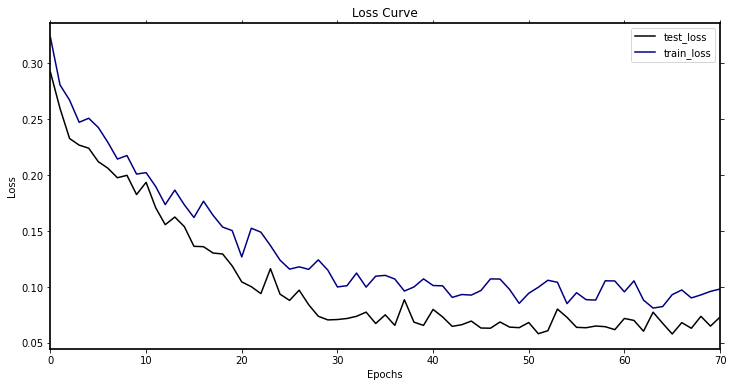

-----------第73轮训练开始-----------
训练次数：11242, 训练集正确率: 0.8417618270799347, Loss：62.90020808763802
第 73 轮测试集上的toal_Loss: 18.928098018281162, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[109.   5.   4.   5.]
 [  6.  45.   0.   1.]
 [  0.   0.  50.   0.]
 [  5.   1.   0.  84.]]


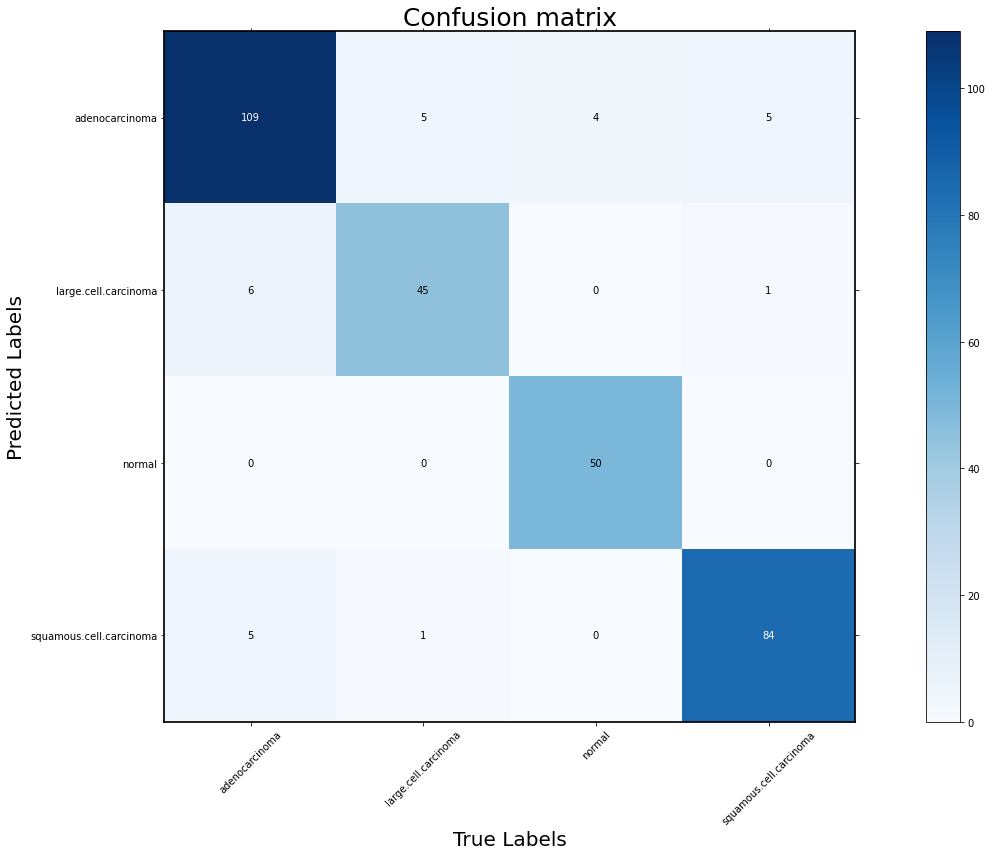

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.886   | 0.908  |    0.928    |  0.897   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.933   | 0.933  |    0.973    |  0.933   |
+-------------------------+-----------+--------+-------------+----------+


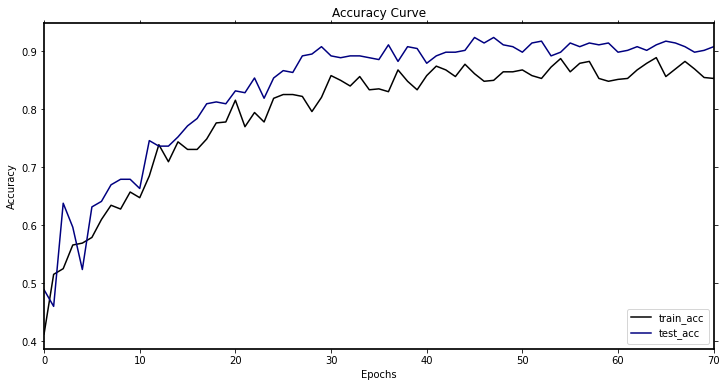

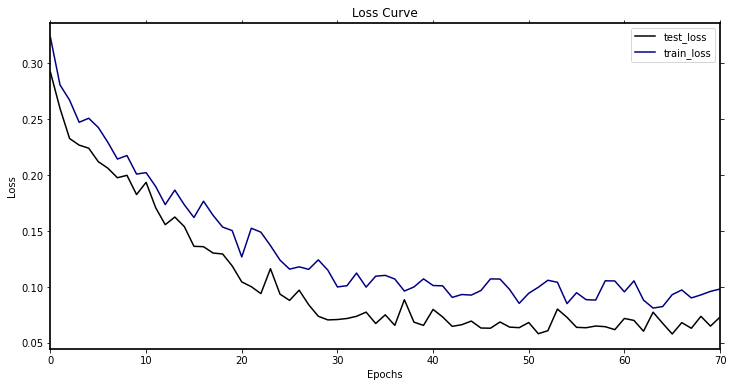

-----------第74轮训练开始-----------
训练次数：11396, 训练集正确率: 0.8809135399673735, Loss：53.964229537174106
第 74 轮测试集上的toal_Loss: 21.56490822788328, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[99.  2.  4.  2.]
 [ 6. 49.  0.  0.]
 [ 0.  0. 50.  0.]
 [15.  0.  0. 88.]]


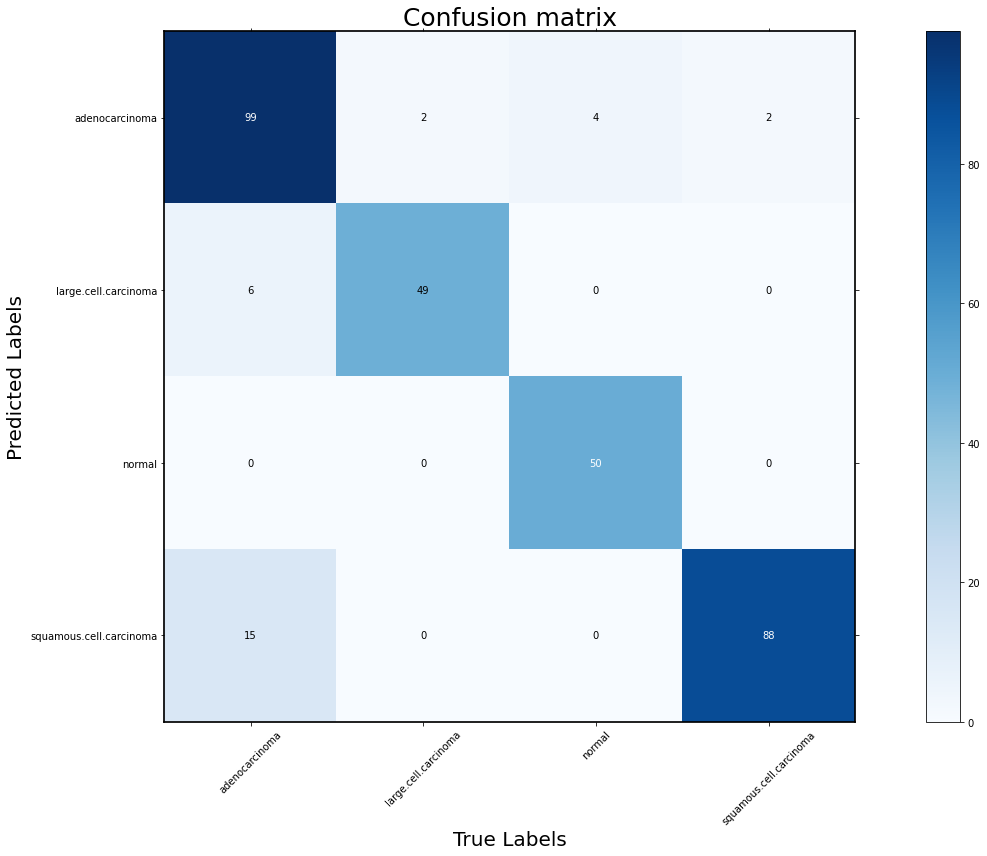

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.925   | 0.825  |    0.959    |  0.872   |
|   large.cell.carcinoma  |   0.891   | 0.961  |    0.977    |  0.925   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.854   | 0.978  |    0.933    |  0.912   |
+-------------------------+-----------+--------+-------------+----------+


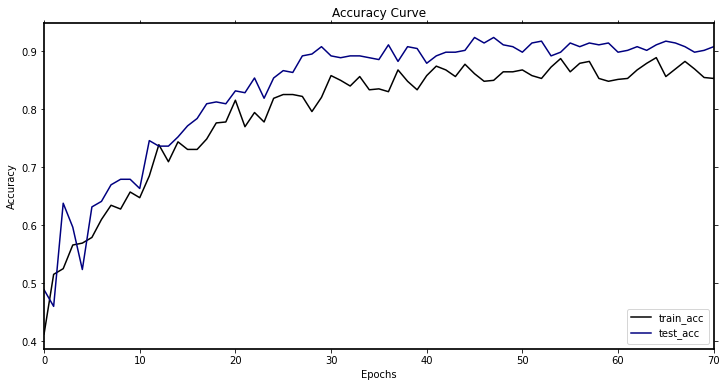

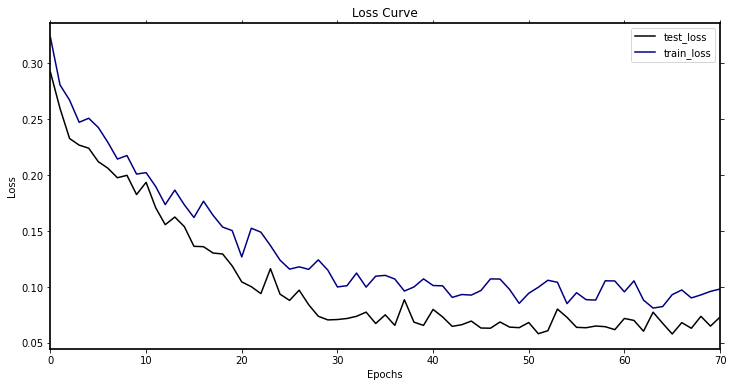

-----------第75轮训练开始-----------
训练次数：11550, 训练集正确率: 0.8482871125611745, Loss：63.753579393960536
第 75 轮测试集上的toal_Loss: 19.78313992731273, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.9238095238095239
[[105.   4.   4.   3.]
 [  7.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [  8.   2.   0.  87.]]


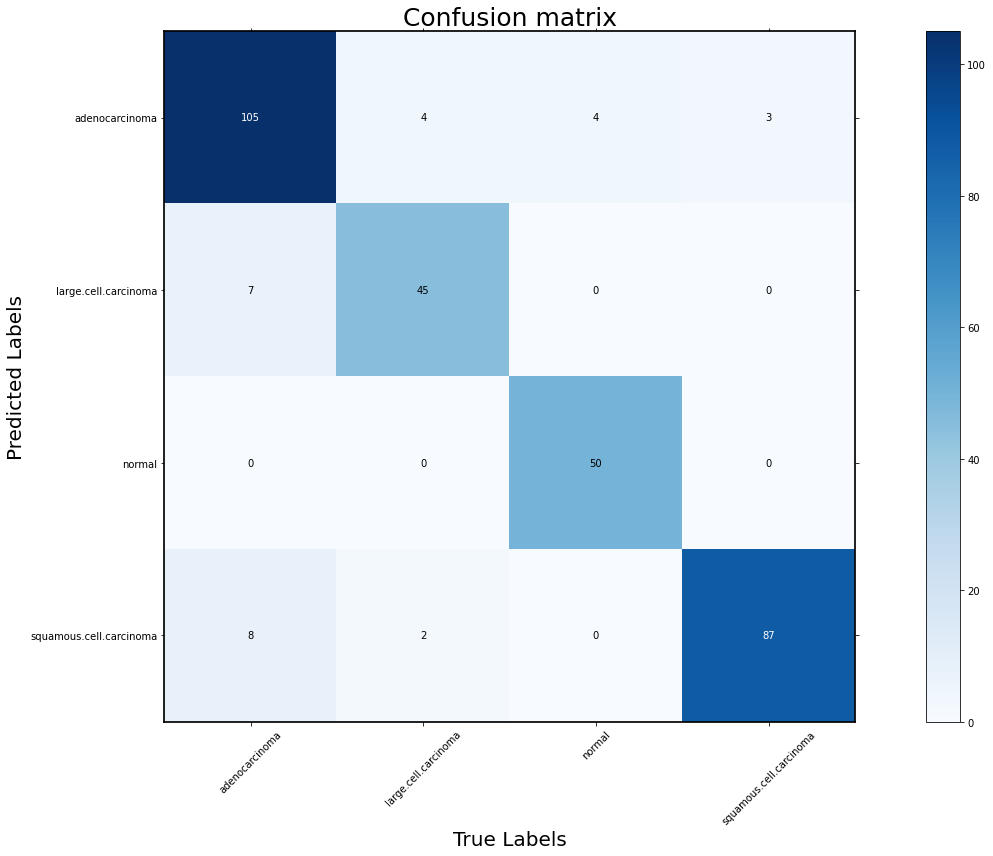

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.905   | 0.875  |    0.944    |   0.89   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.897   | 0.967  |    0.956    |  0.931   |
+-------------------------+-----------+--------+-------------+----------+


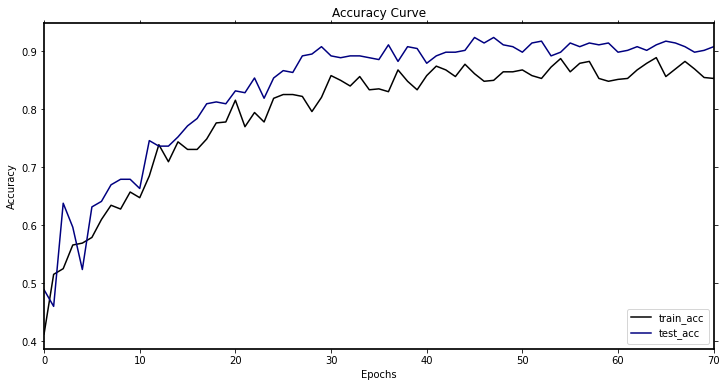

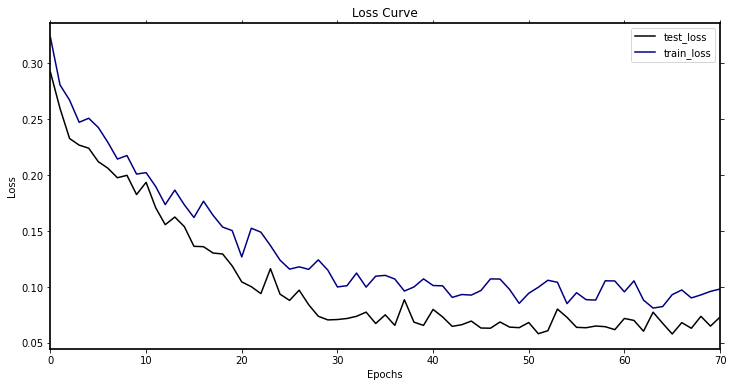

-----------第76轮训练开始-----------
训练次数：11704, 训练集正确率: 0.8613376835236541, Loss：60.546599658206105
第 76 轮测试集上的toal_Loss: 19.796456342563033, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.9238095238095239
[[109.   3.   4.   8.]
 [  8.  48.   0.   1.]
 [  0.   0.  50.   0.]
 [  3.   0.   0.  81.]]


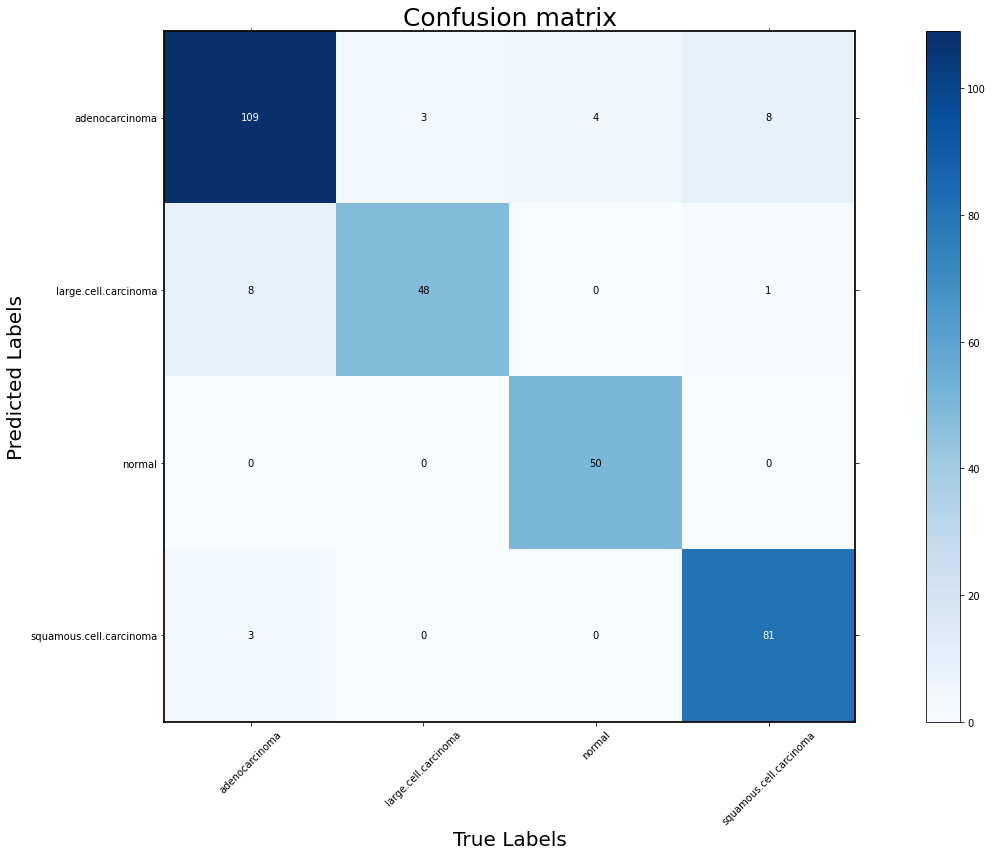

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.879   | 0.908  |    0.923    |  0.893   |
|   large.cell.carcinoma  |   0.842   | 0.941  |    0.966    |  0.889   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.964   |  0.9   |    0.987    |  0.931   |
+-------------------------+-----------+--------+-------------+----------+


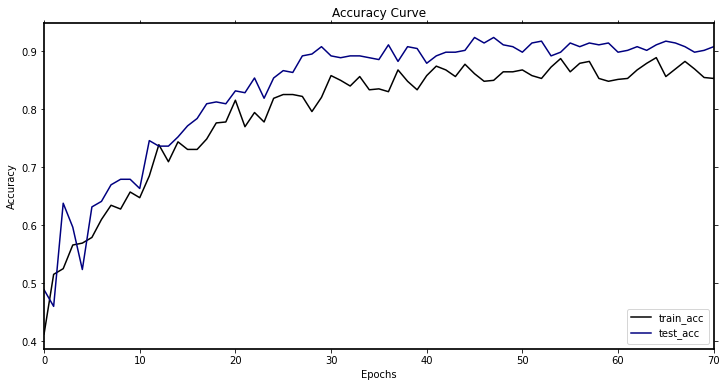

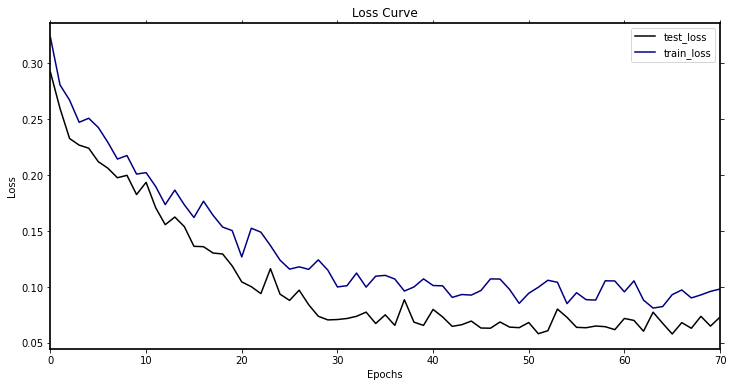

-----------第77轮训练开始-----------
训练次数：11858, 训练集正确率: 0.8384991843393148, Loss：66.35299464967102
第 77 轮测试集上的toal_Loss: 20.11300891963765, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.9238095238095239
[[106.   7.   4.   3.]
 [  6.  43.   0.   0.]
 [  0.   0.  50.   0.]
 [  8.   1.   0.  87.]]


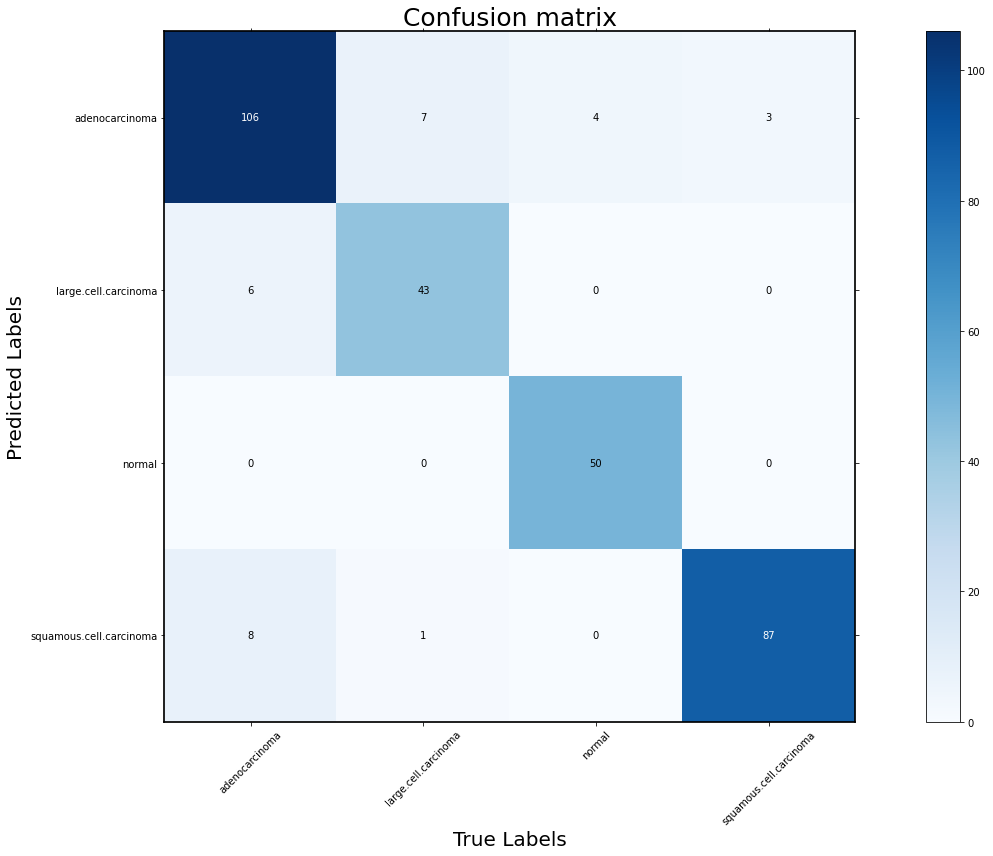

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.883   | 0.883  |    0.928    |  0.883   |
|   large.cell.carcinoma  |   0.878   | 0.843  |    0.977    |   0.86   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.906   | 0.967  |     0.96    |  0.936   |
+-------------------------+-----------+--------+-------------+----------+


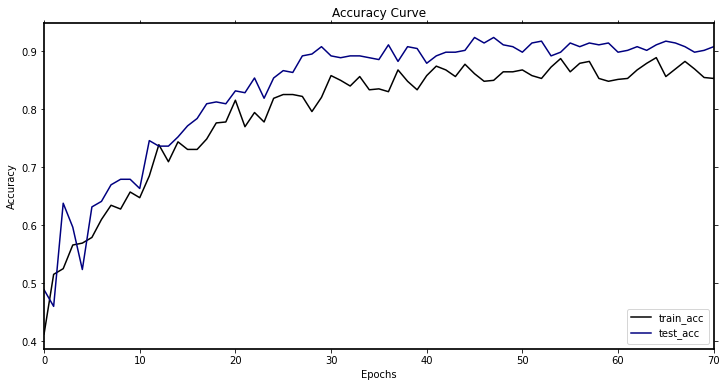

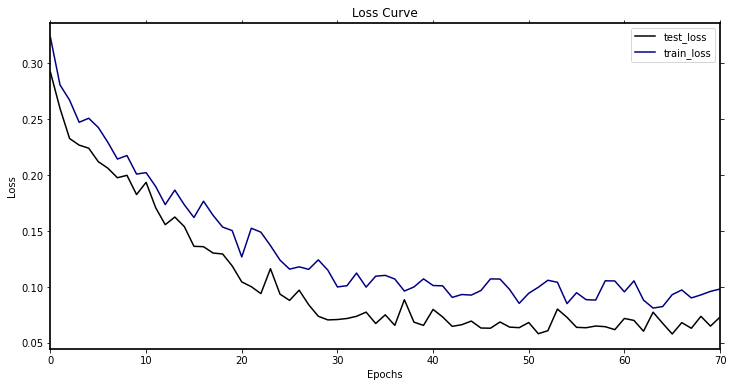

-----------第78轮训练开始-----------
训练次数：12012, 训练集正确率: 0.8564437194127243, Loss：60.819088684394956
第 78 轮测试集上的toal_Loss: 18.508322410751134, 正确率： 0.926984126984127
Top-1准确率为:{} 0.926984126984127
[[108.   4.   1.   6.]
 [  7.  47.   0.   0.]
 [  0.   0.  53.   0.]
 [  5.   0.   0.  84.]]


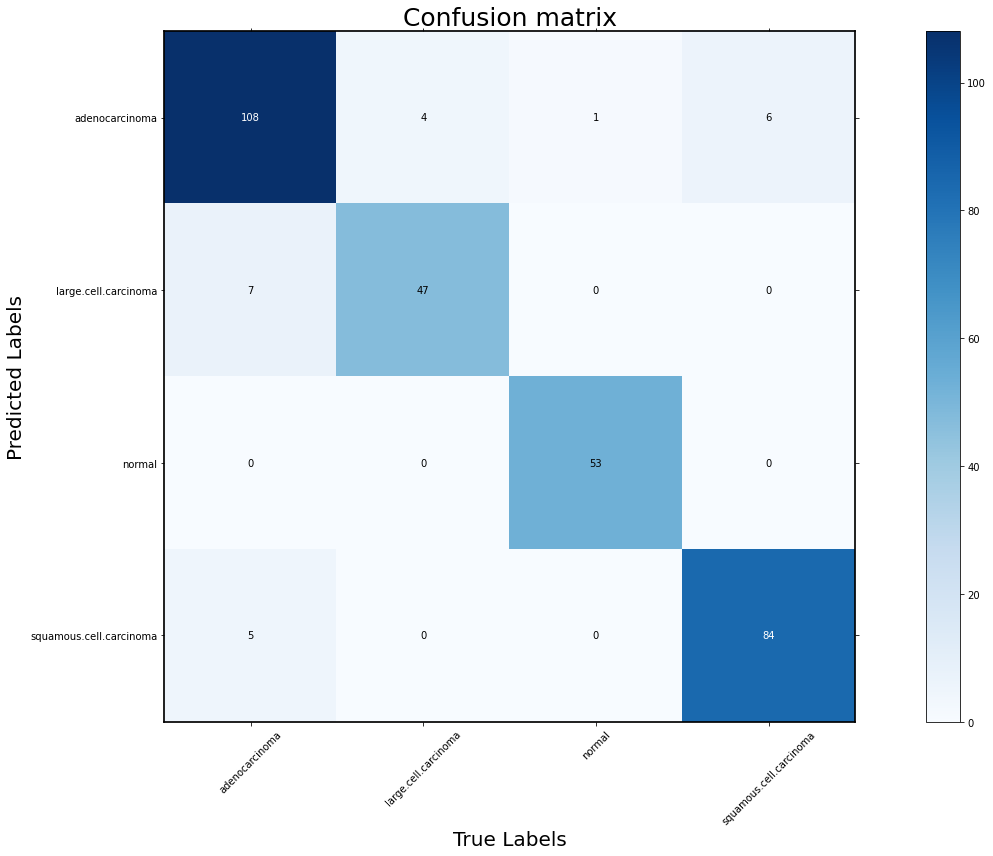

the model accuracy is  0.927
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.908   |  0.9   |    0.944    |  0.904   |
|   large.cell.carcinoma  |    0.87   | 0.922  |    0.973    |  0.895   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.944   | 0.933  |    0.978    |  0.938   |
+-------------------------+-----------+--------+-------------+----------+


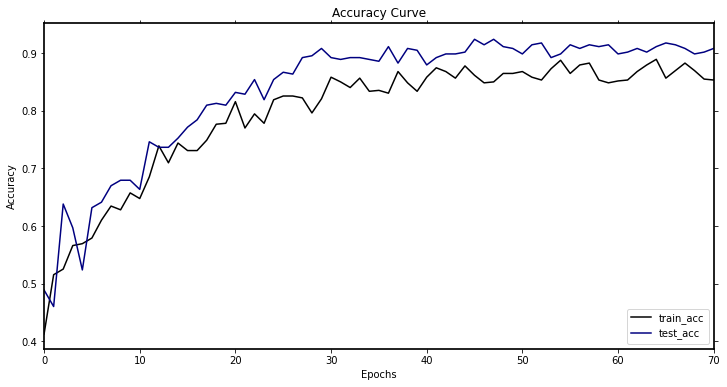

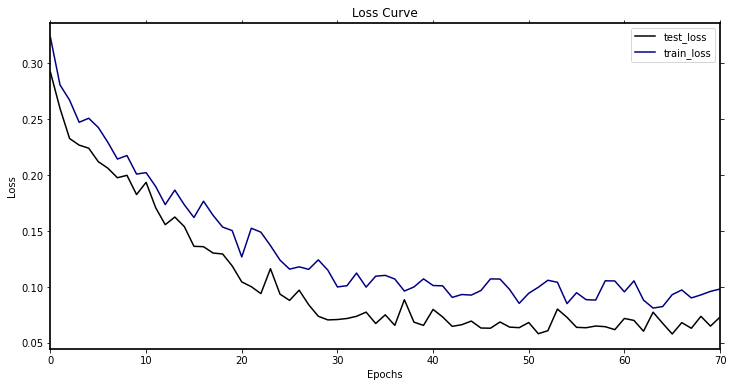

-----------第79轮训练开始-----------
训练次数：12166, 训练集正确率: 0.8776508972267537, Loss：52.2456920966506
第 79 轮测试集上的toal_Loss: 19.82508826069534, 正确率： 0.9015873015873016
Top-1准确率为:{} 0.926984126984127
[[105.   7.   3.   5.]
 [  7.  44.   0.   0.]
 [  0.   0.  50.   0.]
 [  8.   0.   1.  85.]]


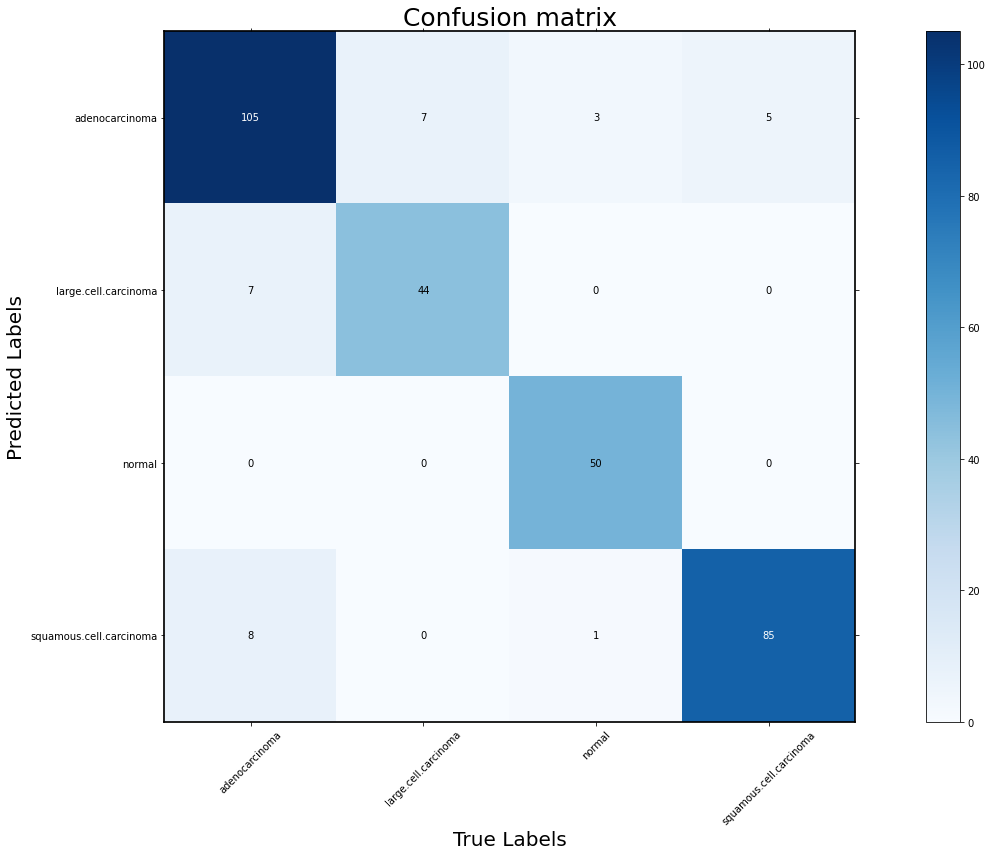

the model accuracy is  0.902
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.875   | 0.875  |    0.923    |  0.875   |
|   large.cell.carcinoma  |   0.863   | 0.863  |    0.973    |  0.863   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.904   | 0.944  |     0.96    |  0.924   |
+-------------------------+-----------+--------+-------------+----------+


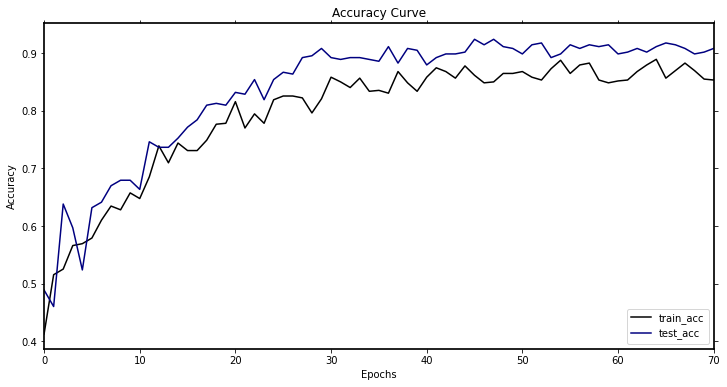

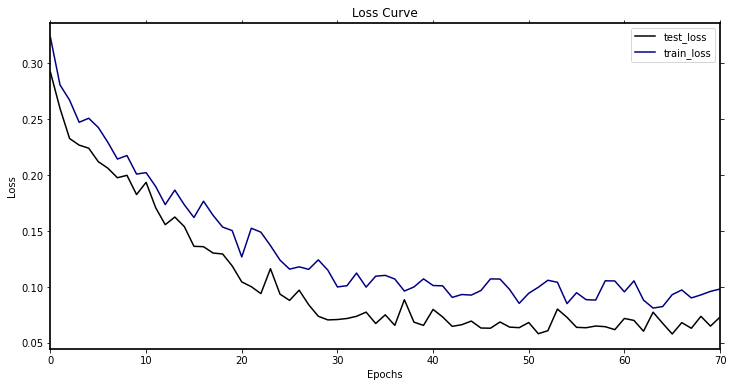

-----------第80轮训练开始-----------
训练次数：12320, 训练集正确率: 0.8466557911908646, Loss：67.44899035617709
第 80 轮测试集上的toal_Loss: 20.820662445388734, 正确率： 0.8952380952380953
Top-1准确率为:{} 0.926984126984127
[[102.   6.   3.   4.]
 [  6.  44.   0.   0.]
 [  0.   0.  50.   0.]
 [ 12.   1.   1.  86.]]


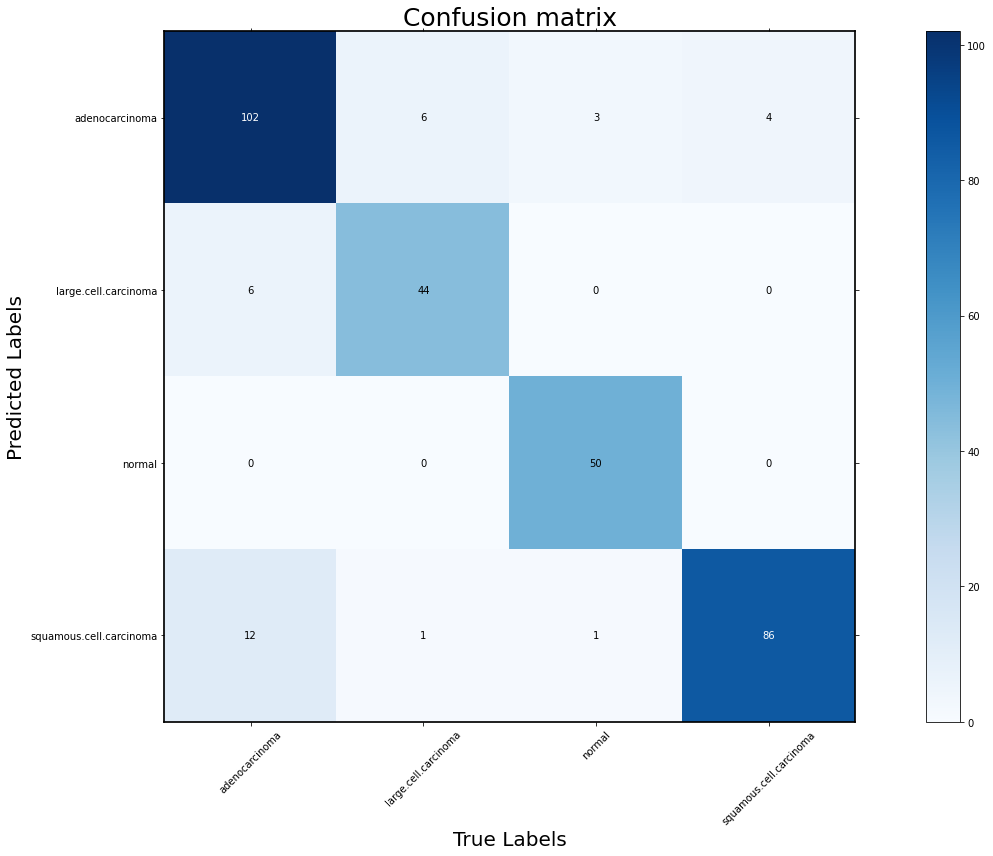

the model accuracy is  0.895
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.887   |  0.85  |    0.933    |  0.868   |
|   large.cell.carcinoma  |    0.88   | 0.863  |    0.977    |  0.871   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |    0.86   | 0.956  |    0.938    |  0.905   |
+-------------------------+-----------+--------+-------------+----------+


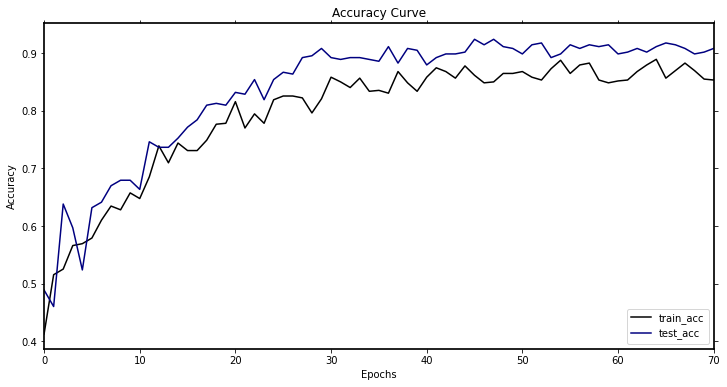

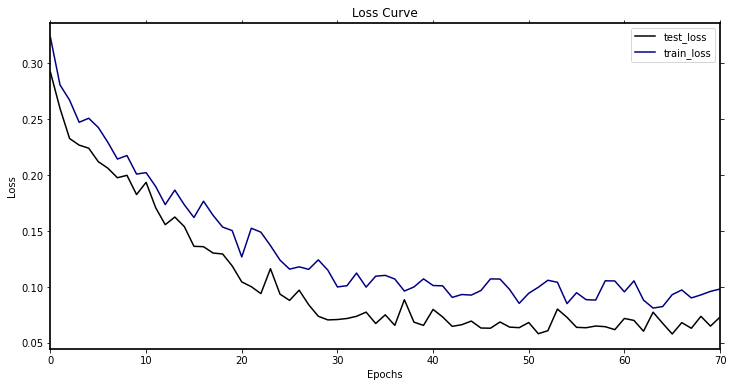

-----------第81轮训练开始-----------
训练次数：12474, 训练集正确率: 0.8841761827079935, Loss：51.9219771977514
第 81 轮测试集上的toal_Loss: 20.161730139516294, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.926984126984127
[[106.   5.   2.   2.]
 [  4.  43.   0.   0.]
 [  0.   0.  52.   0.]
 [ 10.   3.   0.  88.]]


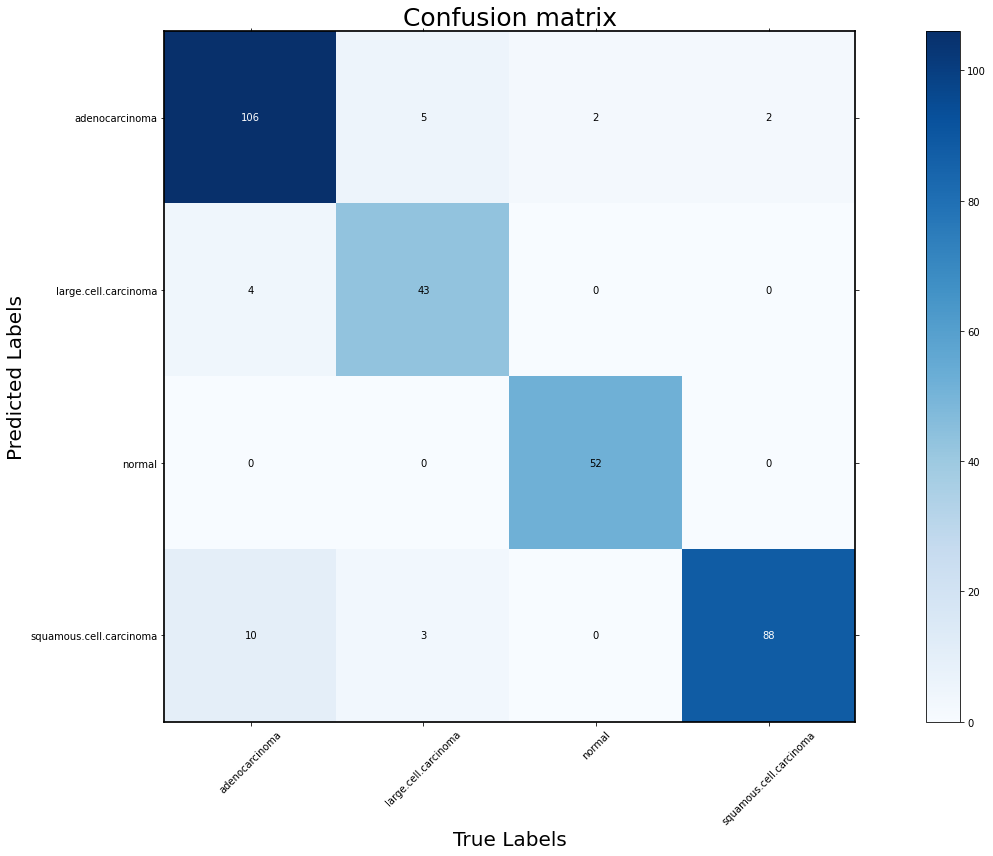

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.922   | 0.883  |    0.954    |  0.902   |
|   large.cell.carcinoma  |   0.915   | 0.843  |    0.985    |  0.878   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.871   | 0.978  |    0.942    |  0.921   |
+-------------------------+-----------+--------+-------------+----------+


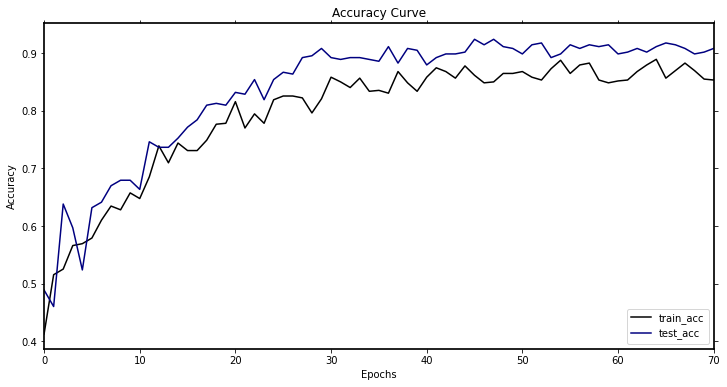

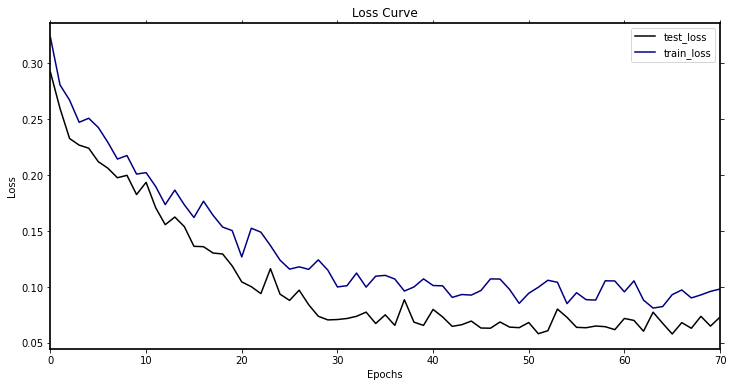

-----------第82轮训练开始-----------
训练次数：12628, 训练集正确率: 0.8825448613376835, Loss：54.51575827784836
第 82 轮测试集上的toal_Loss: 21.444733689539135, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.926984126984127
[[110.   5.   3.  12.]
 [  7.  46.   0.   2.]
 [  0.   0.  51.   0.]
 [  3.   0.   0.  76.]]


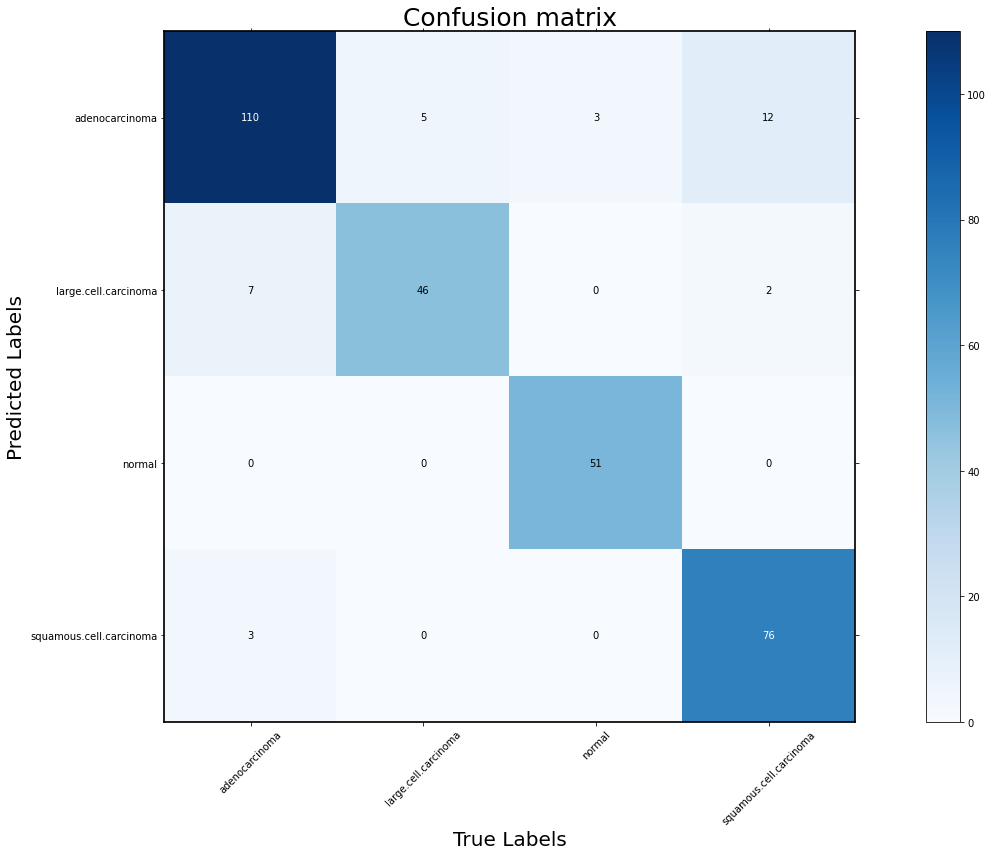

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.846   | 0.917  |    0.897    |   0.88   |
|   large.cell.carcinoma  |   0.836   | 0.902  |    0.966    |  0.868   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.962   | 0.844  |    0.987    |  0.899   |
+-------------------------+-----------+--------+-------------+----------+


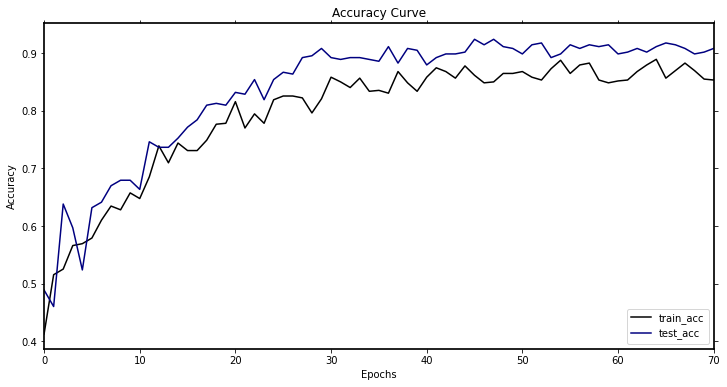

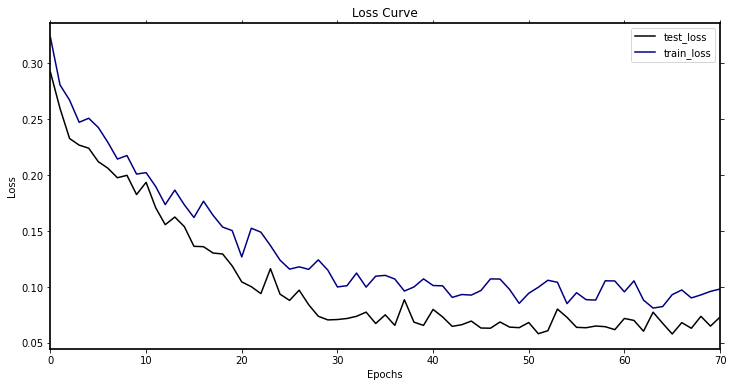

-----------第83轮训练开始-----------
训练次数：12782, 训练集正确率: 0.8727569331158238, Loss：51.65774656739086
第 83 轮测试集上的toal_Loss: 18.877479115035385, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.926984126984127
[[111.   6.   3.   7.]
 [  6.  45.   0.   1.]
 [  0.   0.  51.   0.]
 [  3.   0.   0.  82.]]


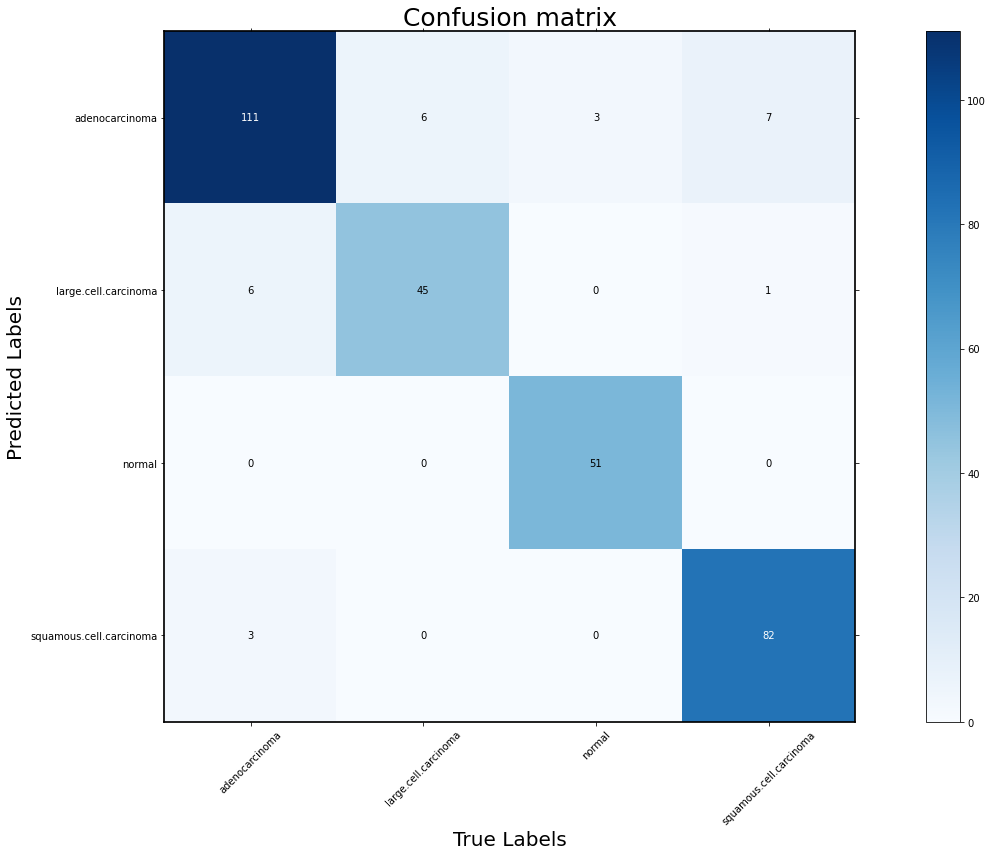

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.874   | 0.925  |    0.918    |  0.899   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.965   | 0.911  |    0.987    |  0.937   |
+-------------------------+-----------+--------+-------------+----------+


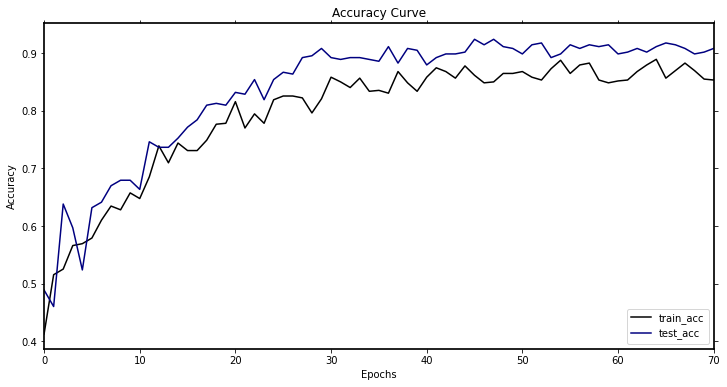

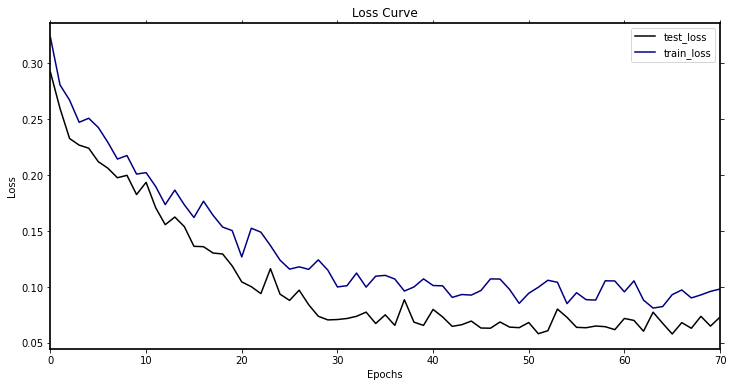

-----------第84轮训练开始-----------
训练次数：12936, 训练集正确率: 0.8858075040783034, Loss：52.77104200236499
第 84 轮测试集上的toal_Loss: 20.813231323380023, 正确率： 0.9206349206349206
Top-1准确率为:{} 0.926984126984127
[[103.   4.   1.   3.]
 [  6.  47.   0.   0.]
 [  0.   0.  53.   0.]
 [ 11.   0.   0.  87.]]


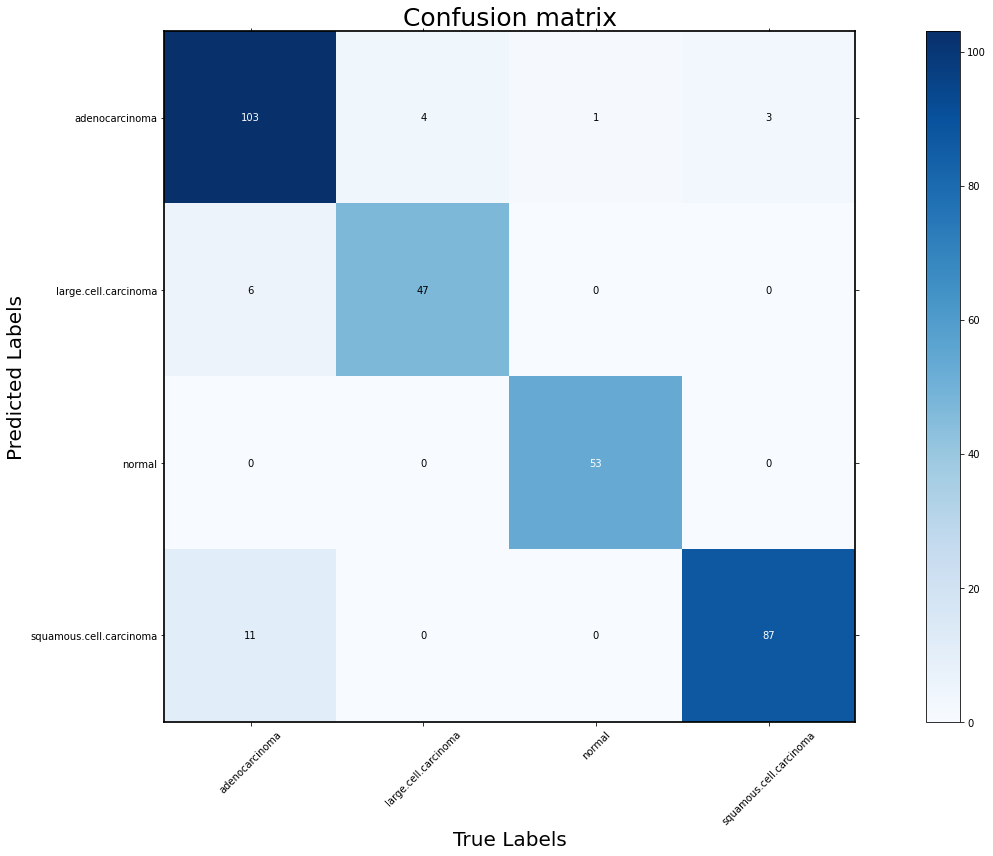

the model accuracy is  0.921
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.928   | 0.858  |    0.959    |  0.892   |
|   large.cell.carcinoma  |   0.887   | 0.922  |    0.977    |  0.904   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.888   | 0.967  |    0.951    |  0.926   |
+-------------------------+-----------+--------+-------------+----------+


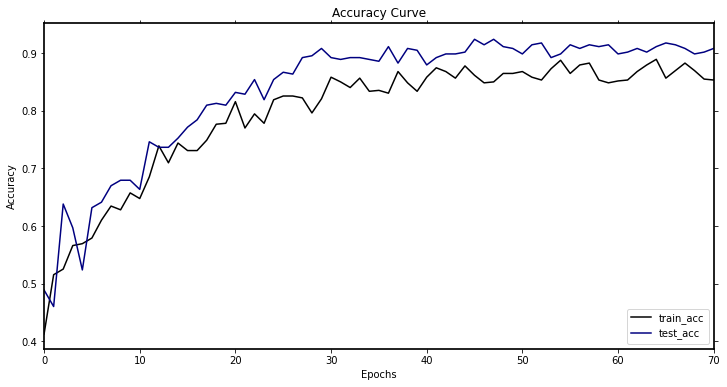

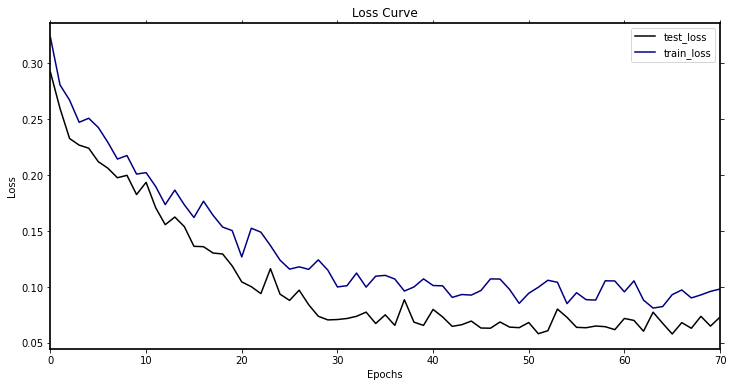

-----------第85轮训练开始-----------
训练次数：13090, 训练集正确率: 0.8694942903752039, Loss：57.31920537352562
第 85 轮测试集上的toal_Loss: 19.540691080968827, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.926984126984127
[[103.   5.   1.   2.]
 [  6.  44.   0.   0.]
 [  0.   0.  53.   0.]
 [ 11.   2.   0.  88.]]


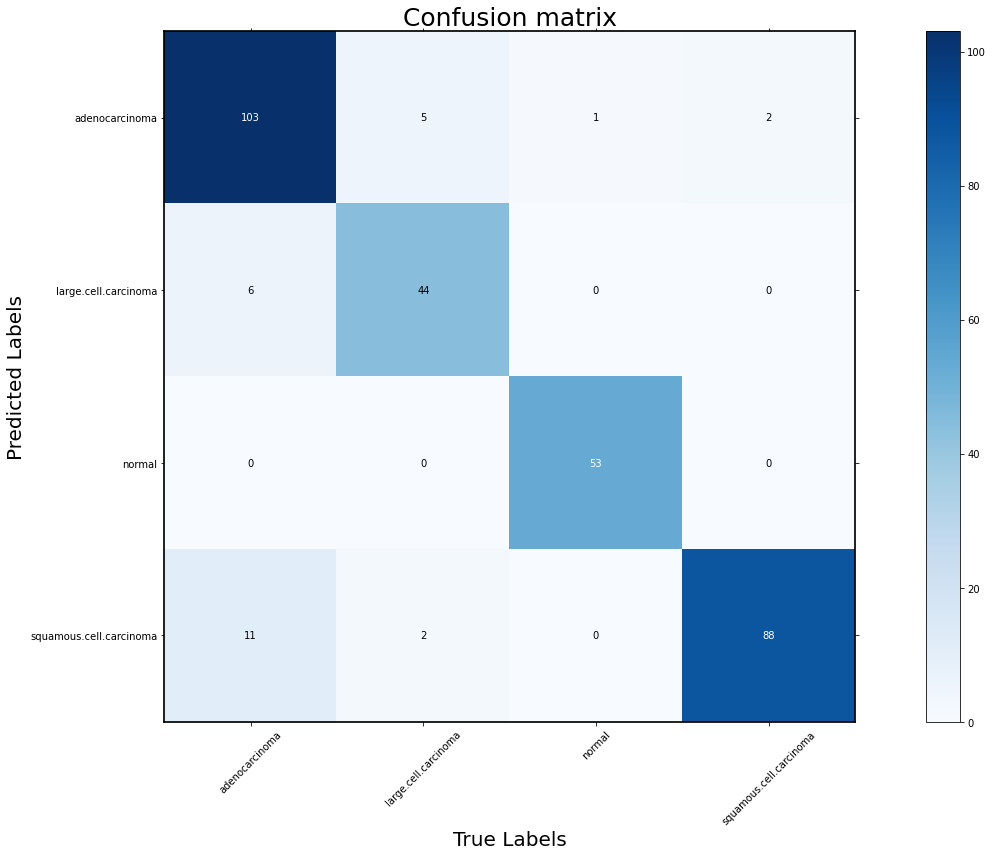

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.928   | 0.858  |    0.959    |  0.892   |
|   large.cell.carcinoma  |    0.88   | 0.863  |    0.977    |  0.871   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.871   | 0.978  |    0.942    |  0.921   |
+-------------------------+-----------+--------+-------------+----------+


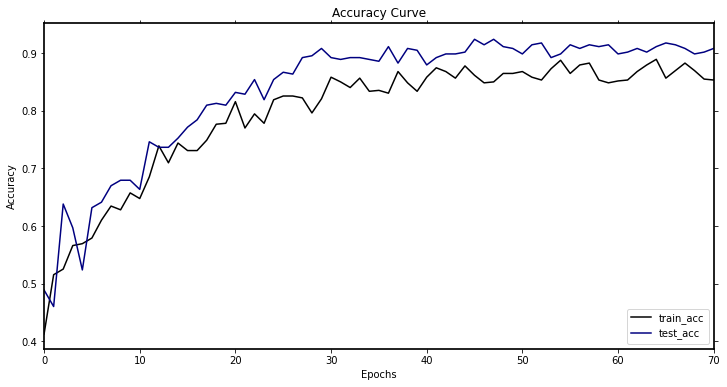

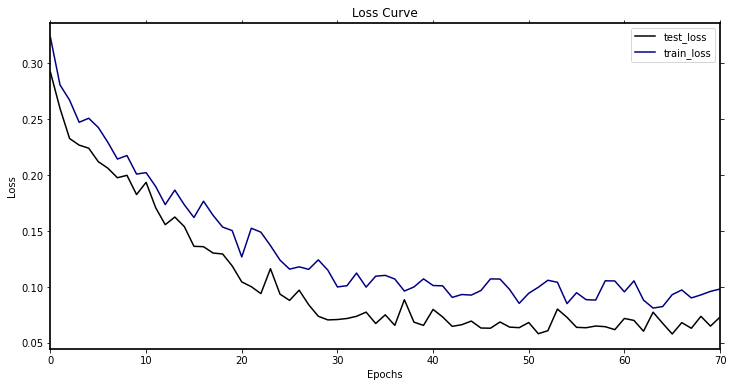

-----------第86轮训练开始-----------
训练次数：13244, 训练集正确率: 0.8792822185970636, Loss：53.671769032254815
第 86 轮测试集上的toal_Loss: 19.98350962717086, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.926984126984127
[[105.   4.   3.   6.]
 [  7.  47.   0.   0.]
 [  0.   0.  51.   0.]
 [  8.   0.   0.  84.]]


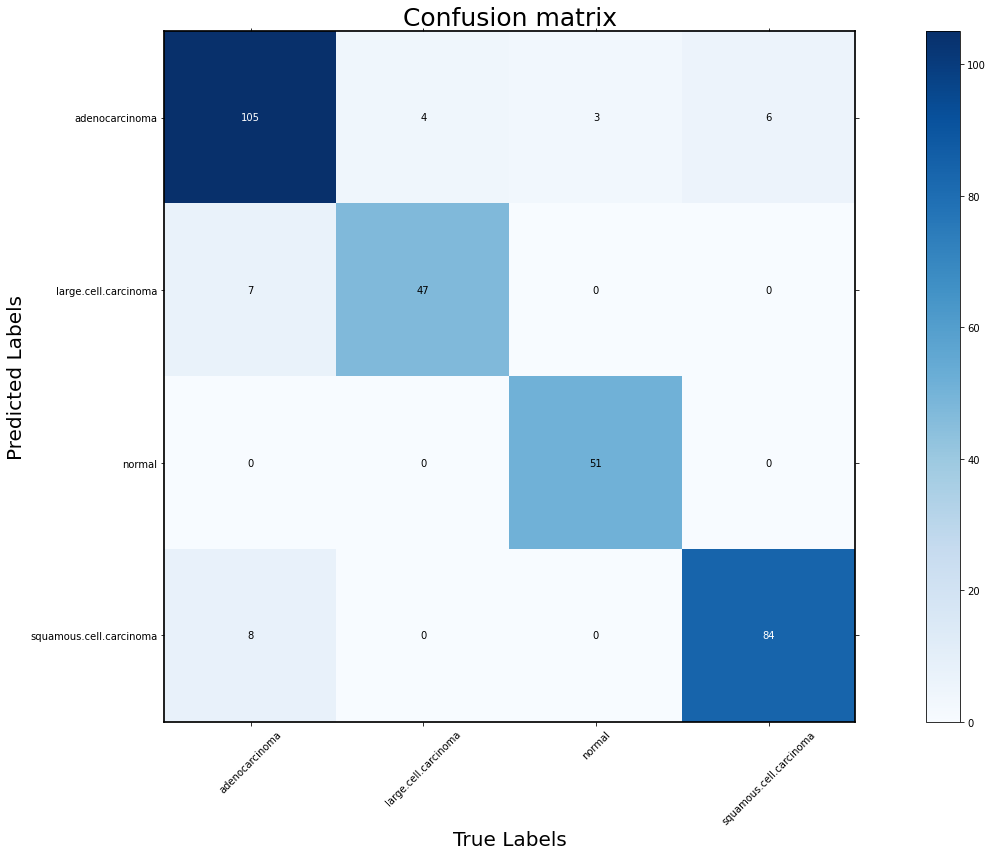

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.89   | 0.875  |    0.933    |  0.882   |
|   large.cell.carcinoma  |    0.87   | 0.922  |    0.973    |  0.895   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.913   | 0.933  |    0.964    |  0.923   |
+-------------------------+-----------+--------+-------------+----------+


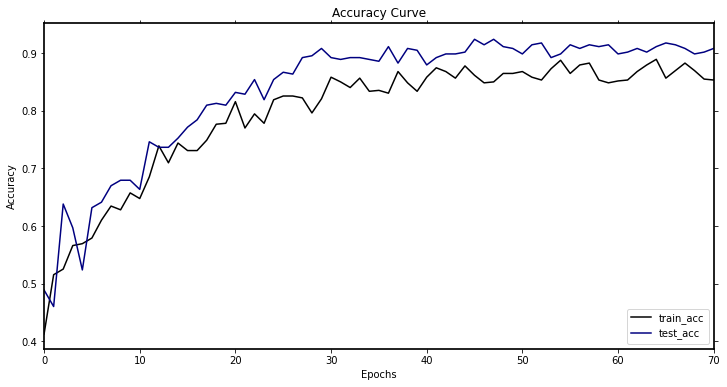

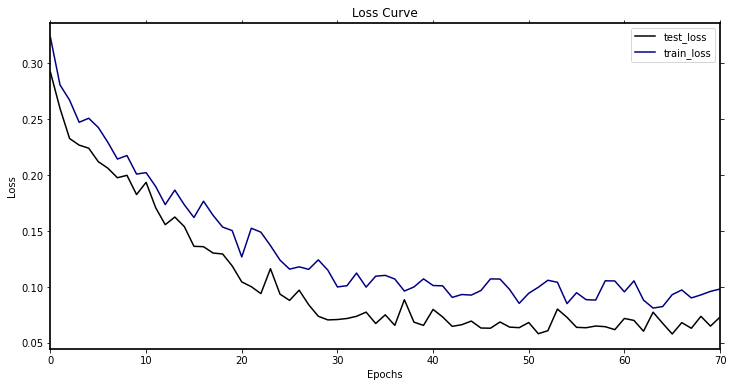

-----------第87轮训练开始-----------
训练次数：13398, 训练集正确率: 0.8694942903752039, Loss：61.571539878845215
第 87 轮测试集上的toal_Loss: 23.992070212960243, 正确率： 0.8793650793650793
Top-1准确率为:{} 0.926984126984127
[[94.  3.  4.  3.]
 [ 6. 46.  0.  0.]
 [ 1.  0. 50.  0.]
 [19.  2.  0. 87.]]


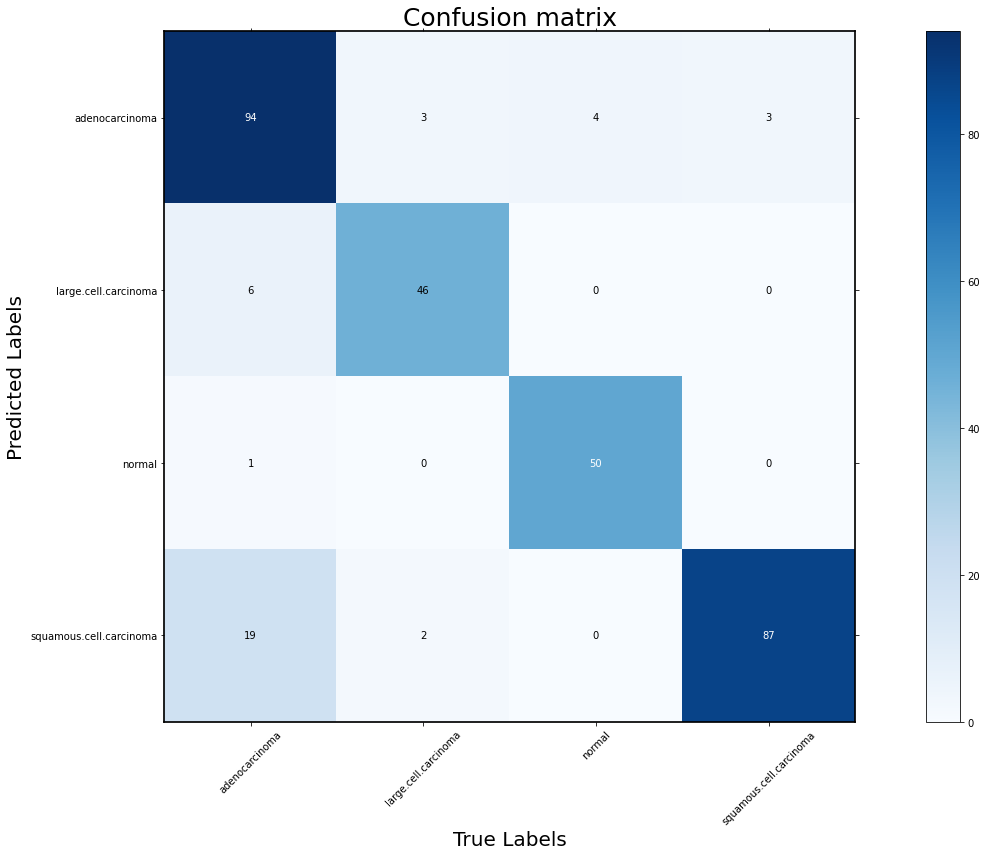

the model accuracy is  0.879
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.904   | 0.783  |    0.949    |  0.839   |
|   large.cell.carcinoma  |   0.885   | 0.902  |    0.977    |  0.893   |
|          normal         |    0.98   | 0.926  |    0.996    |  0.952   |
| squamous.cell.carcinoma |   0.806   | 0.967  |    0.907    |  0.879   |
+-------------------------+-----------+--------+-------------+----------+


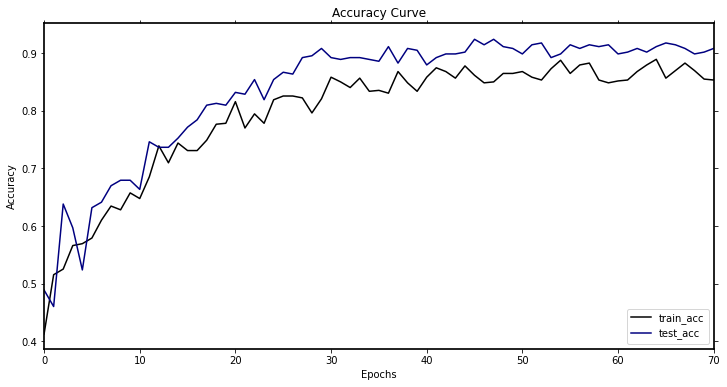

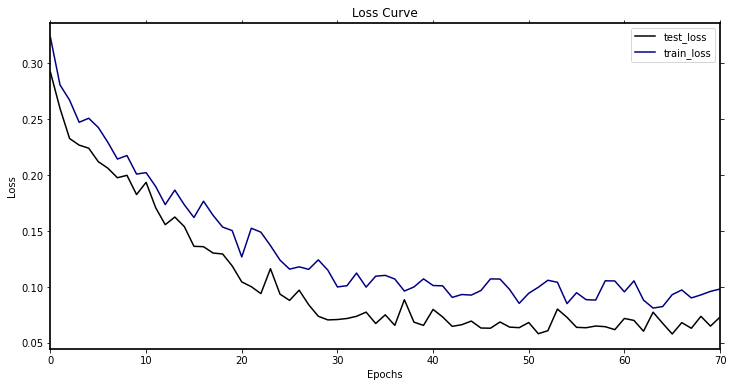

-----------第88轮训练开始-----------
训练次数：13552, 训练集正确率: 0.8694942903752039, Loss：55.15333325788379
第 88 轮测试集上的toal_Loss: 19.11529842368327, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.926984126984127
[[108.   4.   1.   9.]
 [  7.  47.   0.   1.]
 [  0.   0.  53.   0.]
 [  5.   0.   0.  80.]]


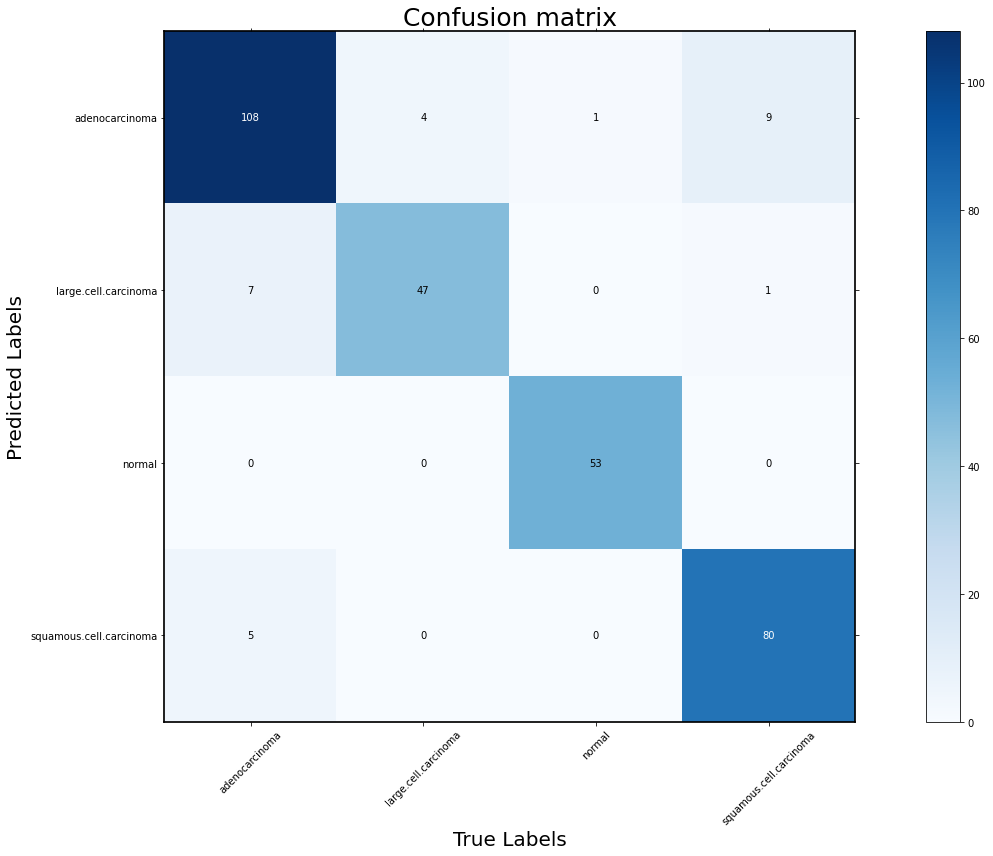

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.885   |  0.9   |    0.928    |  0.892   |
|   large.cell.carcinoma  |   0.855   | 0.922  |     0.97    |  0.887   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.941   | 0.889  |    0.978    |  0.914   |
+-------------------------+-----------+--------+-------------+----------+


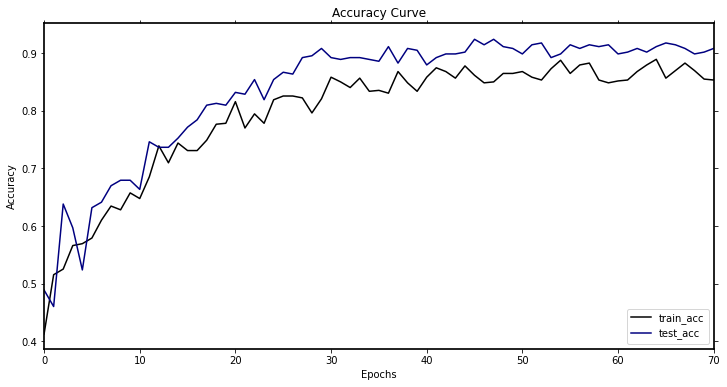

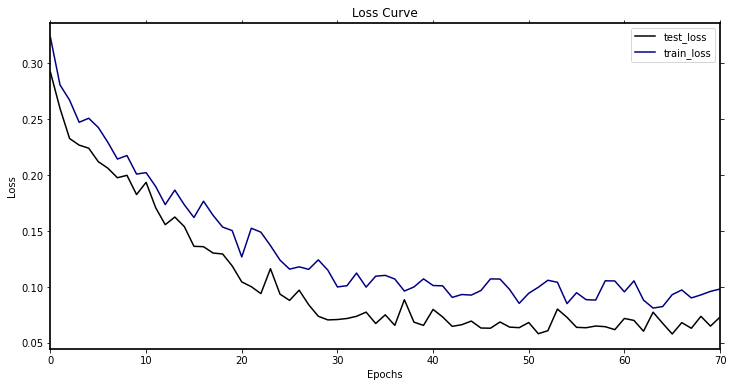

-----------第89轮训练开始-----------
训练次数：13706, 训练集正确率: 0.8629690048939641, Loss：61.06921551935375
第 89 轮测试集上的toal_Loss: 19.836393140256405, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.926984126984127
[[108.   3.   4.   8.]
 [  8.  48.   0.   2.]
 [  0.   0.  50.   0.]
 [  4.   0.   0.  80.]]


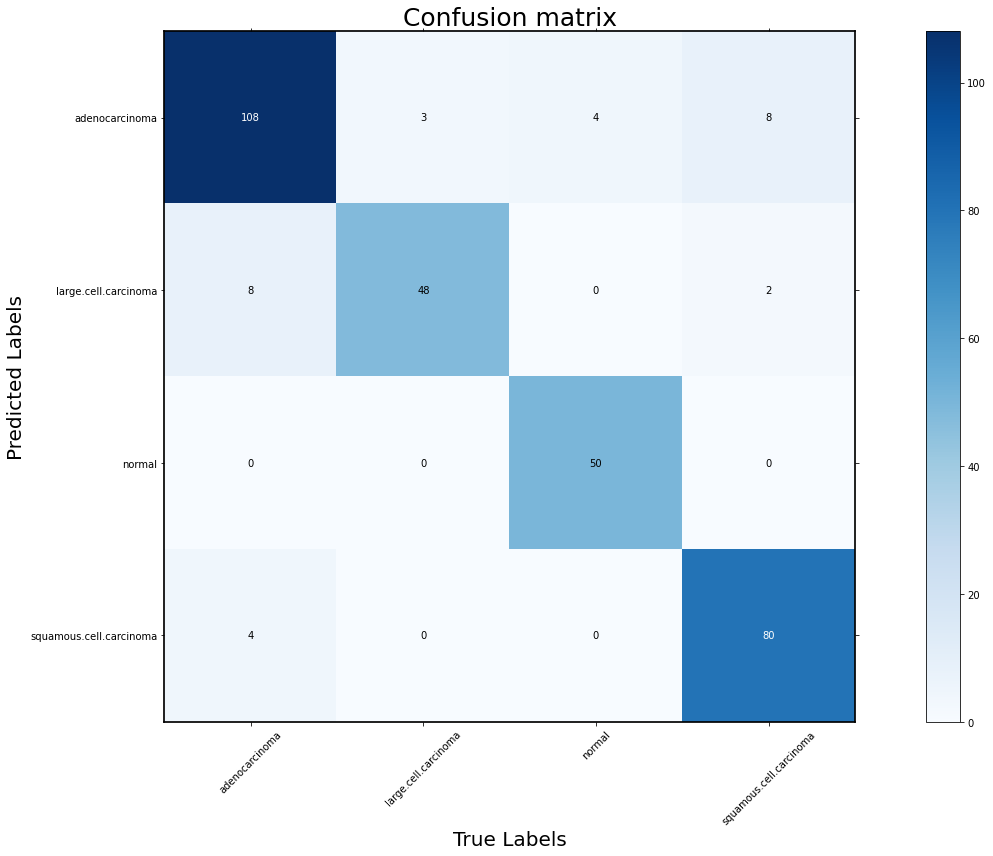

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.878   |  0.9   |    0.923    |  0.889   |
|   large.cell.carcinoma  |   0.828   | 0.941  |    0.962    |  0.881   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.952   | 0.889  |    0.982    |  0.919   |
+-------------------------+-----------+--------+-------------+----------+


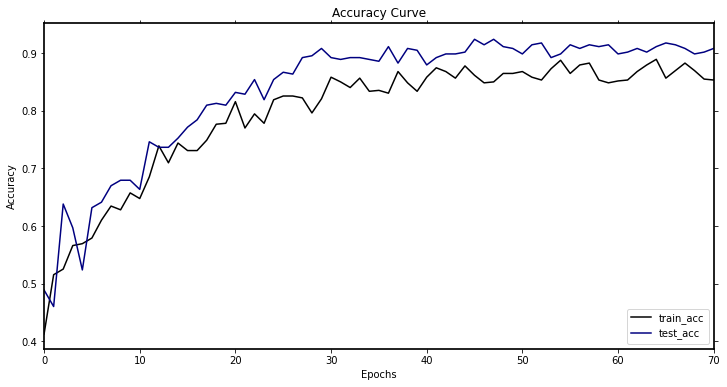

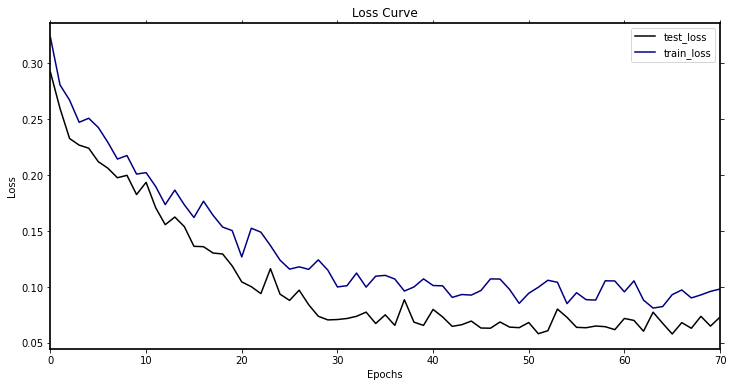

-----------第90轮训练开始-----------
训练次数：13860, 训练集正确率: 0.8809135399673735, Loss：57.64254194870591
第 90 轮测试集上的toal_Loss: 19.091266555245966, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.926984126984127
[[108.   4.   4.   6.]
 [  7.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [  5.   2.   0.  84.]]


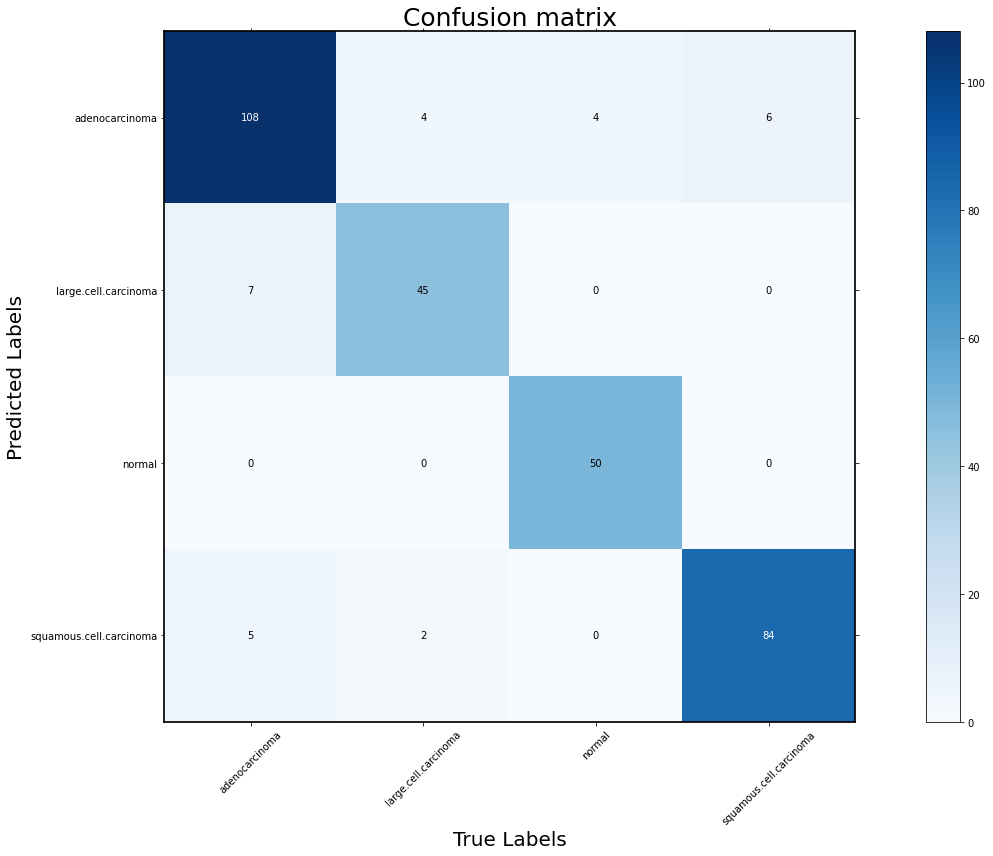

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.885   |  0.9   |    0.928    |  0.892   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.923   | 0.933  |    0.969    |  0.928   |
+-------------------------+-----------+--------+-------------+----------+


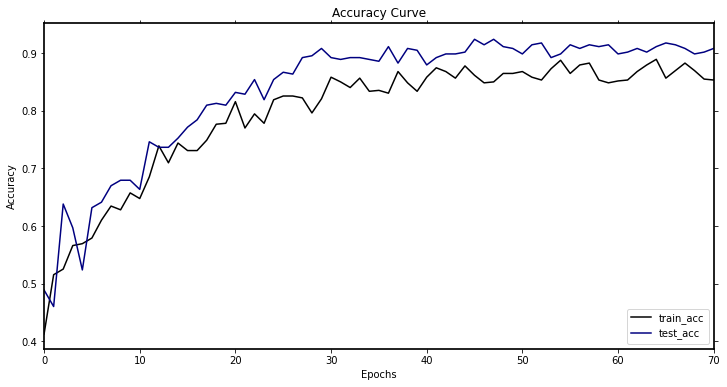

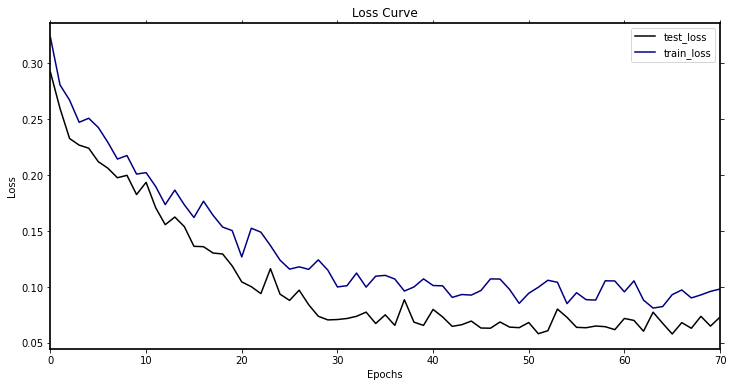

-----------第91轮训练开始-----------
训练次数：14014, 训练集正确率: 0.8711256117455138, Loss：58.47094629565254
第 91 轮测试集上的toal_Loss: 21.167187524959445, 正确率： 0.9079365079365079
Top-1准确率为:{} 0.926984126984127
[[111.   4.   4.  10.]
 [  7.  47.   0.   2.]
 [  0.   0.  50.   0.]
 [  2.   0.   0.  78.]]


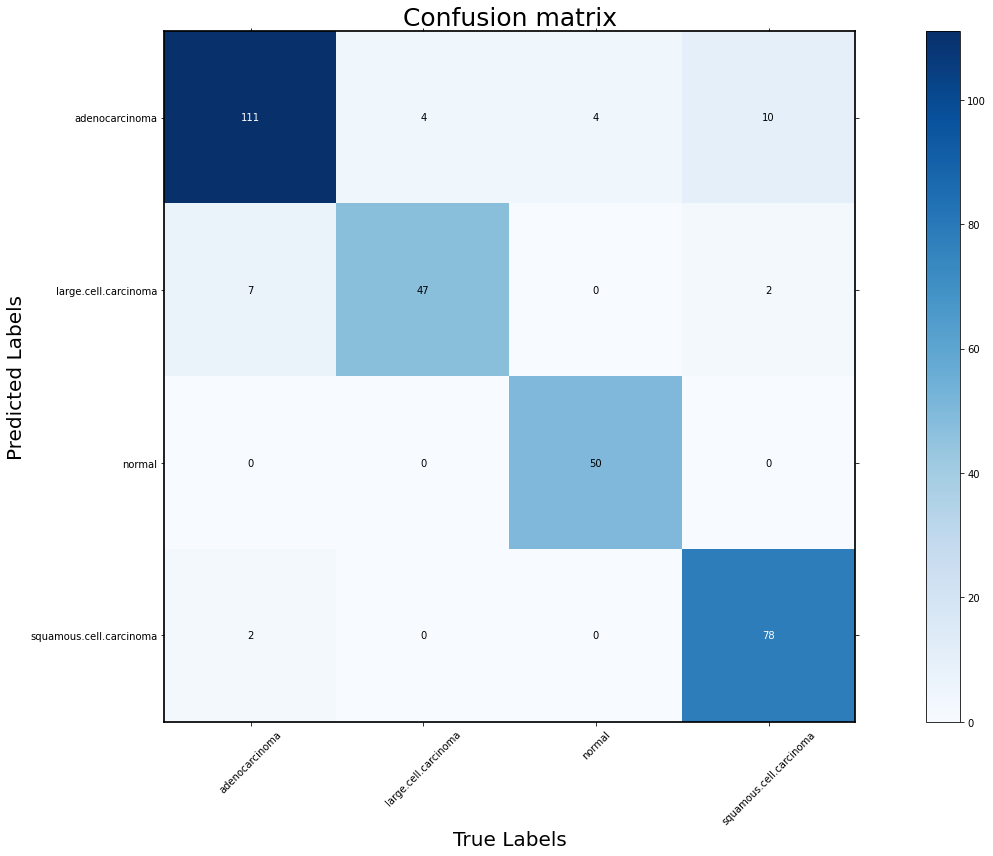

the model accuracy is  0.908
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.86   | 0.925  |    0.908    |  0.891   |
|   large.cell.carcinoma  |   0.839   | 0.922  |    0.966    |  0.879   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.975   | 0.867  |    0.991    |  0.918   |
+-------------------------+-----------+--------+-------------+----------+


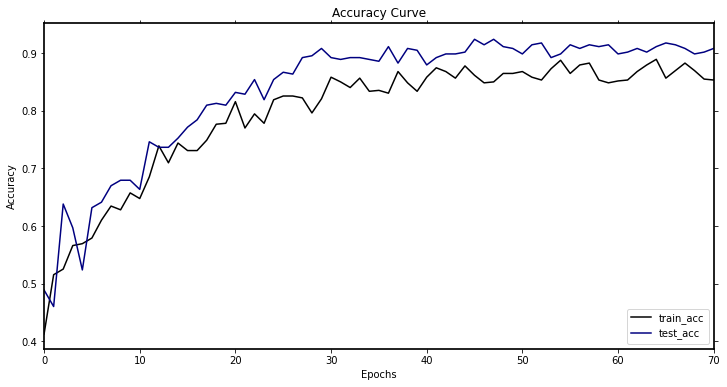

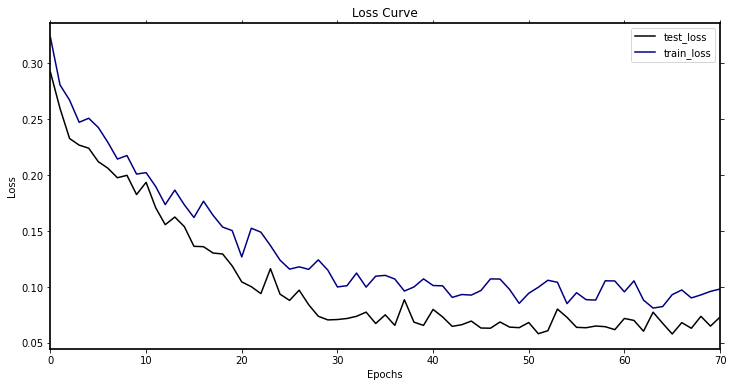

-----------第92轮训练开始-----------
训练次数：14168, 训练集正确率: 0.8499184339314845, Loss：57.07183207757771
第 92 轮测试集上的toal_Loss: 19.89060312649235, 正确率： 0.926984126984127
Top-1准确率为:{} 0.926984126984127
[[107.   6.   1.   3.]
 [  5.  45.   0.   0.]
 [  0.   0.  53.   0.]
 [  8.   0.   0.  87.]]


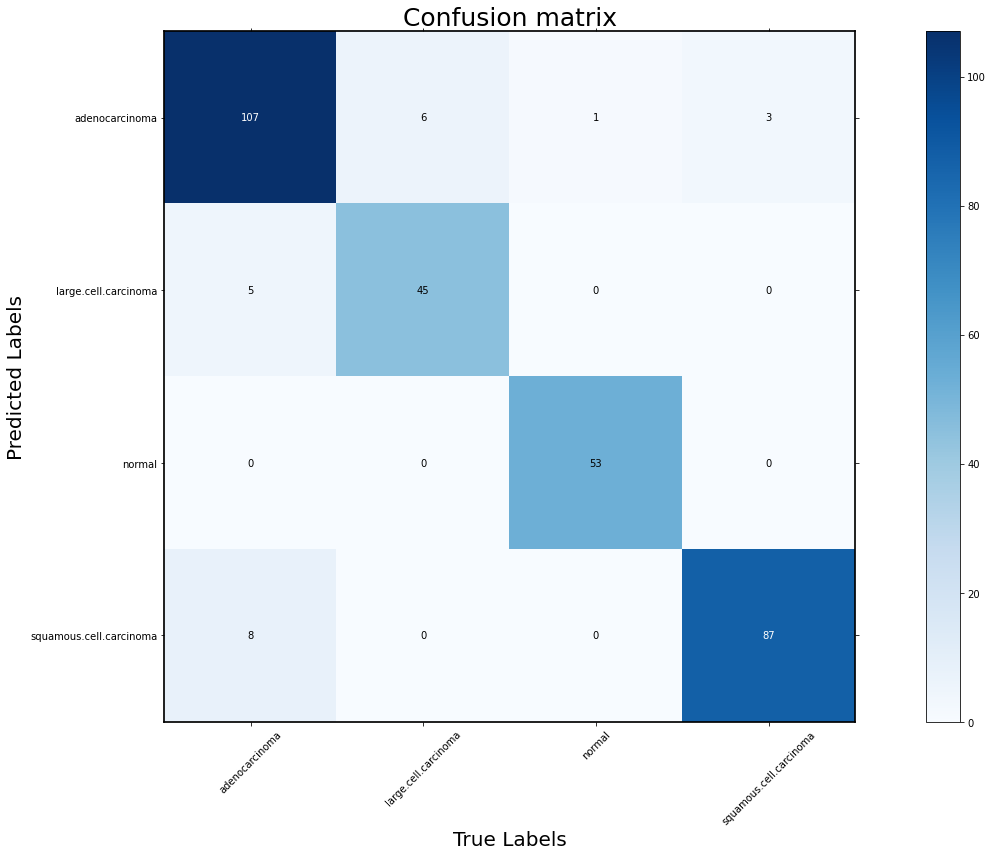

the model accuracy is  0.927
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.915   | 0.892  |    0.949    |  0.903   |
|   large.cell.carcinoma  |    0.9    | 0.882  |    0.981    |  0.891   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.916   | 0.967  |    0.964    |  0.941   |
+-------------------------+-----------+--------+-------------+----------+


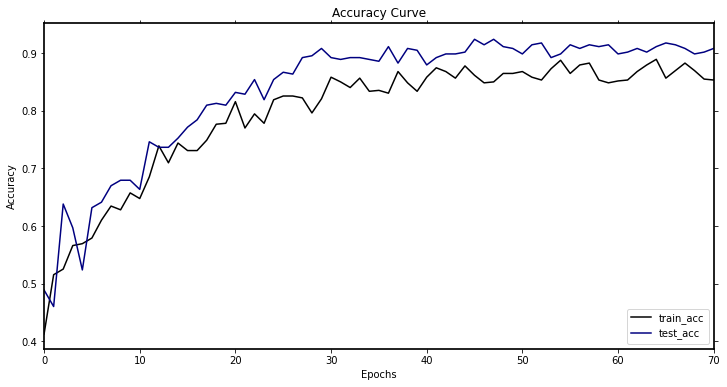

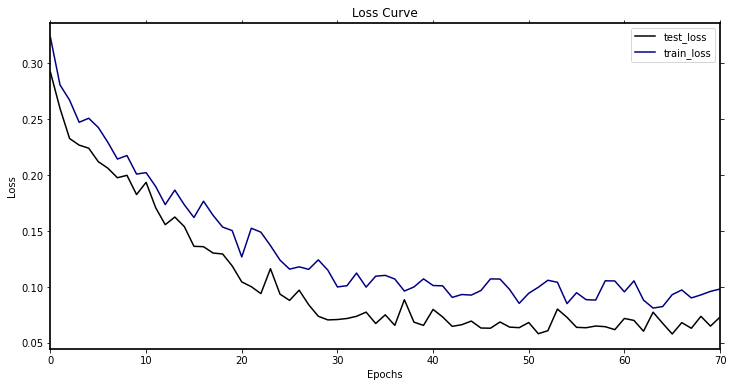

-----------第93轮训练开始-----------
训练次数：14322, 训练集正确率: 0.8776508972267537, Loss：51.882962472736835
第 93 轮测试集上的toal_Loss: 18.464125903788954, 正确率： 0.9174603174603174
Top-1准确率为:{} 0.926984126984127
[[110.   6.   2.   7.]
 [  5.  44.   0.   0.]
 [  0.   0.  52.   0.]
 [  5.   1.   0.  83.]]


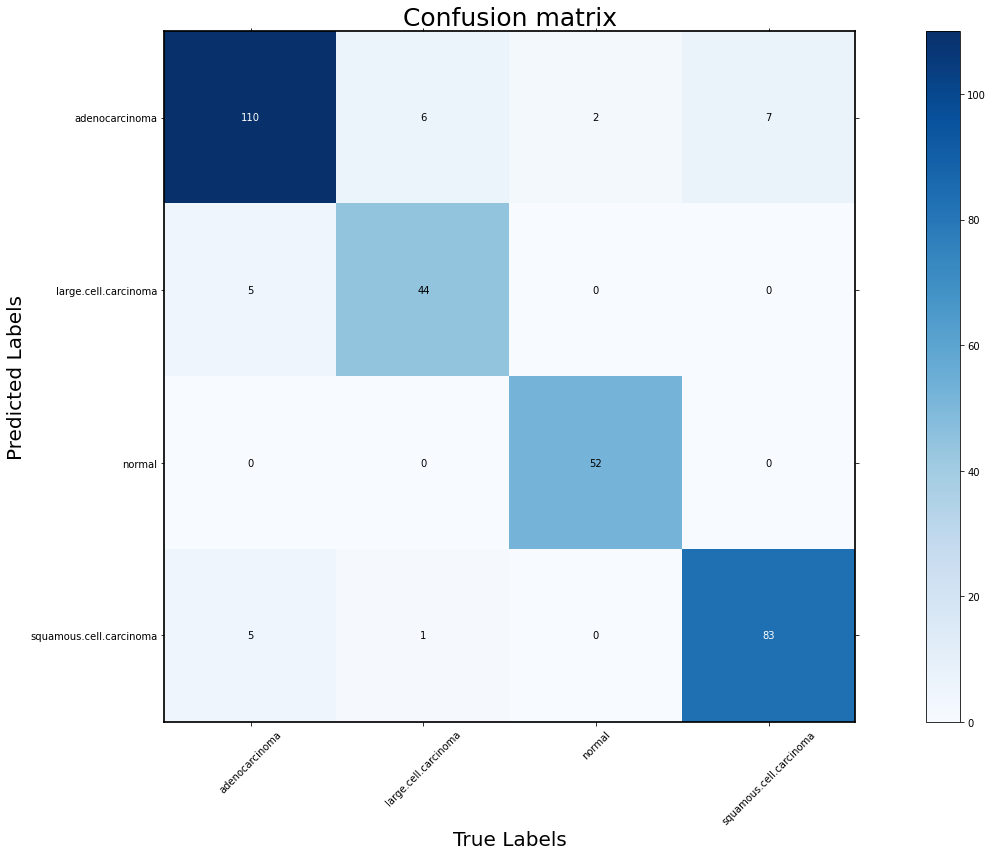

the model accuracy is  0.917
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.88   | 0.917  |    0.923    |  0.898   |
|   large.cell.carcinoma  |   0.898   | 0.863  |    0.981    |   0.88   |
|          normal         |    1.0    | 0.963  |     1.0     |  0.981   |
| squamous.cell.carcinoma |   0.933   | 0.922  |    0.973    |  0.927   |
+-------------------------+-----------+--------+-------------+----------+


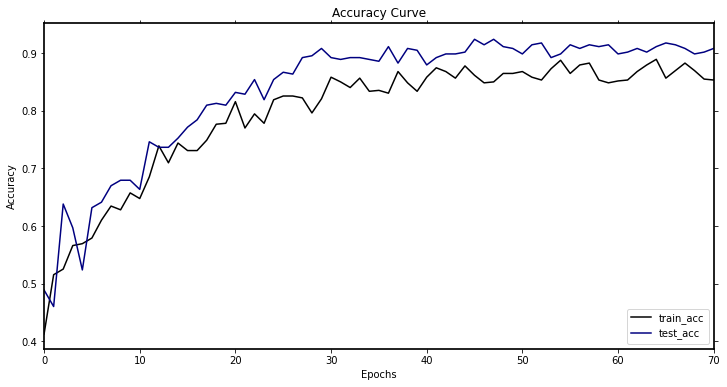

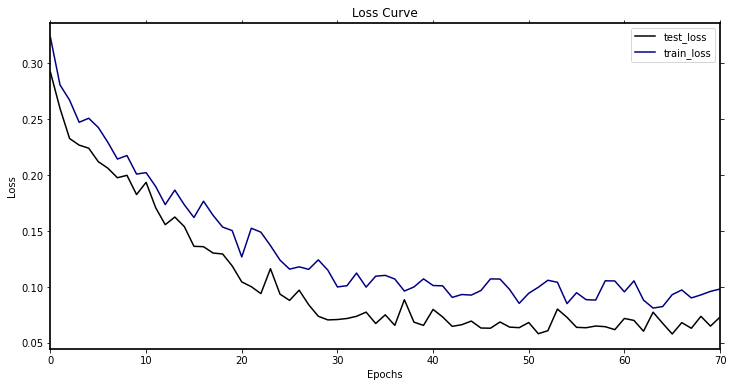

-----------第94轮训练开始-----------
训练次数：14476, 训练集正确率: 0.8743882544861338, Loss：49.700499311089516
第 94 轮测试集上的toal_Loss: 20.398007893469185, 正确率： 0.9206349206349206
Top-1准确率为:{} 0.926984126984127
[[108.   5.   4.   4.]
 [  7.  46.   0.   0.]
 [  0.   0.  50.   0.]
 [  5.   0.   0.  86.]]


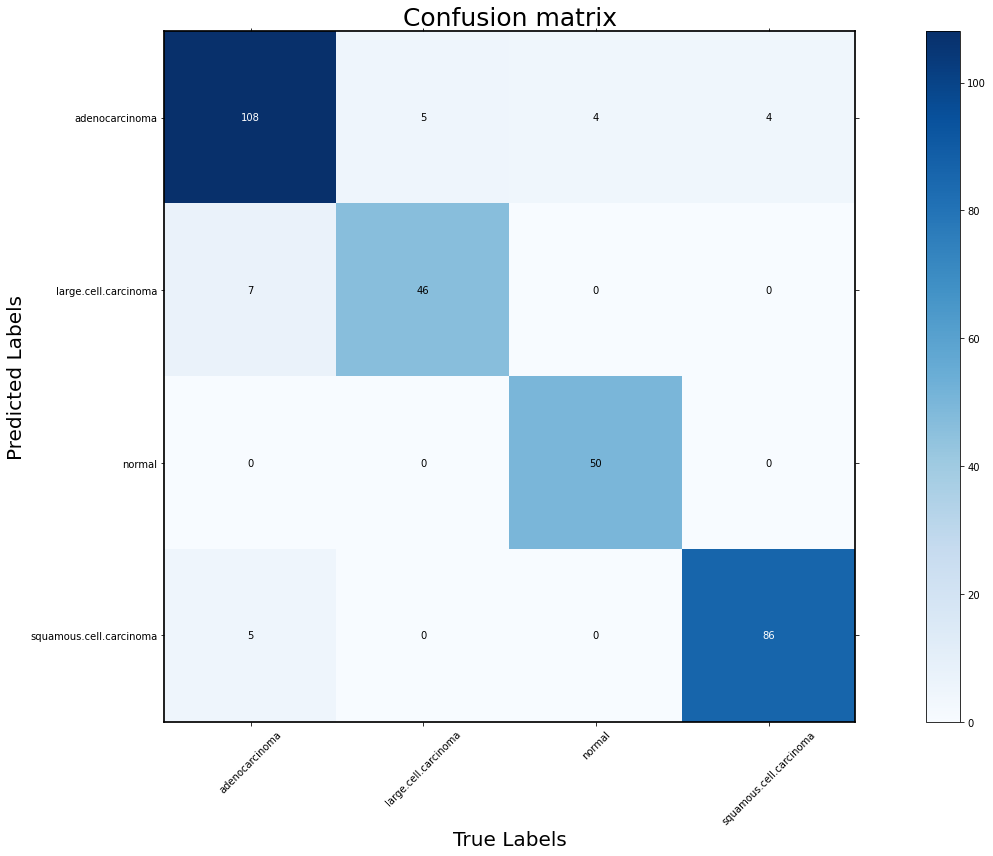

the model accuracy is  0.921
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.893   |  0.9   |    0.933    |  0.896   |
|   large.cell.carcinoma  |   0.868   | 0.902  |    0.973    |  0.885   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.945   | 0.956  |    0.978    |   0.95   |
+-------------------------+-----------+--------+-------------+----------+


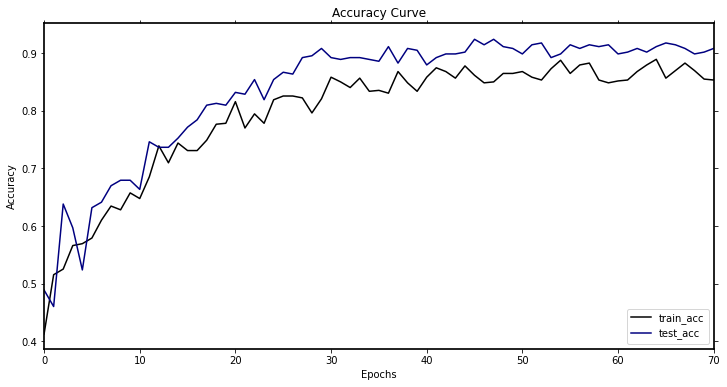

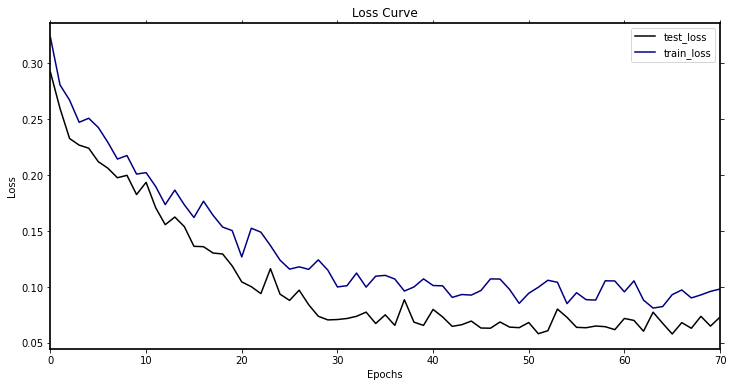

-----------第95轮训练开始-----------
训练次数：14630, 训练集正确率: 0.8711256117455138, Loss：58.724747428670526
第 95 轮测试集上的toal_Loss: 19.11315410071984, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.926984126984127
[[111.   7.   4.   7.]
 [  6.  44.   0.   0.]
 [  0.   0.  50.   0.]
 [  3.   0.   0.  83.]]


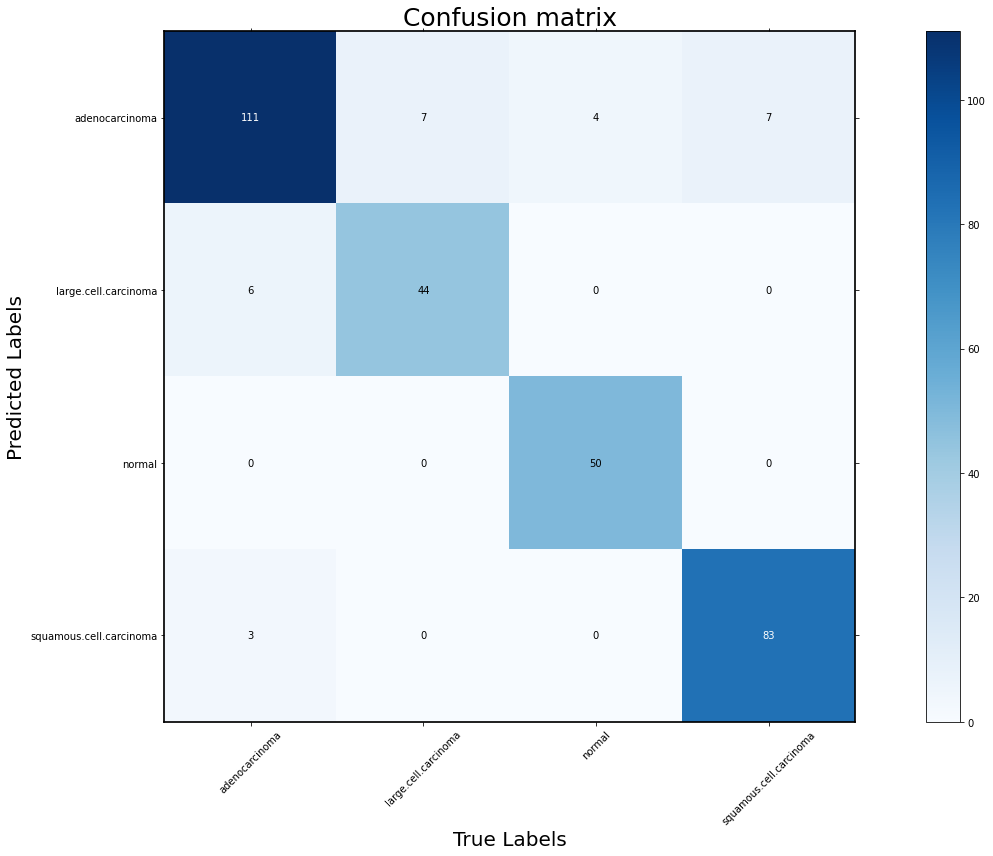

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |    0.86   | 0.925  |    0.908    |  0.891   |
|   large.cell.carcinoma  |    0.88   | 0.863  |    0.977    |  0.871   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.965   | 0.922  |    0.987    |  0.943   |
+-------------------------+-----------+--------+-------------+----------+


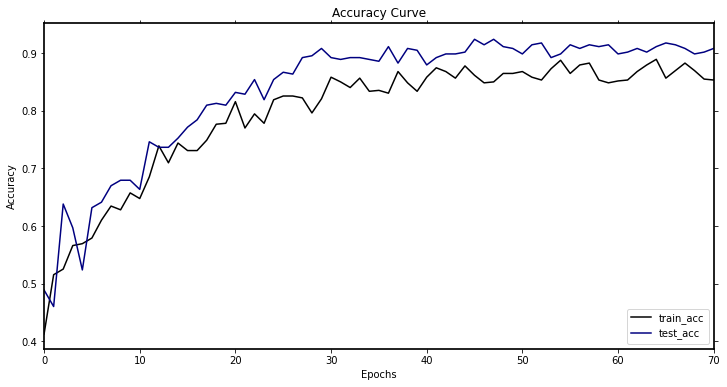

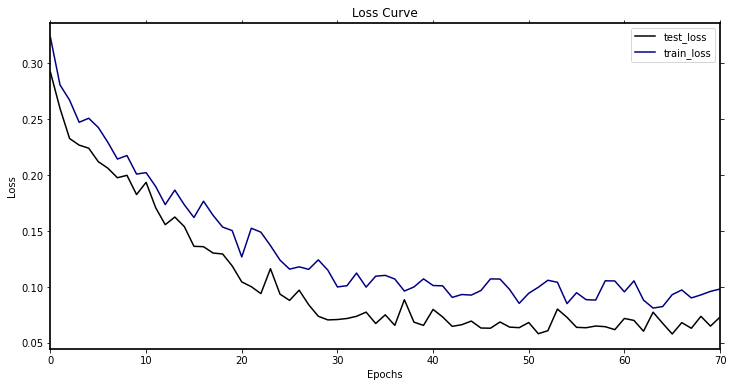

-----------第96轮训练开始-----------
训练次数：14784, 训练集正确率: 0.8646003262642741, Loss：63.53855502605438
第 96 轮测试集上的toal_Loss: 21.291471406817436, 正确率： 0.8984126984126984
Top-1准确率为:{} 0.926984126984127
[[100.   6.   4.   2.]
 [  6.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [ 14.   0.   0.  88.]]


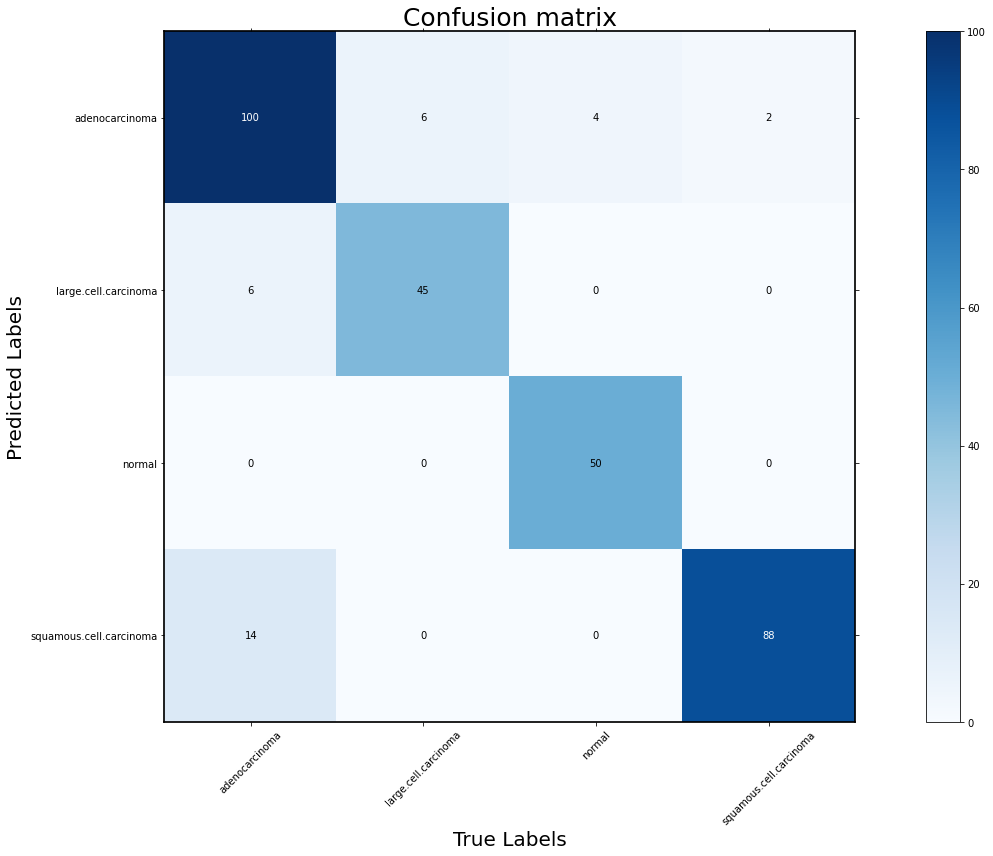

the model accuracy is  0.898
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.893   | 0.833  |    0.938    |  0.862   |
|   large.cell.carcinoma  |   0.882   | 0.882  |    0.977    |  0.882   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.863   | 0.978  |    0.938    |  0.917   |
+-------------------------+-----------+--------+-------------+----------+


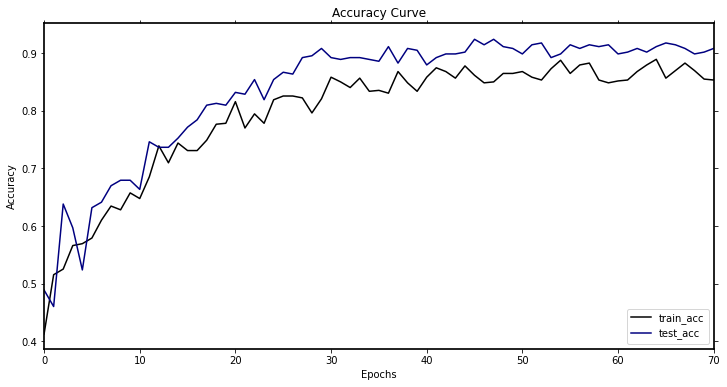

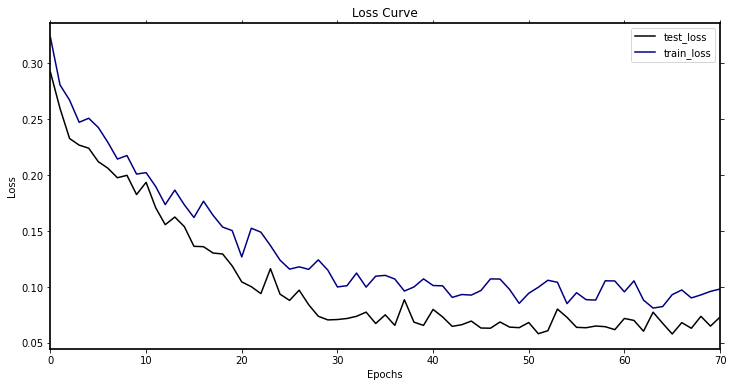

-----------第97轮训练开始-----------
训练次数：14938, 训练集正确率: 0.8531810766721044, Loss：67.52596245892346
第 97 轮测试集上的toal_Loss: 19.731571540702134, 正确率： 0.9142857142857143
Top-1准确率为:{} 0.926984126984127
[[103.   4.   3.   3.]
 [  6.  47.   0.   0.]
 [  0.   0.  51.   0.]
 [ 11.   0.   0.  87.]]


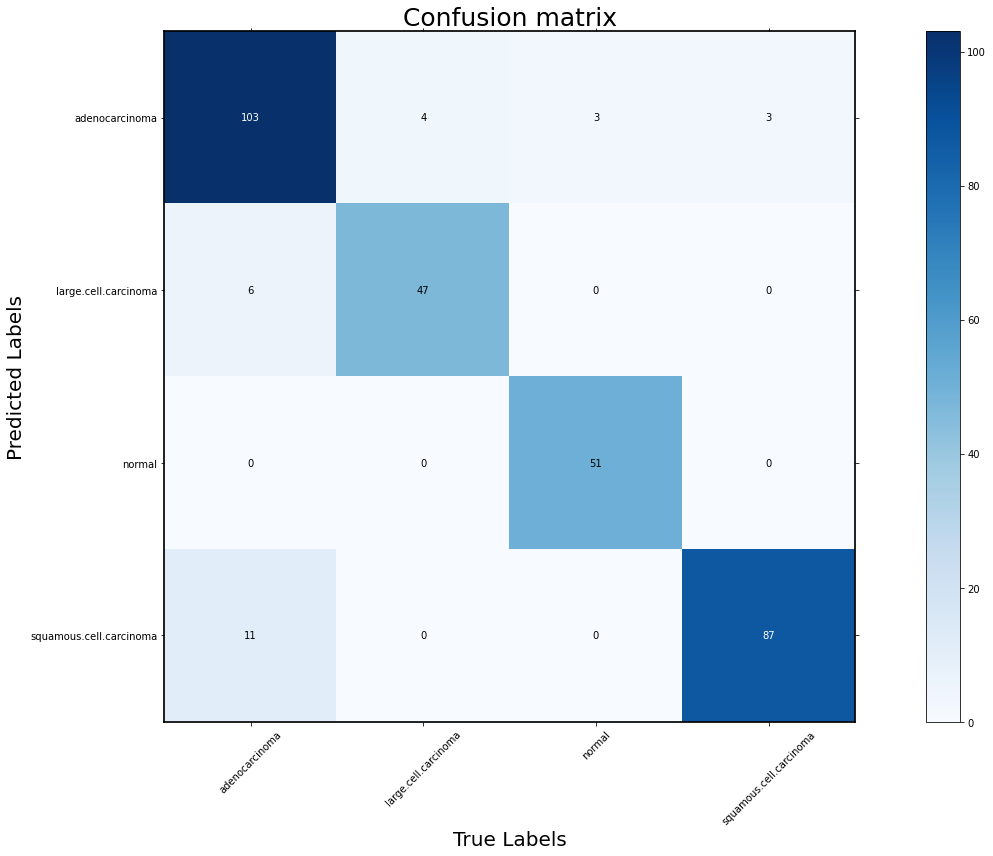

the model accuracy is  0.914
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.912   | 0.858  |    0.949    |  0.884   |
|   large.cell.carcinoma  |   0.887   | 0.922  |    0.977    |  0.904   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.888   | 0.967  |    0.951    |  0.926   |
+-------------------------+-----------+--------+-------------+----------+


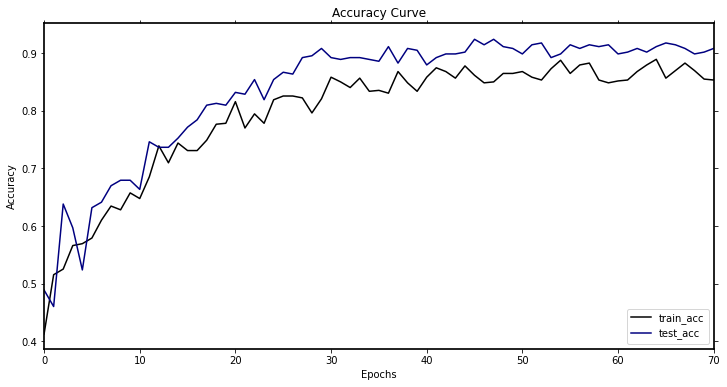

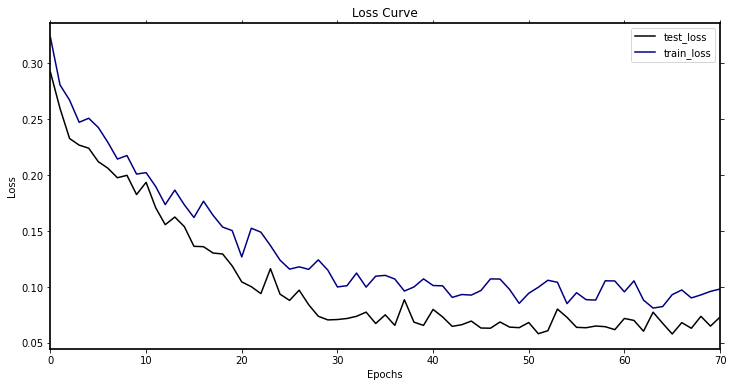

-----------第98轮训练开始-----------
训练次数：15092, 训练集正确率: 0.8809135399673735, Loss：52.09746391978115
第 98 轮测试集上的toal_Loss: 19.647732459241524, 正确率： 0.9111111111111111
Top-1准确率为:{} 0.926984126984127
[[112.   6.   4.  10.]
 [  7.  45.   0.   0.]
 [  0.   0.  50.   0.]
 [  1.   0.   0.  80.]]


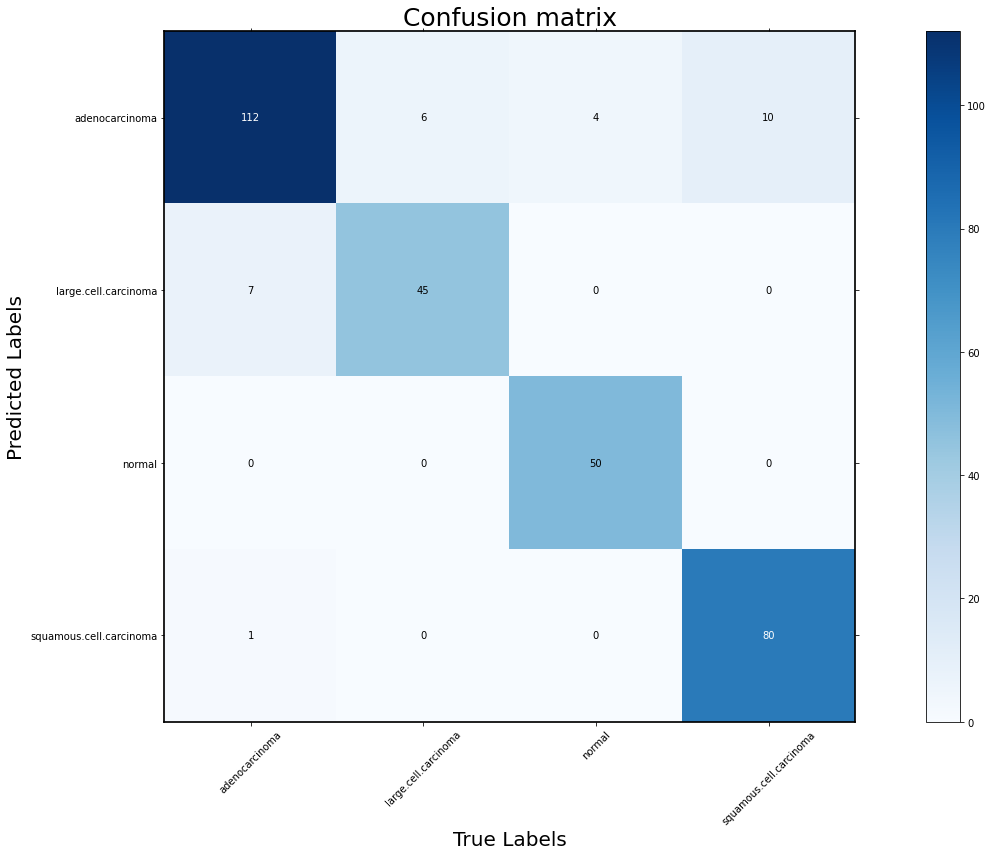

the model accuracy is  0.911
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.848   | 0.933  |    0.897    |  0.888   |
|   large.cell.carcinoma  |   0.865   | 0.882  |    0.973    |  0.873   |
|          normal         |    1.0    | 0.926  |     1.0     |  0.962   |
| squamous.cell.carcinoma |   0.988   | 0.889  |    0.996    |  0.936   |
+-------------------------+-----------+--------+-------------+----------+


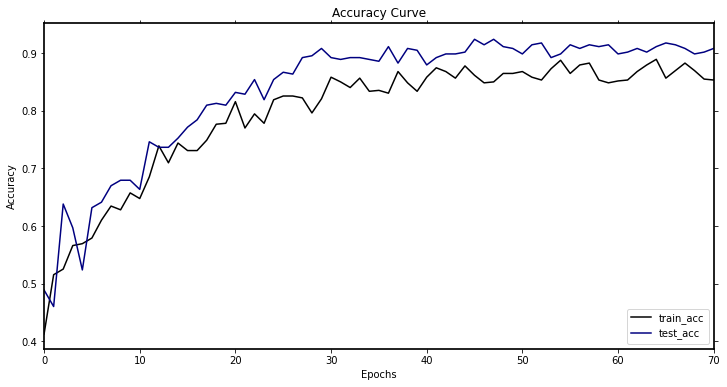

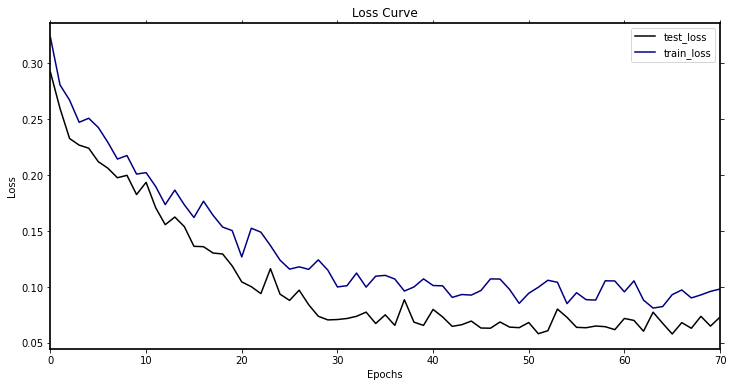

-----------第99轮训练开始-----------
训练次数：15246, 训练集正确率: 0.867862969004894, Loss：52.869245475158095
第 99 轮测试集上的toal_Loss: 17.741132299415767, 正确率： 0.926984126984127
Top-1准确率为:{} 0.926984126984127
[[111.   4.   1.   8.]
 [  7.  47.   0.   1.]
 [  0.   0.  53.   0.]
 [  2.   0.   0.  81.]]


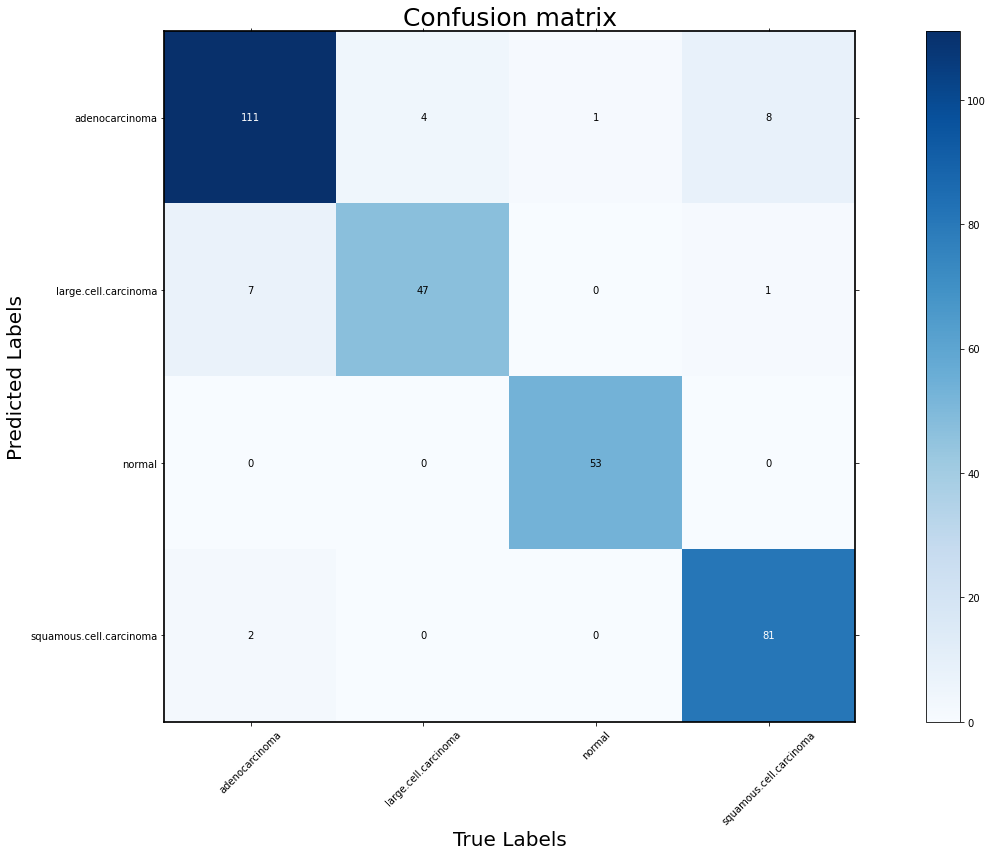

the model accuracy is  0.927
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.895   | 0.925  |    0.933    |   0.91   |
|   large.cell.carcinoma  |   0.855   | 0.922  |     0.97    |  0.887   |
|          normal         |    1.0    | 0.981  |     1.0     |   0.99   |
| squamous.cell.carcinoma |   0.976   |  0.9   |    0.991    |  0.936   |
+-------------------------+-----------+--------+-------------+----------+


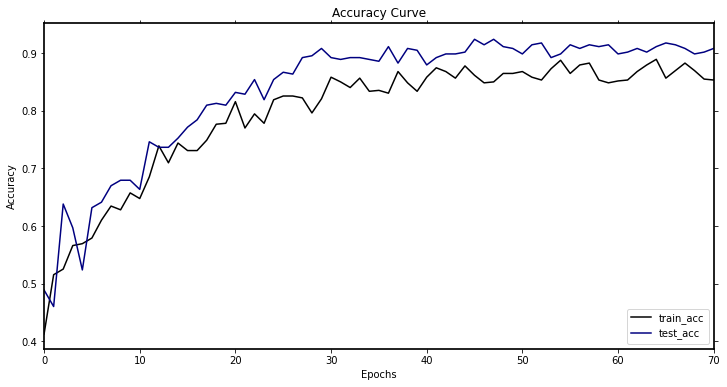

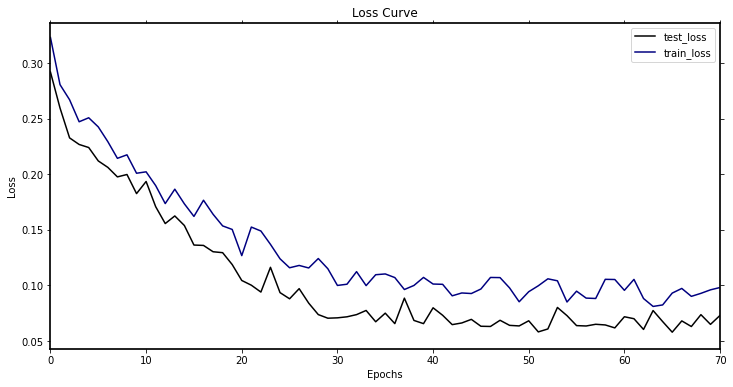

-----------第100轮训练开始-----------
训练次数：15400, 训练集正确率: 0.8743882544861338, Loss：56.35117147304118
第 100 轮测试集上的toal_Loss: 19.428565634414554, 正确率： 0.9238095238095239
Top-1准确率为:{} 0.926984126984127
[[105.   2.   3.   4.]
 [  8.  49.   0.   0.]
 [  0.   0.  51.   0.]
 [  7.   0.   0.  86.]]


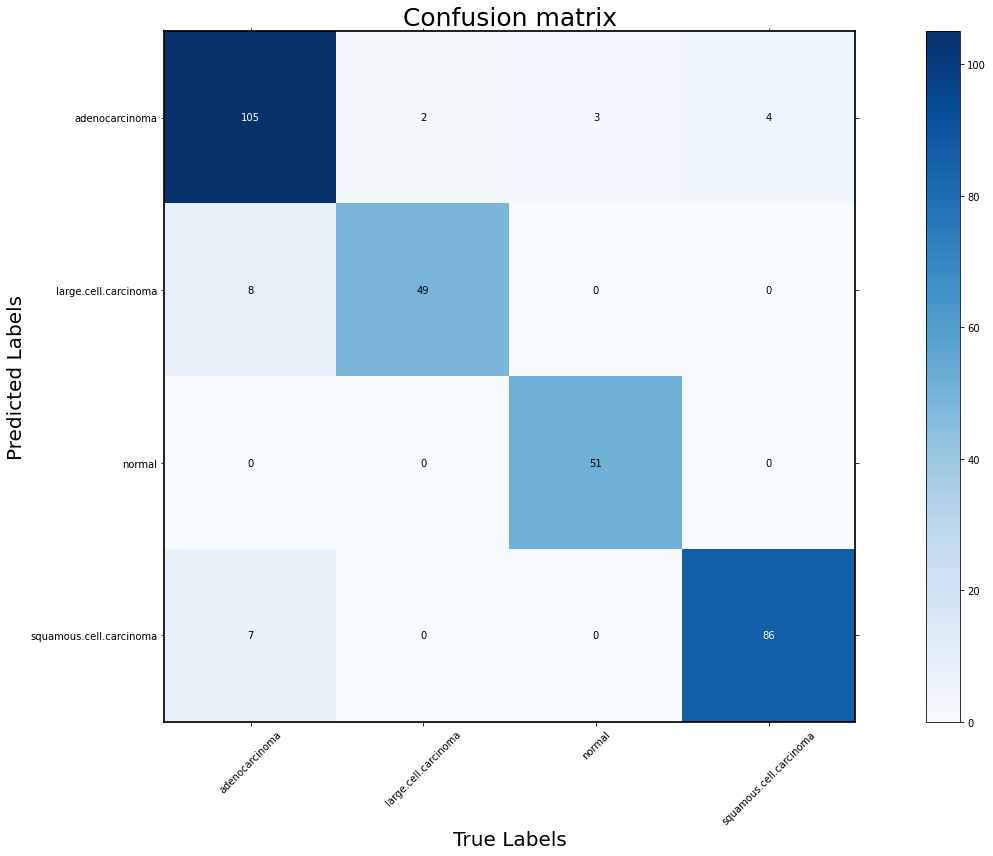

the model accuracy is  0.924
+-------------------------+-----------+--------+-------------+----------+
|                         | Precision | Recall | Specificity | F1_score |
+-------------------------+-----------+--------+-------------+----------+
|      adenocarcinoma     |   0.921   | 0.875  |    0.954    |  0.897   |
|   large.cell.carcinoma  |    0.86   | 0.961  |     0.97    |  0.908   |
|          normal         |    1.0    | 0.944  |     1.0     |  0.971   |
| squamous.cell.carcinoma |   0.925   | 0.956  |    0.969    |   0.94   |
+-------------------------+-----------+--------+-------------+----------+


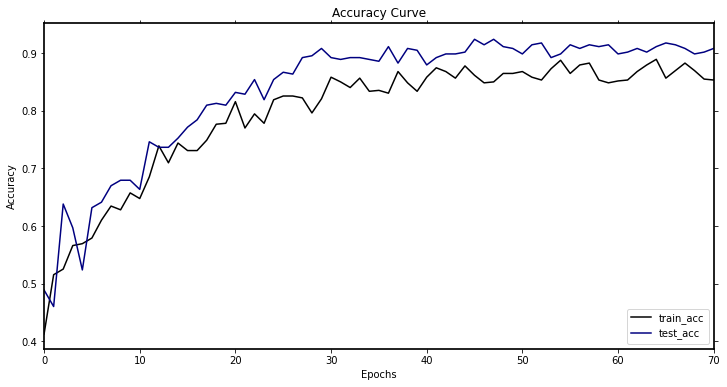

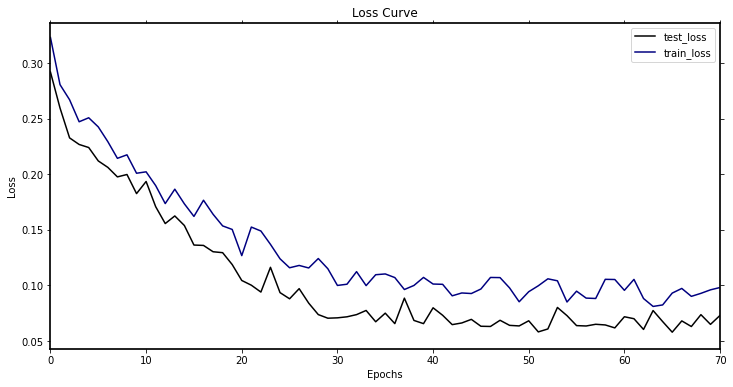

In [5]:
#神经网络
#VGG19
#net = torchvision.models.vgg16(pretrained=True)  # True  加载原始预训练权重
#net.classifier[6] = nn.Linear(4096, 4)
# net.load_state_dict(torch.load("vgg19.pth"))   # 导入训练权重
net= torchvision.models.resnet50(pretrained=True)    # resnet50模型
net.fc=nn.Linear(2048,4)
net.to(device)
print(net)

# 损失函数
loss_fn =nn.CrossEntropyLoss()   # 损失函数
loss_fn.to(device)


#优化器
learn_rate = 1e-3   #  学习率
optimizer = torch.optim.SGD(net.parameters(), lr=learn_rate)   # 优化器
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)   # 学习率优化策略

#记录训练的次数
total_train_step = 0
#记录测试的次数
total_test_step = 0
#训练的轮次 
epoch = 100 
train_loss=[]
train_acc=[]
test_loss=[]
test_acc=[]


class_indict = {'0' : 'adenocarcinoma', '1' : 'large.cell.carcinoma', '2' : 'normal', '3' : 'squamous.cell.carcinoma'}
label = [label for _, label in class_indict.items()]


final_accuracy = 0

for i in range(epoch):
    print("-----------第{}轮训练开始-----------".format(i + 1))
    
    confusion = ConfusionMatrix(num_classes= 4, labels=label)
    # 训练开始
    total_train_loss = 0
    total_train_accuracy = 0
    net.train()
    for data,target in train_dataloader:
        
        # imgs, targets, no_imgs= data
        data=data.to(device)
        # imgs = imgs.to(device)
        target = target.to(device)



        output = net(data)
        loss = loss_fn(output, target)

        total_train_loss += loss.item()
        accuracy = (output.argmax(1) == target).sum()
        total_train_accuracy += accuracy.item()
        #优化器优化
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_train_step += 1

    train_loss.append(total_train_loss/train_data_size)
    train_acc.append(total_train_accuracy/train_data_size)
    print("训练次数：{}, 训练集正确率: {}, Loss：{}".format(total_train_step, total_train_accuracy/train_data_size, total_train_loss))
    
    #测试开始
    net.eval()
    total_test_loss = 0
    total_accuracy = 0
    final_accuracy = 0
    num_class = 4
    score_list = []     # 存储预测得分
    label_list = []     # 存储真实标签
    incorrectly_classified = []     
    step = 1
    log_step = 1
    with torch.no_grad():
        for data,target in test_dataloader:
            # imgs, targets, output_img = data
            data = data.to(device)
            target = target.to(device)
            output = net(data)


            score_tmp = output
            loss = loss_fn(output, target)
            total_test_loss += loss.item()
            accuracy = (output.argmax(1) == target).sum()

            total_accuracy += accuracy

            predictions = output.argmax(1)
            confusion.update(predictions.cpu().numpy(), target.cpu().numpy())
            #绘制ROC
            score_list.extend(score_tmp.detach().cpu().numpy())
            
            label_list.extend(target.cpu().numpy())
        loss1=total_test_loss/test_data_size
        test_loss.append(loss1)
        acc=total_accuracy.item()/test_data_size
        test_acc.append(acc)
        print("第 {} 轮测试集上的toal_Loss: {}, 正确率： {}".format(i+1, total_test_loss, total_accuracy.item()/test_data_size))
        print("Top-1准确率为:{}",max(test_acc))     # 输出测试集准确率中的最大值
        step += 1
        if total_accuracy > final_accuracy:
            final_accuracy = total_accuracy
        confusion.plot()
        confusion.summary()
    # 重置学习率调度器
    scheduler.step()
    


# 绘制accuracy曲线
    plt.figure(figsize=(12, 6))
    # plt.figure(figsize=(20, 12)) #设置画布的大小和dpi，为了使图片更加清晰
    plt.plot(train_acc, label='train_acc',color='black')
    plt.plot(test_acc, label='test_acc',color='navy')
    ax = plt.gca()
    ax.tick_params(right=True,top=True)
    ax.spines['bottom'].set_linewidth(1.7)
    ax.spines['left'].set_linewidth(1.7)
    ax.spines['right'].set_linewidth(1.7)
    ax.spines['top'].set_linewidth(1.7)
    plt.legend(loc="lower right")
    plt.title('Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    # plt.ylim([0.0, 1.00])
    plt.xlim([0.0, 70.0])
    plt.savefig("11.jpg")
    plt.show()


    # 绘制loss曲线
    plt.figure(figsize=(12, 6))
    # plt.figure(figsize=(20, 12)) #设置画布的大小和dpi，为了使图片更加清晰
    plt.plot(test_loss, label='test_loss',color='black')
    plt.plot(train_loss, label='train_loss',color='navy')
    ax = plt.gca()
    ax.tick_params(right=True,top=True)
    ax.spines['bottom'].set_linewidth(1.7)
    ax.spines['left'].set_linewidth(1.7)
    ax.spines['right'].set_linewidth(1.7)
    ax.spines['top'].set_linewidth(1.7)
    plt.legend(loc="upper right")
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    # plt.ylim([0.0, 0.15])
    plt.xlim([0.0, 70.0])
    plt.savefig("22.jpg")
    plt.show()

